In [33]:
import pandas as pd
from datetime import datetime, timedelta
import numpy
from gurobipy import *


In [34]:
import numpy as np
import pandas as pd

In [35]:
lower_data = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_lower")
upper_data = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_upper")

In [36]:
age_groups = ['age_group_0_9', 'age_group_10_19', 'age_group_20_29','age_group_30_39', 'age_group_40_49', 'age_group_50_59', 'age_group_60_69', 'age_group_70_79', 'age_group_80_plus']
old_age_groups = ['age_group_50_59', 'age_group_60_69', 'age_group_70_79', 'age_group_80_plus']
econ_activities = ['transport', 'leisure', 'other']
cont = [ 'S', 'E', 'I', 'R', 'N', 'Ia', 'Ips', \
           'Ims', 'Iss', 'Rq', 'H', 'ICU', 'D' ]

In [37]:
data = pd.read_csv("donnees-hospitalieres-classe-age-covid19-2020-10-28-19h00.csv", sep=";")
data.head()

,reg,cl_age90,jour,hosp,rea,rad,dc
0,1,0,2020-03-18,0,0,0,0
1,1,9,2020-03-18,0,0,0,0
2,1,19,2020-03-18,0,0,0,0
3,1,29,2020-03-18,0,0,0,0
4,1,39,2020-03-18,0,0,0,0


In [38]:
google = pd.read_csv("2020_FR_Region_Mobility_Report.csv")
google = google[google['sub_region_1']=="Île-de-France"]
google = google[pd.isnull(google['sub_region_2'])]

In [39]:
initial_work = ((google["workplaces_percent_change_from_baseline"]+100)/100).values
google_days = [datetime.strptime(google["date"].values[i], '%Y-%m-%d').weekday() for i in range(len(google["date"]))]
new_work = []
for i in range(len(initial_work)):
    if google_days[i]<=4:
        new_work.append(initial_work[i])
    elif google_days[i]==5:
        numbers_for_mean = []
        for k in range(i-5,i):
            if k>=0 and k<len(initial_work):
                numbers_for_mean.append(initial_work[k])
        for k in range(i+2,i+7):
            if k>=0 and k<len(initial_work):
                numbers_for_mean.append(initial_work[k])
        new_work.append(np.mean(numbers_for_mean))
    elif google_days[i]==6:
        numbers_for_mean = []
        for k in range(i-6,i-1):
            if k>=0 and k<len(initial_work):
                numbers_for_mean.append(initial_work[k])
        for k in range(i+1,i+6):
            if k>=0 and k<len(initial_work):
                numbers_for_mean.append(initial_work[k])
        new_work.append(np.mean(numbers_for_mean))


In [40]:
google['work'] = new_work
google['transport'] = (google["transit_stations_percent_change_from_baseline"]+100)/100
google['other'] = 0.33*(google["retail_and_recreation_percent_change_from_baseline"]+100)/100+0.67*(google["grocery_and_pharmacy_percent_change_from_baseline"]+100)/100
google['leisure'] = 0.33*(google["parks_percent_change_from_baseline"]+100)/100+0.67*(google["retail_and_recreation_percent_change_from_baseline"]+100)/100
google = google.reset_index()
google.to_csv('smoothed.csv')



In [41]:
google

,index,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,work,transport,other,leisure
0,13858,FR,France,Île-de-France,NaN,NaN,FR-IDF,NaN,2020-02-15,-12.0,-10.0,5.0,4.0,-8.0,-1.0,0.82,1.04,0.8934,0.9361
1,13859,FR,France,Île-de-France,NaN,NaN,FR-IDF,NaN,2020-02-16,-6.0,-6.0,-8.0,4.0,-1.0,-2.0,0.82,1.04,0.9400,0.9334
2,13860,FR,France,Île-de-France,NaN,NaN,FR-IDF,NaN,2020-02-17,-2.0,-3.0,11.0,-11.0,-20.0,4.0,0.80,0.89,0.9733,1.0229
3,13861,FR,France,Île-de-France,NaN,NaN,FR-IDF,NaN,2020-02-18,-1.0,-2.0,15.0,-8.0,-18.0,3.0,0.82,0.92,0.9833,1.0428
4,13862,FR,France,Île-de-France,NaN,NaN,FR-IDF,NaN,2020-02-19,-7.0,-9.0,-5.0,-10.0,-15.0,2.0,0.85,0.90,0.9166,0.9366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,14105,FR,France,Île-de-France,NaN,NaN,FR-IDF,NaN,2020-10-19,-28.0,-7.0,-13.0,-29.0,-39.0,11.0,0.61,0.71,0.8607,0.7695
248,14106,FR,France,Île-de-France,NaN,NaN,FR-IDF,NaN,2020-10-20,-33.0,-11.0,-41.0,-30.0,-39.0,12.0,0.61,0.70,0.8174,0.6436
249,14107,FR,France,Île-de-France,NaN,NaN,FR-IDF,NaN,2020-10-21,-32.0,-9.0,-21.0,-29.0,-36.0,10.0,0.64,0.71,0.8341,0.7163
250,14108,FR,France,Île-de-France,NaN,NaN,FR-IDF,NaN,2020-10-22,-29.0,-9.0,-15.0,-28.0,-39.0,11.0,0.61,0.72,0.8440,0.7562


In [42]:
# Extract days 
data = data[data['jour']<='2020-10-21']
days = data[data['reg']==11][data['cl_age90']==0].jour.values

/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [11]:
data

,reg,cl_age90,jour,hosp,rea,rad,dc
0,1,0,2020-03-18,0,0,0,0
1,1,9,2020-03-18,0,0,0,0
2,1,19,2020-03-18,0,0,0,0
3,1,29,2020-03-18,0,0,0,0
4,1,39,2020-03-18,0,0,0,0
...,...,...,...,...,...,...,...
42961,94,59,2020-10-21,7,0,48,2
42962,94,69,2020-10-21,8,3,52,4
42963,94,79,2020-10-21,13,5,77,17
42964,94,89,2020-10-21,11,0,47,31


In [12]:
beds_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].hosp.values for i in range(0,9)
}
beds_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].hosp.values
beds_real['total']=data[data['reg']==11][data['cl_age90']==0].hosp.values

icus_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].rea.values for i in range(0,9)
}
icus_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].rea.values
icus_real['total']=data[data['reg']==11][data['cl_age90']==0].rea.values

deaths_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].dc.values for i in range(0,9)
}
deaths_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].dc.values
deaths_real['total']=data[data['reg']==11][data['cl_age90']==0].dc.values


/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/sergioacamelogomez/opt/anaconda3/lib/pyth

In [13]:
import yaml
from inspect import getsourcefile
import os.path
import sys
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import argparse
current_path = os.path.abspath(getsourcefile(lambda:0))
current_dir = os.path.dirname(current_path)
parentdir = os.path.dirname(current_dir)
sys.path.insert(0,parentdir) 
sys.path.insert(0, parentdir+"/heuristics")
sys.path.insert(0, parentdir+"/heuristics/LP-Models")
sys.path.insert(0, parentdir+"/fast_gradient")


from fast_group import FastDynamicalModel
from aux import *

%matplotlib inline

{'groups': 'all', 'params_to_try': {'delta_schooling': [0.5, 1, 5], 'xi': [0, 371990.3, 929975.75, 1859951.5, 3719903, 5579854.5], 'icus': [2000, 2300, 2600, 2900, 3200], 'tests': [[0, 0], [30000, 30000], [60000, 60000], [120000, 120000]], 'testing': ['homogeneous'], 'eta': [0, 0.1, 0.2]}}
{'groups': 'all', 'params_to_try': {'delta_schooling': [0.5, 1, 5], 'xi': [0, 371990.3, 929975.75, 1859951.5, 3719903, 5579854.5], 'icus': [2000, 2300, 2600, 2900, 3200], 'tests': [[0, 0], [30000, 30000], [60000, 60000], [120000, 120000]], 'testing': ['homogeneous'], 'eta': [0, 0.1, 0.2]}}


In [14]:
start_smooth = datetime.strptime("2020-09-01", '%Y-%m-%d')
end_smooth = datetime.strptime("2020-10-01", '%Y-%m-%d')
for ag in beds_real:
    new_series = []
    for i in range(len(beds_real[ag])):
        day = datetime.strptime(days[i], '%Y-%m-%d')
        lower = (day-start_smooth).days
        upper = (end_smooth-day).days
        if lower>=0 and upper>=0:
            n_days_before = min(lower,3)
            n_days_after = min(upper,3)
            avg_value = np.mean(beds_real[ag][(i-n_days_before):(i+1+n_days_after)])
            new_series.append(avg_value)
        else:
            new_series.append(beds_real[ag][i])
    beds_real[ag] = np.array(new_series)
        


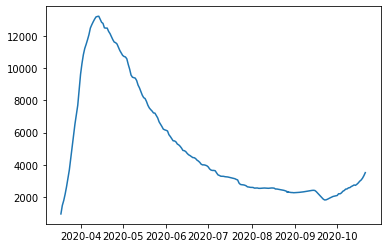

In [15]:

plt.figure(1)
plt.plot([datetime.strptime(d, '%Y-%m-%d') for d in days],beds_real["total"])


In [16]:
mult_deaths = np.sum(data[data['reg']==11][data['cl_age90']==0].hosp.values)/np.sum(data[data['reg']==11][data['cl_age90']==0].dc.values)
print(mult_deaths)
mult_icus = np.sum(data[data['reg']==11][data['cl_age90']==0].hosp.values)/np.sum(data[data['reg']==11][data['cl_age90']==0].rea.values)
print(mult_icus)


0.7791072263244828
7.194862933913178


/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [17]:
region = "Ile-de-France"

In [18]:
# Read group parameters
with open("../parameters/"+region+".yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    universe_params = yaml.load(file, Loader=yaml.FullLoader)
    
# Read initialization
with open("../initialization/patient_zero.yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    original_initialization = yaml.load(file, Loader=yaml.FullLoader)

# Read econ parameters
with open("../parameters/econ.yaml") as file:
    econ_params = yaml.load(file, Loader=yaml.FullLoader)

experiment_params = {
    'delta_schooling':0.5,
    'xi':0,
    'icus':4000,
}

In [19]:
date_1 = datetime.strptime("2020-03-17", '%Y-%m-%d')
date_2 = datetime.strptime("2020-05-11", '%Y-%m-%d')
date_3 = datetime.strptime("2020-06-01", '%Y-%m-%d')
date_4 = datetime.strptime("2020-07-01", '%Y-%m-%d')
date_5 = datetime.strptime("2020-09-01", '%Y-%m-%d')
final_date = datetime.strptime("2020-10-21", '%Y-%m-%d')

vacation_start = date_4
vacation_end = date_5
days_vacation_start = (vacation_start - date_1).days
days_vacation_end = (vacation_end - date_1).days

first_day_google = datetime.strptime("2020-02-15", '%Y-%m-%d')
days_between_google = (date_1-first_day_google).days

In [20]:
(final_date-date_1).days+140

358

In [21]:
from copy import deepcopy

In [22]:
original_beta = universe_params['seir-groups']["age_group_0_9"]["parameters"]["beta"]
original_beta_vacation = original_beta
#original_beta_vacation = universe_params['seir-groups']["age_group_0_9"]["parameters"]["beta_vacation"]
t_days_beta = 730

for ag in universe_params['seir-groups']:
    universe_params['seir-groups'][ag]["parameters"]["beta"] = (
        [(original_beta if (t<days_vacation_start or t>= days_vacation_end) else original_beta_vacation) for t in range(t_days_beta) ]
    )


In [23]:
# Create model
mixing_method = {}
dynModel = FastDynamicalModel(universe_params, econ_params, experiment_params, 1, mixing_method, 1e9, 0, 0)


In [24]:
params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params", index_col = 0)
initial_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_lower", index_col = 0)
lower_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_upper", index_col = 0)
upper_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

In [25]:
initial_params

{'mu': array([0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25]),
 'sigma': array([0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25]),
 'p_ICU': array([0.000444, 0.000444, 0.00069 , 0.002067, 0.003774, 0.00966 ,
        0.021868, 0.028137, 0.01792 ]),
 'p_H': array([0.001556, 0.001556, 0.00531 , 0.010933, 0.013226, 0.02534 ,
        0.049132, 0.084863, 0.30208 ]),
 'lambda_H_R': array([0.0665328 , 0.0665328 , 0.06619813, 0.06566265, 0.06472557,
        0.06258367, 0.05850067, 0.05287818, 0.04578313]),
 'lambda_H_D': array([0.00040161, 0.00040161, 0.00073628, 0.00127175, 0.00220884,
        0.00435074, 0.00843373, 0.01405622, 0.02115127]),
 'lambda_ICU_R': array([0.04526412, 0.04526412, 0.04503643, 0.04467213, 0.04403461,
        0.04257741, 0.03979964, 0.0359745 , 0.03114754]),
 'lambda_ICU_D': array([0.00027322, 0.00027322, 0.00050091, 0.00086521, 0.00150273,
        0.00295993, 0.0057377 , 0.00956284, 0.0143898 ])}

In [26]:
lower_params

{'mu': array([0.22573363, 0.22573363, 0.22573363, 0.22573363, 0.22573363,
        0.22573363, 0.22573363, 0.22573363, 0.22573363]),
 'sigma': array([0.22321429, 0.22321429, 0.22321429, 0.22321429, 0.22321429,
        0.22321429, 0.22321429, 0.22321429, 0.22321429]),
 'p_ICU': array([0.000192, 0.000192, 0.000404, 0.001168, 0.0021  , 0.005565,
        0.012516, 0.016147, 0.01007 ]),
 'p_H': array([0.000235, 0.000235, 0.00268 , 0.00454 , 0.003655, 0.005502,
        0.00702 , 0.02185 , 0.160854]),
 'lambda_H_R': array([0.06442559, 0.06442559, 0.06422977, 0.06377285, 0.06285901,
        0.06070496, 0.05665796, 0.05104439, 0.04412533]),
 'lambda_H_D': array([0.00019582, 0.00019582, 0.00045692, 0.00097911, 0.00189295,
        0.00391645, 0.0078329 , 0.01325065, 0.02016971]),
 'lambda_ICU_R': array([0.04367257, 0.04367257, 0.04353982, 0.04323009, 0.04261062,
        0.04115044, 0.03840708, 0.03460177, 0.0299115 ]),
 'lambda_ICU_D': array([0.00013274, 0.00013274, 0.00030973, 0.00066372, 0.00128

In [27]:
initial_params

{'mu': array([0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25]),
 'sigma': array([0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25]),
 'p_ICU': array([0.000444, 0.000444, 0.00069 , 0.002067, 0.003774, 0.00966 ,
        0.021868, 0.028137, 0.01792 ]),
 'p_H': array([0.001556, 0.001556, 0.00531 , 0.010933, 0.013226, 0.02534 ,
        0.049132, 0.084863, 0.30208 ]),
 'lambda_H_R': array([0.0665328 , 0.0665328 , 0.06619813, 0.06566265, 0.06472557,
        0.06258367, 0.05850067, 0.05287818, 0.04578313]),
 'lambda_H_D': array([0.00040161, 0.00040161, 0.00073628, 0.00127175, 0.00220884,
        0.00435074, 0.00843373, 0.01405622, 0.02115127]),
 'lambda_ICU_R': array([0.04526412, 0.04526412, 0.04503643, 0.04467213, 0.04403461,
        0.04257741, 0.03979964, 0.0359745 , 0.03114754]),
 'lambda_ICU_D': array([0.00027322, 0.00027322, 0.00050091, 0.00086521, 0.00150273,
        0.00295993, 0.0057377 , 0.00956284, 0.0143898 ])}

In [28]:
# Construct the windows for the parameters to move
windows = {}
for p in initial_params:
    windows[p] = (
        np.min(upper_params[p]/initial_params[p]),
        np.max(lower_params[p]/initial_params[p]),
    )
    
windows['beta_mixing'] = (0.1,2.0)
windows['alpha_mixing'] = (0.1,2.0)
windows['gamma_mixing'] = (0.5,2.0)
windows['work_l'] = (0.2,0.3)
windows['other_l'] = (0,0.1)
windows['school_l'] = (0,0.1)
windows['leisure_l'] = (0,0.1)
windows['transport_l'] = (0.2,0.3)
windows['transmission'] = (0.5,2.0)

In [29]:
windows

{'mu': (1.1204481792717087, 0.9029345372460498),
 'sigma': (1.1363636363636365, 0.8928571428571428),
 'p_ICU': (1.5995975855130788, 0.5855072463768115),
 'p_H': (1.601992849576271, 0.5324880826271186),
 'lambda_H_R': (1.0299031301209316, 0.9712194888255442),
 'lambda_H_D': (1.0527991648179564, 0.9535933833493075),
 'lambda_ICU_R': (1.030228141533956, 0.9677194121945278),
 'lambda_ICU_D': (1.0531314016411886, 0.9501568276016579),
 'beta_mixing': (0.1, 2.0),
 'alpha_mixing': (0.1, 2.0),
 'gamma_mixing': (0.5, 2.0),
 'work_l': (0.2, 0.3),
 'other_l': (0, 0.1),
 'school_l': (0, 0.1),
 'leisure_l': (0, 0.1),
 'transport_l': (0.2, 0.3),
 'transmission': (0.5, 2.0)}

In [30]:
# Generate samples
np.random.seed(0)
n_samples = 1
samples = 1+np.random.randn(n_samples,(final_date-date_1).days+150, 5)*0.05/2/np.sqrt(3)

In [31]:
import copy
import math
import matplotlib.dates as mdates
best_v = 0
best_error = float('inf')
validation_date = datetime.strptime("2020-10-21", '%Y-%m-%d')

def error(v):
    
    vector_upper_model_data = []
    vector_errors = []
    vector_deaths = []
    
    for n_sample in range(n_samples):
        days_ahead = v[0]
        alpha_mixing_home = v[1]
        alpha_mixing_work = v[1]
        alpha_mixing_transport = v[1]
        alpha_mixing_school = v[1]
        alpha_mixing_other = v[1]
        alpha_mixing_leisure = v[1]
        
        mix_1 = v[3]
        mix_2 = v[4]
        
        alphas_d = {
            'work':alpha_mixing_work,
            'transport':alpha_mixing_transport,
            'school':alpha_mixing_school,
            'other':alpha_mixing_other,
            'leisure':alpha_mixing_leisure,
            'home':alpha_mixing_home,
        }

        gamma_mixing_before = 1.0
        gamma_mixing_after = 1.0


        upper_bound_home = 1.0
        upper_bound_leisure = 1.0
        upper_bound_other = 1.0
        upper_bound_school = 1.0
        upper_bound_work = 1.0
        upper_bound_transport = 1.0

        school_lockdown = v[5]
        school_may = v[6]
        school_jun_jul_aug = v[7]
        school_sep_oct = v[8]

        beta_normal = original_beta
        beta_vacation = beta_normal*v[2]

        days_change_model = 0
        
            
        dynModel.mu = initial_params["mu"]*v[9]
        dynModel.sigma = initial_params["sigma"]*v[10]
        dynModel.p_ICU = initial_params["p_ICU"]*v[11]
        dynModel.p_H = initial_params["p_H"]*v[12]
        dynModel.lambda_H_R = initial_params["lambda_H_R"]*v[13]
        dynModel.lambda_H_D = initial_params["lambda_H_D"]*v[14]
        dynModel.lambda_ICU_R = initial_params["lambda_ICU_R"]*v[15]
        dynModel.lambda_ICU_D = initial_params["lambda_ICU_D"]*v[16]



        google['other'] = mix_1*(google["retail_and_recreation_percent_change_from_baseline"]+100)/100+(1-mix_1)*(google["grocery_and_pharmacy_percent_change_from_baseline"]+100)/100
        google['leisure'] = mix_2*(google["parks_percent_change_from_baseline"]+100)/100+(1-mix_2)*(google["retail_and_recreation_percent_change_from_baseline"]+100)/100


        # Number of days
        days_before_date_1 = int(days_ahead)
        days_between_dates_1_2 = (date_2-date_1).days
        days_between_dates_2_3 = (date_3-date_2).days
        days_between_dates_3_4 = (date_4-date_3).days
        days_between_dates_4_5 = (date_5-date_4).days
        days_after_date_5 = (final_date-date_5).days
        total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_after_date_5
        days_denom = days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5


        # Some additional calculations
        validation_days = days_before_date_1 + (validation_date-date_1).days
        vacation_start_days = days_before_date_1 + (vacation_start-date_1).days
        vacation_end_days = days_before_date_1 + (vacation_end-date_1).days


        # Construct initialization
        initialization = copy.deepcopy(original_initialization)
        for i,group in enumerate(age_groups):
            if group == "age_group_40_49":
                initialization[group]["I"] = initialization[group]["I"] + 1
                initialization[group]["S"] = initialization[group]["S"] - 1
            initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


        # Alphas
        a_before_google = {
            'home':upper_bound_home,
            'leisure':upper_bound_leisure,
            'other':upper_bound_other,
            'school':upper_bound_school,
            'transport':upper_bound_transport,
            'work':upper_bound_work
        }



        # Determine mixing method
        #     mixing_method_before = {
        #         "name":"mult",
        #         "param_alpha":alpha_mixing_before,
        #         "param_beta":alpha_mixing_before,
        #     }

        #     # Determine mixing method
        #     mixing_method_after = {
        #         "name":"mult",
        #         "param_alpha":alpha_mixing_after,
        #         "param_beta":alpha_mixing_after,
        #     }
        #dynModel.mixing_method = mixing_method_after




        # Calculate alphas
        alphas_vec = []
        for t in range(days_before_date_1-days_between_google):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = a_before_google
            alphas_vec.append(alphas)

        counter = 0
        for t in range(days_between_google):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = {
                    'home':1.0,
                    'leisure':google['leisure'][counter]*samples[n_sample,counter,0],
                    'other':google['other'][counter]*samples[n_sample,counter,1],
                    'school':1.0,
                    'transport':google['transport'][counter]*samples[n_sample,counter,3],
                    'work':google['work'][counter]*samples[n_sample,counter,4],
                }
            alphas_vec.append(alphas)   
            counter += 1
        for t in range(days_between_dates_1_2):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = {
                    'home':1.0,
                    'leisure':google['leisure'][counter]*samples[n_sample,counter,0],
                    'other':google['other'][counter]*samples[n_sample,counter,1],
                    'school':school_lockdown*samples[n_sample,counter,2],
                    'transport':google['transport'][counter]*samples[n_sample,counter,3],
                    'work':google['work'][counter]*samples[n_sample,counter,4],
                }
            alphas_vec.append(alphas)   
            counter += 1
        for t in range(days_between_dates_2_3):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = {
                    'home':1.0,
                    'leisure':google['leisure'][counter]*samples[n_sample,counter,0],
                    'other':google['other'][counter]*samples[n_sample,counter,1],
                    'school':school_may*samples[n_sample,counter,2],
                    'transport':google['transport'][counter]*samples[n_sample,counter,3],
                    'work':google['work'][counter]*samples[n_sample,counter,4],
                }
            alphas_vec.append(alphas)   
            counter += 1
        for t in range(days_between_dates_3_4):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = {
                    'home':1.0,
                    'leisure':google['leisure'][counter]*samples[n_sample,counter,0],
                    'other':google['other'][counter]*samples[n_sample,counter,1],
                    'school':school_may*samples[n_sample,counter,2],
                    'transport':google['transport'][counter]*samples[n_sample,counter,3],
                    'work':google['work'][counter]*samples[n_sample,counter,4],
                }
            alphas_vec.append(alphas)   
            counter += 1
        for t in range(days_between_dates_4_5):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = {
                    'home':1.0,
                    'leisure':google['leisure'][counter]*samples[n_sample,counter,0],
                    'other':google['other'][counter]*samples[n_sample,counter,1],
                    'school':school_jun_jul_aug*samples[n_sample,counter,2],
                    'transport':google['transport'][counter]*samples[n_sample,counter,3],
                    'work':google['work'][counter]*samples[n_sample,counter,4],
                }
            alphas_vec.append(alphas)   
            counter += 1
        for t in range(days_after_date_5):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = {
                    'home':1.0,
                    'leisure':google['leisure'][counter]*samples[n_sample,counter,0],
                    'other':google['other'][counter]*samples[n_sample,counter,1],
                    'school':school_sep_oct*samples[n_sample,counter,2],
                    'transport':google['transport'][counter]*samples[n_sample,counter,3],
                    'work':google['work'][counter]*samples[n_sample,counter,4],
                }
            alphas_vec.append(alphas)
            counter += 1




        #     mixing_vec = []
        #     for t in range(int(vacation_start_days+days_change_model)):
        #         mixing_vec.append(mixing_method_before)
        #     for t in range(int(vacation_start_days+days_change_model),total_days):
        #         mixing_vec.append(mixing_method_after)




        # Calculate tests
        tests = np.zeros(len(age_groups))


        # Run model
        model_data_beds = {ag:[] for ag in age_groups+["total"]}
        model_data_icus = {ag:[] for ag in age_groups+["total"]}
        model_data_deaths = {ag:[] for ag in age_groups+["total"]}

        state = state_to_matrix(initialization)
        t_beds = 0
        t_icus = 0
        t_deaths = 0
        for i,ag in enumerate(age_groups):
            state_H = state[i,cont.index("H")]
            state_ICU = state[i,cont.index("ICU")]
            state_D = state[i,cont.index("D")]
            model_data_beds[ag].append(state_H)
            model_data_icus[ag].append(state_ICU)
            model_data_deaths[ag].append(state_D)
            t_beds+= state_H
            t_icus+= state_ICU
            t_deaths+= state_D
        model_data_beds["total"].append(t_beds)
        model_data_icus["total"].append(t_icus)
        model_data_deaths["total"].append(t_deaths)

        recalc_days = [0,
                     days_before_date_1,
                     days_before_date_1+days_between_dates_1_2,
                     days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
                     days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
                     days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
                    int(vacation_start_days)
                    ]

        dynModel.beta = np.zeros((len(age_groups),len(dynModel.groups[age_groups[0]].parameters["beta"])))
        for i in range(len(age_groups)):
            for j in range(len(dynModel.groups[age_groups[0]].parameters["beta"])):
                if j < int(vacation_start_days+days_change_model):
                    dynModel.beta[i,j] = beta_normal
                else:
                    dynModel.beta[i,j] = beta_vacation

        for t in range(total_days):
            current_date = date_1+timedelta(days=t-days_before_date_1)
            day_of_week = current_date.weekday()

            if t in recalc_days:
                update_contacts = True
            else:
                update_contacts = False

            if day_of_week <= 4:
                season = "old"
                dynModel.mixing_method = {
                    "name":"mult",
                    "param_alpha":{
                        'work':alpha_mixing_work,
                        'transport':alpha_mixing_transport,
                        'school':alpha_mixing_school,
                        'other':alpha_mixing_other,
                        'leisure':alpha_mixing_leisure,
                        'home':alpha_mixing_home,
                    },
                    "param_beta":{
                        'work':alpha_mixing_work,
                        'transport':alpha_mixing_transport,
                        'school':alpha_mixing_school,
                        'other':alpha_mixing_other,
                        'leisure':alpha_mixing_leisure,
                        'home':alpha_mixing_home,
                    },
                }
            else:
                season = "old"
                dynModel.mixing_method = {
                    "name":"mult",
                    "param_alpha":{
                        'work':alpha_mixing_work,
                        'transport':alpha_mixing_transport,
                        'school':alpha_mixing_school,
                        'other':alpha_mixing_other,
                        'leisure':alpha_mixing_leisure,
                        'home':alpha_mixing_home,
                    },
                    "param_beta":{
                        'work':alpha_mixing_work,
                        'transport':alpha_mixing_transport,
                        'school':alpha_mixing_school,
                        'other':alpha_mixing_other,
                        'leisure':alpha_mixing_leisure,
                        'home':alpha_mixing_home,
                    },
                }

            #dynModel.mixing_method = mixing_vec[t]

            state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), t, season, update_contacts=update_contacts)
            t_beds = 0
            t_icus = 0
            t_deaths = 0
            for i,ag in enumerate(age_groups):
                state_H = state[i,cont.index("H")]
                state_ICU = state[i,cont.index("ICU")]
                state_D = state[i,cont.index("D")]
                model_data_beds[ag].append(state_H)
                model_data_icus[ag].append(state_ICU)
                model_data_deaths[ag].append(state_D)
                t_beds+= state_H
                t_icus+= state_ICU
                t_deaths+= state_D
            #print(t_beds)
            model_data_beds["total"].append(t_beds)
            model_data_icus["total"].append(t_icus)
            model_data_deaths["total"].append(t_deaths)


        initial_date = date_1-timedelta(days=days_before_date_1)

        # Calculate the days of the model
        days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

        # Indices where to put the real data
        indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

        # Real data
        real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
        real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
        real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

        for k,ind in enumerate(indices):
            for ag in age_groups+["total"]:
                real_data_beds[ag][ind] = beds_real[ag][k]
                real_data_icus[ag][ind] = icus_real[ag][k]
                real_data_deaths[ag][ind] = deaths_real[ag][k]


        error_constant = 1.0
        error_beds = 0
        error_icus = 0
        error_deaths = 0
        error_beds_total = 0
        for ag in old_age_groups:
            error_beds += np.nanmean((np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag]))/np.array(real_data_beds[ag]))[0:validation_days-1])
            #error_beds += error_constant*np.nanmean((np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag]))/np.array(real_data_beds[ag]))[validation_days-1:validation_days])
            #error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
            #error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
        error_beds_total += np.nanmean((np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"]))/np.array(real_data_beds["total"]))[0:validation_days-1])
        error_beds_total += error_constant*np.nanmean((np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"]))/np.array(real_data_beds["total"]))[validation_days-1:validation_days])
        #error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
        #error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))




        #diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
        #error_beds_above = np.nanmean([max(d,0) for d in diff])
        #error_beds_below = -np.nanmean([min(d,0) for d in diff])

        #cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
        #cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
        #diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
        #error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
        #error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



        #     error = error_beds_total
        #     error = mult_icus*error_icus_total
        #     error = mult_deaths*error_deaths_total
        upper_model_data = model_data_beds["total"]
        upper_days_model = days_model
        upper_real_data = real_data_beds["total"]
        
        final_deaths_real = np.array(real_data_deaths["total"])[validation_days-1:validation_days]
        final_deaths_model = np.array(model_data_deaths["total"])[validation_days-1:validation_days]
        error_deaths = np.abs(final_deaths_real-final_deaths_model)/final_deaths_real
        
        error = error_beds+4*error_beds_total+4*error_deaths

        vector_errors.append(error)
        vector_deaths.append(error_deaths)
        vector_upper_model_data.append(upper_model_data)
        

    error = np.mean(vector_errors)

    
    global best_error
    global best_v
    if error<best_error:
        best_error = error
        print("best_error:",best_error)
        print("vector:",vector_errors)
        print("mean_deaths",np.mean(vector_deaths))
        best_v = v
        print(v)

        plt.figure(1)
        for n_sample in range(n_samples):
            plt.plot(upper_days_model, vector_upper_model_data[n_sample], label="Prediction")
        plt.plot(upper_days_model, upper_real_data, label="Real")
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%m"))
        plt.gca().xaxis.set_minor_formatter(mdates.DateFormatter("%m"))
        plt.show()
        

    return error





/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/_differentialevolution.py:494: UserWarning: differential_evolution: the 'workers' keyword has overridden updating='immediate' to updating='deferred'
  " updating='deferred'", UserWarning)


best_error: 79.46898858304425
best_error: 65.05269118375818
vector: [array([79.46898858])]
best_error: 74.95595630005897
mean_deaths 9.64639194389147
vector: [array([65.05269118])]
best_error: 83.65220703657897
[6.41489734e+01 1.60165792e+00 1.45252603e+00 1.70852710e-01
 9.92349885e-01 1.48834945e-02 8.36681147e-01 1.46248893e-01
 6.01874082e-01 1.08997602e+00 9.24744148e-01 8.71936166e-01
 7.82927507e-01 1.21029188e+00 1.19978599e+00 1.16857873e+00
 9.29390690e-01]mean_deaths 8.83329497342739
best_error: 69.4235474374989

vector: [array([83.65220704])]
[8.68103364e+01 1.09571612e+00 5.96585884e-01 5.27562508e-01
 9.97273156e-01 5.19971405e-02 6.29223329e-01 4.77723461e-02
 9.80059247e-01 8.13018638e-01 1.14399492e+00 7.93550413e-01
 8.71124858e-01 9.05445228e-01 7.77283135e-01 7.71758438e-01
 9.81616446e-01]vector: [array([69.42354744])]

mean_deaths 14.452802906722242
mean_deaths 11.642449921682177
[7.36840380e+01 1.08976802e-01 1.77735618e+00 8.49331036e-01
 8.73789230e-01 9.049705

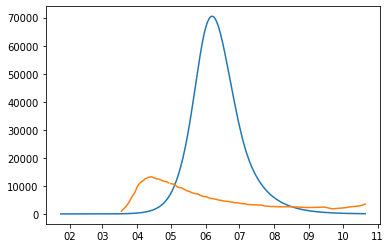

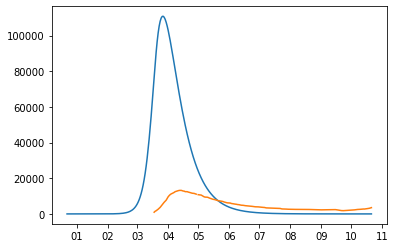

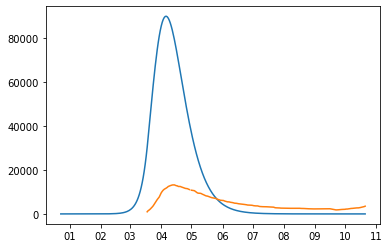

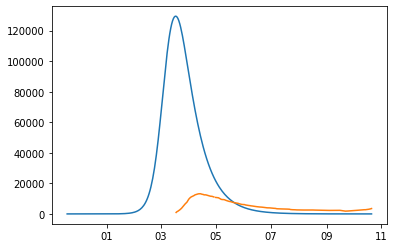

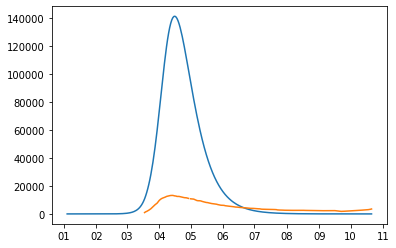

...

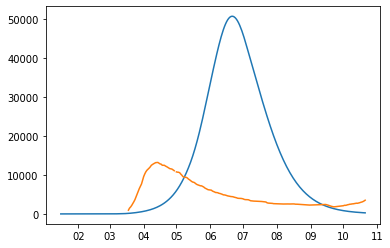

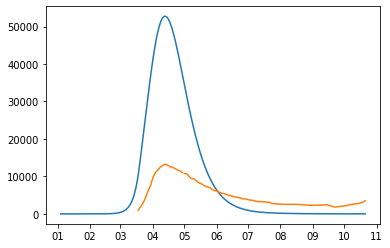

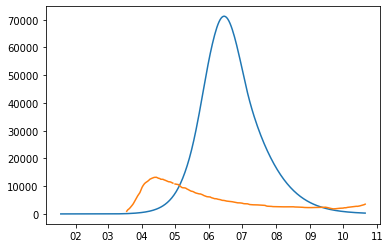

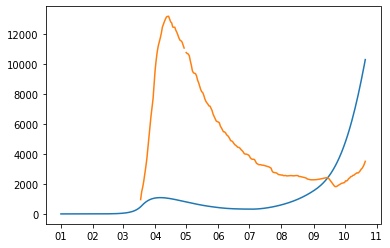

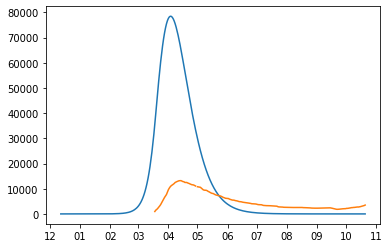

best_error: 57.08502322722173
vector: [array([57.08502323])]
mean_deaths 9.073014581501626
[8.18617259e+01 1.27411141e+00 1.41086062e+00 7.99202058e-01
 8.14749445e-01 1.63390897e-02 2.74347788e-01 8.50735012e-02
 7.59789073e-01 8.02678125e-01 1.01817784e+00 1.15782043e+00
 1.21163056e+00 9.27449550e-01 1.04312910e+00 7.83344978e-01
 9.30930134e-01]
best_error: 64.34836105000697
vector: [array([64.34836105])]
mean_deaths 10.163585654583455
[9.20550308e+01 3.43346751e-01 9.06735386e-01 5.75633120e-01
 8.43616084e-01 3.94983536e-03 1.88733671e-01 4.88044529e-02
 9.90215339e-01 8.06472631e-01 7.82250741e-01 9.33447329e-01
 9.19234695e-01 9.32432051e-01 8.47240767e-01 1.23741445e+00
 8.60403854e-01]
best_error: 73.19374382298531
vector: [array([73.19374382])]
best_error: 47.24582004624689
mean_deaths 11.649712542735328
vector: [array([47.24582005])]
[1.07654944e+02 1.55066688e+00 1.08395268e+00 5.08505545e-01
 5.08905758e-01 5.34605754e-02 5.07609236e-01 8.70368414e-02
 6.55674095e-01 9.19

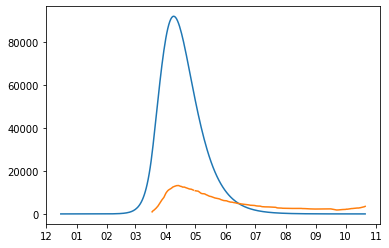

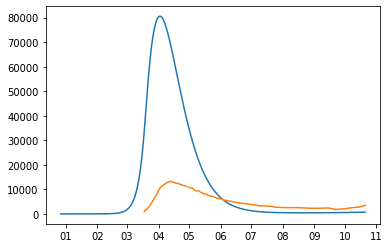

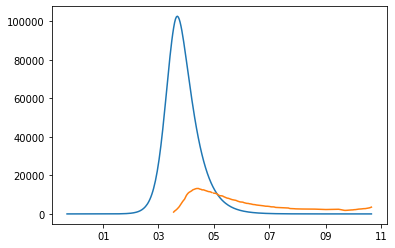

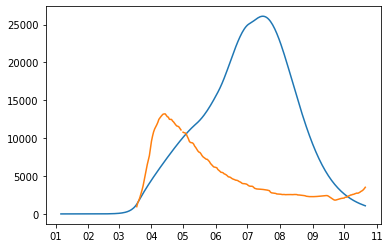

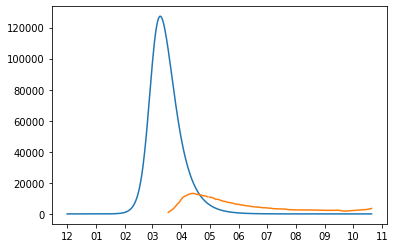

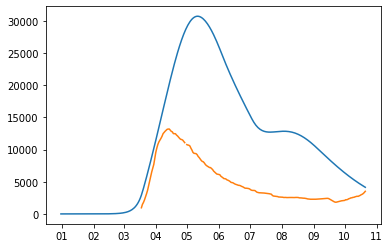

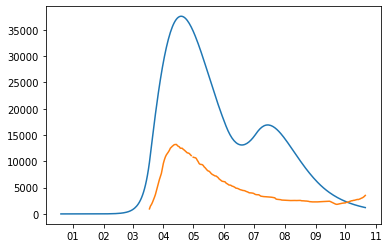

best_error: 41.690655684091766
vector: [array([41.69065568])]
mean_deaths 5.414728412632102
[84.12205294  1.91575157  0.65365811  0.26150753  0.16942107  0.0858937
  0.28967617  0.09101391  0.56385847  0.98046069  1.23468708  0.85986164
  1.01804627  1.22850256  1.06119149  1.10471869  0.96961542]
best_error: 72.52187182806291
vector: [array([72.52187183])]
mean_deaths 13.337032692474445
[1.15344526e+02 1.20073415e+00 1.71488355e+00 1.57854431e-01
 7.69065099e-01 4.62920231e-02 1.48684716e-01 1.29621321e-01
 6.08945763e-01 7.86273454e-01 1.19594245e+00 8.61913342e-01
 9.64307955e-01 1.01262760e+00 1.03822279e+00 1.09199373e+00
 1.12083821e+00]best_error: 69.67385735240526

vector: [array([69.67385735])]
mean_deaths 14.311336508007562
[1.38485313e+02 8.79499538e-01 1.74395542e+00 7.29272036e-01
 1.05882153e-01 6.05053289e-02 9.55421467e-01 1.17163979e-01
 7.89565012e-01 8.90743822e-01 1.22274086e+00 1.16011042e+00
 8.27667084e-01 1.12082795e+00 1.10657446e+00 8.48760288e-01
 1.08023402e

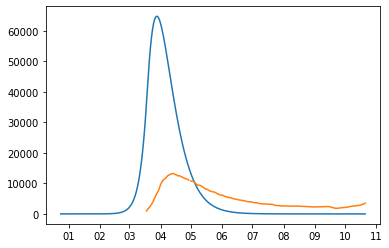

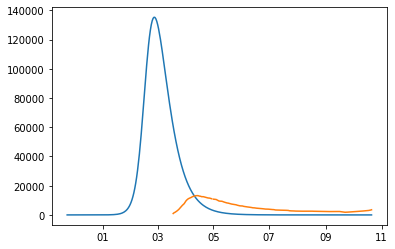

best_error: 12.03590157114882
vector: [array([12.03590157])]
mean_deaths 0.18858635575354707
[1.02144434e+02 1.92803914e+00 9.47575811e-01 8.86179411e-01
 7.86474682e-03 3.40707145e-02 3.26656936e-01 5.47225901e-02
 6.73873593e-01 1.24229467e+00 8.39407747e-01 1.18659903e+00
 1.17788311e+00 1.14826451e+00 1.10356155e+00 1.18316092e+00
 1.15019176e+00]


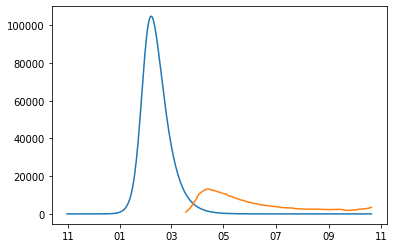

best_error: 13.671970397946781
vector: [array([13.6719704])]
mean_deaths 0.06025763435017193
[7.80305864e+01 1.84146347e+00 8.89144351e-01 3.28650317e-01
 5.77022608e-01 5.67613331e-02 5.35645634e-01 9.32710176e-02
 5.61287515e-01 1.22751741e+00 1.15557613e+00 1.05503637e+00
 1.20222978e+00 1.01602580e+00 8.35788051e-01 9.45392925e-01
 8.16480394e-01]
best_error: 72.61769429349918
vector: [array([72.61769429])]
mean_deaths 11.50071904448176
[1.15152059e+02 1.50763479e+00 1.83417791e+00 5.69455869e-01
 6.33567325e-01 2.06815221e-02 3.44361007e-01 8.79468774e-02
 9.55634011e-01 9.56686376e-01 8.37958543e-01 1.12855025e+00
 8.53765164e-01 1.15250191e+00 9.74514572e-01 9.10020264e-01
 1.09373973e+00]
best_error: 47.918608865467945
vector: [array([47.91860887])]
mean_deaths 4.672704994919273
[5.14395773e+01 8.48313418e-01 5.12125562e-01 3.17418362e-01
 7.57501128e-01 9.06299030e-02 1.15705335e-02 8.88653773e-02
 6.94512214e-01 9.67802444e-01 9.28507103e-01 1.09020805e+00
 1.14678587e+00 1.0

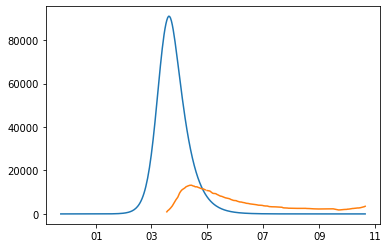

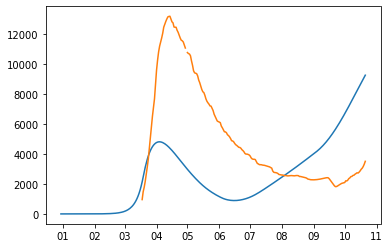

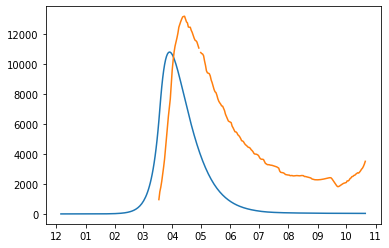

best_error: 43.964068889755346
vector: [array([43.96406889])]
mean_deaths 7.3532925846651125
[8.86763779e+01 1.80906303e-01 1.50501216e+00 4.84936927e-01
 2.90474855e-01 6.17222410e-02 5.58057703e-01 3.37631983e-02
 9.47895023e-01 1.17275194e+00 8.21192090e-01 8.82642260e-01
 7.92057587e-01 1.19173228e+00 1.16438642e+00 7.58891585e-01
 9.48305092e-01]


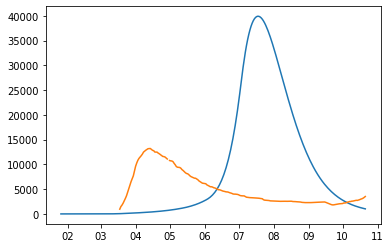

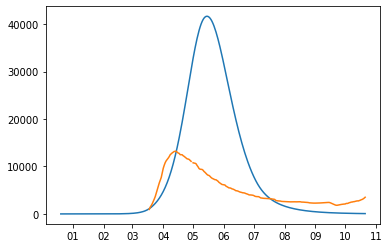

best_error: 60.33174609934132
vector: [array([60.3317461])]
best_error: 63.20163948270297
mean_deaths 10.256508594506517
vector: [array([63.20163948])]
[1.22567370e+02 9.45452163e-01 1.57710794e+00 6.81547497e-01
 3.31529702e-01 8.12555760e-02 9.79602514e-02 1.35030532e-01
 8.66112054e-01 1.08829899e+00 1.23975692e+00 7.55703680e-01
 8.37384487e-01 9.69728878e-01 1.21587606e+00 1.23554073e+00
 1.07780300e+00]mean_deaths 10.450551926519562

[1.32184822e+02 1.88895740e+00 1.33451071e+00 3.77524830e-01
 9.34201171e-01 2.26386139e-02 1.77024761e-01 1.69156552e-01
 9.89850434e-01 1.12092475e+00 9.71535826e-01 8.08060325e-01
 9.58261512e-01 1.11330449e+00 1.13797471e+00 8.39821960e-01
 1.06537019e+00]
best_error: 20.067785500237264
vector: [array([20.0677855])]
mean_deaths 2.4421038729348763
[1.05114913e+02 1.80244270e+00 1.54700325e+00 8.21036568e-01
 1.32017651e-01 8.04629268e-02 3.24946966e-01 1.52800485e-02
 9.73201782e-01 1.14247011e+00 8.29998398e-01 9.62650680e-01
 1.23919755e+00 9.59

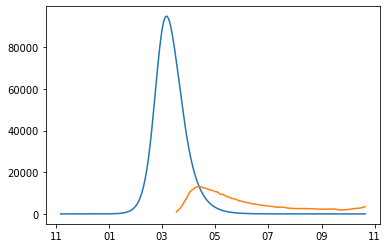

best_error: 16.93060943897013
vector: [array([16.93060944])]


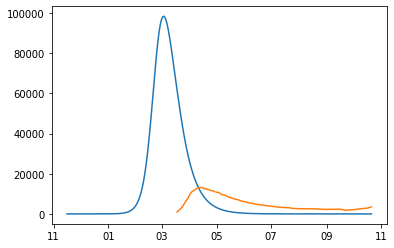

mean_deaths 1.6745901150796851
[8.42419651e+01 1.13943419e+00 6.64527197e-01 3.69575492e-01
 1.87955461e-01 4.20238534e-02 5.53950293e-01 1.18186493e-02
 9.96957305e-01 1.10174689e+00 1.13117588e+00 8.52724641e-01
 7.84461562e-01 8.28008006e-01 8.44187330e-01 7.92230634e-01
 8.80240703e-01]
best_error: 11.957537744808382
vector: [array([11.95753774])]
mean_deaths 0.7983079962820149
[6.76611000e+01 1.89628652e+00 7.99808789e-01 7.05558346e-01
 2.35399962e-01 1.94200384e-03 9.04205593e-01 1.22114705e-01
 6.89426872e-01 1.09828152e+00 8.76230766e-01 8.70227264e-01
 1.20346362e+00 9.65381502e-01 1.18848767e+00 1.16081116e+00
 1.10478588e+00]


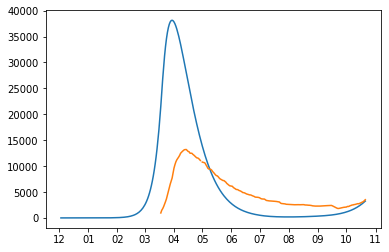

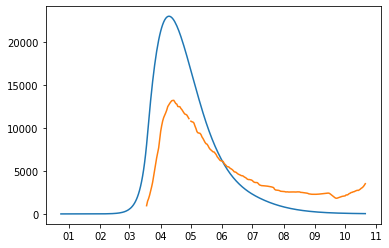

best_error: 7.139154293877417
vector: [array([7.13915429])]
best_error: 61.60500211203851
mean_deaths 0.23632959874809353
vector: [array([61.60500211])]
mean_deaths 10.648807846320372
[1.00964821e+02 1.55630131e+00 9.94423705e-01 7.30950849e-01
 6.35475047e-01 8.40218563e-02 1.52288152e-01 6.51352165e-02
 5.86898963e-01 1.21271042e+00 8.45141007e-01 1.10310710e+00
 9.11682096e-01 1.05045529e+00 1.15133691e+00 1.10605010e+00
 1.09872925e+00][7.96450735e+01 6.78026917e-01 1.48674912e+00 4.17703690e-01
 4.09145390e-01 3.57790022e-02 1.70424623e-01 1.46870008e-01
 6.46859272e-01 7.96575843e-01 9.38830964e-01 1.06957726e+00
 1.15712290e+00 1.10278776e+00 1.21988914e+00 1.23232363e+00
 1.08307092e+00]



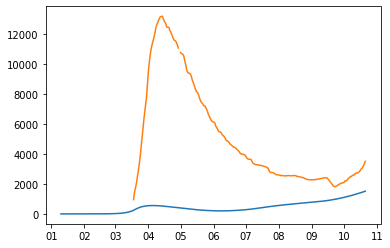

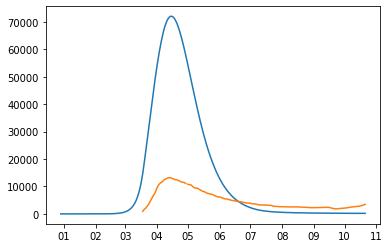

best_error: 27.28151610379149
vector: [array([27.2815161])]
mean_deaths 3.7516747299165947
[8.48852570e+01 6.66908632e-01 1.51607591e+00 1.36472931e-01
 7.87613464e-01 4.45596306e-02 9.99896593e-02 4.18439794e-02
 9.17655122e-01 1.12935669e+00 1.21156737e+00 7.84185063e-01
 7.67321441e-01 1.21687811e+00 8.89400206e-01 1.03774916e+00
 8.21787810e-01]

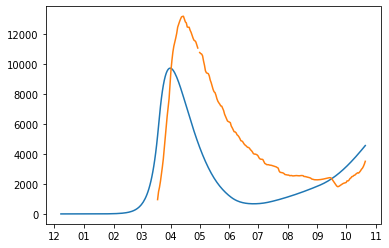


best_error: 54.03073731369282
vector: [array([54.03073731])]
mean_deaths 7.773240873715393
[9.91519531e+01 7.20921323e-01 8.82210206e-01 2.11379769e-01
 8.74182324e-02 9.48482491e-03 8.57563089e-01 7.89355717e-02
 5.14707239e-01 9.88785019e-01 8.49514689e-01 9.18787625e-01
 1.15998059e+00 1.07399848e+00 8.49948076e-01 1.02030623e+00
 7.53979609e-01]


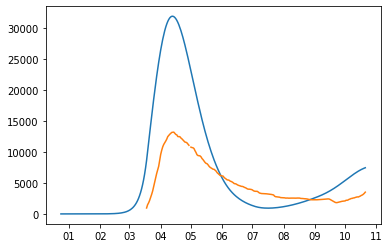

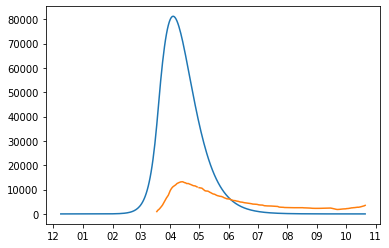

best_error: 43.033368353865136
vector: [array([43.03336835])]
mean_deaths 6.630290701939207
[1.00112194e+02 4.28770491e-01 1.15505471e+00 4.21635386e-01
 2.33485301e-01 7.27774593e-02 8.87522159e-01 7.58655535e-02
 9.32664122e-01 1.02462847e+00 7.96451395e-01 1.02489987e+00
 7.97358446e-01 9.53291447e-01 7.54111199e-01 1.19075223e+00
 8.56734199e-01]


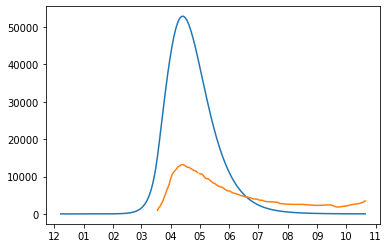

best_error: 13.369918467239216
vector: [array([13.36991847])]
mean_deaths 0.6242864474131874
[75.84287548  1.79063756  0.5392367   0.94430587  0.31291487  0.09637985
  0.08405626  0.18668508  0.64782743  1.07641658  1.05295993  1.19118522
  0.81589842  1.04557897  1.0681938   0.98615388  1.1005718 ]


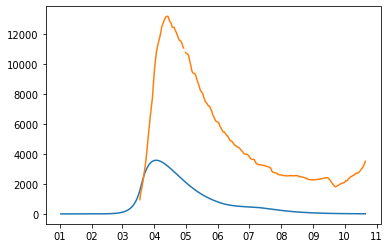

best_error: 14.478604105117462
vector: [array([14.47860411])]
mean_deaths 0.8741889981259119
[5.54014826e+01 1.76768845e+00 5.50314953e-01 4.04510768e-02
 4.52418463e-01 9.28456564e-02 8.52011119e-01 4.32251227e-03
 9.53362607e-01 1.24516500e+00 1.20439477e+00 9.52416357e-01
 1.12493429e+00 7.93782385e-01 1.08490076e+00 1.24498157e+00
 9.38343381e-01]
best_error: 10.270401764789863
vector: [array([10.27040176])]
mean_deaths 0.26055649847282236
[9.32209463e+01 1.57600677e+00 6.37465654e-01 4.77656661e-01
 8.52454417e-01 2.41901717e-02 7.96695676e-01 1.20312696e-01
 7.67606612e-01 1.19255742e+00 8.11407903e-01 1.00613915e+00
 1.03045068e+00 9.12422469e-01 8.09086054e-01 8.95703655e-01
 1.06994790e+00]


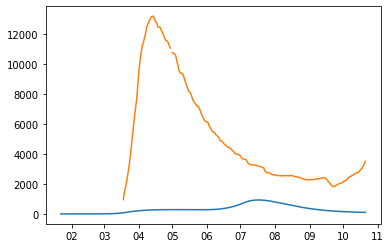

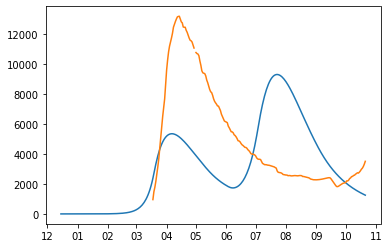

best_error: 39.96741035589127
vector: [array([39.96741036])]
mean_deaths 5.813428474136003
[1.04451239e+02 7.59036585e-01 1.05001774e+00 1.28079572e-01
 6.30669347e-01 2.49121989e-02 1.93180094e-01 2.17664399e-02
 6.64697476e-01 1.17143237e+00 9.27125065e-01 9.44139876e-01
 8.83539448e-01 8.47958042e-01 1.02835787e+00 1.02195089e+00
 1.14054698e+00]
best_error: 56.64572770458131
vector: [array([56.6457277])]
mean_deaths 8.835381692750497
[9.57889636e+01 1.97446162e+00 5.56561314e-01 2.28839762e-01
 9.63603221e-01 3.52034258e-02 8.92158799e-01 1.29037635e-01
 9.22003792e-01 8.71617862e-01 7.64286564e-01 9.93519716e-01
 1.22352541e+00 7.95697442e-01 1.16838500e+00 1.04189859e+00
 9.13405807e-01]


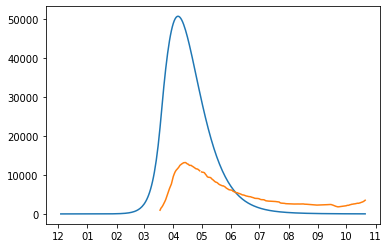

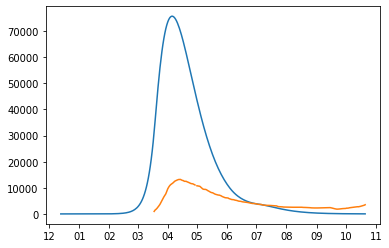

best_error: 7.689397029890556
vector: [array([7.68939703])]
mean_deaths 0.30793967419904095
[7.46289690e+01 1.46216257e+00 6.49368778e-01 6.62120524e-01
 6.52688753e-01 2.88036213e-02 2.11468648e-01 1.24351414e-01
 9.40028863e-01 1.06432929e+00 8.55902315e-01 9.72444823e-01
 9.37988292e-01 9.40721233e-01 7.56718767e-01 8.57128779e-01
 1.02312425e+00]
best_error: 26.120181337136422
vector: [array([26.12018134])]
mean_deaths 2.063378792458774
[5.62447971e+01 1.24959706e+00 5.78415395e-01 5.86915000e-01
 5.51913700e-01 7.94019430e-02 3.01683921e-01 4.43229855e-02
 8.81912461e-01 9.08730217e-01 1.12715758e+00 8.75340494e-01
 1.02262510e+00 1.23886141e+00 9.84797914e-01 9.82260075e-01
 1.20399224e+00]


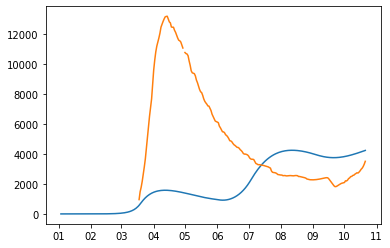

best_error: 56.27441917682846
vector: [array([56.27441918])]
mean_deaths 8.508214249214506
[1.08327199e+02 9.37483581e-01 1.98058651e+00 7.49340365e-01
 8.01174872e-01 5.71137434e-02 6.78660633e-01 2.47756969e-02
 8.33544830e-01 1.00634395e+00 8.31750317e-01 1.18109444e+00
 7.56496272e-01 8.58561588e-01 8.06142912e-01 1.01602000e+00
 7.84185554e-01]


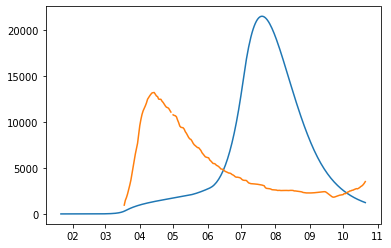

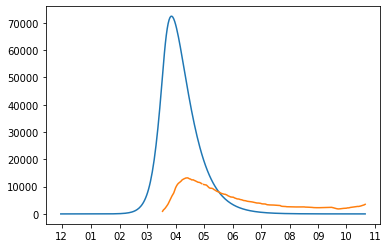

best_error: 16.17416482844058
vector: [array([16.17416483])]
mean_deaths 1.3008249283593434
[8.07615594e+01 1.30994211e+00 8.21658548e-01 7.58809796e-01
 4.74980889e-01 2.71569024e-02 9.27414494e-02 3.62695782e-02
 7.35713277e-01 1.02160943e+00 1.17286322e+00 9.41897471e-01
 7.77092644e-01 1.21920272e+00 1.22422768e+00 1.23902539e+00
 1.12532852e+00]
best_error: 14.68090439291342
vector: [array([14.68090439])]
mean_deaths 0.8442276305478208
[9.08597267e+01 1.63532134e+00 9.87979598e-01 3.37462039e-01
 2.44397798e-01 1.96746695e-03 6.58237897e-02 1.11109353e-01
 5.40063915e-01 1.20982231e+00 1.13319889e+00 7.83267100e-01
 1.03983809e+00 1.12805664e+00 1.18112787e+00 8.85572888e-01
 1.15729343e+00]
best_error: 11.809228750486822
vector: [array([11.80922875])]
mean_deaths 0.25711124274395697
[7.85496345e+01 1.44732642e+00 8.76043256e-01 5.98350030e-01
 3.72811327e-02 8.89322172e-02 7.44287582e-01 9.75573489e-02
 6.20353559e-01 1.13675852e+00 8.98686112e-01 1.16412975e+00
 8.59475664e-01 1

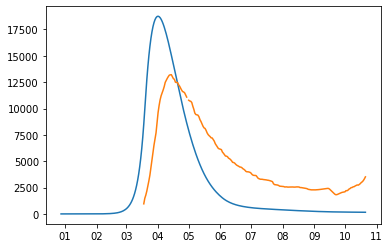

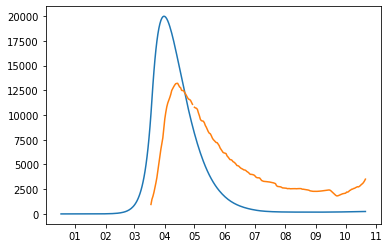

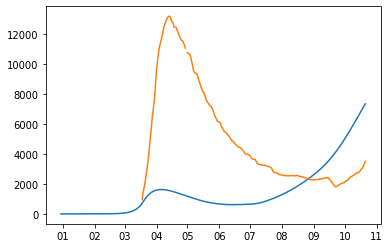

best_error: 39.130649945686294
vector: [array([39.13064995])]
mean_deaths 6.54366487026558
[9.23663938e+01 5.31207622e-01 5.06198017e-01 3.61382521e-01
 5.47789886e-01 1.73312057e-02 4.49612978e-01 7.30354958e-02
 9.03402240e-01 1.03131790e+00 8.17553951e-01 1.16780743e+00
 8.86910095e-01 1.16383970e+00 1.09583410e+00 1.19196966e+00
 8.34152038e-01]


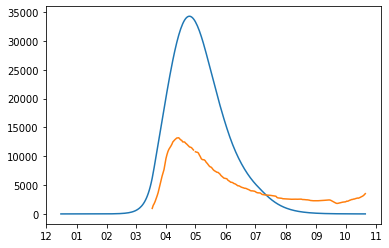

best_error: 15.12919314074738
vector: [array([15.12919314])]
mean_deaths 0.9381695573651254
[57.51306596  1.71170801  0.74407657  0.87114898  0.05984055  0.08166386
  0.17600798  0.15588467  0.50144822  1.05740863  1.05058358  0.9470597
  1.22165446  0.80354716  0.98301254  0.95755632  0.819862  ]


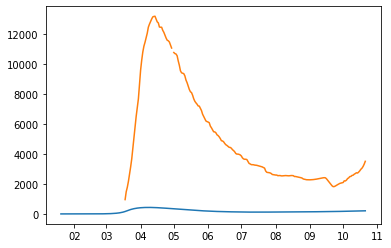

best_error: 11.433047960133948
vector: [array([11.43304796])]
mean_deaths 0.5323767063898215
[9.60053128e+01 1.10631387e+00 7.02064910e-01 8.89399317e-01
 5.66292255e-01 7.43533094e-02 6.80595042e-01 6.75329936e-02
 8.93874428e-01 1.19312502e+00 9.18871807e-01 1.08532083e+00
 1.11241355e+00 1.14989862e+00 1.20368740e+00 1.22887578e+00
 1.13261868e+00]
best_error: 53.49484276294028
vector: [array([53.49484276])]
mean_deaths 8.212078342363686
[1.25287008e+02 4.02141568e-01 1.13974028e+00 4.42254689e-01
 8.32900101e-01 3.80982898e-02 1.65774101e-01 9.34578574e-02
 5.06792965e-01 1.20686429e+00 8.35388890e-01 1.19552151e+00
 7.58158800e-01 1.13987576e+00 7.89620339e-01 1.03986015e+00
 1.10515119e+00]


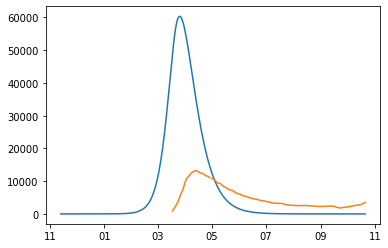

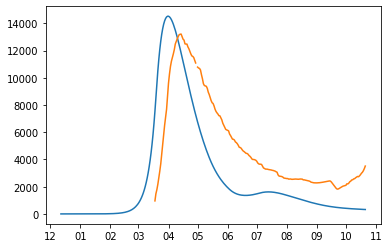

best_error: 14.404511111606858
vector: [array([14.40451111])]
mean_deaths 1.2936900358304673
[7.80305864e+01 1.33936960e+00 7.41943292e-01 6.49821086e-01
 9.36430274e-01 4.57990260e-02 2.18487125e-01 5.39392587e-02
 9.02635797e-01 1.07309941e+00 1.15557613e+00 1.15183648e+00
 9.46919378e-01 1.08737000e+00 1.01335108e+00 1.23300415e+00
 9.22505830e-01]


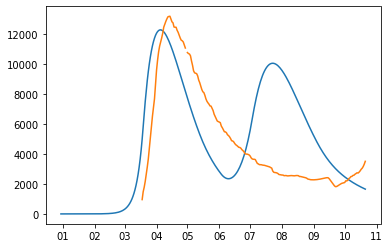

best_error: 12.327538917728194
vector: [array([12.32753892])]
mean_deaths 0.4117192341956862
[1.05891428e+02 1.88895740e+00 1.09438443e+00 3.77524830e-01
 4.38684862e-01 2.26386139e-02 1.37863791e-01 1.69156552e-01
 9.89850434e-01 1.23982664e+00 7.91648591e-01 1.18414745e+00
 8.74300623e-01 9.22723009e-01 1.17303474e+00 8.39821960e-01
 1.06537019e+00]


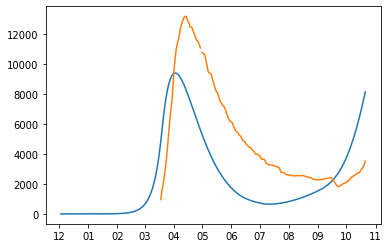

best_error: 14.436404708821915
vector: [array([14.43640471])]
mean_deaths 1.2131503679648385
[1.06844717e+02 1.68566806e+00 9.32398567e-01 5.17249514e-01
 8.44217377e-01 2.20610807e-02 4.47129979e-01 1.02713469e-01
 6.00218065e-01 1.22381517e+00 8.59184085e-01 1.15939628e+00
 1.01359277e+00 9.80149112e-01 8.36865273e-01 1.14359082e+00
 1.16293059e+00]


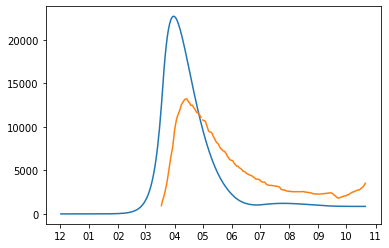

best_error: 8.355253931334984
vector: [array([8.35525393])]
mean_deaths 0.011178294151326847
[8.94359785e+01 1.98027495e+00 7.61896611e-01 6.38129877e-01
 9.45597623e-01 6.71418406e-02 2.83159355e-01 1.71974921e-02
 8.51378602e-01 1.17683591e+00 7.54625892e-01 7.74873554e-01
 9.79314022e-01 1.09473738e+00 9.87334577e-01 9.20164426e-01
 1.04675140e+00]
best_error: 8.516821061278879
vector: [array([8.51682106])]
mean_deaths 0.2717845949023925
[5.31549688e+01 1.13465985e+00 5.53055829e-01 8.34104011e-01
 7.91155780e-01 7.08139625e-02 5.74933277e-02 1.91404960e-03
 5.35123135e-01 9.75861280e-01 8.61639331e-01 9.10103895e-01
 1.11913565e+00 9.35363067e-01 1.13973174e+00 1.07597781e+00
 1.01509486e+00]
best_error: 12.353800073561526
vector: [array([12.35380007])]
mean_deaths 1.6527945815199394
[9.27718741e+01 1.53744481e+00 7.65821356e-01 1.79147403e-01
 4.27656362e-01 4.71074837e-02 3.42437230e-01 9.57567894e-03
 6.01232326e-01 1.06175859e+00 7.85930685e-01 1.18788194e+00
 1.00909513e+00 1.

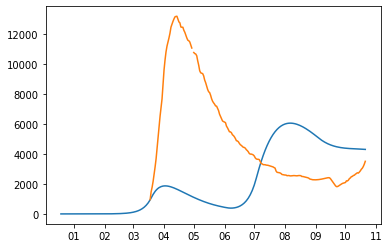

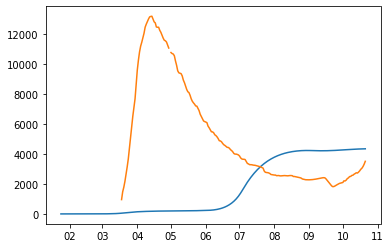

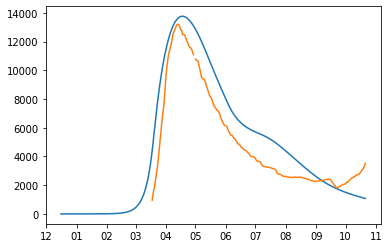

best_error: 13.707515928352988
vector: [array([13.70751593])]
mean_deaths 0.848373555884069
[7.36259971e+01 1.82945470e+00 6.10446814e-01 6.27770918e-01
 9.22552880e-01 9.05644176e-02 2.66190132e-01 6.21311894e-02
 8.24331896e-01 1.21048093e+00 9.15044435e-01 9.90846991e-01
 9.90538587e-01 1.01340680e+00 8.29101832e-01 1.13520730e+00
 1.19032345e+00]


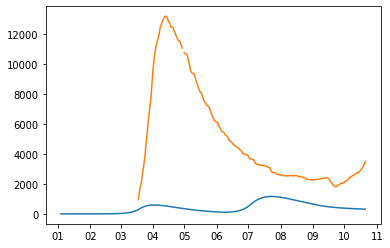

best_error: 11.661866872386893
vector: [array([11.66186687])]
mean_deaths 0.015439055838239051
[81.05377937  1.72503225  0.87604326  0.7608616   0.75270316  0.08893222
  0.47561532  0.15234091  0.55001937  1.18093356  1.04226173  0.89772867
  0.93439174  0.88762354  0.95316238  1.03630512  1.13406308]


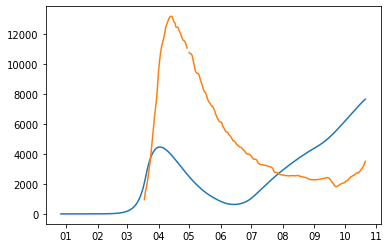

best_error: 9.299737967285138
vector: [array([9.29973797])]
mean_deaths 0.390965081589276
[8.90790734e+01 1.35285891e+00 5.24711069e-01 1.83608785e-01
 4.45101084e-01 6.12745720e-02 2.68098265e-01 8.99570806e-02
 6.33900424e-01 1.14576642e+00 7.68066129e-01 1.12801513e+00
 1.08088487e+00 1.07142579e+00 1.15476810e+00 9.95493757e-01
 1.09570991e+00]
best_error: 7.487725859580268
vector: [array([7.48772586])]
mean_deaths 0.29330800610118724
[8.37702736e+01 1.15381226e+00 6.18680935e-01 8.29910147e-01
 7.59377821e-01 8.31696933e-02 2.74449775e-01 1.00639154e-01
 5.34312822e-01 1.17015226e+00 8.67385571e-01 1.21810418e+00
 9.21881760e-01 8.60628720e-01 1.04005789e+00 1.08325009e+00
 9.67556614e-01]


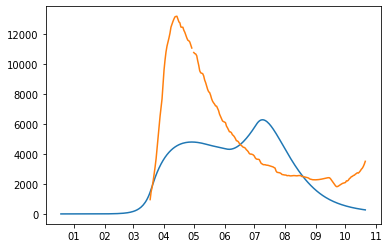

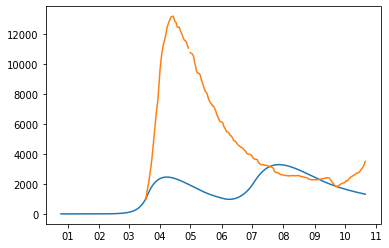

best_error: 12.40756036490543
best_error: 5.568663743120667
vector: [array([12.40756036])]
vector: [array([5.56866374])]
mean_deaths 0.43699827535024977
mean_deaths 0.13631001778411392
[8.92785097e+01 1.31588766e+00 6.91496288e-01 6.45720738e-01
 2.21486599e-01 8.60623115e-02 1.73419426e-01 3.15607292e-02
 7.48242602e-01 1.14516606e+00 1.01273590e+00 8.76367032e-01
 1.10510290e+00 1.10251385e+00 9.98475129e-01 9.16781195e-01
 1.09267062e+00][1.00964821e+02 1.55630131e+00 9.94423705e-01 9.67521991e-01
 6.35475047e-01 6.65482168e-02 1.52288152e-01 8.06748112e-02
 6.50504615e-01 1.21271042e+00 8.45141007e-01 1.08908676e+00
 9.92416618e-01 1.02052224e+00 1.12181229e+00 1.10605010e+00
 1.21806359e+00]

best_error: 8.891949779745026
vector: [array([8.89194978])]
mean_deaths 0.37189893571033616
[9.04668907e+01 1.64440918e+00 5.13091751e-01 6.49997399e-01
 5.62091007e-01 6.88780958e-02 2.96975620e-01 1.39211229e-01
 6.06830929e-01 1.03834398e+00 7.87651760e-01 1.14436132e+00
 1.05840628e+00 8.

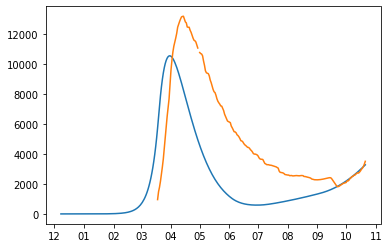

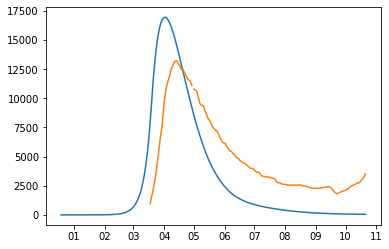

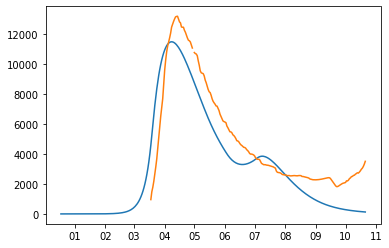

best_error: 13.700140107531983
vector: [array([13.70014011])]
mean_deaths 0.6498769838629118
[8.41858393e+01 1.76475218e+00 7.11369346e-01 5.58294841e-01
 2.30809285e-01 2.18507996e-02 9.55050859e-02 8.18350086e-02
 5.39695502e-01 1.22716719e+00 1.01165758e+00 1.05993435e+00
 9.48678391e-01 1.12955668e+00 1.24926713e+00 8.62564825e-01
 1.05990200e+00]


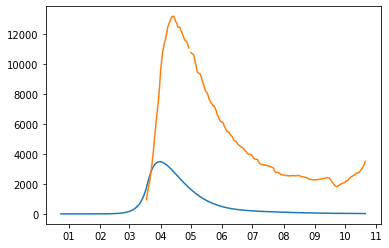

best_error: 15.184238478478216
vector: [array([15.18423848])]
mean_deaths 0.8108596553513528
[67.01526588  1.00754611  0.62058839  0.58297837  0.18025444  0.09764796
  0.72842817  0.13735892  0.60948085  1.05487483  1.1316375   0.94032716
  0.99100848  1.05593611  0.93046512  1.21944708  1.09736561]
best_error: 8.722900556345882
vector: [array([8.72290056])]
mean_deaths 0.462384199480481
[1.01112949e+02 1.08566172e+00 5.50314953e-01 3.85387923e-01
 4.52418463e-01 7.59483805e-02 4.77758120e-01 4.32251227e-03
 9.53362607e-01 1.24516500e+00 7.72589556e-01 1.10947846e+00
 1.10711679e+00 7.93782385e-01 1.08490076e+00 1.06153098e+00
 1.12096148e+00]


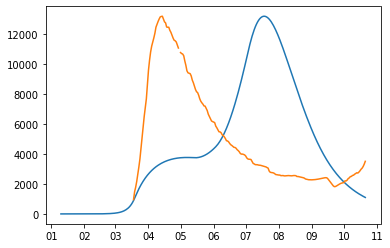

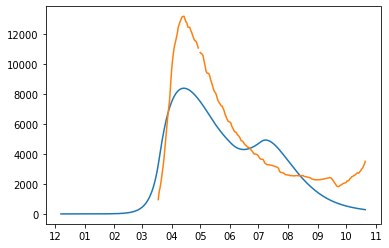

best_error: 10.398792781104024
vector: [array([10.39879278])]
mean_deaths 0.6376581677011018
[7.47069925e+01 1.63733377e+00 9.67930515e-01 8.89540280e-01
 2.56801637e-01 9.56906297e-02 6.15020274e-01 4.02372120e-02
 5.73265826e-01 1.15398723e+00 9.87593390e-01 1.03350973e+00
 9.09900041e-01 1.20779633e+00 1.15416436e+00 1.05688043e+00
 1.08932066e+00]


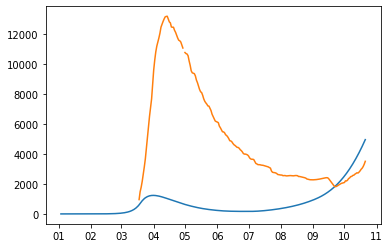

best_error: 11.04518339045189
vector: [array([11.04518339])]
mean_deaths 0.2635646710437695
[9.04046898e+01 1.16752163e+00 6.43979574e-01 7.59744276e-01
 1.39874482e-01 4.39580568e-02 4.16814210e-01 6.22686939e-02
 9.95624071e-01 1.15320253e+00 9.80176062e-01 1.05398777e+00
 9.33016641e-01 9.72670489e-01 8.13794781e-01 8.21428405e-01
 1.05039759e+00]
best_error: 8.817903126609604
vector: [array([8.81790313])]
mean_deaths 0.1401694773455547
[9.34505454e+01 1.33237600e+00 6.33982402e-01 6.20081039e-01
 2.50762964e-01 9.67792323e-02 9.57745218e-01 1.56603900e-02
 7.05878019e-01 1.14953265e+00 8.69966619e-01 1.00867448e+00
 8.30106965e-01 9.37540445e-01 1.05808209e+00 9.22825742e-01
 1.01801750e+00]


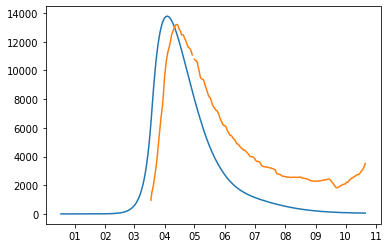

best_error: 11.448574757476553
vector: [array([11.44857476])]
mean_deaths 0.8090089266636654
[60.98824254  1.64065658  0.80975127  0.30475099  0.61066219  0.08326822
  0.50281736  0.075529    0.98684058  1.20284874  0.94295062  1.15204414
  0.84568169  0.94096003  0.93065743  0.94364998  0.8480341 ]


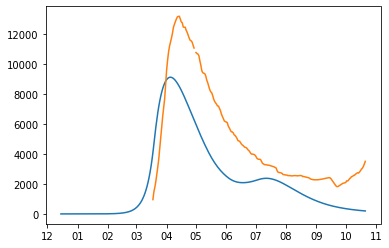

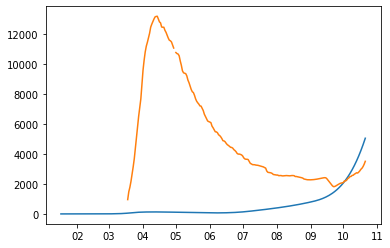

best_error: 12.190021010857585
vector: [array([12.19002101])]
mean_deaths 1.3395502254122098
[8.68038493e+01 1.51575957e+00 1.03477328e+00 7.70762657e-01
 6.58867970e-01 6.19528461e-02 3.17168364e-01 5.82108437e-02
 9.23994181e-01 1.12372636e+00 1.13077835e+00 1.08322292e+00
 9.45396131e-01 1.12973550e+00 1.14982649e+00 1.03735767e+00
 9.46947435e-01]


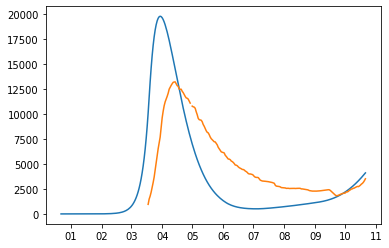

best_error: 5.741459250644259
vector: [array([5.74145925])]
mean_deaths 0.3785163830499345
[8.78241298e+01 1.47585554e+00 7.79204223e-01 4.95695764e-01
 3.18234155e-01 9.99227728e-02 3.78582681e-01 5.94073530e-02
 7.79006637e-01 1.15245737e+00 7.99662009e-01 1.10672919e+00
 9.82540898e-01 1.08749696e+00 8.77023338e-01 8.67611887e-01
 1.11416293e+00]
best_error: 4.902071017867533
vector: [array([4.90207102])]
mean_deaths 0.12498804734872955
[84.40745547  1.21709385  0.70416868  0.65895588  0.3308322   0.09901497
  0.29442423  0.12422236  0.72808542  1.14567425  0.85657525  1.1051873
  1.10129294  0.97264957  1.1992461   1.21552138  0.88748273]
best_error: 6.864944386564417
vector: [array([6.86494439])]
mean_deaths 0.6692294097157533
[89.35950489  1.05101249  0.82114647  0.87897834  0.17392885  0.09847499
  0.64255626  0.18304039  0.61074352  1.09287173  0.88342589  1.0942369
  0.87753687  0.82072583  0.90316613  1.13225979  0.99775423]
best_error: 9.497718879208447
vector: [array([9.497

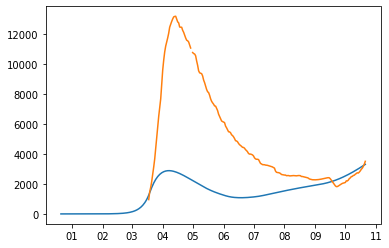

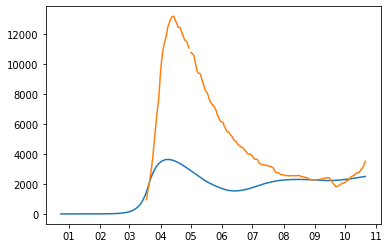

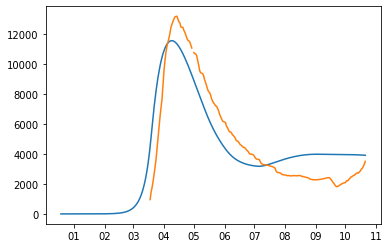

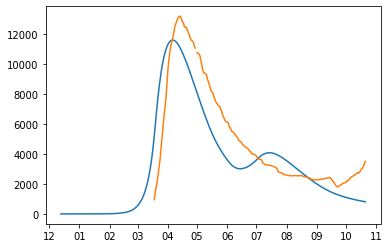

best_error: 7.655385460936637
vector: [array([7.65538546])]
mean_deaths 0.5321368228016466
[51.77306998  0.72949946  0.57946034  0.67015031  0.71497808  0.08109193
  0.65545699  0.17336784  0.77062315  1.20718483  1.04811426  0.90795228
  1.05028003  1.10344552  1.00865995  1.07339974  0.7754218 ]


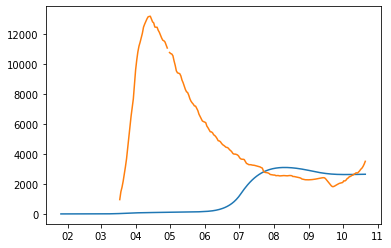

best_error: 6.433596083264395
vector: [array([6.43359608])]
mean_deaths 0.026050953501828972
[9.29390128e+01 1.53744481e+00 7.65821356e-01 7.68679774e-01
 4.27656362e-01 4.38551263e-02 1.51025866e-01 1.02617328e-01
 6.01232326e-01 1.06175859e+00 7.85930685e-01 1.18788194e+00
 1.12947015e+00 1.21073183e+00 7.70055218e-01 1.16392981e+00
 1.01065494e+00]


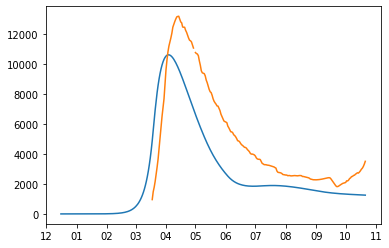

best_error: 12.913890173186276
vector: [array([12.91389017])]
mean_deaths 0.6764281726929116
[82.69797196  1.90602907  0.66378482  0.81366153  0.62470993  0.08324593
  0.33535507  0.14904694  0.7402157   1.15688613  0.9216052   0.8981644
  1.03711137  0.96350122  0.93356403  0.99248252  1.01137069]
best_error: 5.608868555022783
vector: [array([5.60886856])]
mean_deaths 0.5387561102904433
[9.52789663e+01 1.02088656e+00 7.70692566e-01 8.28760359e-01
 5.26797539e-01 9.16151908e-02 3.14078908e-01 4.57580449e-02
 7.21077279e-01 1.20244268e+00 8.66299629e-01 9.37422405e-01
 1.15351803e+00 9.88839655e-01 1.10582669e+00 9.13944070e-01
 1.11530598e+00]
best_error: 8.06934338141104
vector: [array([8.06934338])]
mean_deaths 0.17244383408647165
[7.37102055e+01 1.02554383e+00 5.87277804e-01 8.76899431e-01
 5.62857986e-01 7.74418858e-02 2.04086855e-01 6.70251959e-02
 8.82151334e-01 1.01105036e+00 8.04974569e-01 1.11511026e+00
 8.45613203e-01 1.20419385e+00 9.79527998e-01 1.21180736e+00
 1.15850873e+

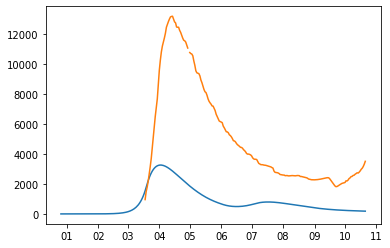

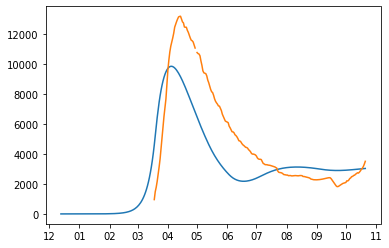

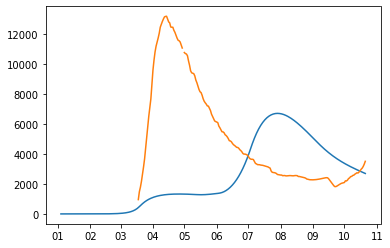

best_error: 9.832634869412527
vector: [array([9.83263487])]
mean_deaths 0.28353874031903176
[9.08427937e+01 1.10938670e+00 5.43859266e-01 3.61198548e-01
 4.63754481e-01 5.98215257e-02 1.64026131e-01 1.89970629e-02
 8.08831984e-01 1.24029745e+00 9.08535784e-01 1.03910572e+00
 9.45247690e-01 1.21541179e+00 9.78582225e-01 1.03736434e+00
 7.55444420e-01]


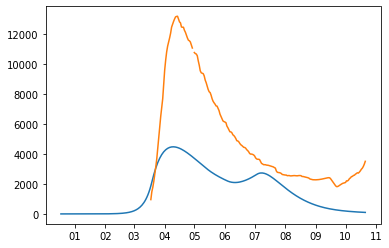

best_error: 7.0202397238737015
vector: [array([7.02023972])]
mean_deaths 0.10598530616587663
[9.60136449e+01 1.42559111e+00 6.65866499e-01 4.79695377e-01
 6.72961169e-01 7.96769518e-02 2.95041713e-01 1.90431880e-01
 6.25968594e-01 1.17133803e+00 7.63729594e-01 1.06805408e+00
 9.80171593e-01 1.22591690e+00 1.23159904e+00 1.01029460e+00
 1.22892484e+00]


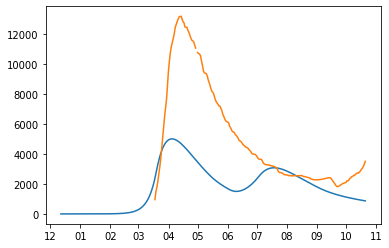

best_error: 9.651758452021335
vector: [array([9.65175845])]
mean_deaths 0.7277249079538142
[7.82332665e+01 1.76917891e+00 8.09751270e-01 7.57726576e-01
 8.68422274e-01 5.20328236e-02 4.30526446e-01 1.56547907e-01
 9.86840584e-01 1.22264470e+00 8.59891851e-01 1.04927207e+00
 8.45681691e-01 9.40960026e-01 8.05159552e-01 1.00792026e+00
 1.07765919e+00]


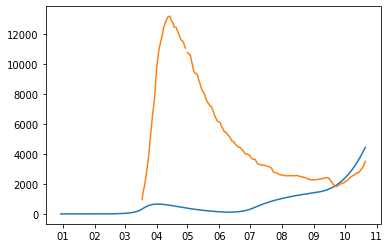

best_error: 7.245966083982597
vector: [array([7.24596608])]
mean_deaths 0.09616050760206421
[81.45155184  1.21709385  0.6626429   0.73833635  0.55189511  0.09901497
  0.29442423  0.1449981   0.72808542  1.14567425  1.06247762  0.91694403
  1.07484729  1.04044032  1.1992461   1.10914418  0.90133801]best_error: 7.388968116196231

vector: [array([7.38896812])]
mean_deaths 0.31359152672468626
[8.92785097e+01 1.25246389e+00 5.79829410e-01 6.45720738e-01
 5.34090455e-01 6.72927487e-02 1.73419426e-01 1.36354780e-01
 9.01748919e-01 1.10700431e+00 7.63634689e-01 8.76367032e-01
 1.23793828e+00 8.98310333e-01 1.19664890e+00 1.01147374e+00
 1.01492651e+00]
best_error: 8.135325242924807
vector: [array([8.13532524])]
mean_deaths 0.30095595146810084
[8.38590997e+01 1.90840696e+00 6.86768978e-01 6.26943433e-01
 4.24308879e-01 6.68286572e-02 4.39125340e-01 1.68308422e-01
 7.40621240e-01 1.03539634e+00 9.09836080e-01 9.43082594e-01
 1.08125858e+00 7.74878039e-01 1.05545128e+00 9.17575307e-01
 8.02363267

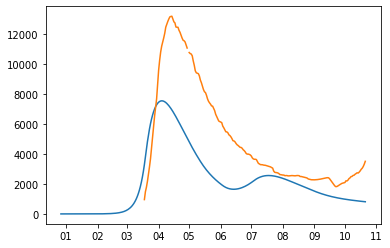

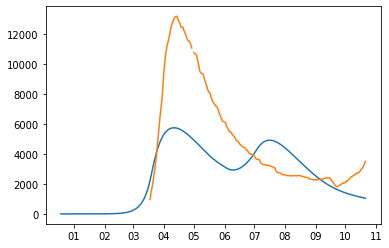

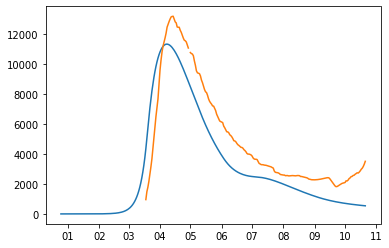

best_error: 7.323655926171047
vector: [array([7.32365593])]
mean_deaths 0.39536839859717343
[7.37493218e+01 1.74891785e+00 8.42773839e-01 7.99202058e-01
 1.30425193e-01 4.72503613e-02 4.06325290e-01 1.14769717e-01
 7.28246039e-01 1.06769859e+00 1.06644377e+00 1.02317017e+00
 1.21022552e+00 1.02635279e+00 1.02866928e+00 1.12622887e+00
 9.48255959e-01]


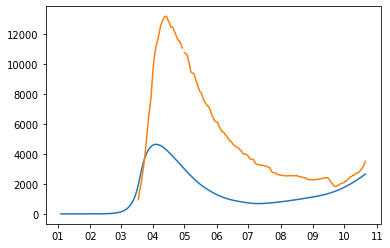

best_error: 4.479668877826403
vector: [array([4.47966888])]
mean_deaths 0.3207945763685952
[8.78241298e+01 1.20014170e+00 7.79204223e-01 6.65889334e-01
 3.18234155e-01 2.63378186e-02 3.78582681e-01 1.72530148e-01
 5.61257493e-01 1.14884240e+00 9.19246719e-01 1.19845360e+00
 9.82540898e-01 8.88801319e-01 1.09443532e+00 8.67611887e-01
 8.96288940e-01]


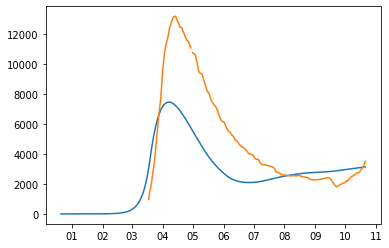

best_error: 4.32716800821665
vector: [array([4.32716801])]
mean_deaths 0.14285879079604488
[7.26059065e+01 1.34641798e+00 7.13777426e-01 7.68679774e-01
 3.58841659e-01 4.38551263e-02 4.62487887e-01 1.10737252e-01
 6.01232326e-01 1.09772915e+00 1.12132269e+00 9.88794250e-01
 1.21308965e+00 9.59784159e-01 1.02490197e+00 1.23800982e+00
 8.05988600e-01]


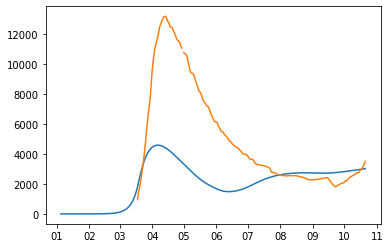

best_error: 7.08361202725769
vector: [array([7.08361203])]
mean_deaths 0.3286769879494912
[82.69797196  1.15175837  0.66378482  0.97425027  0.38111807  0.08324593
  0.32253338  0.13117458  0.6104152   1.04499614  0.7739799   0.82935917
  1.18360371  0.96350122  1.23268265  1.22930436  1.01137069]


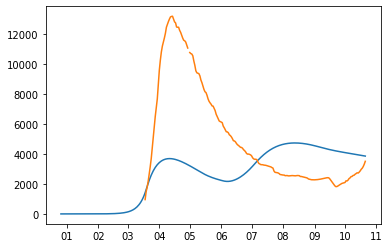

best_error: 7.0990210508637
vector: [array([7.09902105])]
mean_deaths 0.20699149469740802
[8.30987340e+01 1.39086977e+00 7.19475925e-01 6.82912624e-01
 2.72722533e-01 6.78725387e-03 5.75551546e-01 9.71311690e-02
 6.89022604e-01 1.12344046e+00 9.13761831e-01 1.05716778e+00
 1.06588903e+00 9.69843025e-01 1.05239496e+00 1.04920113e+00
 8.69731169e-01]


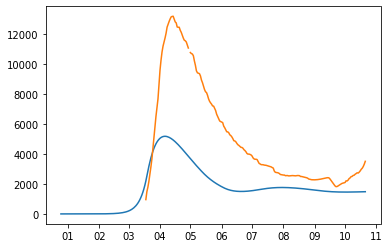

best_error: 6.374758308309698
vector: [array([6.37475831])]
mean_deaths 0.6955274500443974
[1.03944147e+02 1.06926242e+00 8.34116458e-01 7.08974007e-01
 6.45115546e-01 3.77118588e-02 1.19154146e-01 1.54436607e-01
 6.71973058e-01 1.22005678e+00 8.06649822e-01 1.02535485e+00
 9.85287412e-01 9.94563408e-01 1.17312545e+00 1.20542274e+00
 1.16154065e+00]


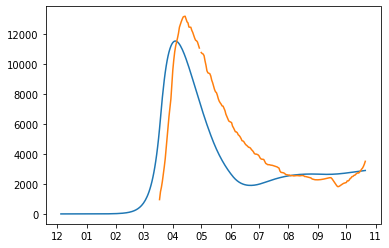

best_error: 7.084356211415771
vector: [array([7.08435621])]
mean_deaths 0.10564407553610877
[88.75491326  1.65480226  0.61847724  0.6777803   0.6513496   0.0910735
  0.23686559  0.09094983  0.95991837  1.07864364  0.83646205  0.78195204
  0.89614883  0.78276389  1.09075941  1.1898513   0.90249955]


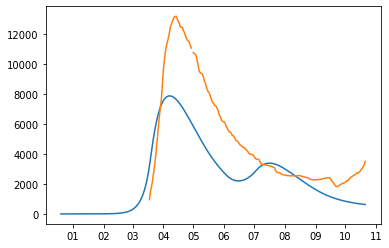

best_error: 4.257742667370996
vector: [array([4.25774267])]
mean_deaths 0.07305231496860794
[7.78305515e+01 1.50033992e+00 7.75825400e-01 7.95211469e-01
 5.30992493e-01 7.98971624e-02 4.70243411e-01 5.16723400e-02
 5.10763437e-01 1.07803888e+00 1.08777355e+00 1.08362203e+00
 9.41032565e-01 1.05810935e+00 1.05165457e+00 1.20964176e+00
 8.15941739e-01]


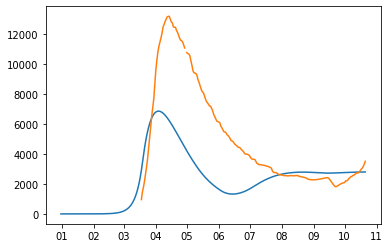

best_error: 9.213331346826454
vector: [array([9.21333135])]
mean_deaths 0.13360823440803743
[6.00270328e+01 1.28919430e+00 5.94618235e-01 1.36472931e-01
 2.97826885e-01 4.45596306e-02 4.13814521e-01 4.66388350e-02
 6.14698937e-01 1.12399091e+00 1.21156737e+00 7.77220665e-01
 1.21952381e+00 8.86662843e-01 8.67486903e-01 8.24814293e-01
 8.21787810e-01]


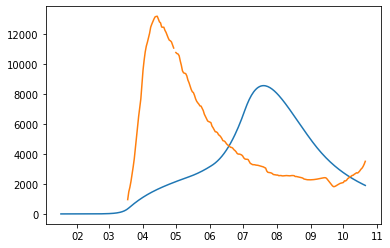

best_error: 7.802604099670288
vector: [array([7.8026041])]
mean_deaths 0.12192948304788917
[7.33485838e+01 1.33415567e+00 6.43352578e-01 7.69984562e-01
 3.97526181e-01 9.39337732e-02 5.85251580e-02 7.95375744e-02
 6.43981301e-01 1.06654182e+00 1.14473986e+00 8.94318276e-01
 8.79132138e-01 9.13790110e-01 1.17380860e+00 1.20833652e+00
 8.28710089e-01]


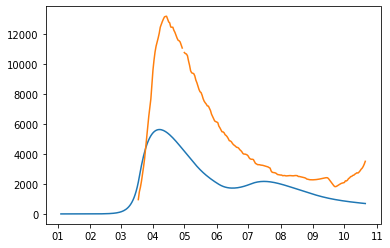

best_error: 8.673454235794178
vector: [array([8.67345424])]
mean_deaths 0.160579358608545
[7.38613688e+01 1.01307459e+00 5.53653433e-01 9.08140589e-01
 5.37891169e-01 8.84999031e-02 3.88649097e-01 6.15243403e-02
 6.62452402e-01 1.03182443e+00 8.37249808e-01 1.16717454e+00
 9.37978874e-01 1.00341457e+00 1.06980187e+00 9.49815403e-01
 7.92489838e-01]


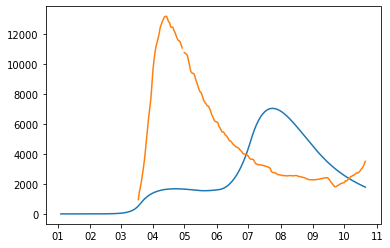

best_error: 3.8014240025408794
vector: [array([3.801424])]
mean_deaths 0.05091373658965454
[8.30987340e+01 1.92364379e+00 8.63946601e-01 8.88472453e-01
 6.50550134e-01 8.12763432e-02 6.84829978e-01 2.54566591e-02
 8.22857721e-01 1.12344046e+00 1.03029782e+00 8.21819730e-01
 1.11703608e+00 9.06209077e-01 7.67768647e-01 8.69173491e-01
 8.47163159e-01]


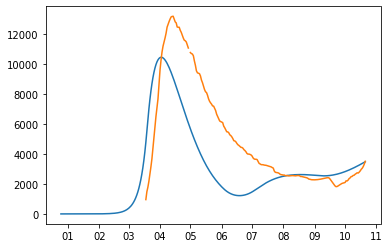

best_error: 5.10047400488422
vector: [array([5.100474])]
mean_deaths 0.03629338923465382
[8.79809221e+01 1.15406662e+00 7.33547191e-01 7.67441967e-01
 4.13318457e-01 8.39848267e-02 9.45947546e-01 3.19821234e-02
 5.74668134e-01 1.24765163e+00 9.70274306e-01 7.83376227e-01
 1.20293827e+00 8.31882660e-01 9.45333434e-01 1.04807518e+00
 8.46660165e-01]


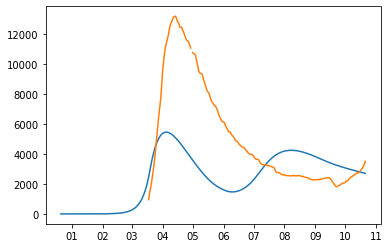

best_error: 8.315910786841096
vector: [array([8.31591079])]
mean_deaths 0.48206942715534995
[9.89742577e+01 1.88531541e+00 1.07886391e+00 6.23067381e-01
 6.45115546e-01 3.77118588e-02 4.92420814e-01 1.11644366e-01
 6.71973058e-01 1.22005678e+00 9.23771465e-01 1.02535485e+00
 9.85287412e-01 9.86012841e-01 1.16829394e+00 9.39475082e-01
 9.23190914e-01]


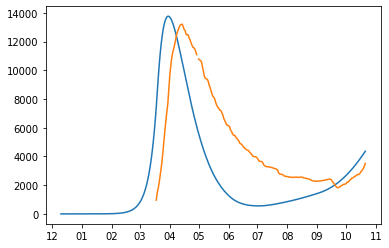

best_error: 7.28849208869173
vector: [array([7.28849209])]
mean_deaths 0.22322928137898526
[7.48060383e+01 1.22763885e+00 6.67986638e-01 8.75639552e-01
 3.07330029e-01 3.27616507e-02 9.04655961e-01 8.74906632e-02
 7.79317148e-01 1.09877855e+00 1.20492297e+00 1.00451714e+00
 1.20050234e+00 9.96994586e-01 8.39064954e-01 8.26126340e-01
 8.61797388e-01]


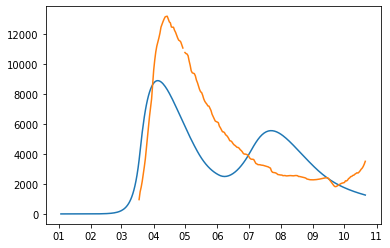

best_error: 5.245090429813763
vector: [array([5.24509043])]
mean_deaths 0.36680035146570034
[7.50791214e+01 1.86319124e+00 7.48133795e-01 8.29726368e-01
 5.74911206e-01 3.74737025e-02 2.12888805e-01 1.60485696e-01
 8.96135712e-01 9.81179305e-01 1.05096008e+00 8.01595080e-01
 1.01471182e+00 7.72289609e-01 7.50376644e-01 8.71182951e-01
 1.02457156e+00]


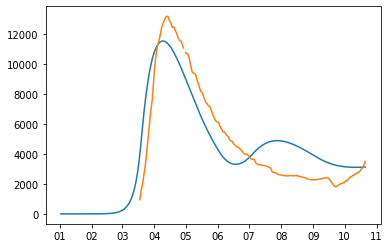

best_error: 5.903656557937993
vector: [array([5.90365656])]
mean_deaths 0.12777618687152983
[9.87954539e+01 1.83244825e+00 9.63864894e-01 8.94586397e-01
 5.87969210e-01 5.95316178e-02 4.31407368e-01 1.79133755e-01
 9.80330453e-01 1.18854774e+00 8.41818590e-01 1.01294259e+00
 1.15445264e+00 8.96718023e-01 1.01208592e+00 9.53319481e-01
 8.95501345e-01]


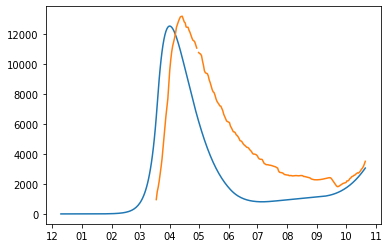

best_error: 8.146000884926815
vector: [array([8.14600088])]
mean_deaths 0.14773193472929816
[7.32094356e+01 1.81820651e+00 6.43142942e-01 9.33013432e-01
 9.08437870e-01 4.09200147e-02 4.97832409e-01 2.65600898e-02
 9.40721786e-01 1.12337511e+00 1.03855265e+00 8.93233610e-01
 1.20902379e+00 9.89103375e-01 1.02280022e+00 1.14512781e+00
 9.41346752e-01]


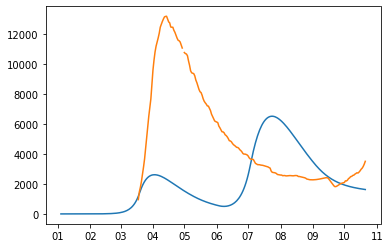

best_error: 6.7361538708501545
vector: [array([6.73615387])]
mean_deaths 0.7286261265100924
[75.5415641   1.49559553  0.84898173  0.76678795  0.62312052  0.0987318
  0.5473168   0.09543479  0.82309914  0.99531004  1.2141515   0.80852116
  0.9336473   1.03482832  0.7808775   1.06907085  1.01970711]


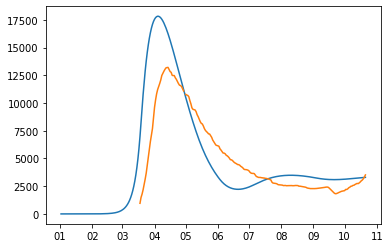

best_error: 7.912614655783006
vector: [array([7.91261466])]
mean_deaths 0.5210320260570563
[8.21880642e+01 1.54713526e+00 7.24605595e-01 4.37090202e-01
 6.37191452e-01 4.80715154e-02 7.04607873e-02 5.07583311e-02
 6.66087764e-01 1.15766078e+00 1.09719882e+00 9.99071237e-01
 1.14860270e+00 1.02557868e+00 1.18957056e+00 7.50589236e-01
 1.04722769e+00]


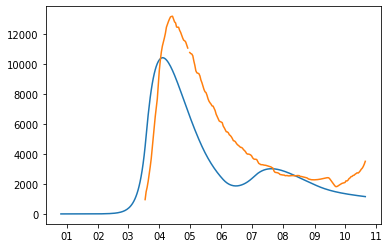

best_error: 6.378473543431675
vector: [array([6.37847354])]
mean_deaths 0.033755639807328874
[7.69991654e+01 1.42417383e+00 7.57475432e-01 8.53614316e-01
 4.65756154e-01 8.12763432e-02 6.01639344e-01 5.60249810e-02
 8.03151665e-01 1.12640115e+00 1.24346037e+00 9.23407203e-01
 1.07637326e+00 8.25044557e-01 8.56089791e-01 8.69173491e-01
 9.13093886e-01]


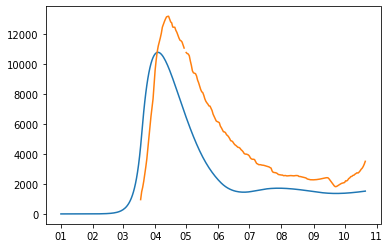

best_error: 7.428855219699546
vector: [array([7.42885522])]
mean_deaths 0.6058778338423694
[7.68847553e+01 1.29171188e+00 6.88689415e-01 7.78252910e-01
 8.58696055e-01 7.01974340e-02 6.80477563e-01 1.95031932e-01
 9.17516895e-01 1.22381517e+00 8.59184085e-01 9.34101319e-01
 1.18162143e+00 7.94912297e-01 8.59610020e-01 9.41515979e-01
 9.30162555e-01]


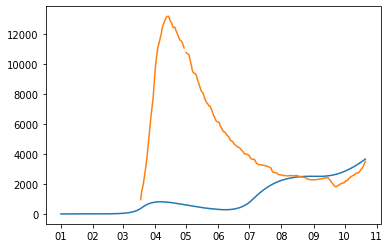

best_error: 6.905107591419357
vector: [array([6.90510759])]
mean_deaths 0.1381760677918498
[9.12364168e+01 1.82216037e+00 9.71910131e-01 8.17262378e-01
 9.55381873e-01 2.03445672e-02 6.33384605e-01 1.25687515e-02
 5.66370171e-01 1.24877640e+00 1.11280671e+00 7.56113443e-01
 9.30009295e-01 9.54417257e-01 8.27792233e-01 1.03964643e+00
 8.09478374e-01]


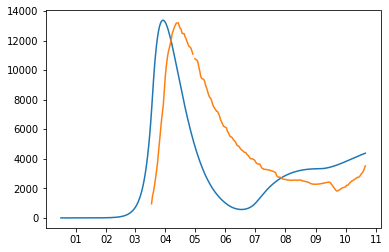

best_error: 6.485037301507157
vector: [array([6.4850373])]
mean_deaths 0.13660672765686263
[7.59720107e+01 1.97523444e+00 7.27066277e-01 6.19148216e-01
 5.32976312e-01 5.15719429e-02 4.90490455e-01 4.81703718e-02
 7.73790326e-01 1.06267332e+00 1.11426566e+00 9.81801965e-01
 1.02727522e+00 7.76706684e-01 1.12492315e+00 8.49925899e-01
 1.08985267e+00]


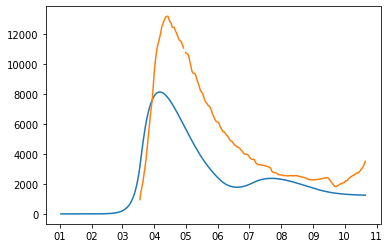

best_error: 5.728097605386949
vector: [array([5.72809761])]
mean_deaths 0.12612970749664149
[83.36444837  1.59458138  0.71185218  0.64237247  0.62817452  0.08359059
  0.7359991   0.17382297  0.77523359  1.10554438  0.84474408  1.14350489
  0.97365237  1.1847076   1.21410724  0.85761085  0.90481566]


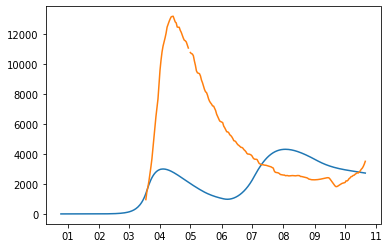

best_error: 5.898931765800001
vector: [array([5.89893177])]
mean_deaths 0.5021708668311886
[69.02395317  1.8312905   0.81465672  0.39308503  0.12928946  0.08444639
  0.08242273  0.15443661  0.80695684  1.00295453  1.23072338  1.07296222
  1.10015771  0.99456341  0.92956174  0.84131568  0.96793781]


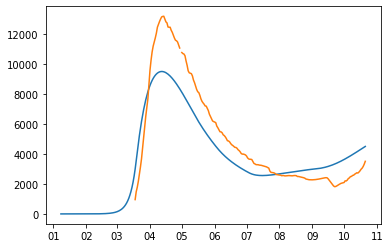

best_error: 7.04701560567302
vector: [array([7.04701561])]
mean_deaths 0.3036620895533586
[9.44863811e+01 1.65019377e+00 8.51611506e-01 6.51153404e-01
 6.11786813e-01 7.27543619e-03 6.55049502e-01 2.64390889e-02
 8.17575534e-01 1.24606991e+00 8.75590161e-01 1.01089898e+00
 1.08014462e+00 1.06267385e+00 1.10317965e+00 1.09033433e+00
 1.04117375e+00]


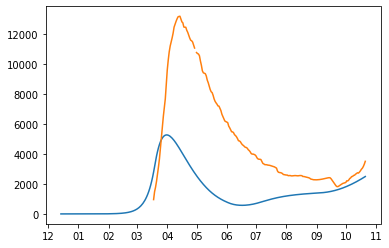

best_error: 3.745460140150855
vector: [array([3.74546014])]
mean_deaths 0.06610112921943669
[7.87182224e+01 1.84816120e+00 7.19048550e-01 1.71544525e-01
 2.44397798e-01 1.96746695e-03 6.70164403e-01 1.21782399e-01
 9.71393334e-01 1.12161978e+00 9.37395214e-01 1.15627181e+00
 1.03983809e+00 9.75031748e-01 8.36191395e-01 8.85572888e-01
 1.15729343e+00]


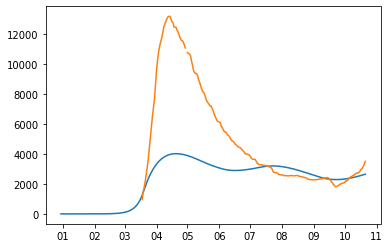

best_error: 4.601716746046546
vector: [array([4.60171675])]
mean_deaths 0.14827315331789828
[9.12597970e+01 1.69515546e+00 7.92176676e-01 1.17737590e-01
 1.60598058e-01 1.30380067e-02 7.24810903e-01 1.08172201e-01
 8.57361644e-01 1.21920441e+00 8.82022384e-01 1.15616823e+00
 1.13216256e+00 9.79530859e-01 9.05156881e-01 9.65963028e-01
 9.32655231e-01]


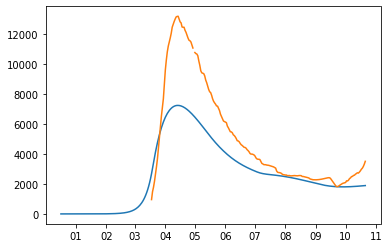

best_error: 5.656813326671021
vector: [array([5.65681333])]
mean_deaths 0.05987620267088239
[9.69633999e+01 1.87651377e+00 7.68840560e-01 1.36479544e-01
 2.55704510e-01 3.96340779e-03 4.06334235e-01 1.20861551e-01
 7.61168777e-01 1.17464920e+00 7.69042075e-01 1.10489657e+00
 9.60684127e-01 8.59680030e-01 8.17650902e-01 9.00421708e-01
 1.05258416e+00]


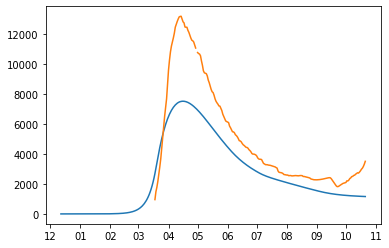

best_error: 5.6614435714161955
vector: [array([5.66144357])]
mean_deaths 0.11072100360737001
[6.50077306e+01 1.55266883e+00 6.70313057e-01 2.95338126e-01
 1.22913308e-02 3.12438162e-02 9.41261988e-01 1.26249157e-01
 9.40176870e-01 1.07707261e+00 1.01504610e+00 1.09317466e+00
 8.56796843e-01 1.13402182e+00 1.23317842e+00 7.95632688e-01
 9.51049576e-01]


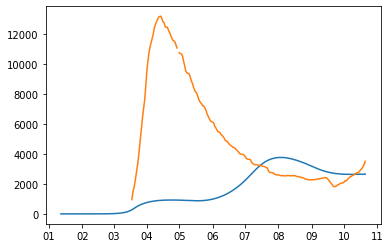

best_error: 5.7706594427875615
vector: [array([5.77065944])]
mean_deaths 0.07474698169079518
[7.79665302e+01 1.26665316e+00 6.40784410e-01 1.77777284e-01
 4.32661617e-01 3.49035300e-03 1.00115039e-01 1.58677576e-01
 9.78154202e-01 1.20550591e+00 9.89925926e-01 1.12808547e+00
 1.14049199e+00 1.04252387e+00 1.02202967e+00 1.09996823e+00
 1.20859256e+00]


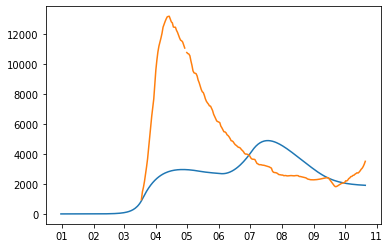

best_error: 5.794335966592816
vector: [array([5.79433597])]
mean_deaths 0.27261445872881857
[9.12969470e+01 1.48046044e+00 8.00771399e-01 9.15112314e-01
 6.18527220e-01 2.04152314e-02 6.59457395e-01 4.91805807e-02
 9.81568757e-01 1.20185011e+00 9.00864901e-01 1.17904534e+00
 1.14457363e+00 9.88327162e-01 7.80977839e-01 7.76182773e-01
 8.87323420e-01]
best_error: 5.114020539689679
vector: [array([5.11402054])]
mean_deaths 0.5131650387070551
[8.35319647e+01 1.77101594e+00 7.61797541e-01 1.52946966e-01
 8.42541050e-02 6.82183729e-02 1.92253817e-01 1.98174329e-01
 9.27532123e-01 1.08842092e+00 8.88389642e-01 8.57519706e-01
 1.09677160e+00 8.10669783e-01 8.28195133e-01 9.55986067e-01
 9.92399053e-01]


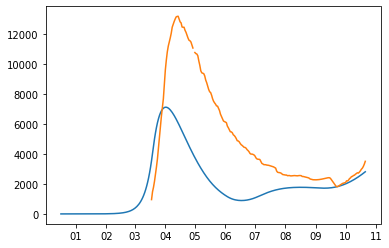

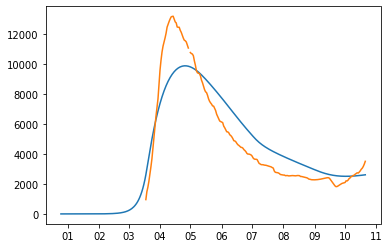

best_error: 4.781268247581067
vector: [array([4.78126825])]
mean_deaths 0.00879166503613849
[7.49267514e+01 1.77113015e+00 7.85590600e-01 5.16754819e-01
 3.93072329e-01 3.72690542e-02 5.19613203e-01 5.58864571e-02
 9.20634003e-01 1.07988788e+00 1.20673467e+00 1.17406238e+00
 1.09631730e+00 1.11222852e+00 7.93992767e-01 7.87153063e-01
 1.21768718e+00]


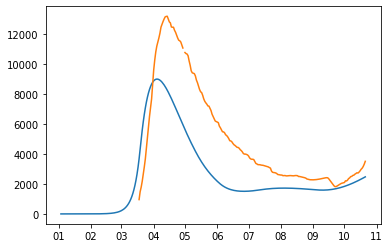

best_error: 6.3889604707664995
vector: [array([6.38896047])]
mean_deaths 0.27791503926562755
[7.30699988e+01 1.76135910e+00 6.37188380e-01 4.95759994e-01
 5.55828583e-01 1.36194124e-02 6.05588870e-01 1.23671477e-01
 8.72952472e-01 1.02381381e+00 8.33142988e-01 1.14594060e+00
 9.35123168e-01 1.06204916e+00 8.15977109e-01 8.92488719e-01
 9.62421882e-01]


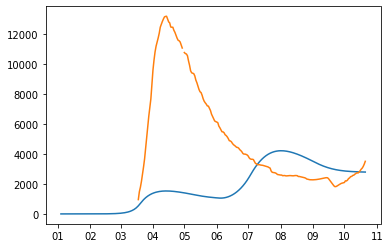

best_error: 5.275997269369326
vector: [array([5.27599727])]
mean_deaths 0.14905412081143138
[7.32531575e+01 1.74124162e+00 7.22022488e-01 9.45617695e-01
 7.48690668e-02 6.89727448e-02 5.67159542e-01 8.40197733e-02
 6.66929567e-01 9.46238485e-01 8.88973224e-01 1.12045316e+00
 1.01374614e+00 9.36339920e-01 9.83247680e-01 9.37770714e-01
 1.18622810e+00]


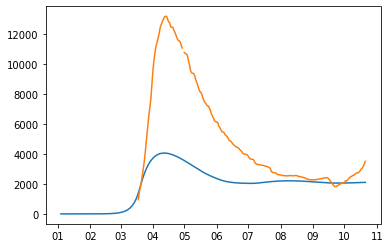

best_error: 4.856305355842785
vector: [array([4.85630536])]
mean_deaths 0.13857341692345143
[7.96591261e+01 1.63810665e+00 6.69167955e-01 1.74135438e-01
 3.90632579e-01 1.01509792e-02 3.42620534e-01 1.31629337e-01
 8.83617522e-01 1.12784837e+00 8.03534062e-01 9.28534705e-01
 9.07666772e-01 7.78030812e-01 1.06622153e+00 8.90906853e-01
 1.14457328e+00]


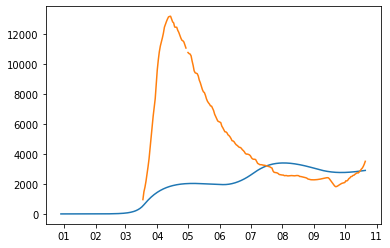

best_error: 5.760836850349995
vector: [array([5.76083685])]
mean_deaths 0.2683103574273305
[71.14582829  1.59889406  0.71479812  0.16526989  0.18103247  0.08652604
  0.22602848  0.13134405  0.72461811  1.14344061  1.01104824  1.08362203
  1.04569102  1.05810935  1.08452369  0.89098026  1.15538308]


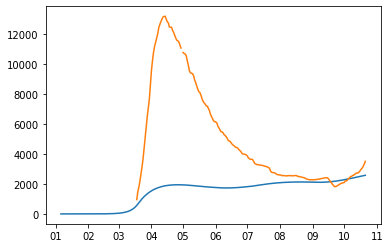

best_error: 5.116867800504469
vector: [array([5.1168678])]
mean_deaths 0.3456275431296256
[8.14710796e+01 1.80537762e+00 8.66883166e-01 3.09458934e-01
 3.31097865e-01 9.45569602e-03 8.06663132e-01 1.55208744e-01
 7.56598866e-01 1.18614343e+00 1.14179338e+00 9.25792062e-01
 1.15427581e+00 8.65620441e-01 1.02606776e+00 1.04810117e+00
 1.14885219e+00]


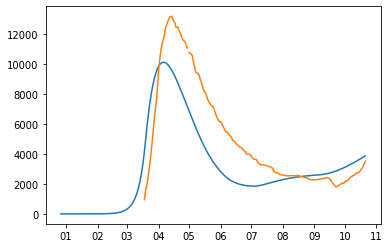

best_error: 4.584822450341235
vector: [array([4.58482245])]
mean_deaths 0.2377393709625815
[7.82232319e+01 1.71074932e+00 7.88983921e-01 1.14132658e-01
 1.26681078e-02 6.24655967e-02 6.94117436e-01 1.27158915e-01
 6.53217741e-01 1.10928057e+00 9.25352904e-01 1.21145371e+00
 8.64750861e-01 1.09253590e+00 9.47505999e-01 1.13133849e+00
 1.13939908e+00]


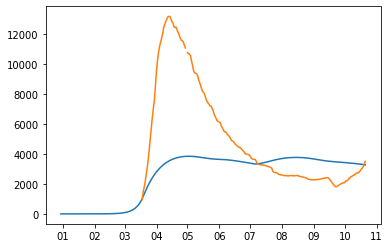

best_error: 4.688421281696
vector: [array([4.68842128])]
mean_deaths 0.021217128364214227
[9.12969470e+01 1.63456732e+00 8.00771399e-01 4.17972044e-01
 3.02561864e-01 5.92755315e-02 6.59457395e-01 1.09375647e-01
 9.81568757e-01 1.17486453e+00 8.41067800e-01 9.45009933e-01
 1.03118662e+00 9.47223537e-01 1.21951146e+00 1.05358531e+00
 9.28116366e-01]


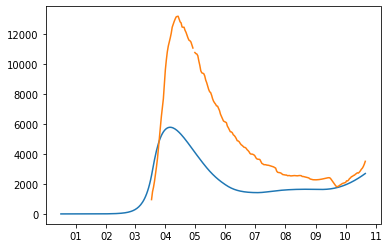

best_error: 5.043441897556815
vector: [array([5.0434419])]
mean_deaths 0.0030385014267190883
[78.843144    1.3964998   0.70043467  0.74144713  0.40264109  0.078903
  0.5118419   0.10619837  0.51220261  1.04282827  0.87712584  0.9988326
  0.92488211  0.9075613   0.9098153   1.01686336  0.84467183]


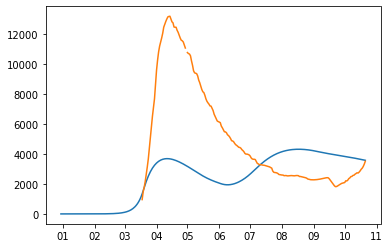

best_error: 4.673741532990881
vector: [array([4.67374153])]
mean_deaths 0.20012767743649854
[7.94176175e+01 1.87917800e+00 7.19048550e-01 1.75795006e-01
 2.44397798e-01 1.96746695e-03 8.28381632e-01 1.02002956e-01
 9.02834948e-01 1.13760977e+00 8.48510960e-01 1.18966348e+00
 1.09257929e+00 9.09998938e-01 8.33138485e-01 7.94601376e-01
 1.15729343e+00]


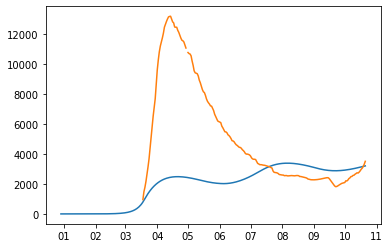

best_error: 4.46399056120344
vector: [array([4.46399056])]
mean_deaths 0.6826174969740025
[7.56498418e+01 1.81264777e+00 8.70446723e-01 1.73248906e-02
 9.72042244e-02 2.40394516e-02 6.89731901e-01 3.59950042e-02
 8.95687629e-01 1.14661467e+00 1.19466762e+00 1.21069519e+00
 9.31264757e-01 1.13958365e+00 7.90091146e-01 8.25326279e-01
 1.21608932e+00]


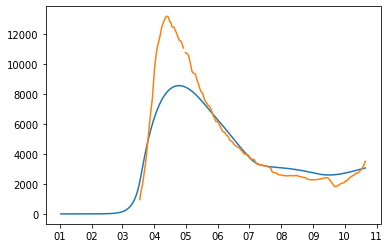

best_error: 3.4617646899065466
vector: [array([3.46176469])]
mean_deaths 0.1027339383798599
[7.66276361e+01 1.91394830e+00 7.54720535e-01 4.35860192e-01
 2.89660704e-01 3.62639136e-02 8.27552483e-01 1.53111713e-01
 9.86609633e-01 1.06605173e+00 1.07149866e+00 9.96546414e-01
 1.21558218e+00 9.92599225e-01 7.53719112e-01 8.19649464e-01
 1.05810845e+00]


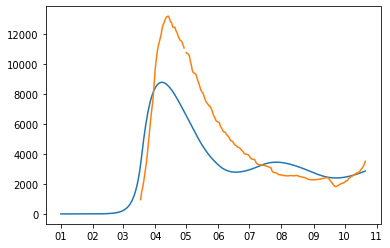

best_error: 6.322115456796029
vector: [array([6.32211546])]
mean_deaths 0.2911038123109272
[8.25355334e+01 1.63648022e+00 6.72431028e-01 6.66581289e-02
 8.88636192e-02 3.05557144e-02 4.18960537e-01 8.27849574e-02
 9.79217093e-01 1.13163734e+00 8.82121937e-01 1.04917057e+00
 1.12656422e+00 1.04784393e+00 8.84059591e-01 8.79720573e-01
 1.17744281e+00]


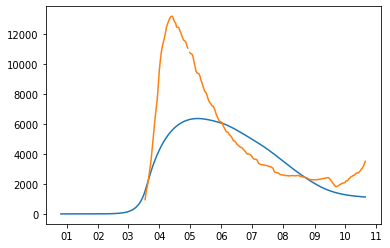

best_error: 5.030500825570634
vector: [array([5.03050083])]
mean_deaths 0.3042426646112922
[8.46757468e+01 1.91178173e+00 8.18637579e-01 3.86505351e-01
 5.26640531e-01 2.75530703e-02 8.20733674e-01 8.50842579e-02
 6.82466856e-01 1.20300341e+00 9.70660112e-01 1.11063395e+00
 1.08736257e+00 1.04378470e+00 8.36477959e-01 9.35202936e-01
 7.96075340e-01]


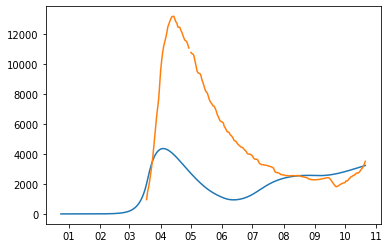

best_error: 3.5670412533166425
vector: [array([3.56704125])]
mean_deaths 0.031444018384778886
[7.71875925e+01 1.67420214e+00 7.05155907e-01 1.99644521e-01
 6.27446014e-02 1.90068316e-02 5.96206125e-01 1.65315495e-01
 9.45844253e-01 1.09057997e+00 9.35342204e-01 8.16095589e-01
 1.13117653e+00 1.02073030e+00 8.36567919e-01 9.32581017e-01
 1.09863839e+00]


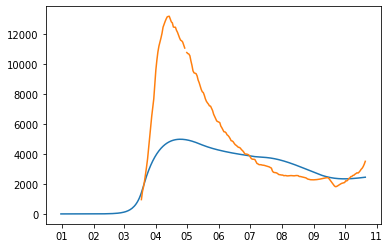

best_error: 6.198809786121112
vector: [array([6.19880979])]
mean_deaths 0.883769958610384
[7.86812473e+01 1.91806864e+00 8.64360952e-01 3.47154810e-01
 3.03597993e-01 1.17406913e-02 9.08604784e-01 1.52547936e-01
 9.86609633e-01 1.06605173e+00 1.15611865e+00 9.96546414e-01
 1.01582991e+00 8.85586055e-01 7.92848706e-01 8.19649464e-01
 1.12150823e+00]


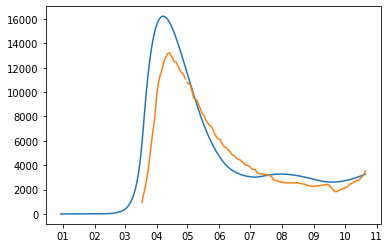

best_error: 6.109584222329802
vector: [array([6.10958422])]
mean_deaths 0.1212718202779921
[8.26359089e+01 1.75265882e+00 7.54221780e-01 2.48618781e-01
 4.64030485e-01 3.59422048e-02 6.55456991e-01 1.88410585e-01
 5.57101817e-01 1.20718483e+00 1.01925522e+00 1.18671075e+00
 1.13976968e+00 1.10344552e+00 1.07230727e+00 9.01171058e-01
 8.61522488e-01]


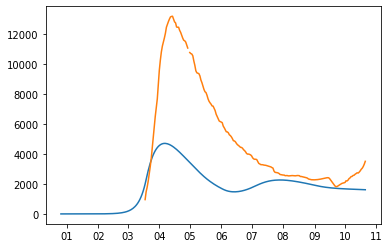

best_error: 4.353527615754445
vector: [array([4.35352762])]
mean_deaths 0.40925163062110576
[71.43590974  1.94464222  0.8486516   0.49157087  0.28539703  0.08297964
  0.42734127  0.1308899   0.53253718  0.98007695  1.22583927  0.89634734
  0.97931402  0.91215378  0.77260977  0.82427229  1.19598636]


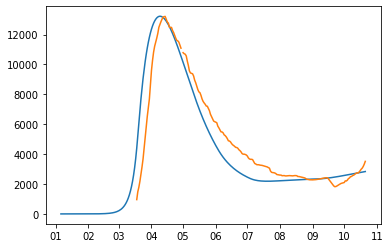

best_error: 3.2519213195729746
vector: [array([3.25192132])]
mean_deaths 0.01997948535194394
[7.95802590e+01 1.85213545e+00 7.61632214e-01 2.90010892e-01
 2.93234428e-02 9.40122411e-02 5.21069658e-01 1.95234213e-01
 7.47757326e-01 1.06576072e+00 9.25160705e-01 7.56598726e-01
 1.23835348e+00 9.82135004e-01 8.35218635e-01 1.13899793e+00
 1.09228339e+00]


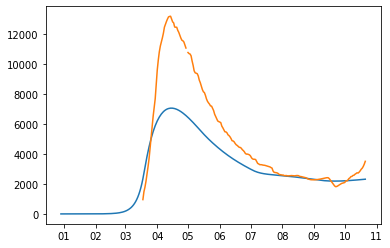

best_error: 3.8606707744232103
vector: [array([3.86067077])]
mean_deaths 0.09133879651939893
[8.19060798e+01 1.52530732e+00 7.02548758e-01 7.02629409e-01
 5.55033527e-01 7.04901500e-02 1.81447717e-01 1.99172766e-01
 9.67903899e-01 1.06953846e+00 9.08411857e-01 9.63675987e-01
 1.01754779e+00 9.30837299e-01 9.59330257e-01 1.01281495e+00
 1.10492795e+00]
best_error: 5.727955150170981
vector: [array([5.72795515])]
mean_deaths 0.18357927604177418
[6.95190223e+01 1.75024795e+00 6.75866366e-01 4.97921114e-01
 5.38304475e-01 6.13798342e-03 6.34281190e-01 1.57671610e-01
 7.67398199e-01 1.08080581e+00 1.11709506e+00 8.50707626e-01
 1.14346911e+00 9.52097763e-01 8.79559422e-01 1.07142096e+00
 1.15331892e+00]
best_error: 3.8054862306775754
vector: [array([3.80548623])]
mean_deaths 0.09412561971148427
[7.61006482e+01 1.56239348e+00 7.36447347e-01 4.25917907e-01
 3.39200032e-01 3.13067446e-02 4.37965059e-01 5.54974711e-02
 8.65445982e-01 1.10768342e+00 1.09767167e+00 1.18801063e+00
 1.08728653e+00 9

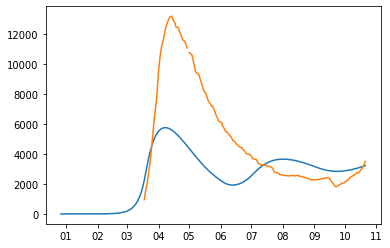

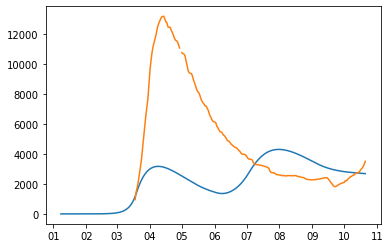

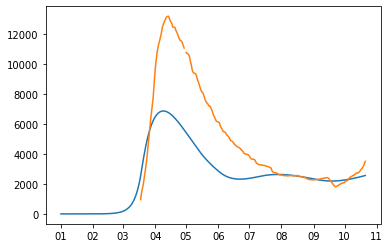

best_error: 4.354597526340575
vector: [array([4.35459753])]
mean_deaths 0.041543640940414815
[72.61111527  1.56668578  0.74838873  0.78180669  0.46995861  0.07766096
  0.3536477   0.1142376   0.99385709  1.05551573  1.17829866  0.85829529
  1.10451038  1.14390186  0.93761571  0.75241071  0.85911281]


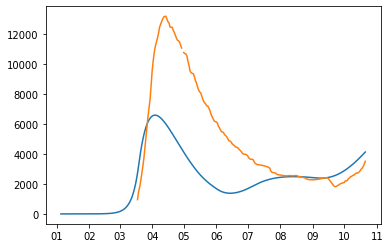

best_error: 4.009496651752942
vector: [array([4.00949665])]
mean_deaths 0.06550120891440772
[8.53162794e+01 1.56239348e+00 7.36447347e-01 2.94916547e-01
 1.51019091e-01 6.17042478e-02 5.51631229e-01 1.09121289e-01
 8.65445982e-01 1.10768342e+00 8.12146776e-01 1.18801063e+00
 1.08728653e+00 8.50700452e-01 7.59498525e-01 1.06628018e+00
 1.00825653e+00]
best_error: 5.708780354958938
vector: [array([5.70878035])]
mean_deaths 0.2986307773036113
[7.79126054e+01 1.88824832e+00 7.77228778e-01 7.10156771e-01
 2.57756834e-01 3.54337566e-02 8.86017982e-01 1.47852002e-01
 7.81090933e-01 9.75275340e-01 9.84221942e-01 9.02305015e-01
 1.13618987e+00 1.17543748e+00 8.39428752e-01 1.18538028e+00
 1.10466456e+00]


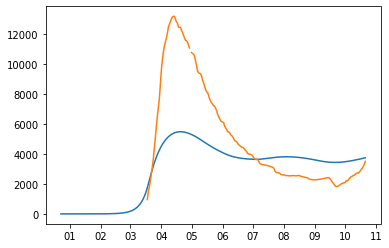

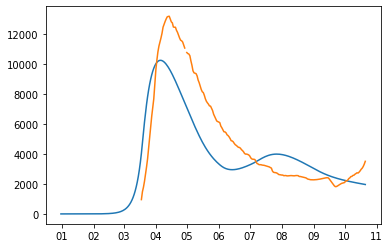

best_error: 3.982211790560911
vector: [array([3.98221179])]
mean_deaths 0.08899357592975717
[7.48990485e+01 1.72192854e+00 7.19418519e-01 2.40019816e-01
 4.78059545e-02 9.18547687e-02 3.54187888e-01 1.03760330e-01
 6.02078288e-01 1.06677672e+00 9.62483127e-01 8.57519706e-01
 1.09677160e+00 9.82693042e-01 8.79588212e-01 1.16844476e+00
 9.87005040e-01]


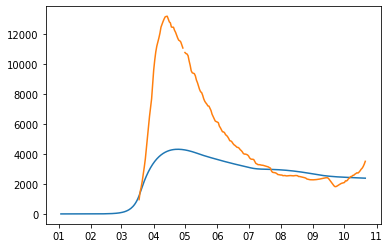

best_error: 3.6461257905145423
vector: [array([3.64612579])]
mean_deaths 0.22743740199974338
[7.95802590e+01 1.78204002e+00 7.61632214e-01 5.24725949e-01
 5.21287123e-02 2.03527660e-02 6.51154202e-01 7.53205139e-02
 7.94405290e-01 1.02878509e+00 9.25160705e-01 1.17953579e+00
 1.24821921e+00 8.15939581e-01 8.35218635e-01 8.81078486e-01
 9.13755158e-01]


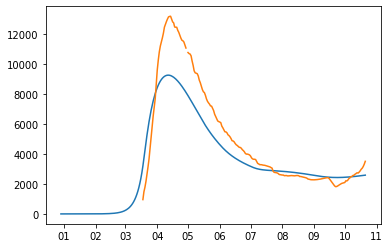

best_error: 4.404130952813156
vector: [array([4.40413095])]
mean_deaths 0.3125527238036115
[6.35678805e+01 1.85629371e+00 6.96563893e-01 4.34250908e-01
 5.74841645e-02 5.82366892e-02 2.45912491e-01 4.55549736e-02
 8.25527645e-01 9.39425124e-01 1.22003450e+00 8.13383601e-01
 1.22876543e+00 1.03255325e+00 9.68123698e-01 1.24711123e+00
 9.18348925e-01]


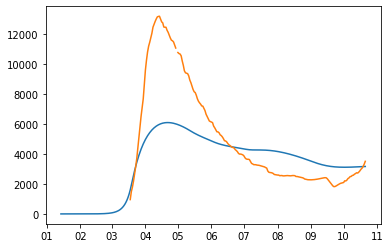

best_error: 3.547922602886925
vector: [array([3.5479226])]
mean_deaths 0.029560777007256164
[82.00524084  1.88772365  0.78356156  0.42649331  0.1512745   0.09409105
  0.224893    0.17119679  0.72870491  1.01550595  0.85038041  0.95946933
  1.15470985  1.14853366  0.79141557  1.07818965  1.11010563]


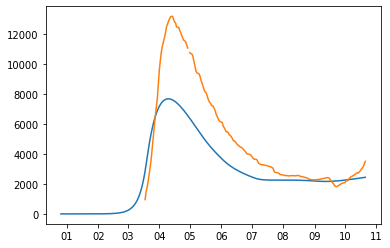

best_error: 3.9728231957752493
vector: [array([3.9728232])]
mean_deaths 0.11140842416247018
[7.72782725e+01 1.65019377e+00 7.37480850e-01 5.71685835e-01
 3.01597802e-01 6.53010918e-02 3.34557974e-01 2.64390889e-02
 8.26160983e-01 1.05939766e+00 9.61590242e-01 1.01089898e+00
 1.08014462e+00 9.24350875e-01 9.31248516e-01 1.09033433e+00
 1.12140622e+00]


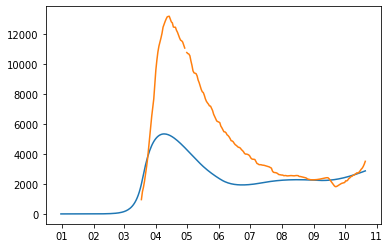

best_error: 3.995458408089672
vector: [array([3.99545841])]
mean_deaths 0.025572753013067388
[8.44455689e+01 1.57874811e+00 7.56119637e-01 3.22593966e-01
 3.60485719e-01 8.31696933e-02 4.51048882e-01 1.19827556e-01
 8.20660575e-01 1.17015226e+00 9.17582226e-01 7.66859392e-01
 1.01952875e+00 9.03939980e-01 1.19062731e+00 1.22423362e+00
 1.15275617e+00]


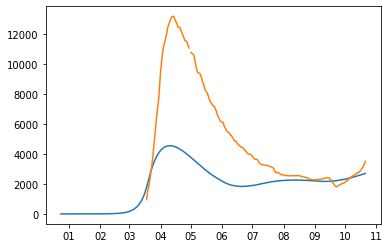

best_error: 3.609958014490795
vector: [array([3.60995801])]
mean_deaths 0.23251907321114218
[79.5227161   1.84586554  0.79230769  0.32765017  0.23592354  0.09505318
  0.62404088  0.17763084  0.76423275  1.07595898  0.97529661  1.10154186
  1.19393045  1.12736085  0.88333829  0.90606483  1.23833445]


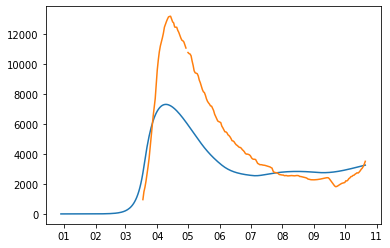

best_error: 3.8536432659571926
vector: [array([3.85364327])]
mean_deaths 0.10883388620770504
[8.27863923e+01 1.89961164e+00 7.64870006e-01 2.32134114e-01
 2.43078751e-01 5.93852102e-02 6.83784284e-01 3.23249315e-02
 6.90881983e-01 1.12331064e+00 8.98662979e-01 8.45945557e-01
 1.13131204e+00 9.41690156e-01 8.09321853e-01 1.05599948e+00
 1.09293889e+00]


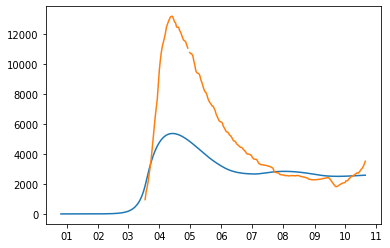

best_error: 4.253776377408782
vector: [array([4.25377638])]
mean_deaths 0.06903887048440085
[7.50578834e+01 1.93693180e+00 8.94481116e-01 7.68332322e-01
 3.35733924e-01 9.14790058e-03 5.69818621e-01 1.82332679e-01
 6.28861983e-01 1.01973214e+00 1.12634781e+00 8.29016879e-01
 1.14962443e+00 1.14837182e+00 8.99410775e-01 1.08824012e+00
 9.42054948e-01]


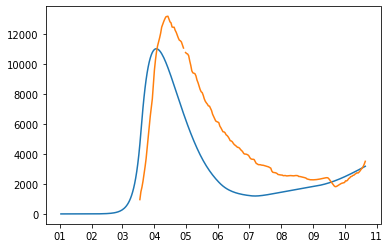

best_error: 3.567150873009738
vector: [array([3.56715087])]
mean_deaths 0.11916547769716157
[82.46205336  1.52130113  0.75794965  0.47445027  0.14864492  0.09626444
  0.60113954  0.10753051  0.726928    1.10587843  0.929624    1.10183915
  1.24773233  0.93438384  0.89153968  1.00735497  1.07047363]


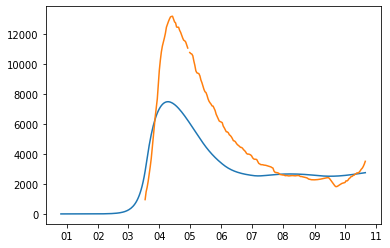

best_error: 4.587344945598474
vector: [array([4.58734495])]
mean_deaths 0.2033512110604846
[8.18428487e+01 1.91408863e+00 7.81299320e-01 2.33727412e-01
 9.72042244e-02 2.40394516e-02 1.93197211e-01 3.59950042e-02
 8.95687629e-01 1.09191901e+00 8.26791887e-01 1.21069519e+00
 1.13933218e+00 1.12686092e+00 9.26818653e-01 1.17905732e+00
 1.21608932e+00]


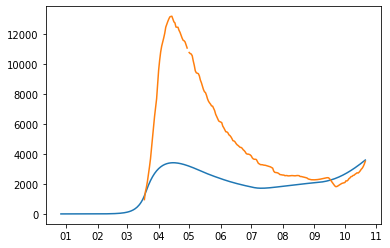

best_error: 3.8883291215217604
vector: [array([3.88832912])]
mean_deaths 0.1416912152652457
[7.58493197e+01 1.83183543e+00 7.78742132e-01 3.20892071e-01
 6.45672231e-02 8.93440666e-02 6.55456991e-01 1.88410585e-01
 8.48907661e-01 1.03291067e+00 1.05220919e+00 9.92601427e-01
 1.01832733e+00 1.10344552e+00 8.02031850e-01 9.11480481e-01
 1.05825002e+00]


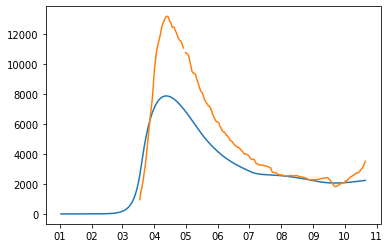

best_error: 3.389396160593451
vector: [array([3.38939616])]
mean_deaths 0.14092799327959749
[8.18819743e+01 1.91391960e+00 7.84708653e-01 3.48737824e-01
 6.36643505e-02 5.07242484e-02 8.82677001e-01 1.53424162e-01
 9.74317750e-01 1.07381864e+00 9.25826844e-01 9.07348462e-01
 1.14555036e+00 1.03108031e+00 8.69320266e-01 1.14479233e+00
 1.09739908e+00]


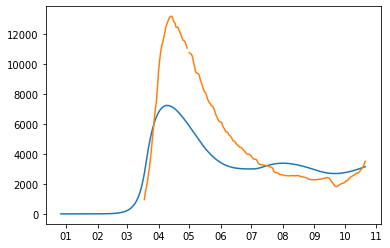

best_error: 3.301898766703016
vector: [array([3.30189877])]
mean_deaths 0.05937269020299113
[8.57236441e+01 1.87108734e+00 7.65965265e-01 3.72174647e-01
 4.60920496e-02 1.29215355e-02 4.26306768e-01 1.51762160e-01
 9.46952330e-01 1.04967270e+00 7.71581228e-01 1.15680722e+00
 1.22799621e+00 1.04745321e+00 9.05638894e-01 1.06651553e+00
 8.17683900e-01]


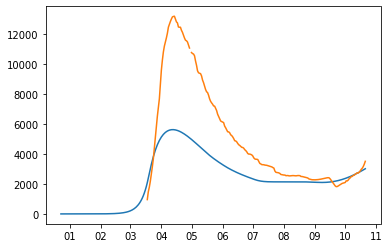

best_error: 3.6843201294902803
vector: [array([3.68432013])]
mean_deaths 0.013830797303636682
[9.14972630e+01 1.40793274e+00 8.21532870e-01 2.74080083e-01
 3.59288397e-01 6.59829933e-02 4.92039591e-01 1.65241667e-01
 8.63188388e-01 1.22430173e+00 9.31123110e-01 8.26063449e-01
 8.58233825e-01 1.03182735e+00 9.24810130e-01 1.09959349e+00
 1.11039652e+00]


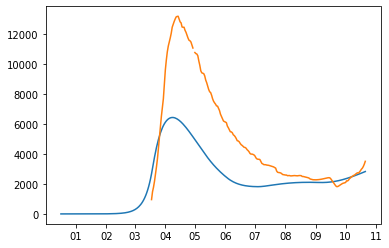

best_error: 4.113915735524914
vector: [array([4.11391574])]
mean_deaths 0.1744752293027635
[8.20882588e+01 1.76928345e+00 8.53333316e-01 4.84180526e-01
 1.82426016e-02 8.07945372e-02 8.12081034e-01 9.11114824e-02
 8.70155983e-01 1.12453315e+00 9.80122187e-01 8.38082215e-01
 1.22106342e+00 1.00281416e+00 7.90805276e-01 1.09714350e+00
 1.08024895e+00]
best_error: 4.149026188314067
vector: [array([4.14902619])]
mean_deaths 0.08757792180190788
[7.61097101e+01 1.36696673e+00 7.00097594e-01 3.53401540e-01
 2.63007266e-02 9.66560452e-02 2.11745873e-01 1.14237601e-01
 6.22311982e-01 1.08175969e+00 9.45152537e-01 1.15419474e+00
 8.66454385e-01 8.61625335e-01 8.03753593e-01 1.13676720e+00
 1.09303540e+00]


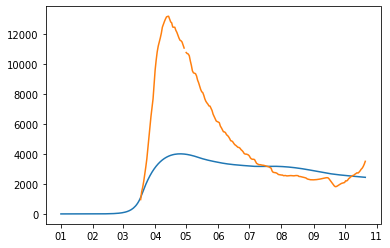

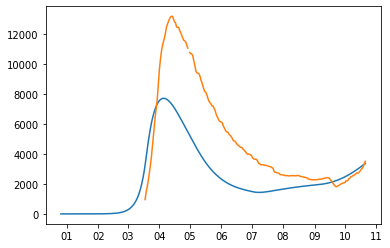

best_error: 3.22667523322621
vector: [array([3.22667523])]
mean_deaths 0.02634016548923614
[8.23713974e+01 1.66797329e+00 7.84737992e-01 2.87958017e-01
 1.97604749e-01 9.04223065e-02 3.80381797e-01 1.54531821e-02
 7.96265940e-01 1.09907288e+00 8.86882382e-01 9.55278926e-01
 8.54668972e-01 9.80683410e-01 9.01748574e-01 9.59197289e-01
 1.13452234e+00]


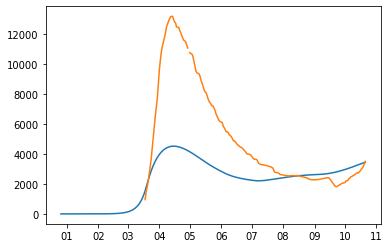

best_error: 3.4142306235380473
vector: [array([3.41423062])]
mean_deaths 0.06649931641023313
[7.78905285e+01 1.96010952e+00 7.45302356e-01 4.71079019e-01
 1.55384324e-01 8.85264649e-03 7.32437966e-01 9.44039477e-02
 8.01911774e-01 1.00875981e+00 8.74767882e-01 8.06359219e-01
 1.20490952e+00 1.03618707e+00 8.43102626e-01 1.08323738e+00
 1.15085427e+00]


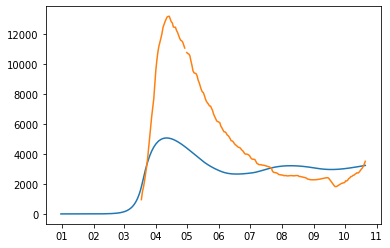

best_error: 3.4685636011823178
vector: [array([3.4685636])]
mean_deaths 0.055519402278994046
[73.00549686  1.8656176   0.7171367   0.37116603  0.42263196  0.09929392
  0.18816298  0.14332217  0.95098198  1.0500353   1.10263348  1.11929722
  1.06142816  1.00081024  0.80335178  1.17516309  1.1258122 ]


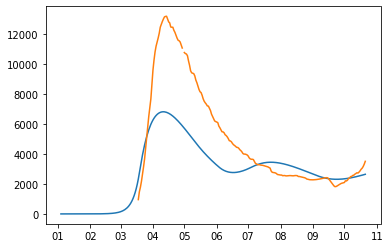

best_error: 3.302821413170373
vector: [array([3.30282141])]
mean_deaths 0.0237843991121295
[7.61641272e+01 1.43789658e+00 7.99503781e-01 4.61055970e-01
 1.81308202e-01 8.96617006e-02 1.76544413e-01 9.89033715e-03
 6.69927387e-01 1.13857904e+00 1.14480335e+00 1.19742026e+00
 1.02410849e+00 8.27274792e-01 8.75398576e-01 1.02918743e+00
 1.02553159e+00]


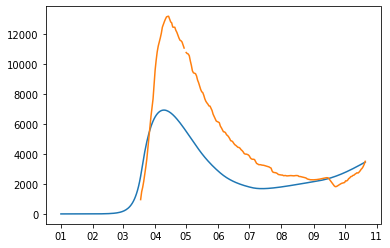

best_error: 3.9216961348516186
vector: [array([3.92169613])]
mean_deaths 0.0388891778845149
[7.61298949e+01 1.65792591e+00 7.31446946e-01 5.59060889e-01
 1.52262365e-01 3.60061218e-02 8.15398313e-01 1.17773390e-01
 8.32364046e-01 1.03504273e+00 9.48423719e-01 1.05826137e+00
 1.10622516e+00 1.08269348e+00 7.50168670e-01 9.71711203e-01
 1.11814420e+00]


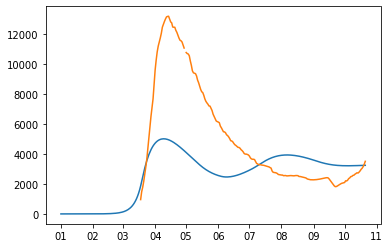

best_error: 3.2604398509248873
vector: [array([3.26043985])]
mean_deaths 0.006157539649253769
[7.75763770e+01 1.76491463e+00 7.42364242e-01 2.62451758e-01
 2.62095576e-01 6.29900968e-02 7.42045592e-01 1.21782399e-01
 9.14568062e-01 1.12161978e+00 1.00125140e+00 1.10523348e+00
 1.03983809e+00 9.00702102e-01 8.18654116e-01 8.85572888e-01
 1.15729343e+00]


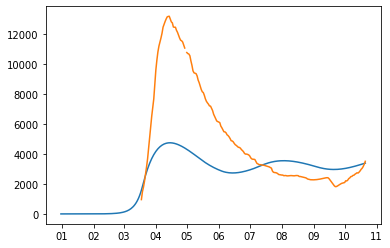

best_error: 2.9908772378994897
vector: [array([2.99087724])]
mean_deaths 0.005580539962446765
[8.37320954e+01 1.59996835e+00 8.53138661e-01 1.93456133e-01
 8.29820904e-02 9.54028756e-02 5.69057087e-01 1.53605414e-01
 7.77819492e-01 1.19362882e+00 1.02929466e+00 1.00996402e+00
 9.23333314e-01 8.54604257e-01 8.07561330e-01 9.14648832e-01
 1.02082887e+00]


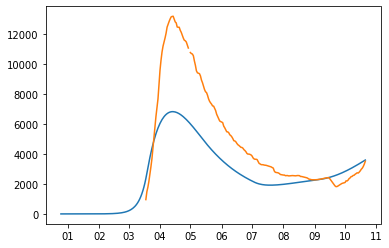

best_error: 3.6615409933964838
vector: [array([3.66154099])]
mean_deaths 0.0011387121729025938
[7.85530734e+01 1.71833297e+00 8.42877126e-01 1.17050424e-01
 8.07215136e-02 9.38893629e-02 4.62910998e-01 7.40357024e-02
 8.18581813e-01 1.17234139e+00 1.11135655e+00 1.23277854e+00
 9.14625835e-01 1.15037901e+00 9.22114059e-01 1.15464472e+00
 1.01966052e+00]


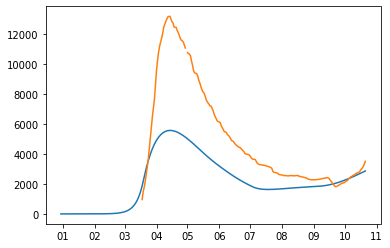

best_error: 4.291936318076773
vector: [array([4.29193632])]
mean_deaths 0.20647867244573742
[8.48047771e+01 1.54900034e+00 7.66895589e-01 1.43093390e-01
 1.47080306e-01 5.48480115e-02 6.64014149e-01 6.54489688e-02
 8.32192093e-01 1.19958231e+00 8.93801203e-01 9.71089501e-01
 9.28264574e-01 9.95366965e-01 7.87472892e-01 8.87330586e-01
 1.17148472e+00]


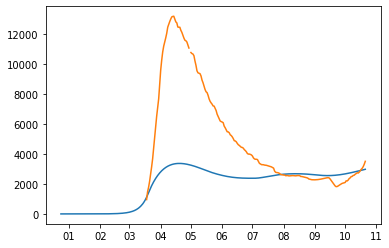

best_error: 3.763296330762162
vector: [array([3.76329633])]
mean_deaths 0.08081571950438184
[79.5227161   1.76332883  0.79230769  0.70917877  0.43984315  0.08899797
  0.62404088  0.17763084  0.6110851   1.07595898  1.0347546   0.90923935
  1.19393045  0.81387067  0.79187278  0.90606483  1.01765977]


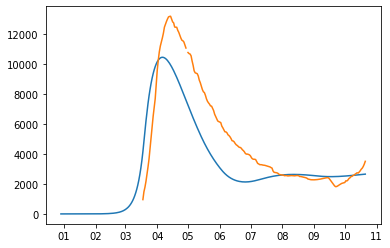

best_error: 3.6450895847318874
vector: [array([3.64508958])]
mean_deaths 0.12009587934769345
[7.77931886e+01 1.83185036e+00 8.72307785e-01 1.54051595e-01
 1.91122231e-01 4.21009681e-02 4.54771538e-01 1.49827481e-01
 7.62740062e-01 1.16133005e+00 1.17960954e+00 8.61502521e-01
 9.23333314e-01 7.70405082e-01 7.75824768e-01 9.63502828e-01
 1.00733036e+00]


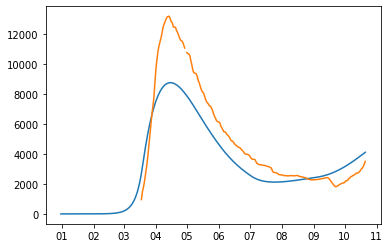

best_error: 3.021117160008955
vector: [array([3.02111716])]
mean_deaths 0.06346556948759852
[8.68295124e+01 1.83128848e+00 8.17936644e-01 2.66099722e-01
 2.09510910e-02 9.07058940e-02 5.16252635e-01 7.55694214e-02
 7.49915954e-01 1.12787949e+00 8.54871399e-01 9.82860480e-01
 1.16927921e+00 7.74460944e-01 8.75794968e-01 9.13697581e-01
 9.79727543e-01]


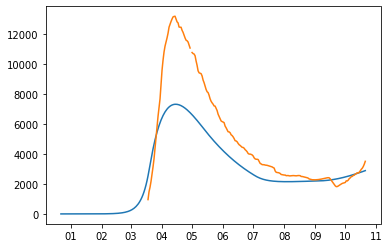

best_error: 3.674705929060043
vector: [array([3.67470593])]
mean_deaths 0.03887620217285072
[7.94366043e+01 1.48615283e+00 8.69153105e-01 2.97241899e-01
 1.16663400e-01 6.81640535e-02 4.37965059e-01 1.45009262e-01
 7.73367234e-01 1.21479637e+00 1.22192834e+00 1.18801063e+00
 1.08728653e+00 8.77080490e-01 8.79135583e-01 9.11642073e-01
 8.88890079e-01]


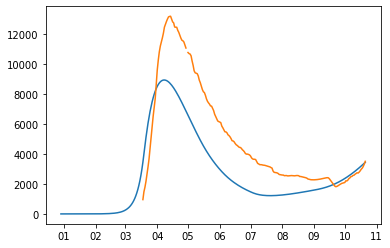

best_error: 3.0206705856497194
vector: [array([3.02067059])]
mean_deaths 0.16437027748091335
[7.88681699e+01 1.52504303e+00 8.16135282e-01 4.58889754e-02
 8.72990917e-02 5.23294403e-02 5.02571579e-01 1.50870898e-01
 7.06138481e-01 1.20490629e+00 1.11770109e+00 8.89086911e-01
 9.41615000e-01 9.31427623e-01 7.59686717e-01 9.45625446e-01
 1.09709965e+00]


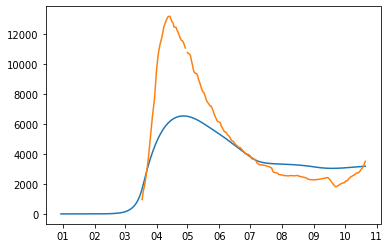

best_error: 3.152430181617442
vector: [array([3.15243018])]
mean_deaths 0.02707389309955441
[8.67640927e+01 1.47547463e+00 8.39184620e-01 1.48047209e-01
 1.35005289e-01 8.89755581e-02 3.10643101e-01 4.92020838e-02
 7.99538883e-01 1.22675632e+00 9.90481285e-01 1.24911914e+00
 8.34268928e-01 8.75959035e-01 8.57656376e-01 7.99655162e-01
 9.09812530e-01]


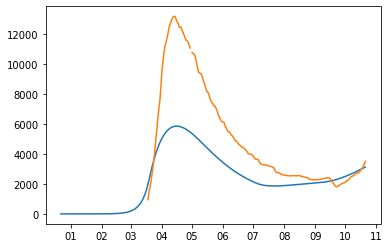

best_error: 3.265717846755025
vector: [array([3.26571785])]
mean_deaths 0.05351056190127979
[79.46043861  1.72615052  0.72292254  0.12795782  0.22024523  0.0982796
  0.27636086  0.17372097  0.87719011  1.13234124  0.89429063  1.05279296
  1.1183822   0.92910442  0.77730997  1.12504367  1.24865867]


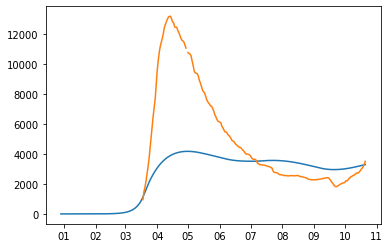

best_error: 3.241599209092916
vector: [array([3.24159921])]
mean_deaths 0.12674309792889304
[8.27081675e+01 1.60040460e+00 7.83215882e-01 1.08479183e-01
 1.54412314e-01 7.97553038e-02 4.34526888e-01 1.13593825e-01
 6.19165638e-01 1.19746518e+00 1.00277491e+00 9.63629878e-01
 1.03827941e+00 7.80402434e-01 8.24059685e-01 9.43167366e-01
 9.22779134e-01]
best_error: 3.410834475665616
vector: [array([3.41083448])]
mean_deaths 0.03161458971266955
[7.95878087e+01 1.80279372e+00 8.46981845e-01 4.50306753e-01
 1.87410318e-01 7.74589204e-02 7.72258204e-01 9.31273691e-02
 8.91394489e-01 1.11789046e+00 1.07993483e+00 1.00066341e+00
 9.58482793e-01 7.58046864e-01 7.97097184e-01 8.82475298e-01
 1.01273139e+00]


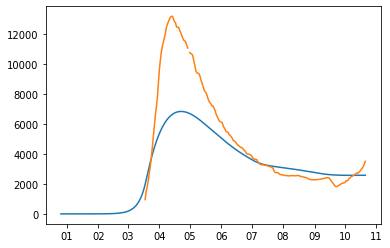

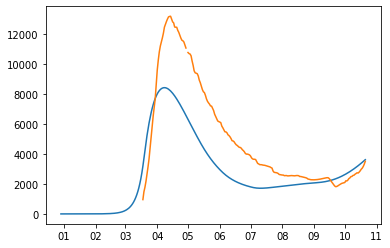

best_error: 3.5779083206153577
vector: [array([3.57790832])]
mean_deaths 0.04854181603335761
[7.81734430e+01 1.71919017e+00 7.72113989e-01 2.88746438e-01
 3.42366276e-01 9.49018483e-02 6.97367819e-01 7.24485133e-02
 7.74197327e-01 1.13901817e+00 1.05728826e+00 8.90068250e-01
 8.57208583e-01 8.39503466e-01 8.80870115e-01 1.00178451e+00
 9.52133753e-01]


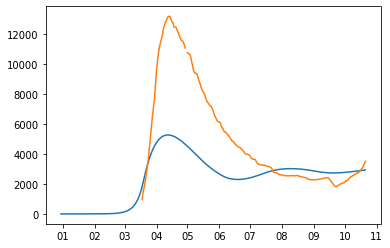

best_error: 3.319376945593359
vector: [array([3.31937695])]
mean_deaths 0.04265251916620895
[8.67614736e+01 1.68616039e+00 8.23009461e-01 2.96267704e-01
 2.94503986e-02 7.19284978e-02 3.81598536e-01 1.83479831e-01
 8.21653171e-01 1.09542724e+00 8.63123835e-01 1.03618911e+00
 7.84742989e-01 7.76799286e-01 8.56658112e-01 1.09840083e+00
 9.35995269e-01]


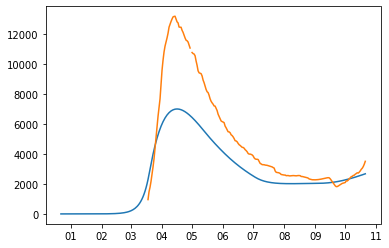

best_error: 2.615492630440632
vector: [array([2.61549263])]
mean_deaths 0.1157024996300224
[81.18629502  1.84785358  0.79847007  0.24360683  0.10509811  0.0897091
  0.65786115  0.10872742  0.99372744  1.12497992  0.98124062  0.97058781
  1.1953625   0.90879633  0.85323033  0.98288135  1.01153217]


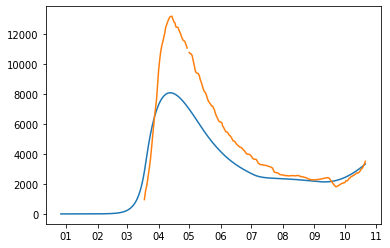

best_error: 3.0821678056677246
vector: [array([3.08216781])]
mean_deaths 0.19322502715500806
[7.40093415e+01 1.96875114e+00 7.40257305e-01 1.11991254e-01
 1.46970454e-01 5.90091578e-02 2.92103757e-01 1.37128062e-01
 9.97545502e-01 1.09752101e+00 1.05299381e+00 7.83959117e-01
 1.18734183e+00 9.40730134e-01 8.71598054e-01 8.49571096e-01
 9.99480299e-01]


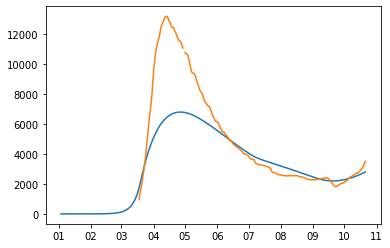

best_error: 3.633670119520282
vector: [array([3.63367012])]
mean_deaths 0.18635680911788083
[85.94566284  1.55356704  0.82252274  0.3384462   0.12928946  0.09314138
  0.6584225   0.15443661  0.92448795  1.12968037  0.9674113   1.06160704
  0.9979206   0.9470118   0.81540814  1.14098172  0.99513526]
best_error: 3.0756195250890053
vector: [array([3.07561953])]
mean_deaths 0.09187707228438478
[8.19472580e+01 1.68908090e+00 7.88016176e-01 2.69935943e-01
 5.91452721e-02 9.45320352e-02 6.35497731e-01 1.13155538e-01
 9.07089238e-01 1.11497525e+00 9.70703603e-01 1.00509547e+00
 1.10826366e+00 9.98176191e-01 8.29183880e-01 9.92799867e-01
 1.06877535e+00]


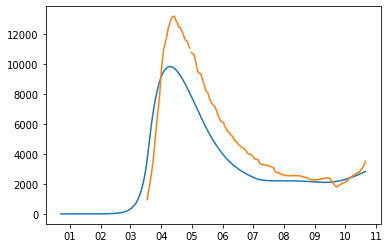

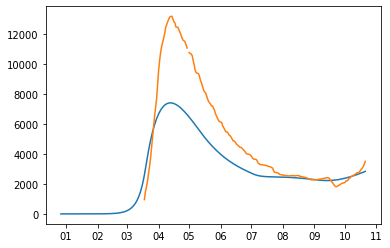

best_error: 2.598790541948987
vector: [array([2.59879054])]
mean_deaths 0.02153313830010536
[8.37714531e+01 1.50582931e+00 8.04054473e-01 3.21173937e-01
 1.96953789e-02 8.17581964e-02 4.10335613e-01 1.05819146e-01
 8.22142061e-01 1.14874099e+00 9.72562131e-01 1.01076984e+00
 1.24108882e+00 9.43252142e-01 7.51436752e-01 9.80671906e-01
 9.08116808e-01]


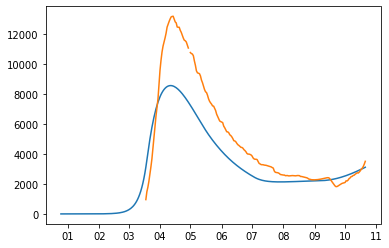

best_error: 3.4677364694569506
vector: [array([3.46773647])]
mean_deaths 0.010219558680787008
[8.28920565e+01 1.56088148e+00 7.94686206e-01 2.93362285e-01
 1.02515703e-02 8.99529543e-02 5.05458064e-01 1.40598764e-01
 7.18923202e-01 1.08951696e+00 8.84719134e-01 8.15263684e-01
 7.66533125e-01 7.84205636e-01 7.64984583e-01 1.00088515e+00
 1.14599722e+00]


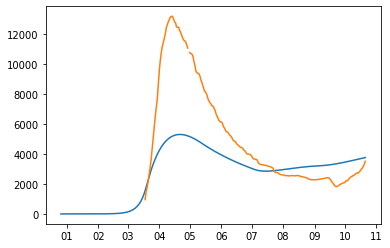

best_error: 3.64128449187551
vector: [array([3.64128449])]
mean_deaths 0.21527582090744019
[8.85600996e+01 1.22496947e+00 8.30387177e-01 5.62925413e-01
 1.07474175e-01 2.03042498e-02 1.71795795e-01 1.32994964e-01
 8.06318149e-01 1.13238196e+00 9.26441202e-01 1.19588412e+00
 1.03273660e+00 9.67679662e-01 7.91436739e-01 1.03873964e+00
 8.47386271e-01]


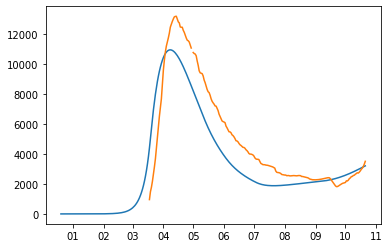

best_error: 3.317423936337975
vector: [array([3.31742394])]
mean_deaths 0.1454201181192772
[82.47971536  1.50428563  0.7992695   0.38643201  0.12127886  0.08590777
  0.38407481  0.15932135  0.64394375  1.11067715  0.96794672  1.1124532
  1.23997687  1.11296337  0.77481502  0.92102533  1.08422451]


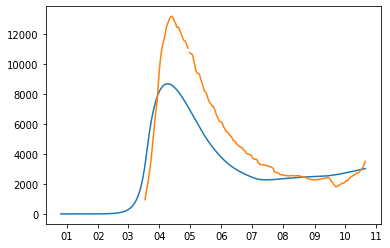

best_error: 2.59841981135847
vector: [array([2.59841981])]
mean_deaths 0.005479407573526447
[7.94271437e+01 1.94432594e+00 7.54596910e-01 3.38267256e-01
 5.98658393e-02 7.90972789e-02 4.58020847e-01 1.32122677e-02
 7.88862084e-01 1.04570258e+00 8.87135379e-01 8.37624317e-01
 1.22755924e+00 7.77447498e-01 7.89267591e-01 8.84834166e-01
 7.93676083e-01]


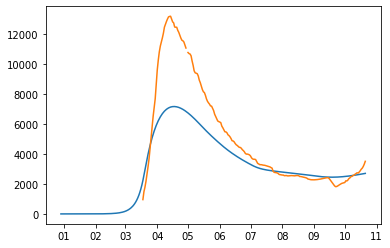

best_error: 3.015572681508776
vector: [array([3.01557268])]
mean_deaths 0.015257302473109047
[81.79233416  1.36696673  0.75515396  0.20776264  0.1018165   0.09665605
  0.21174587  0.11015531  0.85296791  1.14650983  0.96592377  0.80239793
  0.82433828  0.9217266   0.80375359  1.04609562  1.0930354 ]


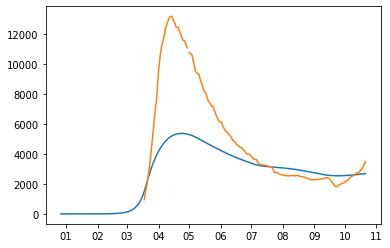

best_error: 3.1470632954521736
vector: [array([3.1470633])]
mean_deaths 0.06530139988917578
[8.16799888e+01 1.85012643e+00 7.15379626e-01 3.63525930e-01
 1.39894092e-01 7.86900914e-02 4.00990639e-01 1.33779571e-01
 8.23669366e-01 1.01991781e+00 8.08054928e-01 8.57489788e-01
 1.18550761e+00 8.38180142e-01 7.65836751e-01 7.62916877e-01
 8.38000502e-01]
best_error: 3.1640471711605453
vector: [array([3.16404717])]
mean_deaths 0.04038717335858259
[8.13303212e+01 1.87108734e+00 7.60076517e-01 5.81011422e-01
 9.05288343e-02 1.29215355e-02 4.26306768e-01 6.81715634e-02
 7.79354534e-01 9.68932715e-01 7.91490868e-01 1.15680722e+00
 1.22799621e+00 1.19957613e+00 8.42427392e-01 8.39369657e-01
 8.44743189e-01]


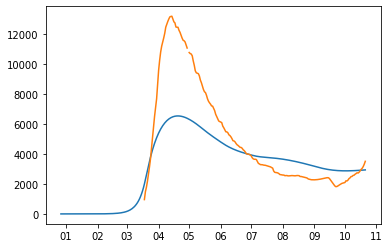

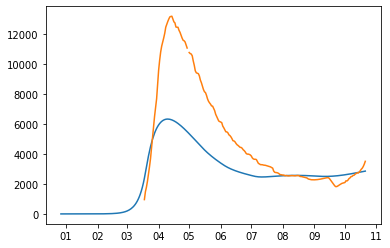

best_error: 3.651334967044232
vector: [array([3.65133497])]
mean_deaths 0.07066197144907822
[8.89636087e+01 1.81324123e+00 7.88411169e-01 2.35645199e-01
 2.24241439e-01 2.93471418e-02 7.33131996e-01 4.57605333e-03
 7.99196760e-01 1.11137384e+00 8.05427241e-01 8.69122740e-01
 9.43469379e-01 1.09835546e+00 9.33461380e-01 8.96961196e-01
 9.87773741e-01]


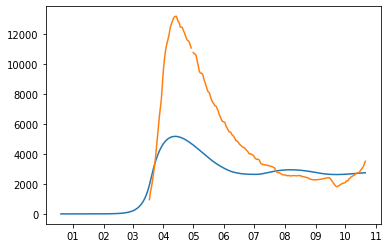

best_error: 2.955218079659644
vector: [array([2.95521808])]
mean_deaths 0.0648347623966897
[8.16845856e+01 1.91898371e+00 7.73800027e-01 2.51735380e-01
 5.50315094e-02 1.67266807e-02 5.18993389e-01 4.29179875e-02
 7.62628322e-01 1.06580524e+00 8.77048480e-01 7.73070796e-01
 1.09495154e+00 8.75226007e-01 8.82447757e-01 1.11335329e+00
 7.86370990e-01]
best_error: 3.51282698034764
vector: [array([3.51282698])]
mean_deaths 0.02522620149800945
[8.14369967e+01 1.97026013e+00 7.74825361e-01 5.41796129e-01
 1.46938787e-01 6.53072746e-02 2.91560534e-01 6.29639159e-02
 7.09833745e-01 9.80945394e-01 8.29456772e-01 8.75825942e-01
 1.15532124e+00 1.01707718e+00 8.22406285e-01 1.08975793e+00
 9.95365589e-01]


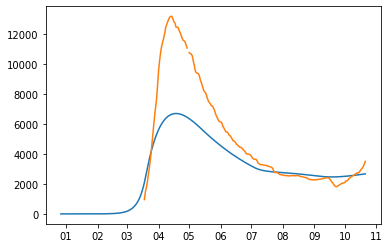

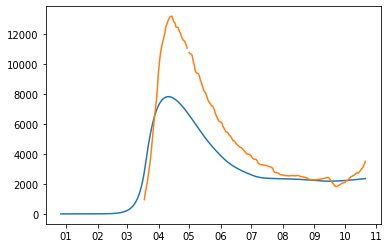

best_error: 3.1166858523632777
vector: [array([3.11668585])]
mean_deaths 0.08051771793558356
[7.32775588e+01 1.96235214e+00 7.72152872e-01 5.43059713e-01
 1.40603905e-01 6.39790413e-02 3.54809131e-01 6.81079228e-02
 8.24487116e-01 9.62754535e-01 1.01262746e+00 8.52751155e-01
 1.24478634e+00 1.14921922e+00 8.41194961e-01 1.15434394e+00
 8.85521208e-01]


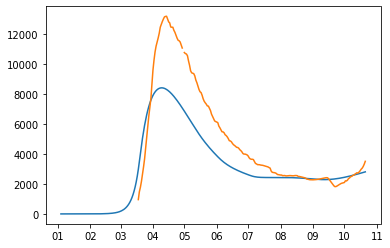

best_error: 2.774701766255329
vector: [array([2.77470177])]
mean_deaths 0.07382027145756712
[7.68207074e+01 1.64200201e+00 7.75704791e-01 1.14850884e-01
 5.33661790e-02 6.57610787e-02 3.51046952e-01 1.61355378e-01
 7.38002825e-01 1.17437546e+00 1.12073933e+00 7.95577809e-01
 1.11623855e+00 7.76704933e-01 7.83900128e-01 7.97972366e-01
 8.50400956e-01]


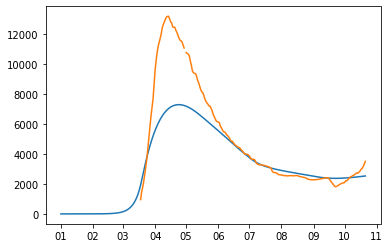

best_error: 3.562822069316103
vector: [array([3.56282207])]
mean_deaths 0.02787442222679062
[8.16355269e+01 1.75745716e+00 7.20829112e-01 2.51918256e-01
 1.18188052e-01 8.01282418e-02 5.45257042e-01 2.65600898e-02
 6.14994139e-01 1.07346788e+00 8.29831557e-01 8.64921271e-01
 1.12775534e+00 8.34812770e-01 7.68517709e-01 9.72504093e-01
 8.00384241e-01]


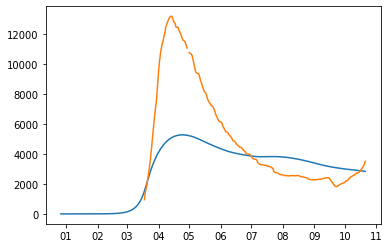

best_error: 2.9354707329446663
vector: [array([2.93547073])]
mean_deaths 0.03492961179654743
[7.28936110e+01 1.95069500e+00 8.01402265e-01 7.75743407e-01
 3.83679398e-02 4.30305944e-02 6.50800373e-01 1.62364527e-02
 7.61855367e-01 9.75633131e-01 1.04501507e+00 8.29840720e-01
 1.20635336e+00 7.91566558e-01 7.98535573e-01 1.17901926e+00
 8.04582425e-01]


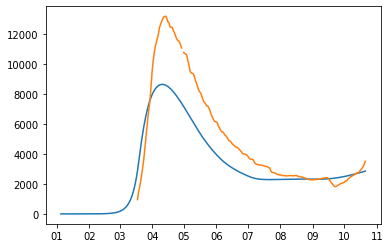

best_error: 2.8519389049499906
vector: [array([2.8519389])]
mean_deaths 0.0691273300266532
[8.26800839e+01 1.84652785e+00 7.24567855e-01 4.65399134e-01
 9.08832340e-02 7.37806005e-02 1.71066667e-01 5.76326103e-02
 9.98580909e-01 9.78514499e-01 7.94209557e-01 7.98051515e-01
 9.28301863e-01 7.80377878e-01 7.84273179e-01 8.71792893e-01
 9.24568472e-01]


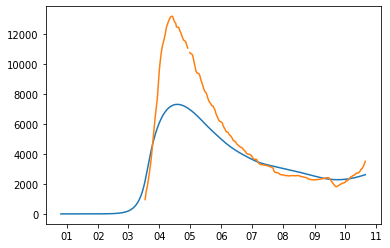

best_error: 2.490431734620412
vector: [array([2.49043173])]
mean_deaths 0.007827478472733615
[82.88758416  1.80279372  0.7731763   0.48986427  0.1371471   0.08960048
  0.58500964  0.09312737  0.74928339  1.04470751  0.84434532  0.96004958
  1.10608092  0.75804686  0.79709718  0.8824753   0.82181376]


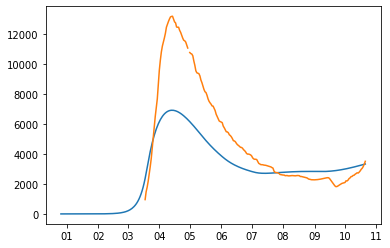

best_error: 2.7124914237607918
vector: [array([2.71249142])]
mean_deaths 0.05256460346568123
[8.43235685e+01 1.87349052e+00 7.78874810e-01 3.14796592e-01
 1.26183645e-01 8.79757555e-03 1.10628052e-01 4.18958686e-02
 8.32990547e-01 1.06374484e+00 8.16364180e-01 9.10768241e-01
 1.18982973e+00 9.79820078e-01 9.20196142e-01 1.14888176e+00
 8.10003321e-01]


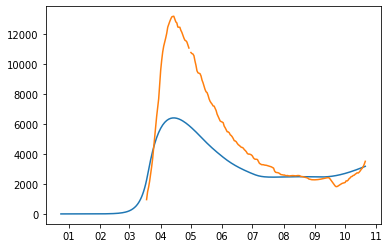

best_error: 3.1548448407505907
vector: [array([3.15484484])]
mean_deaths 0.015525470822697753
[7.86262370e+01 1.87777557e+00 8.05943620e-01 4.81383812e-01
 2.02730853e-01 5.14884224e-02 5.41533223e-01 1.14156129e-02
 8.61423289e-01 1.05985846e+00 1.00621658e+00 9.80641345e-01
 1.09496460e+00 8.11441051e-01 8.22008196e-01 7.62813482e-01
 8.28157276e-01]


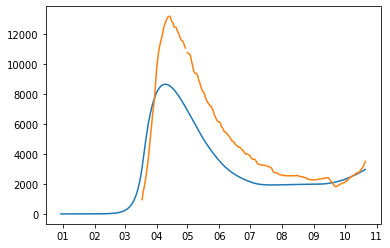

best_error: 2.821393988199833
vector: [array([2.82139399])]
mean_deaths 0.05845251656859705
[8.43305179e+01 1.75946241e+00 7.31649775e-01 5.59051992e-01
 1.60684026e-01 4.35585771e-02 1.13768648e-01 1.19457832e-01
 8.60530290e-01 9.96736878e-01 7.68406029e-01 7.73776285e-01
 1.16271249e+00 8.80056077e-01 7.90275146e-01 8.15210459e-01
 8.14602226e-01]


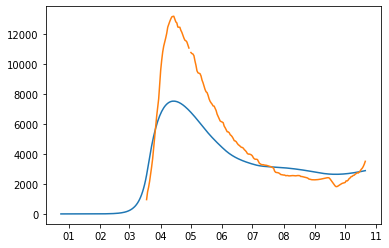

best_error: 3.2730560479394817
vector: [array([3.27305605])]
mean_deaths 0.0392381155750424
[8.13371770e+01 1.94750416e+00 7.99269505e-01 4.27414234e-01
 5.17191686e-02 8.14028753e-02 4.53887368e-01 5.89663440e-02
 6.43943751e-01 1.02342150e+00 8.39149369e-01 1.11245320e+00
 1.23997687e+00 1.11296337e+00 7.74958205e-01 7.73785474e-01
 1.08422451e+00]


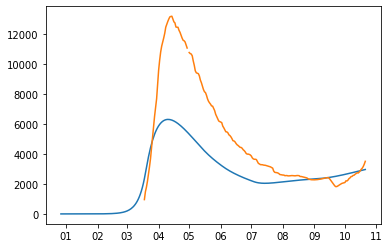

best_error: 3.0842544213701815
vector: [array([3.08425442])]
mean_deaths 0.0555164598393773
[8.27074431e+01 1.47477571e+00 8.07269788e-01 5.08945659e-01
 1.87057706e-01 5.73967913e-02 5.50940940e-01 6.26714136e-02
 5.55419809e-01 1.11529163e+00 9.89745939e-01 7.64375381e-01
 9.66466181e-01 7.82184125e-01 8.51262631e-01 9.92319306e-01
 9.68953623e-01]


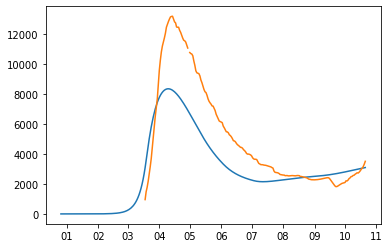

best_error: 3.121451968529385
vector: [array([3.12145197])]
mean_deaths 0.008355026954030315
[8.67761779e+01 1.84552702e+00 7.93914138e-01 3.37372186e-01
 2.82759951e-01 3.81453841e-02 3.54809131e-01 6.81079228e-02
 8.93198323e-01 1.08090223e+00 8.32217647e-01 8.79455249e-01
 1.06502709e+00 1.14921922e+00 9.16266943e-01 8.74450659e-01
 8.47426956e-01]


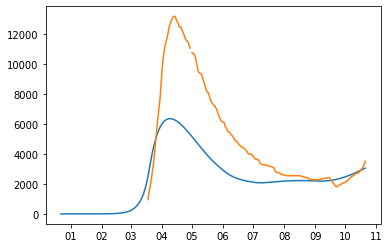

best_error: 2.644970697851616
vector: [array([2.6449707])]
mean_deaths 0.016505726328199546
[7.68207074e+01 1.65082304e+00 7.75704791e-01 2.62094513e-01
 5.33661790e-02 6.57610787e-02 4.31318957e-01 3.46827215e-02
 7.09638592e-01 1.09453779e+00 1.02745075e+00 8.05466252e-01
 1.03247576e+00 8.33605532e-01 7.58704663e-01 8.92846319e-01
 7.88788948e-01]


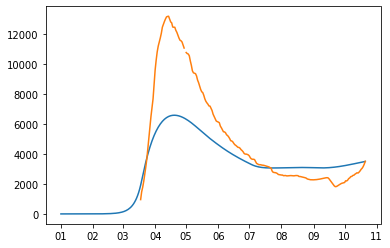

best_error: 3.0925705790933824
vector: [array([3.09257058])]
mean_deaths 0.21191542069512712
[8.34544821e+01 1.93424441e+00 7.73859144e-01 5.61796600e-01
 1.00997635e-01 7.71563221e-02 4.95892036e-01 9.24632391e-02
 9.74317750e-01 9.65154561e-01 7.91513963e-01 1.10190845e+00
 1.11549075e+00 1.00223207e+00 7.50406884e-01 8.19180867e-01
 1.17749727e+00]


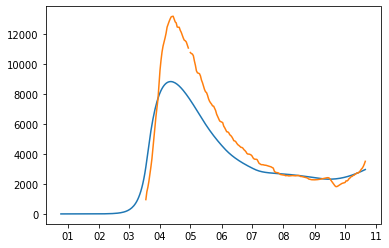

best_error: 2.5069929453746465
vector: [array([2.50699295])]
mean_deaths 0.05335077370604378
[8.68295124e+01 1.83128848e+00 8.17936644e-01 2.34990968e-01
 8.76918504e-02 8.58312903e-02 5.55696857e-01 7.55694214e-02
 7.63906696e-01 1.12856977e+00 8.54871399e-01 1.03320097e+00
 1.11773884e+00 8.42385002e-01 8.21364064e-01 9.45057612e-01
 9.79727543e-01]


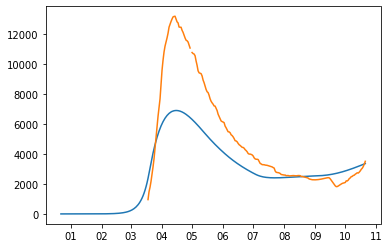

best_error: 2.4731588590507942
vector: [array([2.47315886])]
mean_deaths 0.008948676299248622
[8.01019104e+01 1.98024355e+00 7.66245517e-01 2.21738823e-01
 1.17661907e-01 6.53072746e-02 4.90270829e-01 1.27229671e-01
 8.50163131e-01 1.05879373e+00 8.62316386e-01 9.70575095e-01
 1.15532124e+00 1.01707718e+00 7.89285138e-01 1.08975793e+00
 1.03684743e+00]


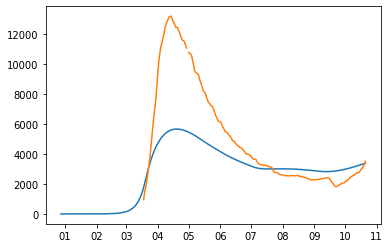

best_error: 2.83254283359792
vector: [array([2.83254283])]
mean_deaths 0.0810008727623267
[8.15670579e+01 1.89128501e+00 8.09637492e-01 4.27663526e-01
 8.88835525e-02 7.91567430e-03 6.91400007e-01 9.89033715e-03
 8.35509999e-01 1.06211399e+00 9.27230286e-01 9.30070248e-01
 1.13173141e+00 8.17027657e-01 8.15477711e-01 8.58056319e-01
 8.37159480e-01]


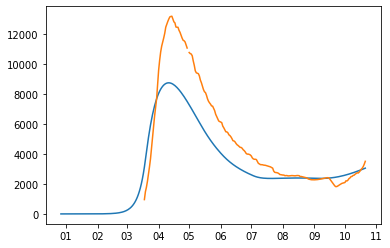

best_error: 2.900670263815372
vector: [array([2.90067026])]
mean_deaths 0.04203617338125797
[79.65729333  1.71577034  0.78170679  0.30920497  0.10191959  0.08880908
  0.64657584  0.09695904  0.8629613   1.09701919  0.9618031   0.93661588
  1.00575446  0.95850647  0.83239843  0.75176079  0.81792537]


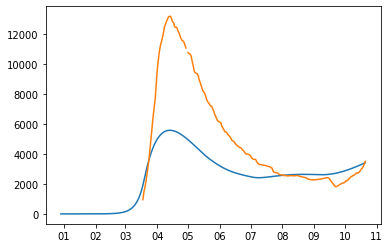

best_error: 3.045240297685933
vector: [array([3.0452403])]
mean_deaths 0.0026310370562151416
[8.56210768e+01 1.63625131e+00 7.36728937e-01 5.32098841e-01
 2.15226330e-01 2.54396276e-03 3.36536118e-01 1.27557069e-01
 8.23669366e-01 1.01991781e+00 7.62899559e-01 8.36284880e-01
 1.19657348e+00 1.10080851e+00 7.82350528e-01 1.15247794e+00
 9.33067589e-01]


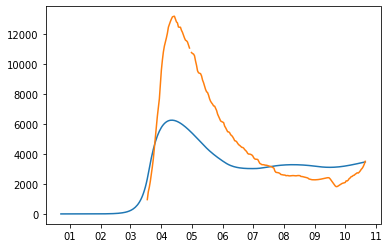

best_error: 2.598161037874669
vector: [array([2.59816104])]
mean_deaths 0.16825976280646693
[7.88681699e+01 1.97873101e+00 7.54427998e-01 2.20073426e-01
 2.04722958e-02 4.67807744e-02 1.04033497e-01 1.16371851e-01
 9.93266930e-01 1.03730184e+00 9.22562426e-01 8.40200058e-01
 1.20495043e+00 9.48649412e-01 7.59686717e-01 1.17720001e+00
 1.07211660e+00]


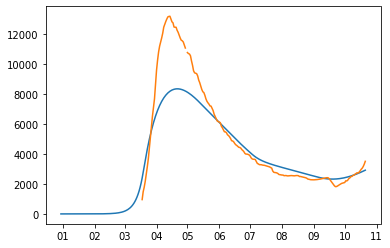

best_error: 2.251302035913631
vector: [array([2.25130204])]
mean_deaths 0.02179458216903511
[8.21478459e+01 1.82317370e+00 7.80038879e-01 1.78209137e-01
 2.08807453e-01 6.10461080e-02 4.60843014e-01 5.74371429e-02
 9.85323284e-01 1.11162291e+00 9.17067016e-01 9.00660199e-01
 8.88829961e-01 9.03286911e-01 7.80047104e-01 1.22260900e+00
 1.10355324e+00]


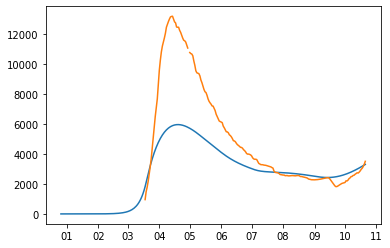

best_error: 2.3676926318112392
vector: [array([2.36769263])]
mean_deaths 0.06608552568982307
[7.97221465e+01 1.64283144e+00 7.48871010e-01 3.00047896e-01
 9.16642064e-02 4.34806265e-02 4.26940610e-01 1.37128062e-01
 9.68705312e-01 1.06740901e+00 9.32596877e-01 9.89366885e-01
 1.01504837e+00 9.40730134e-01 7.70835283e-01 1.14996577e+00
 1.05135713e+00]


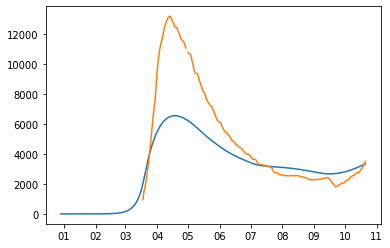

best_error: 3.0052083023583744
vector: [array([3.0052083])]
mean_deaths 0.2977505381062017
[8.75763059e+01 1.74976996e+00 8.28428074e-01 4.28588139e-03
 1.54412314e-01 3.52663481e-02 3.63932681e-01 1.21163840e-01
 9.40117913e-01 1.19444929e+00 9.06964569e-01 9.63629878e-01
 9.29449894e-01 8.80317356e-01 8.07325784e-01 1.15381883e+00
 1.20203506e+00]


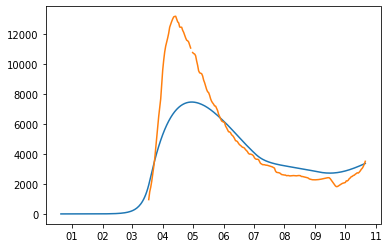

best_error: 2.8383761502852436
vector: [array([2.83837615])]
mean_deaths 0.05350450754573462
[8.27081675e+01 1.73205029e+00 7.90692521e-01 2.74357579e-01
 1.54412314e-01 6.11084674e-02 4.55189235e-01 3.68069190e-02
 5.56047904e-01 1.07626845e+00 8.89039329e-01 9.63629878e-01
 8.94477981e-01 8.62678357e-01 7.64349850e-01 1.15381883e+00
 1.00865283e+00]


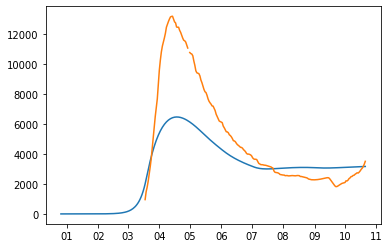

best_error: 3.044339663474158
vector: [array([3.04433966])]
mean_deaths 0.005416897220309482
[78.11798006  1.81294476  0.77733758  0.31525264  0.15552819  0.07980486
  0.51411788  0.10129295  0.65679117  1.07509819  0.98704771  1.00540482
  0.94712388  0.78948641  0.79184723  1.14609366  1.04840751]


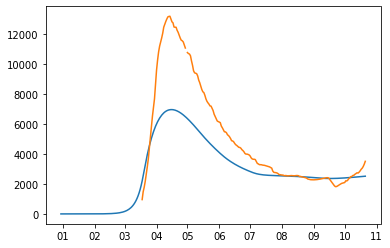

best_error: 2.2923407046466577
vector: [array([2.2923407])]
mean_deaths 0.04882266153020427
[7.83058736e+01 1.86002290e+00 7.77422506e-01 3.39455725e-01
 1.75053333e-01 4.75390897e-02 3.35198835e-01 3.21935147e-02
 9.59992891e-01 1.04814967e+00 9.70543672e-01 1.13408899e+00
 9.02598322e-01 7.88613515e-01 7.54760775e-01 1.04328090e+00
 1.08896584e+00]


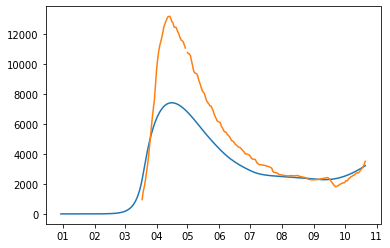

best_error: 2.9268962920456927
vector: [array([2.92689629])]
mean_deaths 0.09565308365845121
[8.32724324e+01 1.79292746e+00 7.73295648e-01 3.53208177e-01
 2.97909299e-01 5.44179318e-02 4.07070877e-01 4.80085560e-02
 8.73055715e-01 1.09763930e+00 8.92053765e-01 9.44692308e-01
 1.15332058e+00 8.85637843e-01 8.79885409e-01 9.22528588e-01
 1.04365843e+00]


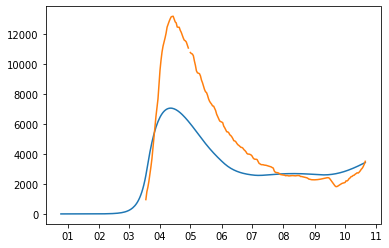

best_error: 2.8363186693654026
vector: [array([2.83631867])]
mean_deaths 0.06377629905580892
[8.91660002e+01 1.67870497e+00 8.13306627e-01 9.16115298e-02
 9.04760518e-02 5.82631886e-02 4.48853554e-01 5.36672898e-02
 9.06611147e-01 1.18173701e+00 8.49512433e-01 9.80545928e-01
 8.33815981e-01 8.64966285e-01 7.64621386e-01 1.22207188e+00
 1.05193409e+00]


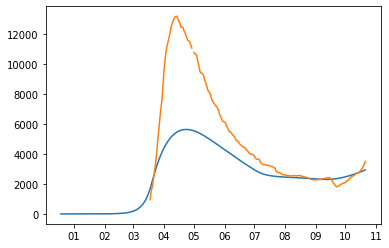

best_error: 2.9132853235350917
vector: [array([2.91328532])]
mean_deaths 0.06801529831204445
[7.97221465e+01 1.64283144e+00 7.91074961e-01 2.00246622e-01
 9.16642064e-02 5.91293927e-02 7.28610625e-01 1.37128062e-01
 9.68705312e-01 1.14187372e+00 1.02022190e+00 9.89366885e-01
 7.63097319e-01 8.79915684e-01 7.98121084e-01 1.04473191e+00
 1.05135713e+00]


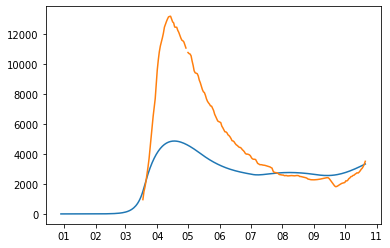

best_error: 2.8188172803390215
vector: [array([2.81881728])]
mean_deaths 0.014979386549457003
[8.08512473e+01 1.96093116e+00 7.79428184e-01 6.69070675e-02
 1.94955955e-01 4.03409721e-02 5.89341627e-01 5.46512490e-02
 9.26224720e-01 1.14492022e+00 9.63530017e-01 9.70022137e-01
 8.95159759e-01 8.82053382e-01 8.01706593e-01 1.10185197e+00
 1.18714736e+00]


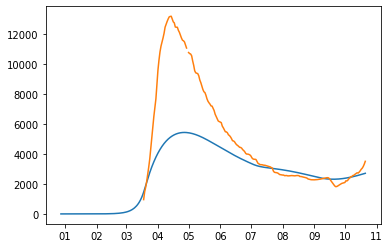

best_error: 2.762472450109094
vector: [array([2.76247245])]
mean_deaths 0.011321810082710814
[8.41454174e+01 1.94541151e+00 8.21373286e-01 2.53893203e-01
 1.92152953e-01 6.81906180e-02 4.08449770e-01 9.83357623e-02
 9.53438832e-01 1.08122885e+00 8.73686946e-01 9.58273053e-01
 8.09012359e-01 8.80032937e-01 8.97719678e-01 1.20125551e+00
 1.12708989e+00]


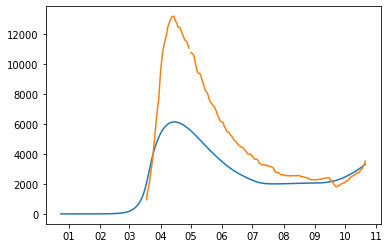

best_error: 2.7811775042372426
vector: [array([2.7811775])]
mean_deaths 0.03956061033568852
[8.25302577e+01 1.58508905e+00 7.98647659e-01 4.04224471e-01
 1.93944334e-01 2.83019465e-02 5.22413211e-01 6.10140851e-02
 6.91540254e-01 1.11413000e+00 9.66733593e-01 8.84584927e-01
 9.41884205e-01 7.51643653e-01 8.28713641e-01 1.06523599e+00
 1.01157193e+00]


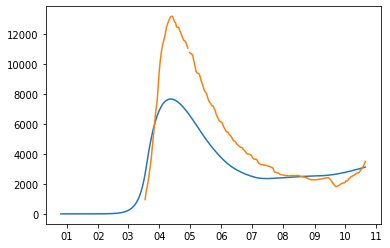

best_error: 2.768273842565473
vector: [array([2.76827384])]
mean_deaths 0.025035373650705878
[8.69640304e+01 1.77612621e+00 7.81095138e-01 1.26168476e-01
 1.30376964e-01 6.06790364e-02 3.81126959e-01 1.39753462e-02
 8.00947403e-01 1.16935212e+00 8.30956297e-01 1.17009053e+00
 1.16211188e+00 8.64932984e-01 9.61360429e-01 8.53835508e-01
 7.61305887e-01]


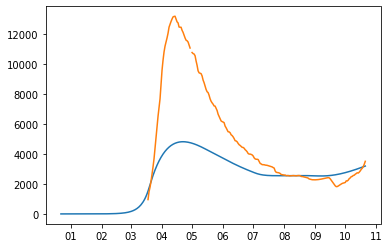

best_error: 2.878822578695361
vector: [array([2.87882258])]
mean_deaths 0.024150117649982168
[8.45629382e+01 1.78951702e+00 8.07622571e-01 3.94474755e-01
 3.14810735e-01 6.45583547e-02 6.89037458e-01 4.91255689e-02
 9.07994227e-01 1.10178093e+00 9.36103643e-01 7.75740325e-01
 9.59566526e-01 9.03037368e-01 8.04851342e-01 8.30049307e-01
 9.49015853e-01]


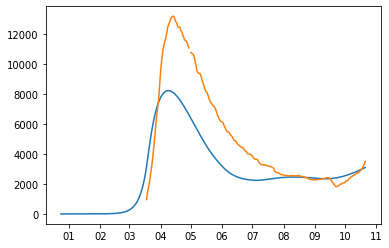

best_error: 2.2450649993424587
vector: [array([2.245065])]
mean_deaths 0.1512993154445811
[7.97221465e+01 1.94262626e+00 8.13375718e-01 8.67044019e-02
 1.19172152e-01 4.34806265e-02 3.50784715e-01 1.51108855e-02
 9.84514023e-01 1.09787614e+00 9.79420117e-01 8.31718143e-01
 8.48605162e-01 9.40730134e-01 7.70835283e-01 9.97783351e-01
 1.13813056e+00]


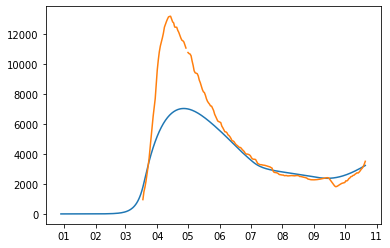

best_error: 2.6479950990472285
vector: [array([2.6479951])]
mean_deaths 0.03976024625611433
[8.16084311e+01 1.81231477e+00 7.80679585e-01 1.67157134e-01
 1.71128812e-01 7.46275836e-02 4.94017633e-01 2.82910483e-02
 9.43689463e-01 1.07861325e+00 9.18691783e-01 8.21537399e-01
 9.06812511e-01 1.07163902e+00 7.56270797e-01 1.22909570e+00
 9.23986367e-01]


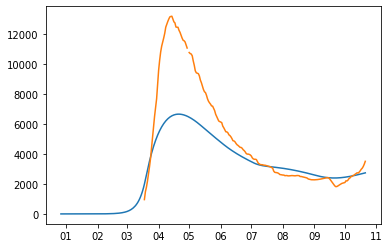

best_error: 2.2890229291240636
vector: [array([2.28902293])]
mean_deaths 0.0018063674536941757
[8.57493621e+01 1.98104814e+00 7.52088611e-01 1.90662571e-01
 1.32043901e-01 8.54225475e-02 2.56114148e-01 1.88039212e-01
 9.50804294e-01 1.07981706e+00 7.70537213e-01 1.01023891e+00
 1.12227689e+00 8.90386238e-01 8.06000503e-01 9.19083702e-01
 1.12965059e+00]


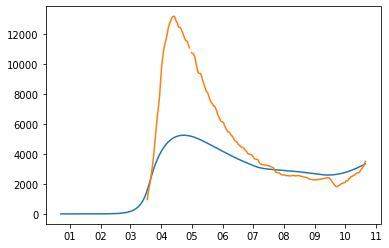

best_error: 2.7126949291983298
vector: [array([2.71269493])]
mean_deaths 0.18593743900402893
[8.27479295e+01 1.83296037e+00 8.10404517e-01 1.62700687e-01
 3.11960874e-02 8.12411251e-02 8.36416157e-02 8.60632435e-03
 8.30369989e-01 1.10191942e+00 9.15744534e-01 8.41573154e-01
 1.07443771e+00 9.71617490e-01 8.37554424e-01 8.95813787e-01
 9.36612084e-01]


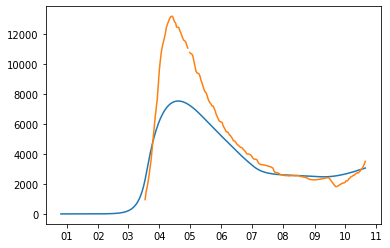

best_error: 2.4957099340362676
vector: [array([2.49570993])]
mean_deaths 0.18637330443557443
[8.34604226e+01 1.92364379e+00 8.46630567e-01 1.74511179e-01
 1.09227245e-01 2.61701957e-02 2.90944126e-01 4.85343427e-02
 8.77425703e-01 1.07612590e+00 9.05114098e-01 7.52438902e-01
 8.90736743e-01 9.42172158e-01 8.28972076e-01 9.07040135e-01
 7.53652911e-01]


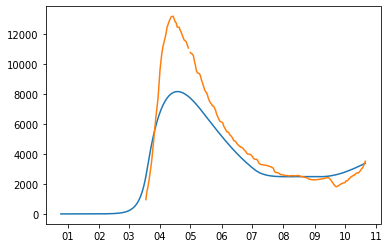

best_error: 2.377659505425546
vector: [array([2.37765951])]
mean_deaths 0.06762536173017263
[8.18657180e+01 1.86687000e+00 8.17318980e-01 1.27542051e-01
 1.43301577e-01 5.89238725e-02 3.83205485e-01 1.77406905e-02
 8.91854470e-01 1.12664738e+00 9.62563387e-01 7.66490047e-01
 9.88086849e-01 9.84918550e-01 8.08769054e-01 1.03737435e+00
 1.10982967e+00]


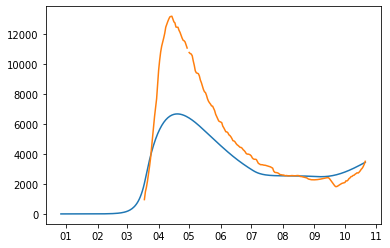

best_error: 2.648781533465135
vector: [array([2.64878153])]
mean_deaths 0.004788299144315376
[7.91459252e+01 1.81792023e+00 7.97950855e-01 1.56874503e-01
 6.15425149e-02 6.75982676e-02 3.26496474e-01 8.56502694e-03
 7.05462820e-01 1.08937188e+00 9.25326719e-01 1.00627559e+00
 9.16643598e-01 1.03974632e+00 7.96783537e-01 1.07799691e+00
 1.03423770e+00]


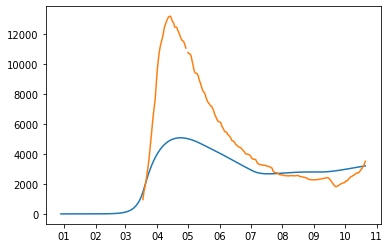

best_error: 2.461643946536669
vector: [array([2.46164395])]
mean_deaths 0.02174991086971769
[8.16135168e+01 1.96110805e+00 8.02162854e-01 3.15568733e-01
 1.38177392e-01 3.17914055e-02 2.59981354e-01 9.01095140e-02
 8.17294950e-01 1.03037039e+00 8.83489544e-01 8.92443963e-01
 9.30198047e-01 8.94369592e-01 7.69835213e-01 1.14917130e+00
 9.37465932e-01]


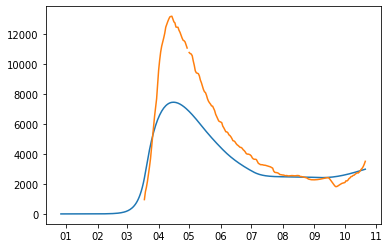

best_error: 2.4483230340230553
vector: [array([2.44832303])]
mean_deaths 0.12257495543872285
[7.64928415e+01 1.81462176e+00 8.01794879e-01 1.85830038e-01
 1.60782782e-01 4.83092095e-02 5.16499038e-01 7.70869337e-03
 9.37171852e-01 1.08951094e+00 1.06950762e+00 9.71462623e-01
 7.96982161e-01 8.56239319e-01 7.86583946e-01 1.05181330e+00
 1.17701102e+00]


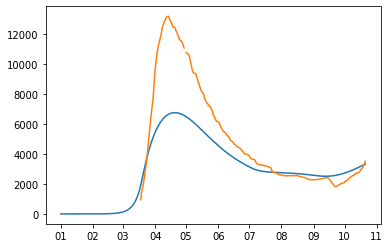

best_error: 2.2112745460746046
vector: [array([2.21127455])]
mean_deaths 0.006068423013017721
[7.72473912e+01 1.87404496e+00 7.82935390e-01 6.25412871e-02
 1.02128189e-01 2.07389288e-02 2.93260152e-01 9.61638311e-03
 9.51857214e-01 1.14844516e+00 1.03559613e+00 8.40517752e-01
 1.09549633e+00 1.02283708e+00 7.90055637e-01 9.39183842e-01
 1.02384152e+00]


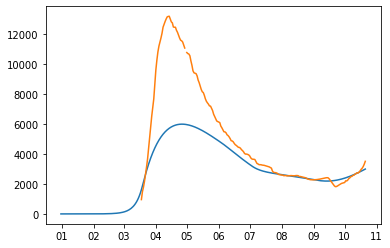

best_error: 2.5231252008916583
vector: [array([2.5231252])]
mean_deaths 0.022931887631487628
[8.34387391e+01 1.97981710e+00 7.64295309e-01 7.79769215e-02
 9.21021351e-02 7.90826136e-02 2.80139401e-01 9.38288203e-02
 9.03903674e-01 1.11226821e+00 8.20048221e-01 8.89319090e-01
 1.05065903e+00 9.20032962e-01 8.12963685e-01 9.54931490e-01
 1.15161092e+00]


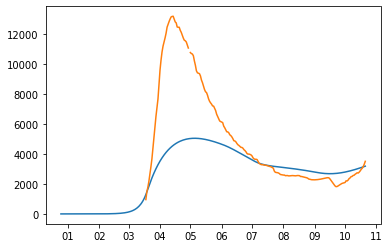

best_error: 2.7129384611726604
vector: [array([2.71293846])]
mean_deaths 0.20019157805966617
[8.24605393e+01 1.75864147e+00 8.30121429e-01 8.01381779e-02
 7.08802847e-02 8.29796388e-02 3.16013792e-01 1.66039232e-01
 6.78631510e-01 1.17695848e+00 1.00637696e+00 8.23422553e-01
 1.04534997e+00 7.99824354e-01 7.89596547e-01 8.96339834e-01
 9.55941519e-01]
best_error: 2.3248476810617795
vector: [array([2.32484768])]
mean_deaths 0.11844667096028731
[7.59670773e+01 1.73881647e+00 8.09112652e-01 1.31048552e-01
 1.76068628e-02 1.25536586e-02 2.54986435e-01 1.73511479e-03
 6.51500007e-01 1.14500295e+00 1.12093754e+00 7.80213802e-01
 1.21211951e+00 9.31211223e-01 7.63210056e-01 8.63889803e-01
 1.21288598e+00]


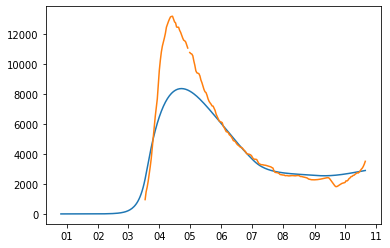

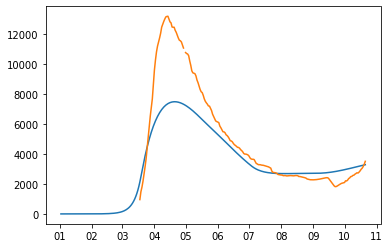

best_error: 2.1693652600106312
vector: [array([2.16936526])]
mean_deaths 0.022494247932796734
[7.91617714e+01 1.72250967e+00 7.83611309e-01 8.55910289e-02
 1.64068875e-01 3.24145886e-02 9.10587712e-02 1.46808725e-02
 9.54979878e-01 1.17721846e+00 1.04230242e+00 8.72497012e-01
 1.10386568e+00 9.89207008e-01 7.88799278e-01 8.41413842e-01
 9.54781119e-01]


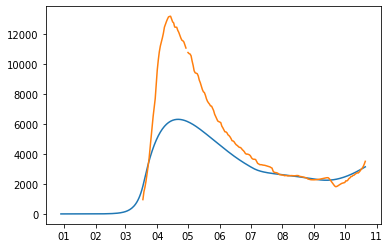

best_error: 2.468267974716756
vector: [array([2.46826797])]
mean_deaths 0.061929052486031
[8.43601116e+01 1.78793438e+00 7.64750735e-01 1.63927926e-01
 1.82360169e-01 7.19639427e-02 6.83466768e-02 1.23773526e-01
 9.54336094e-01 1.13525734e+00 8.80238068e-01 9.76269223e-01
 1.12024006e+00 9.08222898e-01 7.98548410e-01 8.29124060e-01
 1.01947571e+00]


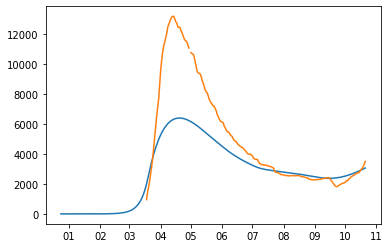

best_error: 2.2486170957264893
vector: [array([2.2486171])]
mean_deaths 0.027317062430159543
[7.66057126e+01 1.86350540e+00 7.54898811e-01 1.37000411e-01
 1.58835276e-01 9.23347907e-03 1.86289930e-01 7.96668316e-02
 9.87361815e-01 1.13247202e+00 1.01906870e+00 1.16361205e+00
 1.14589128e+00 9.03481402e-01 8.21598635e-01 1.00824280e+00
 1.05407069e+00]


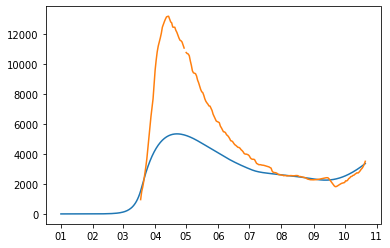

best_error: 2.166539398396794
vector: [array([2.1665394])]
mean_deaths 0.004203225673539787
[7.69597875e+01 1.85111333e+00 8.06627624e-01 2.77602261e-02
 1.82161203e-01 3.92847717e-02 1.85675522e-01 1.97797702e-01
 9.00268120e-01 1.17019622e+00 1.09278561e+00 8.04155318e-01
 1.06892448e+00 1.21546777e+00 7.78030461e-01 8.27758477e-01
 1.04548959e+00]


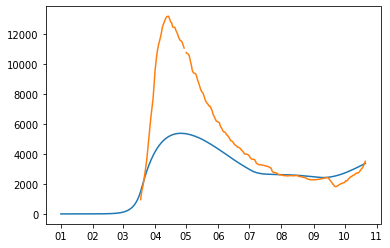

best_error: 2.1097757489290534
vector: [array([2.10977575])]
mean_deaths 0.012977691393101416
[7.12763561e+01 1.88931224e+00 7.35219045e-01 2.40874733e-01
 2.44710978e-01 4.29957286e-02 2.17752118e-01 1.69804323e-01
 9.77647384e-01 1.08710178e+00 1.16690164e+00 7.91497473e-01
 1.13902808e+00 8.04948528e-01 7.51625949e-01 7.96873603e-01
 1.00415620e+00]


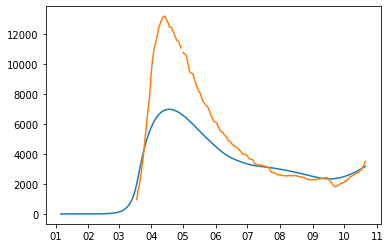

best_error: 2.385054146597081
vector: [array([2.38505415])]
mean_deaths 0.0077683367594670915
[7.29359055e+01 1.74896428e+00 7.37331523e-01 3.15009854e-01
 1.91485125e-01 2.03078780e-02 2.83271140e-01 7.22927390e-02
 8.62283355e-01 1.06007117e+00 1.10140206e+00 8.48580480e-01
 1.02782849e+00 7.99073748e-01 7.94058337e-01 1.18128769e+00
 8.83078992e-01]


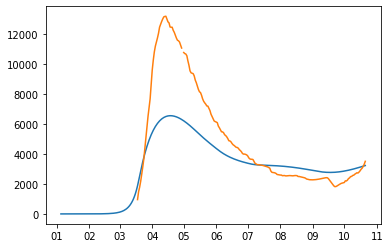

best_error: 2.3829340283080502
vector: [array([2.38293403])]
mean_deaths 0.12090393269874128
[7.09074046e+01 1.78829290e+00 7.35219045e-01 2.40874733e-01
 1.03009554e-01 5.56267536e-02 2.17752118e-01 1.69804323e-01
 9.97881441e-01 1.05702527e+00 1.15079847e+00 1.11521256e+00
 1.13237951e+00 1.00162778e+00 8.33658869e-01 1.03296787e+00
 9.43362134e-01]


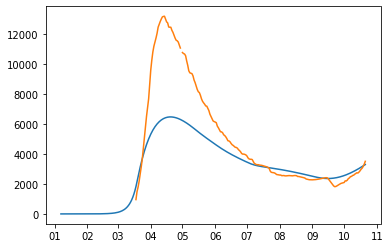

best_error: 2.09164554477908
vector: [array([2.09164554])]
mean_deaths 0.05472037309565085
[7.35190718e+01 1.86002290e+00 7.77422506e-01 1.56726355e-01
 1.43655258e-01 1.57810814e-02 1.14194559e-01 5.24610029e-02
 8.98860603e-01 1.14290142e+00 1.15615187e+00 8.86283753e-01
 1.21191650e+00 7.88613515e-01 7.54760775e-01 1.04328090e+00
 9.81848705e-01]


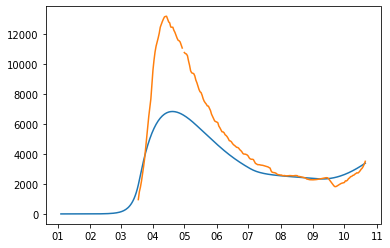

best_error: 2.5495550950939623
vector: [array([2.5495551])]
mean_deaths 0.06816498167412714
[7.33386195e+01 1.92551793e+00 7.56930530e-01 1.07376575e-01
 1.40254010e-01 2.35562579e-02 3.18909416e-01 6.81745010e-02
 9.49092762e-01 1.13434063e+00 1.13896747e+00 7.95466915e-01
 1.11859251e+00 7.58346404e-01 7.98288446e-01 1.02677767e+00
 1.24993562e+00]


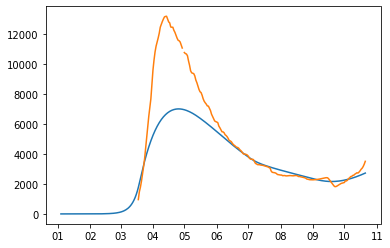

best_error: 2.180283569487822
vector: [array([2.18028357])]
mean_deaths 0.12706073354712732
[7.52517439e+01 1.91297445e+00 7.94384280e-01 1.13759081e-01
 2.17357326e-01 9.15921992e-02 9.15259791e-02 4.37190152e-02
 8.69271976e-01 1.15166716e+00 1.15092110e+00 8.45291547e-01
 1.13804604e+00 7.85873767e-01 7.87293656e-01 1.24157809e+00
 1.10196269e+00]
best_error: 2.1017173899962773
vector: [array([2.10171739])]
mean_deaths 0.01548055860647045
[7.89700328e+01 1.90033060e+00 7.81073918e-01 6.07399954e-02
 6.81234026e-02 4.40796470e-02 3.16273379e-01 8.49736510e-03
 8.85035104e-01 1.15516381e+00 9.78136796e-01 9.51845212e-01
 1.15922006e+00 8.69514697e-01 7.75306482e-01 1.04651183e+00
 1.01281357e+00]


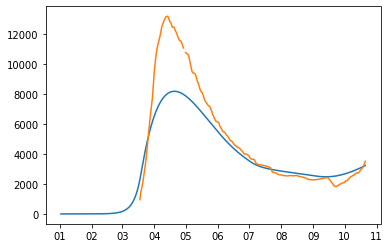

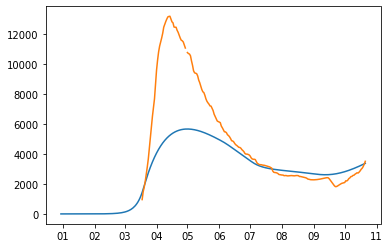

best_error: 2.075469069869187
vector: [array([2.07546907])]
mean_deaths 0.05973397498701476
[7.35190718e+01 1.86002290e+00 7.77422506e-01 2.24194775e-01
 1.43655258e-01 6.42077018e-02 1.07718964e-01 1.34341248e-01
 8.98860603e-01 1.08773137e+00 1.14410546e+00 8.86283753e-01
 1.04515393e+00 7.88613515e-01 7.56069294e-01 1.09737077e+00
 9.81848705e-01]


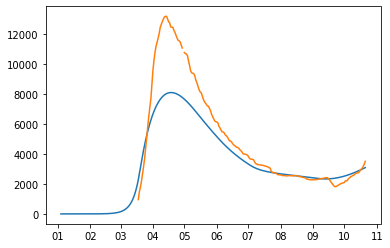

best_error: 2.5348364195637125
vector: [array([2.53483642])]
mean_deaths 0.23171439748873526
[7.94175101e+01 1.74234721e+00 7.82539725e-01 2.79075521e-01
 2.05704529e-01 4.25886001e-02 2.04566049e-02 1.21173261e-01
 9.76460979e-01 1.10651711e+00 1.03230821e+00 1.14132462e+00
 1.13370201e+00 7.73223676e-01 7.70986821e-01 1.14694026e+00
 1.00161386e+00]


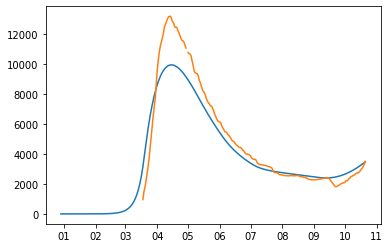

best_error: 2.63937072355856
vector: [array([2.63937072])]
mean_deaths 0.18670314978111244
[77.24739116  1.7326124   0.78293539  0.19038164  0.10023884  0.08840908
  0.20201347  0.10030682  0.85343163  1.10475389  1.03559613  0.94622335
  0.96194756  0.7773262   0.81912985  1.00537581  0.95655492]


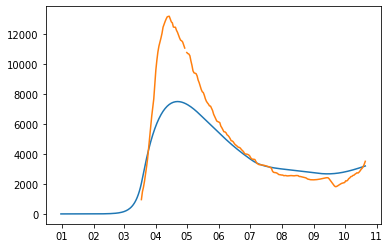

best_error: 2.1029882973485137
vector: [array([2.1029883])]
mean_deaths 0.03753391115236883
[7.57115010e+01 1.89246466e+00 7.80676632e-01 1.90662571e-01
 1.32043901e-01 4.88594257e-02 2.98303274e-01 1.35881737e-01
 9.56818398e-01 1.07981706e+00 1.04865824e+00 9.48859827e-01
 9.47168969e-01 9.02160169e-01 8.19831326e-01 1.11963774e+00
 9.15694839e-01]
best_error: 2.1994504825780576
vector: [array([2.19945048])]
mean_deaths 0.00396218292807702
[7.22704423e+01 1.94764601e+00 7.56055993e-01 2.71627470e-01
 1.12611999e-01 2.20208546e-02 4.79632453e-02 1.61433635e-01
 9.90243688e-01 1.01923591e+00 1.06555330e+00 1.02549012e+00
 9.75904771e-01 1.02561351e+00 7.56027868e-01 1.09210651e+00
 1.05586842e+00]


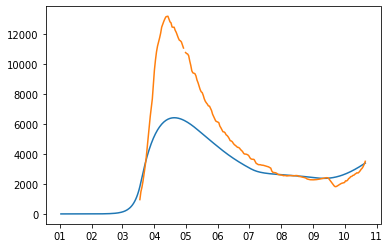

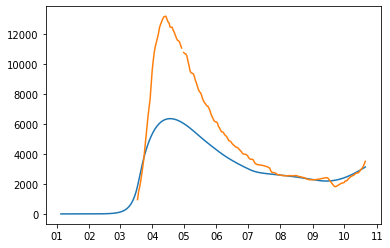

best_error: 2.3848805633673233
vector: [array([2.38488056])]
mean_deaths 0.008949058115889254
[6.94258314e+01 1.88959028e+00 7.28846244e-01 2.91243746e-01
 2.56735840e-01 4.83515886e-02 2.48725048e-01 1.79550451e-01
 9.16875405e-01 1.06661827e+00 1.21509150e+00 1.12875124e+00
 1.11738587e+00 7.65390674e-01 7.54638509e-01 1.07008073e+00
 8.51234770e-01]


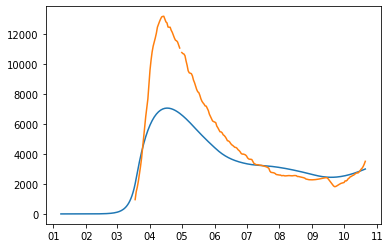

best_error: 2.2940544491861745
vector: [array([2.29405445])]
mean_deaths 0.03611102827039323
[7.09368633e+01 1.88414304e+00 7.44514858e-01 3.13759294e-01
 2.08285595e-02 8.07654299e-02 4.27900025e-01 1.16435131e-01
 9.69763365e-01 1.01840580e+00 1.10385188e+00 7.85665350e-01
 1.21563455e+00 1.00515925e+00 8.11482413e-01 1.17259181e+00
 8.38184541e-01]


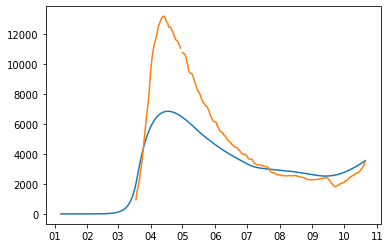

best_error: 2.4115831521444577
vector: [array([2.41158315])]
mean_deaths 0.003995426474772739
[6.88069674e+01 1.93604520e+00 7.59943518e-01 3.23863065e-01
 1.71787984e-01 7.68302869e-02 4.04585309e-01 6.88008079e-02
 8.54342420e-01 1.06628625e+00 1.24086964e+00 1.05104847e+00
 1.18287202e+00 7.55342584e-01 8.87143435e-01 9.18876583e-01
 8.74012997e-01]


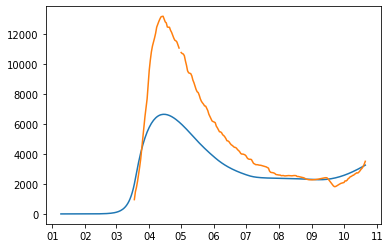

best_error: 2.0940697724637842
vector: [array([2.09406977])]
mean_deaths 0.1287958673170729
[7.13124486e+01 1.82443403e+00 8.00467360e-01 6.22610467e-02
 6.31341339e-02 7.47355673e-02 2.70183777e-01 1.08396654e-01
 9.74137464e-01 1.12972041e+00 1.22532403e+00 1.15746586e+00
 9.36465575e-01 9.80585923e-01 7.73496995e-01 1.06267161e+00
 1.02855165e+00]


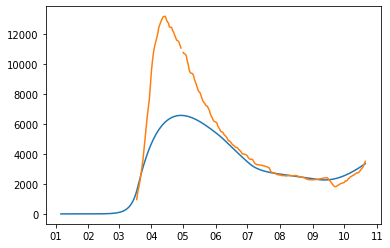

best_error: 2.0776275941029163
vector: [array([2.07762759])]
mean_deaths 0.013823460624560526
[72.60459514  1.90656846  0.76013344  0.11539773  0.07729479  0.09200389
  0.27439185  0.15312899  0.94293052  1.10688556  1.12503044  0.97022711
  1.05070609  0.81146569  0.76451458  1.14483345  0.75204499]


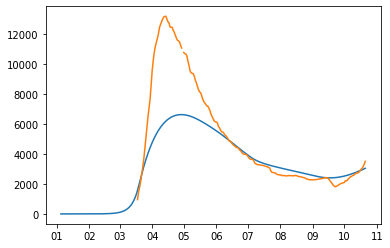

best_error: 2.0405726456098208
vector: [array([2.04057265])]
mean_deaths 0.005557522573768941
[7.06910653e+01 1.82465269e+00 7.54365562e-01 2.97498280e-01
 1.52731450e-01 6.80004277e-02 4.33755774e-01 1.60394884e-01
 8.79331724e-01 1.07499746e+00 1.19292699e+00 7.67403238e-01
 1.11465374e+00 7.61416869e-01 7.94669108e-01 8.30049307e-01
 8.25003714e-01]


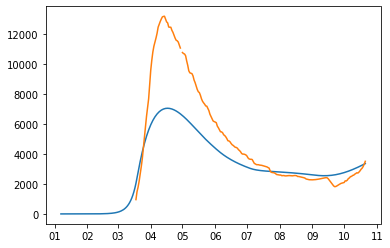

best_error: 2.0527446861938365
vector: [array([2.05274469])]
mean_deaths 0.011368691538663597
[7.31217231e+01 1.96701783e+00 7.74413423e-01 2.85473052e-01
 9.84107540e-02 3.82598267e-02 1.26821902e-01 4.20838033e-02
 9.77492970e-01 1.05516219e+00 1.09496994e+00 9.03905233e-01
 1.08883239e+00 8.02836474e-01 7.77776725e-01 1.03453816e+00
 7.75802001e-01]


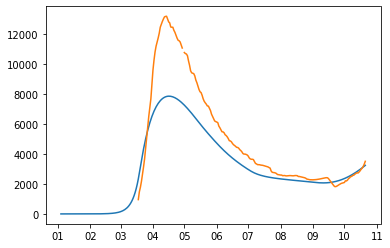

best_error: 2.4215953386028155
vector: [array([2.42159534])]
mean_deaths 0.08343367753057072
[7.78982682e+01 1.75723923e+00 7.53250391e-01 5.41881172e-01
 9.18429343e-02 2.90144609e-02 2.98116663e-01 3.39828962e-02
 9.04092893e-01 1.00780413e+00 9.36372730e-01 7.92925612e-01
 1.22977819e+00 8.72916467e-01 8.11717643e-01 1.09494856e+00
 1.03615548e+00]


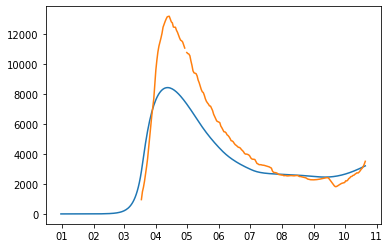

best_error: 2.036558708377421
vector: [array([2.03655871])]
mean_deaths 0.04921079144331241
[7.32906269e+01 1.76521384e+00 7.78311505e-01 1.08956374e-01
 7.41465360e-02 6.58816612e-02 7.48610827e-02 1.28359378e-01
 9.52965811e-01 1.15090417e+00 1.18975198e+00 7.91213389e-01
 1.11138864e+00 8.38483606e-01 7.80251117e-01 7.68051882e-01
 7.63660113e-01]


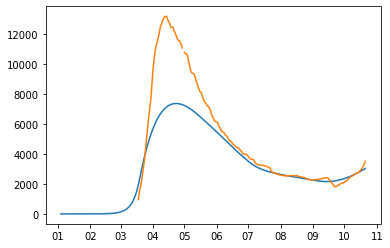

best_error: 2.1376960473066227
vector: [array([2.13769605])]
mean_deaths 0.038460033923207515
[6.90450847e+01 1.82465269e+00 7.54365562e-01 1.73767687e-01
 1.21600614e-01 6.74427785e-02 9.11090923e-03 1.60394884e-01
 8.83033311e-01 1.09709402e+00 1.22330548e+00 7.67403238e-01
 1.17379528e+00 9.22144193e-01 7.94669108e-01 7.62449084e-01
 8.25003714e-01]


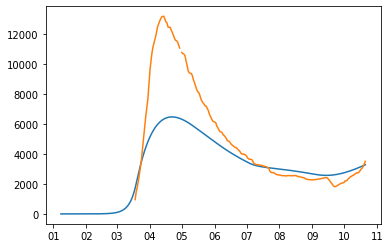

best_error: 2.257344316318188
vector: [array([2.25734432])]
mean_deaths 0.01307607144561005
[7.53445107e+01 1.89195438e+00 7.89474072e-01 1.30812884e-01
 2.20900296e-01 7.11072648e-02 2.67638010e-01 1.55679401e-01
 8.17664976e-01 1.16334662e+00 1.13317978e+00 9.08342954e-01
 1.15404394e+00 7.94884350e-01 7.88100310e-01 9.39513052e-01
 1.06855774e+00]


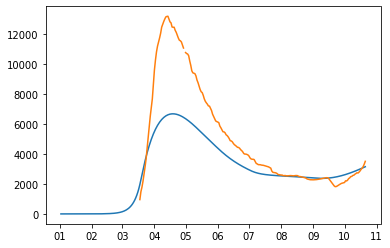

best_error: 2.020556946001498
vector: [array([2.02055695])]
mean_deaths 0.14155021798523346
[7.13730936e+01 1.76831552e+00 7.71313122e-01 1.77048025e-01
 1.25790372e-02 7.79179112e-02 1.02337722e-01 1.75636101e-01
 9.47196028e-01 1.11164635e+00 1.21471574e+00 7.98090137e-01
 1.14738047e+00 7.65145249e-01 7.71494646e-01 1.02487461e+00
 1.20721004e+00]


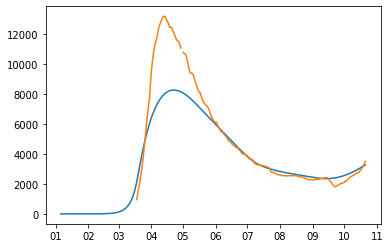

best_error: 1.9647289538157673
vector: [array([1.96472895])]
mean_deaths 0.11976188700596303
[7.13699826e+01 1.88955039e+00 7.76642494e-01 1.87143420e-01
 7.92012166e-03 3.28739444e-02 7.00464130e-02 9.26153020e-02
 9.86609633e-01 1.10014364e+00 1.21092521e+00 9.47818146e-01
 1.21654962e+00 7.74654366e-01 7.53719112e-01 1.07202776e+00
 1.05863607e+00]


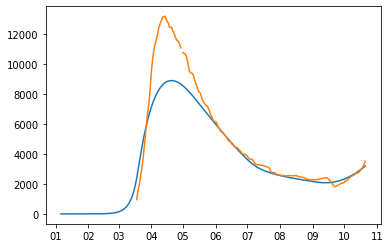

best_error: 2.1545437869359487
vector: [array([2.15454379])]
mean_deaths 0.16635040658178063
[7.60642970e+01 1.55356704e+00 7.77613579e-01 1.46253444e-01
 5.50911499e-02 2.05405753e-02 1.98619995e-01 1.39407015e-01
 9.79794152e-01 1.18703331e+00 1.16354537e+00 8.00357141e-01
 1.22203687e+00 7.99869114e-01 8.54257822e-01 1.03099493e+00
 9.08753461e-01]


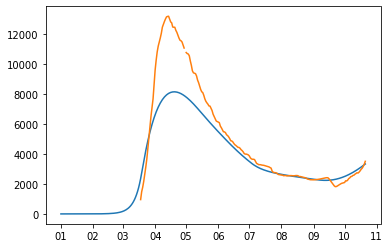

best_error: 1.9796978696313485
vector: [array([1.97969787])]
mean_deaths 0.0186867113945375
[6.90494712e+01 1.79678078e+00 7.50945559e-01 6.07399954e-02
 6.81234026e-02 3.48309009e-02 2.00489847e-01 8.49736510e-03
 9.73204118e-01 1.15516381e+00 1.23213640e+00 1.06880576e+00
 1.19025344e+00 8.69514697e-01 7.53606942e-01 1.03147319e+00
 9.70818645e-01]


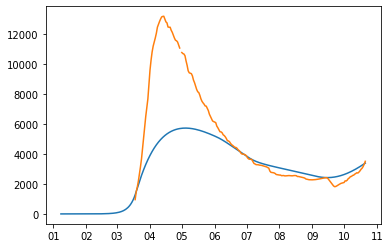

best_error: 2.026405630381944
vector: [array([2.02640563])]
mean_deaths 0.07856729529216022
[7.05364673e+01 1.90528141e+00 7.60389697e-01 1.09700006e-01
 1.65507048e-02 4.24359574e-02 1.43849126e-01 1.60353965e-01
 9.40830703e-01 1.10637267e+00 1.17169341e+00 9.72762661e-01
 1.23477783e+00 8.94289315e-01 7.57822298e-01 1.13690684e+00
 1.04378556e+00]


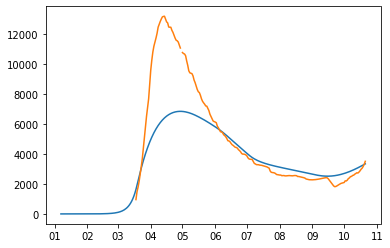

best_error: 2.06896678161296
vector: [array([2.06896678])]
mean_deaths 0.03146127826893421
[7.57365266e+01 1.68177332e+00 7.78911122e-01 3.12819800e-01
 2.20771746e-03 5.08936544e-02 8.24535717e-02 1.74382654e-01
 9.73406770e-01 1.06838681e+00 1.07698230e+00 7.63607487e-01
 9.47010097e-01 7.84010702e-01 7.58900056e-01 1.07439014e+00
 1.12427328e+00]


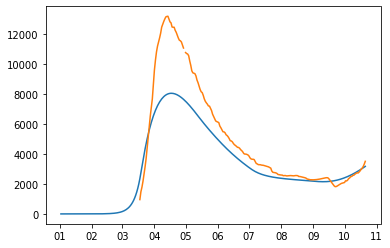

best_error: 1.9143791428690604
vector: [array([1.91437914])]
mean_deaths 0.05818519314283035
[7.28248176e+01 1.78981248e+00 7.81252394e-01 5.88229041e-02
 3.42757651e-02 1.67891201e-02 4.65895809e-01 3.25121061e-02
 9.55889299e-01 1.17201220e+00 1.20723989e+00 8.94924730e-01
 1.19624872e+00 8.72580323e-01 7.71737044e-01 1.05846325e+00
 1.06363262e+00]


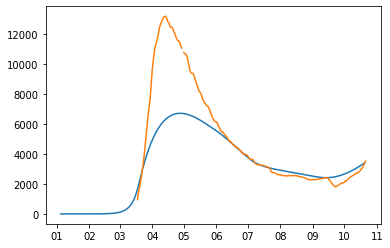

best_error: 2.1636295938091004
vector: [array([2.16362959])]
mean_deaths 0.09976950958870867
[7.41423568e+01 1.78748670e+00 7.82631175e-01 1.64324928e-01
 9.59484533e-02 2.33531000e-02 5.01834055e-01 1.62949749e-01
 9.86457408e-01 1.12358583e+00 1.15521462e+00 8.84522236e-01
 1.08267817e+00 9.10741098e-01 7.52505557e-01 8.08889219e-01
 1.15629892e+00]


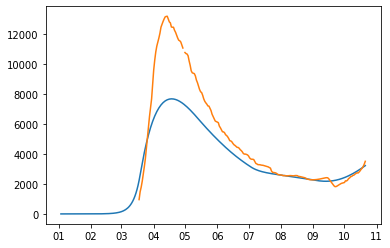

best_error: 1.976540309322591
vector: [array([1.97654031])]
mean_deaths 0.007186710015062867
[7.44429065e+01 1.80167450e+00 7.87062084e-01 3.71892821e-02
 6.38270906e-02 6.87888613e-03 5.59109035e-01 5.15880376e-02
 9.55618549e-01 1.20410676e+00 1.17416101e+00 8.16094865e-01
 1.15222193e+00 8.37430153e-01 8.19308543e-01 8.38509624e-01
 1.08880206e+00]


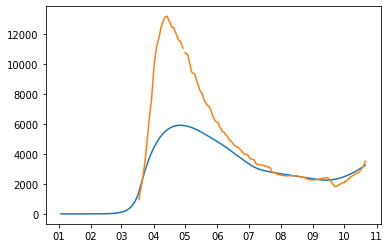

best_error: 2.1896309190493892
vector: [array([2.18963092])]
mean_deaths 0.0035206979138097208
[7.59819665e+01 1.84634055e+00 7.95463872e-01 1.12420182e-01
 2.28896857e-01 2.23572701e-02 4.71179282e-01 9.23042072e-04
 8.56898964e-01 1.15226846e+00 1.15610784e+00 9.56507598e-01
 1.02471085e+00 9.12380333e-01 7.54085937e-01 1.08462675e+00
 8.03521961e-01]


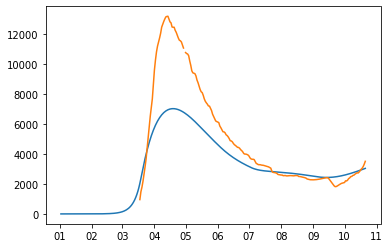

best_error: 2.0080917001886394
vector: [array([2.0080917])]
mean_deaths 0.033253455678044046
[7.58522845e+01 1.73219809e+00 7.72846090e-01 2.45777930e-02
 9.08361694e-02 2.52296233e-02 4.54277275e-01 1.08437880e-01
 9.76270138e-01 1.19280717e+00 1.11953814e+00 8.68314783e-01
 1.18903659e+00 9.91154045e-01 7.84258430e-01 9.44666959e-01
 1.00493199e+00]


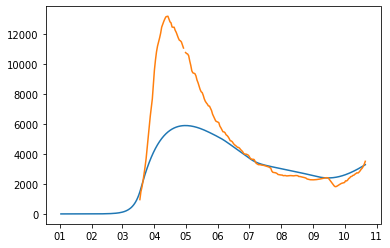

best_error: 2.032009727327084
vector: [array([2.03200973])]
mean_deaths 0.08943269292482017
[7.29888248e+01 1.97561373e+00 8.15088836e-01 6.17121675e-03
 6.83529328e-03 9.30073010e-02 1.66010518e-01 1.16689176e-01
 9.93398662e-01 1.16992216e+00 1.22885406e+00 8.89140629e-01
 9.82978011e-01 8.03034414e-01 7.77749095e-01 9.49998748e-01
 1.09885086e+00]


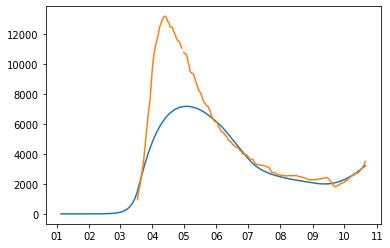

best_error: 1.8963268901433368
vector: [array([1.89632689])]
mean_deaths 0.019388797417328192
[7.33686500e+01 1.87738255e+00 7.85851482e-01 1.01019150e-01
 4.33205165e-02 2.79864257e-02 5.45898618e-01 8.65949222e-02
 9.32600724e-01 1.15065603e+00 1.15246248e+00 8.19017136e-01
 1.16615782e+00 8.64048940e-01 7.92919421e-01 1.11123641e+00
 1.02033483e+00]


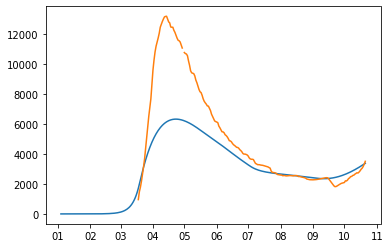

best_error: 2.171948566685275
vector: [array([2.17194857])]
mean_deaths 0.05063992840162738
[7.52234077e+01 1.81447345e+00 7.78936381e-01 5.12526482e-02
 6.31296767e-02 5.01281908e-02 5.52368872e-01 1.90354388e-01
 9.47449542e-01 1.19123623e+00 1.10831706e+00 1.24970347e+00
 1.14777762e+00 7.87547341e-01 8.69029366e-01 1.21073199e+00
 9.38178184e-01]


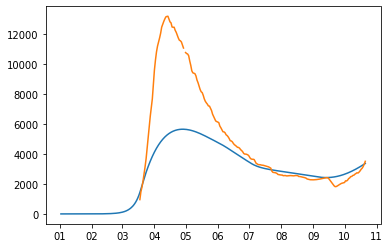

best_error: 2.0973459276666464
vector: [array([2.09734593])]
mean_deaths 0.0008996669160861229
[7.12261284e+01 1.84083186e+00 7.98969855e-01 2.61414135e-01
 2.27484862e-02 3.27898120e-02 4.92859729e-01 9.39669695e-02
 8.11498660e-01 1.07992527e+00 1.19292316e+00 8.36852690e-01
 1.02489795e+00 7.77918900e-01 7.88028933e-01 1.19616219e+00
 9.03170886e-01]


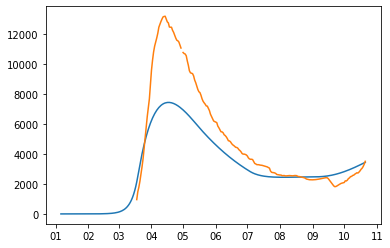

best_error: 1.9541584876512
vector: [array([1.95415849])]
mean_deaths 0.09272495993364095
[7.55354952e+01 1.81576963e+00 8.02158389e-01 1.00382548e-01
 2.50531093e-02 7.21483657e-03 2.48127681e-01 5.41705826e-04
 9.33408381e-01 1.13941811e+00 1.11982879e+00 8.51625325e-01
 1.06989721e+00 8.15570696e-01 7.57124978e-01 1.08088770e+00
 8.08408640e-01]


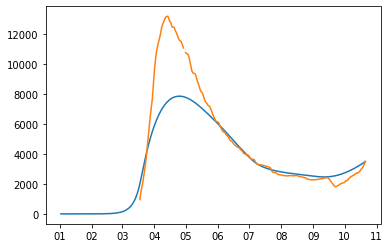

best_error: 2.094276430934404
vector: [array([2.09427643])]
mean_deaths 0.04653592242529079
[7.25894570e+01 1.76925349e+00 7.91370260e-01 2.64776133e-01
 4.51592806e-03 4.25886001e-02 3.76549383e-01 1.14847149e-01
 9.01756891e-01 1.08978281e+00 1.18218390e+00 8.65355639e-01
 1.16094033e+00 8.62501832e-01 7.91771900e-01 1.24252908e+00
 9.91797818e-01]


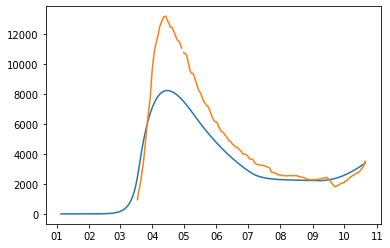

best_error: 2.137670593702281
vector: [array([2.13767059])]
mean_deaths 0.005166394953992604
[6.96127785e+01 1.92962184e+00 7.72414150e-01 2.07472935e-01
 7.87622788e-02 4.11575747e-02 5.27206325e-01 1.00946007e-01
 9.31526814e-01 1.10227582e+00 1.24290974e+00 9.66979700e-01
 1.14156488e+00 7.72284551e-01 8.27729892e-01 1.02810071e+00
 1.11526978e+00]


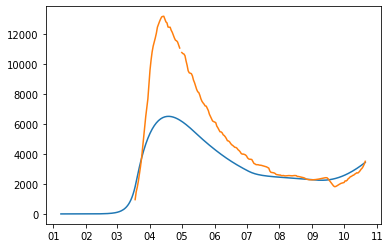

best_error: 1.8944246316585678
vector: [array([1.89442463])]
mean_deaths 0.01657632019228813
[7.16829538e+01 1.97240593e+00 7.73209363e-01 1.01019150e-01
 4.33205165e-02 7.11589766e-03 3.03660120e-01 8.78972726e-03
 9.32600724e-01 1.12396774e+00 1.15681857e+00 9.16024632e-01
 1.24645231e+00 8.36203003e-01 7.81417354e-01 1.16083796e+00
 9.41360829e-01]


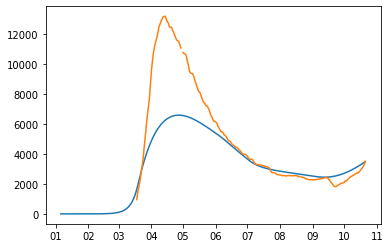

best_error: 1.6613377040076078
vector: [array([1.6613377])]
mean_deaths 0.004746384319895506
[7.49617119e+01 1.97757038e+00 8.01153735e-01 1.95615320e-02
 8.44536605e-03 3.74615464e-02 4.77919377e-01 4.20307293e-02
 9.34221193e-01 1.18211084e+00 1.13898080e+00 7.82497464e-01
 1.20179978e+00 8.15330510e-01 7.85263046e-01 1.11114880e+00
 8.31635551e-01]


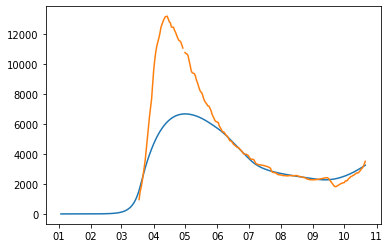

best_error: 1.9105848802915557
vector: [array([1.91058488])]
mean_deaths 0.11925173557139199
[7.55008300e+01 1.79531453e+00 7.98852517e-01 1.08203748e-01
 1.61071422e-02 2.42789889e-02 4.67628885e-01 5.71985029e-02
 9.57344493e-01 1.15002414e+00 1.13773551e+00 8.04691751e-01
 1.13998551e+00 8.63017343e-01 8.01875570e-01 1.18131808e+00
 1.10093098e+00]


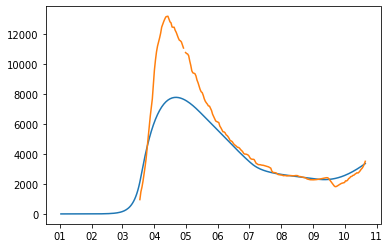

best_error: 1.9691874822787643
vector: [array([1.96918748])]
mean_deaths 0.004803029470843109
[7.31804007e+01 1.87660070e+00 7.71844108e-01 4.79529467e-02
 2.37605267e-02 3.81525946e-02 4.64327968e-01 1.09450546e-01
 9.98430341e-01 1.18191241e+00 1.15653049e+00 7.87890512e-01
 1.22504317e+00 7.80365697e-01 8.37219096e-01 1.17546701e+00
 1.09861103e+00]


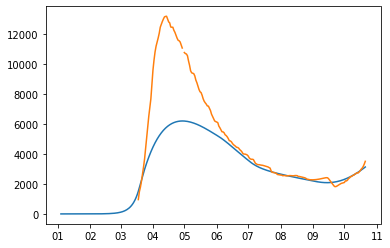

best_error: 2.0511343251159606
vector: [array([2.05113433])]
mean_deaths 0.009707796978611538
[7.33251055e+01 1.79531453e+00 7.76211305e-01 1.08203748e-01
 2.78237879e-02 2.42789889e-02 5.63078033e-01 5.71985029e-02
 9.81667438e-01 1.15002414e+00 1.15501735e+00 9.52481448e-01
 1.13998551e+00 8.63017343e-01 7.77140581e-01 1.10221197e+00
 9.20792632e-01]


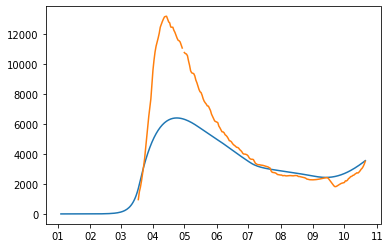

best_error: 2.0120130068544237
vector: [array([2.01201301])]
mean_deaths 0.07692281811326837
[7.75300351e+01 1.87860191e+00 8.06150256e-01 6.61321164e-03
 2.99615351e-02 5.77110910e-02 1.23233306e-01 1.36090640e-01
 9.54501613e-01 1.17081809e+00 1.06683294e+00 8.60899054e-01
 1.06323224e+00 9.29742189e-01 7.63333023e-01 9.16199989e-01
 8.19760299e-01]


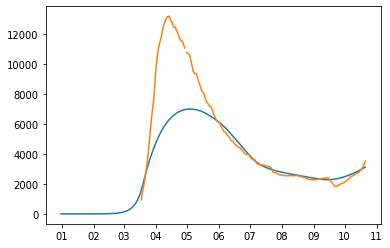

best_error: 1.809804438752962
vector: [array([1.80980444])]
mean_deaths 0.023134579199210636
[7.32961204e+01 1.96677181e+00 7.82322075e-01 7.89495746e-02
 8.06597042e-02 6.81683812e-02 2.95293189e-01 1.13926227e-01
 9.29854301e-01 1.15178725e+00 1.14273614e+00 1.05103140e+00
 1.17725178e+00 7.61362633e-01 7.85141282e-01 1.09427621e+00
 9.03758819e-01]


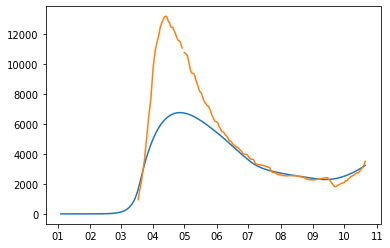

best_error: 1.8527759224058524
vector: [array([1.85277592])]
mean_deaths 0.025807362604753147
[7.45621039e+01 1.96094629e+00 7.92607173e-01 4.73381408e-02
 3.47444107e-02 6.38605162e-02 2.86575114e-01 1.36090640e-01
 9.40548168e-01 1.16495186e+00 1.13192671e+00 8.15263622e-01
 1.21980586e+00 8.40803778e-01 7.89072202e-01 1.03191491e+00
 9.14415932e-01]


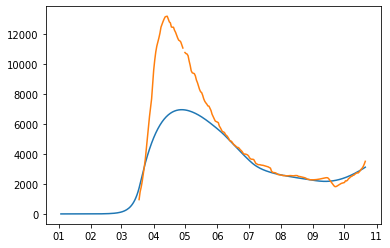

best_error: 1.8886380975581631
vector: [array([1.8886381])]
mean_deaths 0.07065901381570959
[7.59269043e+01 1.95805687e+00 8.05057903e-01 8.79378234e-02
 1.18339428e-02 3.62823331e-02 1.99593147e-01 5.14680682e-02
 9.30493722e-01 1.14783606e+00 1.11005082e+00 8.46478293e-01
 1.24547755e+00 8.53264062e-01 8.11689878e-01 1.09896511e+00
 7.91260714e-01]


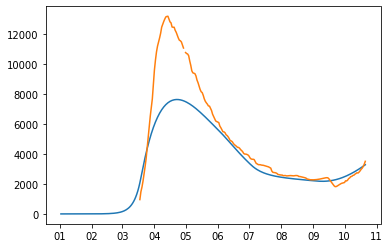

best_error: 1.9553035977871216
vector: [array([1.9553036])]
mean_deaths 0.03408708882759219
[7.51238491e+01 1.98524745e+00 7.95408290e-01 2.30384893e-02
 6.91533723e-02 9.91769616e-03 5.36546392e-01 1.46236670e-01
 9.05254633e-01 1.17216418e+00 1.10298324e+00 7.70462426e-01
 1.19955075e+00 8.70992926e-01 7.71256763e-01 1.06893388e+00
 8.81196605e-01]


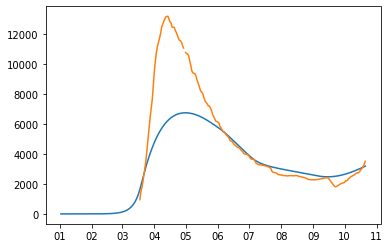

best_error: 1.626115230604546
vector: [array([1.62611523])]
mean_deaths 0.033945978777791236
[7.47187073e+01 1.99039948e+00 8.21743652e-01 1.66034694e-02
 5.84909083e-03 1.41989843e-02 3.05525883e-01 6.86855339e-02
 9.16661655e-01 1.18941546e+00 1.18015454e+00 8.25386290e-01
 1.21341804e+00 8.05298831e-01 7.52696155e-01 1.08949121e+00
 9.56416986e-01]


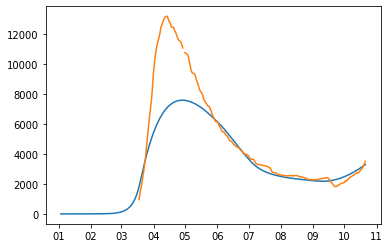

best_error: 1.824586573877313
vector: [array([1.82458657])]
mean_deaths 0.007202084517312798
[7.32906269e+01 1.99213195e+00 8.15124901e-01 1.72601804e-02
 7.46337008e-02 7.31416548e-03 4.25300769e-02 1.28359378e-01
 8.93238660e-01 1.14721106e+00 1.14483196e+00 7.91213389e-01
 1.01662854e+00 1.01241699e+00 7.80251117e-01 1.21225705e+00
 1.06628816e+00]


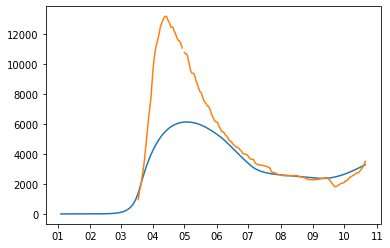

best_error: 1.9037253087027022
vector: [array([1.90372531])]
mean_deaths 0.07682835201779246
[7.59545127e+01 1.93442607e+00 8.07503417e-01 1.69469557e-02
 5.65008743e-02 5.15751455e-03 1.84430932e-02 5.11599685e-02
 9.26196977e-01 1.17121334e+00 1.12425723e+00 7.67604757e-01
 1.13795344e+00 9.17492054e-01 7.79089106e-01 9.96514384e-01
 1.00296069e+00]


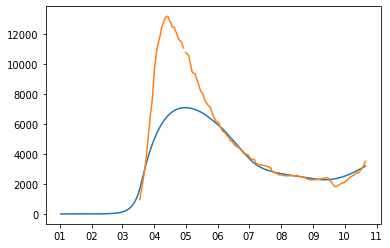

best_error: 1.8224497738027379
vector: [array([1.82244977])]
mean_deaths 0.009548688412529075
[7.16829538e+01 1.96648564e+00 7.73209363e-01 1.01019150e-01
 4.33205165e-02 5.13331439e-03 3.03660120e-01 1.11900581e-01
 9.32600724e-01 1.12396774e+00 1.15681857e+00 7.87648109e-01
 1.17531126e+00 8.01677562e-01 7.81417354e-01 1.04602663e+00
 9.54213449e-01]


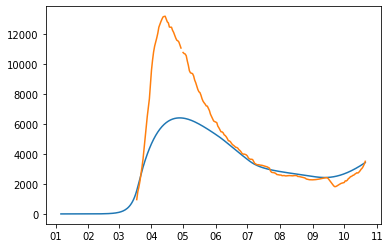

best_error: 1.8733029121272056
vector: [array([1.87330291])]
mean_deaths 0.019487816798753988
[7.34669850e+01 1.89405800e+00 7.84772107e-01 2.11393239e-02
 9.38967425e-02 1.46154779e-02 1.81405686e-01 1.06528638e-01
 9.80683365e-01 1.18839526e+00 1.16963453e+00 1.13320466e+00
 1.14718901e+00 8.39174688e-01 7.63193315e-01 8.85794977e-01
 8.21388059e-01]


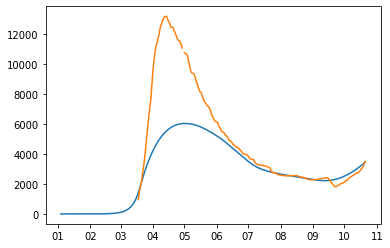

best_error: 1.88401622860193
vector: [array([1.88401623])]
mean_deaths 0.044842292253562545
[7.56961309e+01 1.96283504e+00 8.45025037e-01 7.37275930e-03
 1.36236248e-02 4.13917883e-02 4.21480140e-01 1.63944767e-01
 9.61474232e-01 1.20260022e+00 1.20561449e+00 8.41569900e-01
 1.08678975e+00 8.21015863e-01 7.82371476e-01 1.13472459e+00
 8.67127340e-01]


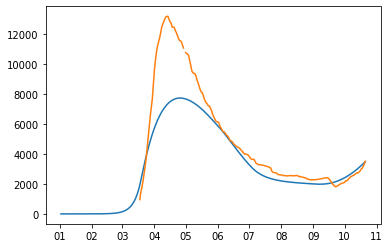

best_error: 1.7331958001750905
vector: [array([1.7331958])]
mean_deaths 0.012150682873693962
[7.55682075e+01 1.84277905e+00 8.17530665e-01 3.22705358e-03
 9.48224013e-02 7.19484714e-03 4.36842052e-02 1.10925912e-01
 9.01063175e-01 1.19825492e+00 1.17021250e+00 9.00095804e-01
 1.12555463e+00 9.84426205e-01 7.61564176e-01 1.05258793e+00
 7.95222001e-01]


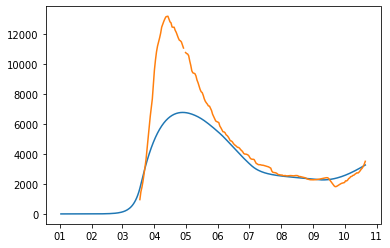

best_error: 1.9607722561672878
vector: [array([1.96077226])]
mean_deaths 0.09814667728520235
[7.41407554e+01 1.94250748e+00 8.37372541e-01 1.88219019e-02
 8.58982058e-02 8.69659481e-02 5.75527858e-01 1.02157360e-01
 8.71801195e-01 1.19705273e+00 1.23364941e+00 1.00743396e+00
 1.19023669e+00 9.28831125e-01 7.70629225e-01 1.20532940e+00
 8.45917274e-01]


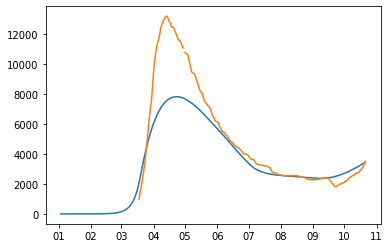

best_error: 1.8905958190648375
vector: [array([1.89059582])]
mean_deaths 0.021925057896792353
[7.10997844e+01 1.94250748e+00 7.96329193e-01 6.45293507e-02
 8.58982058e-02 8.69659481e-02 1.51896286e-01 1.02157360e-01
 8.71801195e-01 1.14468770e+00 1.21779088e+00 8.10938602e-01
 1.14297340e+00 9.28831125e-01 7.80171128e-01 9.59737877e-01
 9.32770464e-01]


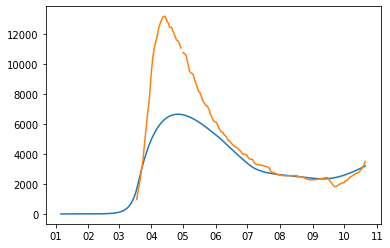

best_error: 1.8163160311234225
vector: [array([1.81631603])]
mean_deaths 0.08680719685036731
[7.56411698e+01 1.93931487e+00 8.07089221e-01 4.06478975e-02
 1.25243652e-01 3.77180748e-02 3.87937371e-01 1.28147621e-01
 9.76031874e-01 1.16676793e+00 1.15010503e+00 8.51099723e-01
 1.01328238e+00 7.82707284e-01 7.58607433e-01 9.96765264e-01
 8.80409268e-01]


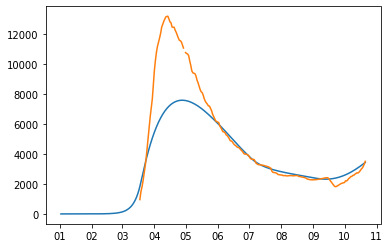

best_error: 1.9059678307412233
vector: [array([1.90596783])]
mean_deaths 0.025686153071242137
[7.36029602e+01 1.89869552e+00 7.99978237e-01 3.79399850e-02
 4.86373036e-02 2.25694761e-02 1.38454681e-01 1.01331348e-02
 9.18429696e-01 1.17769474e+00 1.18333715e+00 8.12045428e-01
 1.20199091e+00 9.04893229e-01 7.64773854e-01 1.09404775e+00
 9.97711012e-01]


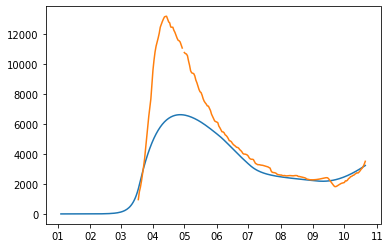

best_error: 1.5537532117660773
vector: [array([1.55375321])]
mean_deaths 0.021264808029280147
[7.41367471e+01 1.80347685e+00 8.07703876e-01 6.02788819e-02
 2.15615522e-02 9.67761664e-03 2.94962748e-01 1.57205551e-01
 9.59603072e-01 1.17033182e+00 1.18578477e+00 7.66859645e-01
 1.12428715e+00 8.99445488e-01 7.54508812e-01 1.03536203e+00
 8.32121893e-01]


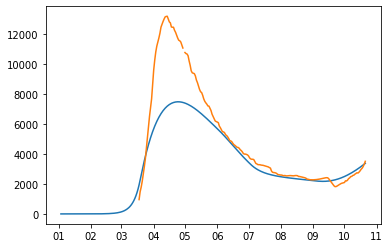

best_error: 1.9448901089398216
vector: [array([1.94489011])]
mean_deaths 0.12186559496242653
[7.47266027e+01 1.85690688e+00 8.11696199e-01 2.43779118e-02
 1.60995611e-02 6.94444417e-04 6.36124847e-01 6.84048003e-02
 9.82593481e-01 1.18883144e+00 1.21188434e+00 7.57242774e-01
 1.10965882e+00 8.57163035e-01 8.08673788e-01 1.20761323e+00
 7.92496941e-01]


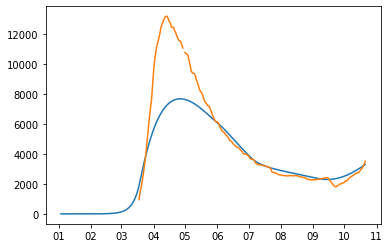

best_error: 1.865911310415126
vector: [array([1.86591131])]
mean_deaths 0.03641630724842183
[7.31804996e+01 1.80347685e+00 7.88929694e-01 5.58996551e-02
 1.35048512e-01 9.67761664e-03 2.51528473e-01 1.79922793e-01
 9.59603072e-01 1.17956053e+00 1.22209079e+00 1.05269765e+00
 1.12428715e+00 9.02361502e-01 7.56849888e-01 9.91012215e-01
 8.62288404e-01]


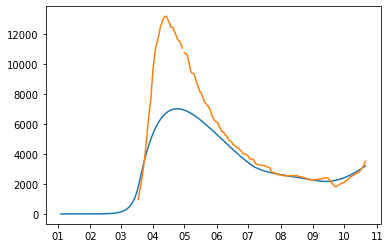

best_error: 1.6805072735095972
vector: [array([1.68050727])]
mean_deaths 0.0010518774049598587
[7.43176317e+01 1.92650811e+00 7.71790927e-01 5.58552942e-02
 2.41999661e-02 1.18847262e-02 3.63098753e-01 6.21476968e-02
 9.92689906e-01 1.15605641e+00 1.09447404e+00 7.90688024e-01
 1.18333384e+00 7.90899906e-01 7.98288446e-01 1.01638058e+00
 8.07138822e-01]


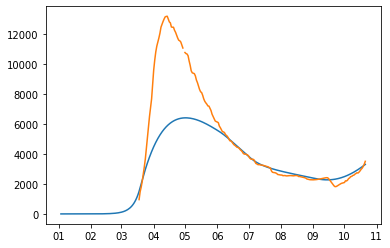

best_error: 1.639907791449099
vector: [array([1.63990779])]
mean_deaths 0.02644321379140934
[7.57601063e+01 1.84630693e+00 8.17530665e-01 3.36436374e-02
 9.94422560e-03 7.19484714e-03 4.36842052e-02 1.99586449e-01
 9.01063175e-01 1.18011870e+00 1.15040858e+00 9.00095804e-01
 1.10571116e+00 8.66420618e-01 7.61564176e-01 1.15273066e+00
 7.95222001e-01]


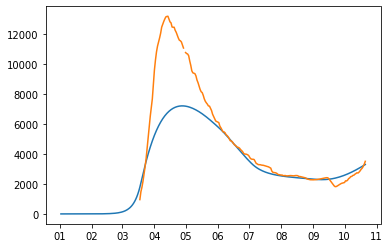

best_error: 1.7665565546047473
vector: [array([1.76655655])]
mean_deaths 0.01582163292604749
[7.78336080e+01 1.78645191e+00 8.06286228e-01 2.20503255e-02
 1.79777716e-02 8.95866394e-03 8.96481402e-03 1.26903254e-01
 9.64610774e-01 1.17384721e+00 1.06781608e+00 8.12819019e-01
 1.09223799e+00 1.04415165e+00 7.76600831e-01 1.17757690e+00
 9.86776795e-01]


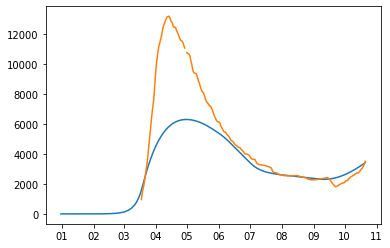

best_error: 1.95644720528421
vector: [array([1.95644721])]
mean_deaths 0.054046125103874125
[7.51293233e+01 1.94089929e+00 8.20407076e-01 6.15958954e-02
 2.80532169e-03 8.37024164e-02 7.09685173e-01 1.29065670e-01
 9.46802924e-01 1.18605669e+00 1.17946525e+00 8.07295917e-01
 1.20780625e+00 8.13553612e-01 7.61259137e-01 1.14004911e+00
 7.79261705e-01]


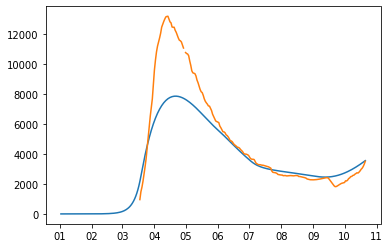

best_error: 1.9355641612924606
vector: [array([1.93556416])]
mean_deaths 0.09553172236056753
[7.55020498e+01 1.79866092e+00 8.15746947e-01 3.53853149e-02
 1.43691707e-02 8.91665318e-02 1.29103475e-01 1.61285264e-01
 9.73644222e-01 1.17684758e+00 1.16042967e+00 1.08989247e+00
 1.02764120e+00 8.51416100e-01 7.60973105e-01 1.03668392e+00
 8.18229272e-01]


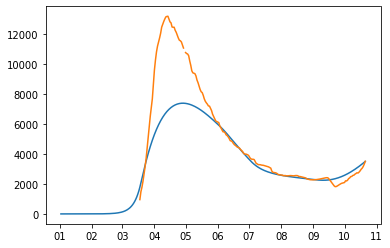

best_error: 1.8770515828221455
vector: [array([1.87705158])]
mean_deaths 0.09769004233880721
[7.41904970e+01 1.86815301e+00 7.97597277e-01 5.55752425e-02
 5.40831302e-02 3.81525946e-02 2.84893255e-01 9.51255168e-02
 9.69224808e-01 1.17265906e+00 1.18541035e+00 7.87890512e-01
 1.16602002e+00 7.91540229e-01 7.58227616e-01 1.17546701e+00
 1.09861103e+00]


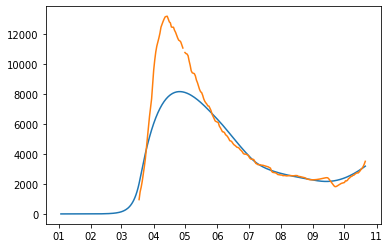

best_error: 1.8761272269395792
vector: [array([1.87612723])]
mean_deaths 0.02591563762581468
[7.29888248e+01 1.83211321e+00 7.87534588e-01 6.17121675e-03
 4.97138465e-02 9.30073010e-02 1.28871809e-01 1.36067707e-01
 9.93398662e-01 1.16992216e+00 1.19342010e+00 1.02680021e+00
 9.82978011e-01 8.89901416e-01 7.77749095e-01 1.08429144e+00
 8.16930405e-01]


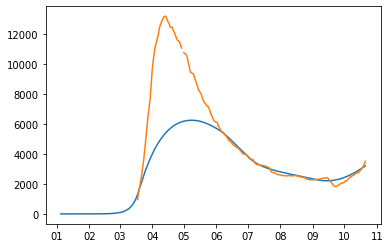

best_error: 1.8328602135316188
vector: [array([1.83286021])]
mean_deaths 0.08690983845410212
[7.63038523e+01 1.73188732e+00 8.38419381e-01 2.84510259e-02
 2.47997512e-03 3.79874437e-02 3.95698229e-01 1.30506443e-01
 9.26196977e-01 1.20742451e+00 1.20523442e+00 7.67604757e-01
 1.13795344e+00 9.19616193e-01 7.51617795e-01 9.96514384e-01
 8.41723123e-01]


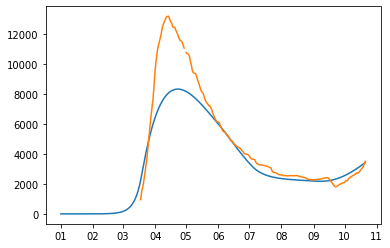

best_error: 1.7267925924968843
vector: [array([1.72679259])]
mean_deaths 0.08188325865131225
[7.40465689e+01 1.74312522e+00 8.09327005e-01 4.71040669e-02
 6.70250753e-03 1.94216018e-02 2.26458068e-01 7.98791053e-02
 9.80535557e-01 1.17810732e+00 1.20391614e+00 8.57849264e-01
 1.06343927e+00 8.38495069e-01 7.59919168e-01 1.15468328e+00
 7.85710250e-01]


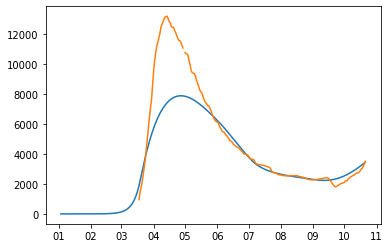

best_error: 1.7175308109282128
vector: [array([1.71753081])]
mean_deaths 0.022638393773494667
[7.32679403e+01 1.84683716e+00 7.94646687e-01 1.12016980e-02
 1.68961940e-02 8.78375470e-02 1.93406602e-01 1.68423768e-02
 9.35226349e-01 1.17357963e+00 1.15917091e+00 8.44805757e-01
 1.14020424e+00 9.48877982e-01 7.54112008e-01 1.06227206e+00
 9.93627344e-01]


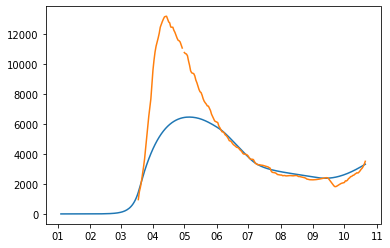

best_error: 1.8753956238363219
vector: [array([1.87539562])]
mean_deaths 0.054127544109711725
[7.54114808e+01 1.86207422e+00 8.26340398e-01 3.85318124e-03
 4.16572176e-02 6.59793201e-02 5.79289101e-01 1.10996414e-01
 9.20269373e-01 1.22306012e+00 1.21653299e+00 8.91742700e-01
 1.17233306e+00 8.68561060e-01 7.73059961e-01 1.01549306e+00
 1.01020008e+00]


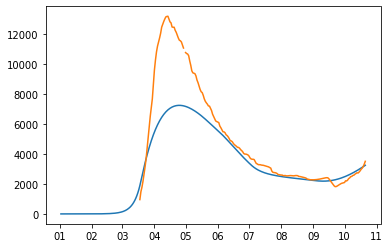

best_error: 1.6769510976946744
vector: [array([1.6769511])]
mean_deaths 0.006327828438227746
[7.29495563e+01 1.79483524e+00 7.73582542e-01 7.93076209e-02
 1.07122568e-01 2.16642632e-02 2.98600980e-01 1.73018171e-01
 9.56985737e-01 1.15900979e+00 1.19988440e+00 7.59536509e-01
 1.15903191e+00 9.05907175e-01 7.52684947e-01 9.53906052e-01
 9.85136752e-01]


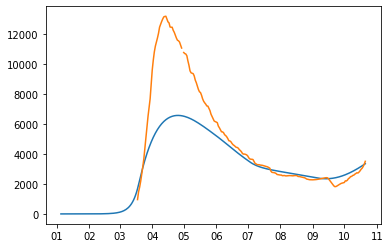

best_error: 1.9087598120993068
vector: [array([1.90875981])]
mean_deaths 0.11486514203250033
[7.49874842e+01 1.90112833e+00 8.17361220e-01 6.41192043e-04
 6.73203790e-02 6.08474822e-02 2.19253293e-01 1.85083933e-01
 9.49947150e-01 1.17286902e+00 1.17390546e+00 7.68795020e-01
 1.02469047e+00 8.96282106e-01 7.61885283e-01 1.04877963e+00
 1.06200352e+00]


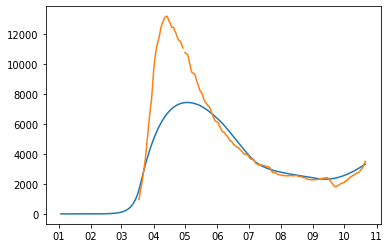

best_error: 1.8511230335745896
vector: [array([1.85112303])]
mean_deaths 0.007001475122551556
[7.65003390e+01 1.82858800e+00 8.04929665e-01 2.79933459e-02
 4.97138465e-02 9.30073010e-02 2.79515271e-01 1.36067707e-01
 9.93398662e-01 1.18080556e+00 1.11290686e+00 1.24224234e+00
 9.82978011e-01 8.82204747e-01 7.69504840e-01 1.18882852e+00
 9.07019638e-01]


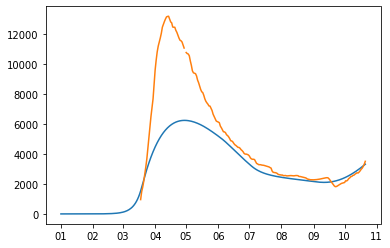

best_error: 1.8027037811421758
vector: [array([1.80270378])]
mean_deaths 0.04950547728897293
[7.43802924e+01 1.81213173e+00 8.05304044e-01 7.36563862e-02
 6.20292843e-02 4.65048361e-02 3.16911538e-01 1.31834649e-01
 8.99802842e-01 1.15767617e+00 1.17121212e+00 8.34549235e-01
 1.12423998e+00 9.39504793e-01 7.54279640e-01 1.24496755e+00
 1.06076459e+00]


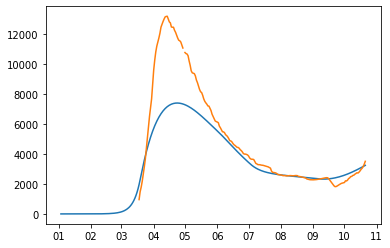

best_error: 1.7302889761256617
vector: [array([1.73028898])]
mean_deaths 0.040181088054469995
[7.57982055e+01 1.90212734e+00 7.90175849e-01 7.42312522e-02
 4.72444768e-02 3.48892490e-02 3.79633209e-01 8.95918742e-02
 9.38829317e-01 1.14304741e+00 1.08787905e+00 8.54164572e-01
 1.21878190e+00 9.58423721e-01 7.57234970e-01 9.97283445e-01
 8.57820357e-01]


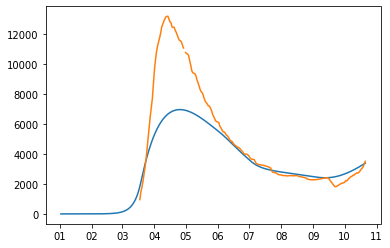

best_error: 1.7958203104256527
vector: [array([1.79582031])]
mean_deaths 0.011077116887613238
[7.12214124e+01 1.78335573e+00 7.61549712e-01 1.40190048e-01
 1.21678373e-01 6.68675892e-02 2.69888015e-01 1.69997305e-01
 9.40527850e-01 1.15389235e+00 1.22345603e+00 9.47186843e-01
 1.24240711e+00 7.62923138e-01 7.72171290e-01 7.62591904e-01
 8.65103109e-01]


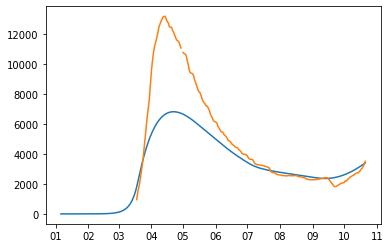

best_error: 1.8233489715769489
vector: [array([1.82334897])]
mean_deaths 0.08677454654997796
[7.26146231e+01 1.78558334e+00 8.05117233e-01 4.70074602e-02
 4.74345564e-03 2.23633413e-02 4.11624439e-01 6.70792648e-02
 9.16060494e-01 1.17892729e+00 1.24567669e+00 7.64165822e-01
 1.09457888e+00 8.14818224e-01 8.27609408e-01 1.23150114e+00
 8.35739064e-01]


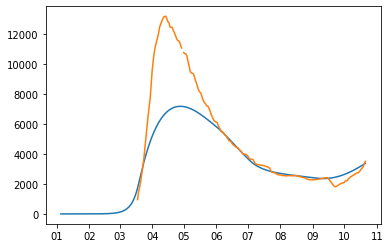

best_error: 1.6451765000376233
vector: [array([1.6451765])]
mean_deaths 8.897919709813979e-05
[7.25858889e+01 1.81609950e+00 7.71724545e-01 1.28258026e-01
 9.20288940e-03 8.93084668e-02 3.94388032e-01 1.15520879e-01
 9.55180197e-01 1.12812223e+00 1.15825151e+00 8.35796825e-01
 1.21287037e+00 8.95185050e-01 7.54306849e-01 1.09615110e+00
 1.00828724e+00]


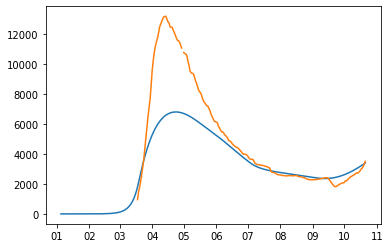

best_error: 1.8021805139815614
vector: [array([1.80218051])]
mean_deaths 0.04011883406095528
[7.20852994e+01 1.88852702e+00 7.73773639e-01 8.67044019e-02
 1.19172152e-01 2.98614797e-02 4.35391992e-01 1.42871223e-01
 9.28107671e-01 1.15348582e+00 1.19540321e+00 7.57297926e-01
 1.24489961e+00 8.22312139e-01 7.53510535e-01 1.02059789e+00
 8.65522947e-01]


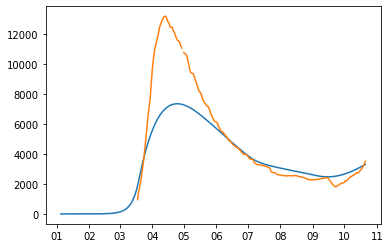

best_error: 1.7396136629916619
vector: [array([1.73961366])]
mean_deaths 0.020244149841722237
[7.32295151e+01 1.89198252e+00 7.98295278e-01 8.77574370e-02
 1.11261140e-02 2.39864455e-02 3.31463842e-01 7.41183817e-02
 9.27439615e-01 1.13905951e+00 1.15193156e+00 9.76907223e-01
 1.12208633e+00 8.73949552e-01 7.51509745e-01 1.14872672e+00
 9.45467122e-01]


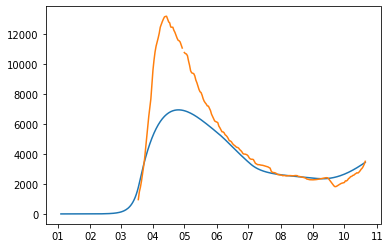

best_error: 1.7602288255094323
vector: [array([1.76022883])]
mean_deaths 0.04257210504884305
[7.32530411e+01 1.81410624e+00 7.95889058e-01 5.61027728e-02
 1.68992984e-02 6.70179163e-03 2.39265260e-01 1.10361987e-01
 9.81594106e-01 1.15620584e+00 1.17640799e+00 9.56628322e-01
 1.12201658e+00 9.69348498e-01 7.73357859e-01 1.10983959e+00
 8.65850650e-01]


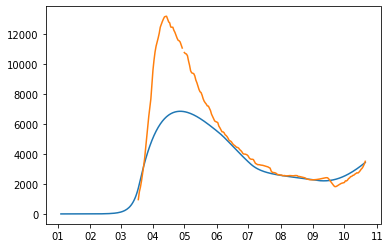

best_error: 1.6413877868871651
vector: [array([1.64138779])]
mean_deaths 0.007602417722347825
[7.49170279e+01 1.87211648e+00 7.94140881e-01 7.31371804e-02
 1.92727902e-02 2.68937092e-02 4.01502222e-01 1.29530213e-01
 9.70463089e-01 1.15344543e+00 1.13664731e+00 7.70044335e-01
 1.13704339e+00 8.72691524e-01 7.69030256e-01 1.02445871e+00
 8.76599597e-01]


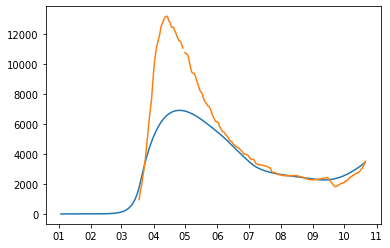

best_error: 1.8594835258977527
vector: [array([1.85948353])]
mean_deaths 0.007431224290409212
[7.46217471e+01 1.85822722e+00 8.02501747e-01 1.08362643e-01
 1.90951241e-02 3.55932558e-02 3.32592203e-01 1.64904101e-01
 9.31042085e-01 1.13398837e+00 1.13202201e+00 8.18300324e-01
 1.13616216e+00 9.37365179e-01 7.51017410e-01 1.15971372e+00
 1.02477416e+00]


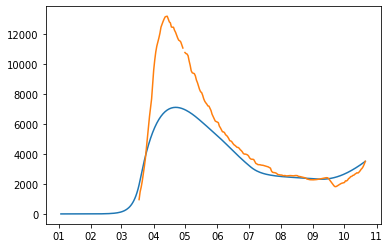

best_error: 1.5992851576263147
vector: [array([1.59928516])]
mean_deaths 0.022288384744423843
[7.42212320e+01 1.76850954e+00 7.87589051e-01 5.65062221e-02
 7.22318515e-04 9.34711046e-02 3.30378851e-01 1.86481855e-01
 9.50533147e-01 1.18692147e+00 1.16280097e+00 1.08243523e+00
 1.24367502e+00 8.36392836e-01 7.57378718e-01 1.06096818e+00
 8.31350527e-01]


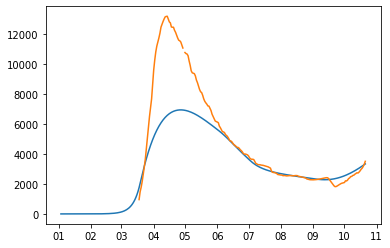

best_error: 1.8371233330636776
vector: [array([1.83712333])]
mean_deaths 0.10927548520633713
[7.46233728e+01 1.78416407e+00 8.04533641e-01 6.34256755e-02
 4.55742331e-03 9.22546896e-02 3.91387543e-01 1.90262500e-01
 9.14664432e-01 1.16812392e+00 1.17474799e+00 7.55415277e-01
 1.17162349e+00 8.91379026e-01 7.81455115e-01 8.18126067e-01
 7.92621324e-01]


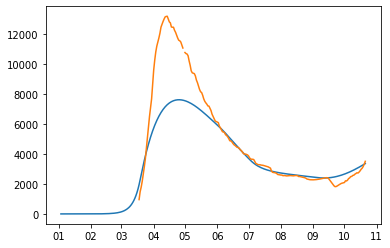

best_error: 1.6195913698702311
vector: [array([1.61959137])]
mean_deaths 0.00811020545806285
[7.12261284e+01 1.77846936e+00 7.98969855e-01 9.40824601e-02
 2.27484862e-02 4.90187998e-02 1.93919413e-01 1.26729969e-01
 9.56608628e-01 1.11686779e+00 1.21721783e+00 7.60656090e-01
 9.81093375e-01 1.02561553e+00 7.55669837e-01 1.19616219e+00
 9.03170886e-01]


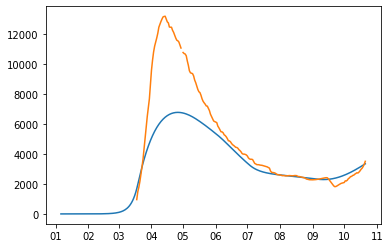

best_error: 1.7038193433822904
vector: [array([1.70381934])]
mean_deaths 0.009021290374345608
[7.55728253e+01 1.77643701e+00 8.24493485e-01 1.55374122e-02
 6.18213108e-03 1.87346065e-02 2.91195121e-01 8.40052370e-02
 9.52218510e-01 1.20554286e+00 1.19508620e+00 7.58254956e-01
 1.06643822e+00 8.88600703e-01 7.63423151e-01 1.08425293e+00
 9.45840267e-01]


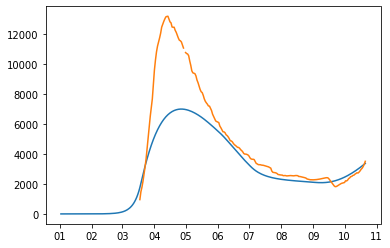

best_error: 1.4956235494273766
vector: [array([1.49562355])]
mean_deaths 0.008718644667992086
[7.57678968e+01 1.76999377e+00 7.98843933e-01 5.90109323e-02
 1.88476666e-02 1.04334725e-03 3.57234488e-01 1.31909640e-01
 9.71304589e-01 1.19287614e+00 1.16766130e+00 7.70635872e-01
 1.19545884e+00 8.23344339e-01 7.50376528e-01 1.11433925e+00
 8.64803315e-01]


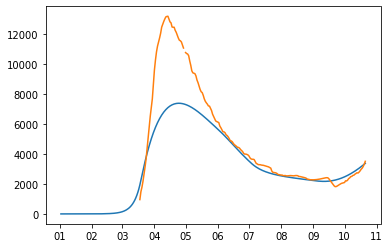

best_error: 1.7062893551435523
vector: [array([1.70628936])]
mean_deaths 0.046252727591683314
[7.43158003e+01 1.87170346e+00 8.25441127e-01 4.43743075e-02
 2.36057391e-02 1.59647796e-02 5.16390014e-01 1.56024886e-01
 8.99628680e-01 1.19184624e+00 1.21854813e+00 7.92088011e-01
 1.19871222e+00 8.46672624e-01 7.60313135e-01 1.11160934e+00
 7.98354724e-01]


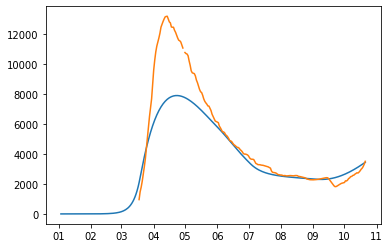

best_error: 1.6290915243916841
vector: [array([1.62909152])]
mean_deaths 0.076732787815908
[7.23804101e+01 1.91596281e+00 8.01083931e-01 7.18767785e-02
 1.93607265e-02 1.64999929e-02 4.08579637e-01 1.71864656e-01
 9.38278673e-01 1.14704715e+00 1.21288133e+00 7.54194881e-01
 1.20787598e+00 8.77489162e-01 7.52592211e-01 9.99287723e-01
 8.43836535e-01]


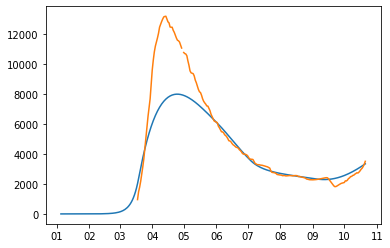

best_error: 1.7309182557447074
vector: [array([1.73091826])]
mean_deaths 0.034964598929199044
[7.41904970e+01 1.88658418e+00 8.14731648e-01 2.35954463e-02
 6.57118362e-02 1.54379468e-02 3.73714820e-01 1.63908366e-01
 8.97388487e-01 1.17763845e+00 1.17410318e+00 7.98967202e-01
 1.07777480e+00 8.98096476e-01 7.70518084e-01 1.01694568e+00
 8.75954924e-01]


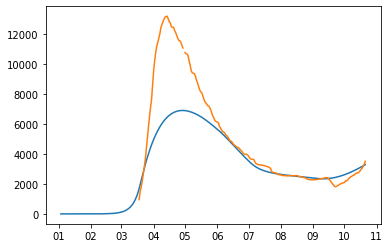

best_error: 1.6801939129909549
vector: [array([1.68019391])]
mean_deaths 0.03884918386146121
[7.46113088e+01 1.75892277e+00 7.96623741e-01 5.98071876e-02
 2.87918360e-02 1.54918302e-02 3.16305603e-01 1.46499663e-01
 9.89079011e-01 1.18076382e+00 1.20350587e+00 8.29149784e-01
 1.08408095e+00 7.92698532e-01 7.51282426e-01 1.17307237e+00
 8.50943718e-01]


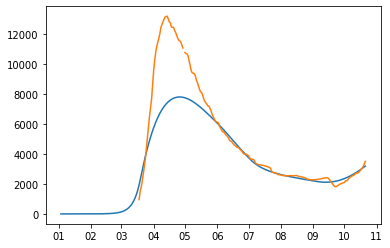

best_error: 1.5720620477583962
vector: [array([1.57206205])]
mean_deaths 0.050474355859317595
[7.47036014e+01 1.83583072e+00 7.93118471e-01 7.49255813e-02
 3.60525803e-03 3.24242545e-04 3.92620495e-01 1.08437880e-01
 9.96945282e-01 1.17135878e+00 1.17163716e+00 7.54043794e-01
 1.19788777e+00 7.89175707e-01 7.56751002e-01 9.44666959e-01
 1.00493199e+00]


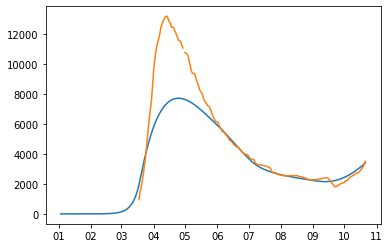

best_error: 1.6903880680548728
vector: [array([1.69038807])]
mean_deaths 0.07656004268569586
[7.69491674e+01 1.77086079e+00 7.99961668e-01 7.87674877e-02
 1.78041111e-02 3.35188301e-02 2.05776739e-01 1.09631406e-01
 9.69530280e-01 1.17087072e+00 1.12906292e+00 7.66030022e-01
 1.19718008e+00 8.68453587e-01 7.66990707e-01 1.15784914e+00
 9.27717174e-01]


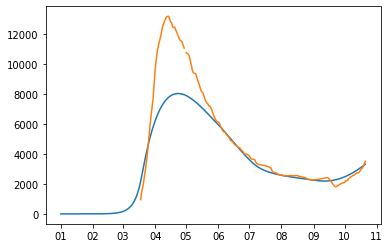

best_error: 1.6173756427627295
vector: [array([1.61737564])]
mean_deaths 0.0018939236526076156
[7.71560777e+01 1.85791721e+00 8.13130897e-01 6.49856230e-02
 1.10718347e-02 2.53173918e-02 6.17738096e-01 7.20210300e-02
 9.56548199e-01 1.19344424e+00 1.12491387e+00 8.07823798e-01
 1.22274963e+00 8.57202992e-01 7.53303992e-01 1.01528245e+00
 7.99661143e-01]


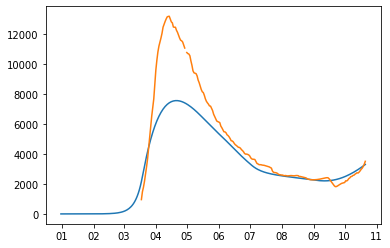

best_error: 1.710539655297033
vector: [array([1.71053966])]
mean_deaths 0.0718443726715444
[7.69599382e+01 1.76508534e+00 8.06416108e-01 2.07145995e-02
 7.60773286e-03 3.94572390e-02 4.30677230e-01 1.59235772e-01
 9.74886136e-01 1.21749801e+00 1.16311909e+00 7.76668668e-01
 1.15280530e+00 7.59398442e-01 7.71004041e-01 1.08493641e+00
 1.21116976e+00]


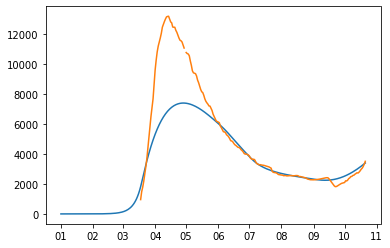

best_error: 1.6338735063050807
vector: [array([1.63387351])]
mean_deaths 0.06533733197940046
[7.65494294e+01 1.91640255e+00 8.06282438e-01 1.99890070e-02
 8.06597042e-02 5.21553045e-02 2.95293189e-01 7.63658047e-02
 9.92341828e-01 1.19802467e+00 1.14273614e+00 7.57040077e-01
 1.17725178e+00 7.95622645e-01 7.85141282e-01 1.09427621e+00
 8.90653315e-01]


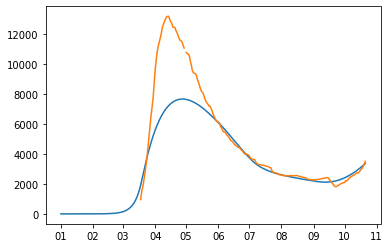

best_error: 1.6253608679588163
vector: [array([1.62536087])]
mean_deaths 0.042384376008340684
[7.46771224e+01 1.75476577e+00 8.03441515e-01 6.36354036e-02
 6.82314219e-03 3.38661389e-02 3.56563031e-02 1.67217316e-01
 9.24000867e-01 1.18195584e+00 1.19184192e+00 8.31518207e-01
 1.22075541e+00 8.85742521e-01 7.69223311e-01 1.20579405e+00
 8.33216173e-01]


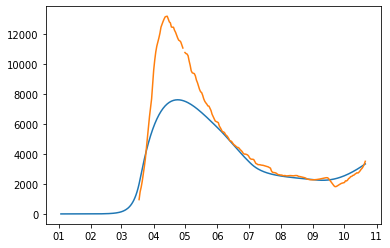

best_error: 1.526936715860186
vector: [array([1.52693672])]
mean_deaths 0.031682650252116064
[7.47686939e+01 1.72895611e+00 7.86670171e-01 6.44416032e-02
 1.70001215e-02 7.43032725e-02 3.22823379e-01 1.30046826e-01
 9.86718216e-01 1.19209021e+00 1.18931442e+00 8.79717406e-01
 1.19311125e+00 7.85723210e-01 7.52877557e-01 9.58152052e-01
 8.89743647e-01]


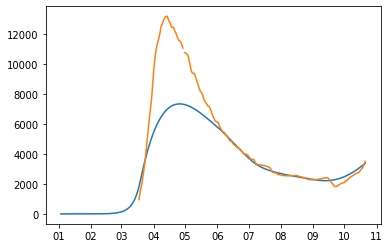

best_error: 1.666364392797231
vector: [array([1.66636439])]
mean_deaths 0.001480565583270312
[7.86731006e+01 1.68232910e+00 8.13432633e-01 6.15710059e-02
 1.02860639e-01 5.16628492e-04 3.98200373e-01 1.91469176e-01
 9.67635990e-01 1.21553768e+00 1.15424868e+00 7.90749500e-01
 1.10113391e+00 8.52258163e-01 7.54535737e-01 1.18304065e+00
 8.34883821e-01]


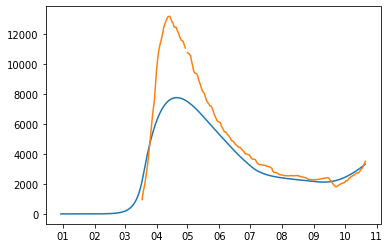

best_error: 1.5476961613078555
vector: [array([1.54769616])]
mean_deaths 0.008708613032322681
[7.66531045e+01 1.67737986e+00 8.00010845e-01 3.87411250e-02
 4.64726500e-02 2.02623506e-02 3.80356666e-01 1.64990771e-01
 9.85825329e-01 1.21723767e+00 1.17729586e+00 7.85129242e-01
 1.14419614e+00 8.16165276e-01 7.53130989e-01 1.12836964e+00
 8.15203995e-01]


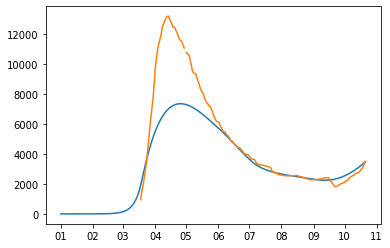

best_error: 1.6400733443724196
vector: [array([1.64007334])]
mean_deaths 0.07199013407542265
[7.49639939e+01 1.90839710e+00 8.03903350e-01 2.93496923e-02
 4.15500247e-02 8.03924959e-03 1.31569461e-01 5.75412798e-02
 9.55758612e-01 1.18059469e+00 1.17099428e+00 8.47308924e-01
 1.23801149e+00 8.67859569e-01 7.77229587e-01 1.12141549e+00
 8.32909513e-01]


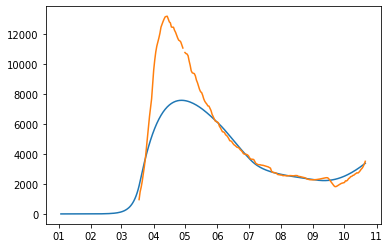

best_error: 1.5609129969514528
vector: [array([1.560913])]
mean_deaths 0.005699072149501672
[7.47442198e+01 1.86266565e+00 7.94218660e-01 3.66366014e-02
 2.10666262e-02 3.81239706e-02 4.02768642e-01 1.78064283e-01
 9.74243099e-01 1.19630394e+00 1.16878995e+00 1.17300713e+00
 1.24823533e+00 8.07793018e-01 7.63227168e-01 1.05517162e+00
 8.23124363e-01]


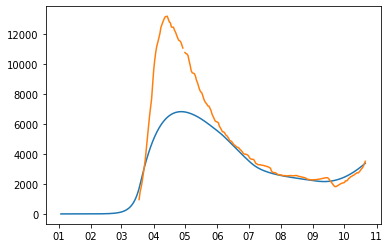

best_error: 1.678309522789306
vector: [array([1.67830952])]
mean_deaths 0.022389751346928822
[7.51008284e+01 1.89295574e+00 7.85482159e-01 3.36737508e-02
 2.64743714e-02 2.00656009e-02 2.40981330e-01 1.12651196e-01
 9.91646630e-01 1.16610202e+00 1.10130863e+00 8.40517752e-01
 1.22213492e+00 9.39898834e-01 7.69160668e-01 1.11343493e+00
 8.90955634e-01]


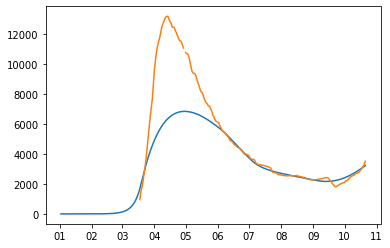

best_error: 1.6353579503676554
vector: [array([1.63535795])]
mean_deaths 0.06456414717160748
[7.73993162e+01 1.87442308e+00 8.05304044e-01 7.36563862e-02
 7.75978590e-02 2.56671697e-02 3.58723440e-01 1.85474047e-01
 9.84113824e-01 1.16161880e+00 1.10165370e+00 7.60537688e-01
 1.05242734e+00 7.61958121e-01 7.52692300e-01 1.24496755e+00
 7.99950573e-01]


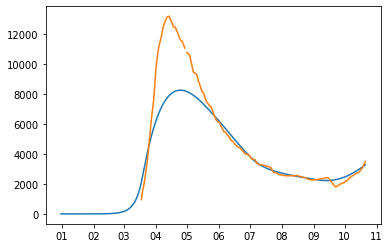

best_error: 1.6016729685424551
vector: [array([1.60167297])]
mean_deaths 0.0033361582215761056
[7.32003770e+01 1.88714869e+00 7.98446495e-01 2.37507362e-02
 4.41189357e-02 9.18542835e-03 1.01413279e-01 1.35238796e-01
 9.58960749e-01 1.15840598e+00 1.16604344e+00 7.76168362e-01
 1.07059233e+00 9.43299590e-01 7.50037877e-01 1.12569712e+00
 7.82981235e-01]


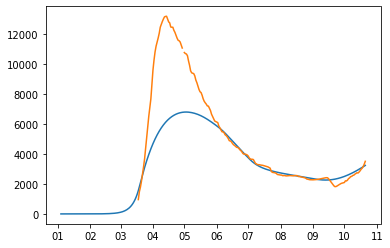

best_error: 1.5243137906624251
vector: [array([1.52431379])]
mean_deaths 0.034787524940753684
[7.36671640e+01 1.88990864e+00 8.02429567e-01 3.58906168e-02
 1.46191058e-02 1.77313754e-02 4.30335519e-01 9.07676862e-02
 9.67410640e-01 1.17271344e+00 1.19457559e+00 8.22124689e-01
 1.14614835e+00 8.57468308e-01 7.58459832e-01 1.04764806e+00
 8.50617636e-01]


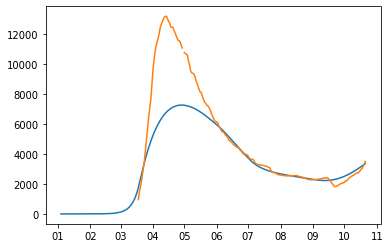

best_error: 1.6246350828509115
vector: [array([1.62463508])]
mean_deaths 0.03247107314864228
[7.59111129e+01 1.84717025e+00 8.21168753e-01 8.88080087e-03
 1.28638778e-02 1.17681709e-02 3.78237287e-01 7.37276792e-02
 9.96311634e-01 1.21717204e+00 1.21274600e+00 7.77766653e-01
 1.19579162e+00 8.38283708e-01 7.65617719e-01 1.22020680e+00
 1.00361114e+00]


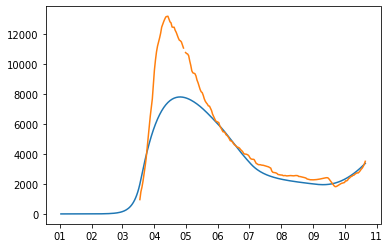

best_error: 1.548564726708762
vector: [array([1.54856473])]
mean_deaths 0.01167752240553823
[7.60039877e+01 1.72038940e+00 8.06839118e-01 2.90570616e-02
 1.28638778e-02 4.31257993e-02 4.09665473e-01 1.02409818e-01
 9.96311634e-01 1.21388000e+00 1.17532066e+00 7.77766653e-01
 1.18641095e+00 8.89491955e-01 7.65279145e-01 1.22523580e+00
 8.75558516e-01]


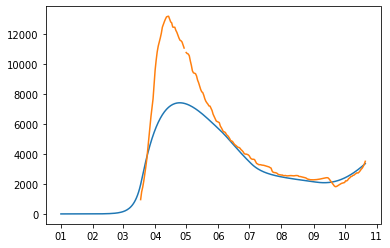

best_error: 1.6067447671477793
vector: [array([1.60674477])]
mean_deaths 0.058204773785535825
[7.57617673e+01 1.74802117e+00 7.75457688e-01 1.53183144e-01
 1.48748360e-02 3.09140042e-02 2.92248114e-01 1.99945276e-01
 9.84340851e-01 1.14514801e+00 1.11681139e+00 8.06586972e-01
 1.22866246e+00 7.72117079e-01 7.65237060e-01 1.01902632e+00
 8.59894239e-01]


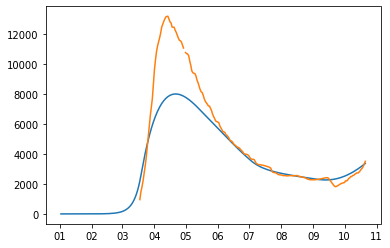

best_error: 1.604233261466764
vector: [array([1.60423326])]
mean_deaths 0.05676755127891833
[7.58538404e+01 1.82592176e+00 8.10739085e-01 4.82829865e-02
 6.56856041e-02 1.25777048e-02 4.58112679e-01 1.22020280e-01
 9.87875785e-01 1.19499331e+00 1.20291572e+00 7.93219638e-01
 1.17586643e+00 8.41850316e-01 7.51337631e-01 1.01142256e+00
 8.50107975e-01]


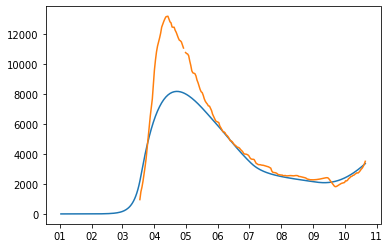

best_error: 1.665019741117402
vector: [array([1.66501974])]
mean_deaths 0.017009630172996348
[7.55904869e+01 1.79283633e+00 7.97574903e-01 6.97108486e-02
 4.83230402e-02 8.39098494e-02 3.94652620e-01 1.27549979e-01
 9.61334154e-01 1.19301543e+00 1.16547526e+00 9.19184498e-01
 1.21981338e+00 8.16747357e-01 7.50395383e-01 1.07524389e+00
 8.51714243e-01]


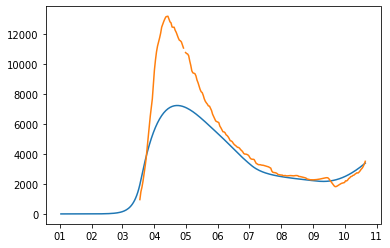

best_error: 1.6059794099489175
vector: [array([1.60597941])]
mean_deaths 0.025455661291760804
[7.24023971e+01 1.83855613e+00 7.92287878e-01 7.77474830e-02
 1.54789786e-01 7.13034979e-02 2.63647105e-01 1.69804323e-01
 9.77405902e-01 1.15050889e+00 1.23831093e+00 7.64648842e-01
 1.00455719e+00 8.64740555e-01 7.54954289e-01 1.00072900e+00
 8.17315402e-01]


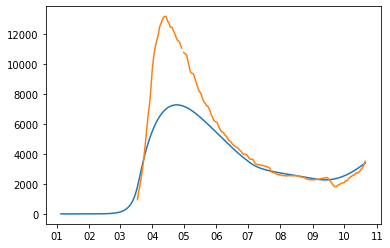

best_error: 1.5994855745344418
vector: [array([1.59948557])]
mean_deaths 0.01893637273810411
[7.45967919e+01 1.83031241e+00 7.86769592e-01 5.32211929e-02
 2.70135155e-02 7.00593305e-02 4.63882483e-01 4.77072169e-02
 9.97672517e-01 1.18663701e+00 1.17057939e+00 9.23230400e-01
 1.15082424e+00 7.54611421e-01 7.76705636e-01 9.69098535e-01
 7.96219270e-01]


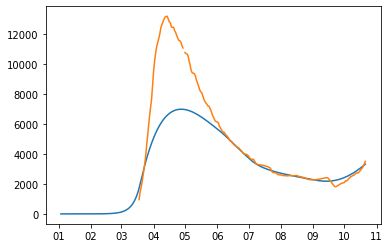

best_error: 1.597608659412909
vector: [array([1.59760866])]
mean_deaths 0.03271570269267828
[7.46435434e+01 1.79891401e+00 7.89299691e-01 5.38234111e-02
 3.22309764e-02 8.03924959e-03 5.04344489e-01 1.24560733e-01
 9.89663999e-01 1.19250103e+00 1.19431416e+00 7.59759078e-01
 1.18568725e+00 7.75101428e-01 7.51050251e-01 1.12141549e+00
 1.07092125e+00]


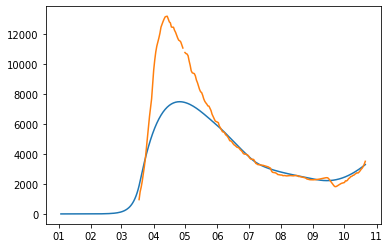

best_error: 1.5068684405718646
vector: [array([1.50686844])]
mean_deaths 0.004420307086256884
[7.52312255e+01 1.85932559e+00 8.02429567e-01 3.58906168e-02
 8.51443028e-02 7.84328114e-02 4.30335519e-01 7.50203235e-02
 9.92757450e-01 1.19392479e+00 1.17252360e+00 8.06759974e-01
 1.12680590e+00 8.25323717e-01 7.58459832e-01 1.04764806e+00
 8.50617636e-01]


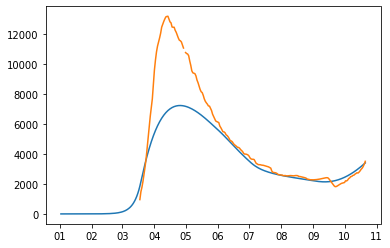

best_error: 1.6269034816806216
vector: [array([1.62690348])]
mean_deaths 0.019055093907187286
[7.47187073e+01 1.80027221e+00 8.13055414e-01 1.66034694e-02
 5.84909083e-03 3.75288548e-02 2.77764090e-01 1.54501324e-01
 9.16661655e-01 1.18941546e+00 1.18015454e+00 8.87469623e-01
 1.01472633e+00 8.05298831e-01 7.52696155e-01 1.08949121e+00
 8.68555620e-01]


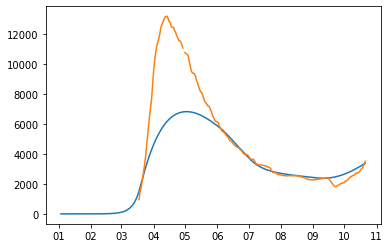

best_error: 1.5998838297013986
vector: [array([1.59988383])]
mean_deaths 0.0010603514862346035
[7.44303832e+01 1.68900548e+00 8.02721050e-01 7.15116490e-02
 2.81817507e-02 5.44114244e-03 2.21038043e-01 1.59235772e-01
 9.22462905e-01 1.18956356e+00 1.21414933e+00 7.64928497e-01
 1.15387758e+00 8.75863681e-01 7.51602372e-01 1.07962903e+00
 8.22791214e-01]


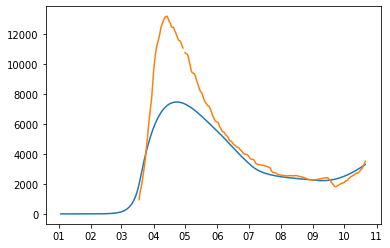

best_error: 1.5548184174309267
vector: [array([1.55481842])]
mean_deaths 0.008512200542444035
[7.59228795e+01 1.78659532e+00 7.86515383e-01 6.57276776e-02
 1.18066762e-02 9.75192172e-02 2.95112736e-01 1.11291087e-01
 9.75264026e-01 1.18846670e+00 1.13904057e+00 1.02749920e+00
 1.22986069e+00 7.74605122e-01 7.50665088e-01 1.06045917e+00
 8.96931825e-01]


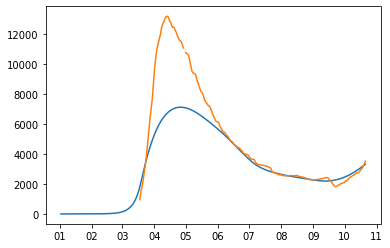

best_error: 1.5265596044775807
vector: [array([1.5265596])]
mean_deaths 0.010241423112700985
[7.55902584e+01 1.87533196e+00 8.08967241e-01 3.08323187e-02
 2.86559791e-02 1.48899319e-03 3.77111368e-01 1.36591670e-01
 9.65745884e-01 1.19119561e+00 1.16613800e+00 7.81412424e-01
 1.18526716e+00 8.40300932e-01 7.50964485e-01 1.19047868e+00
 8.41584334e-01]


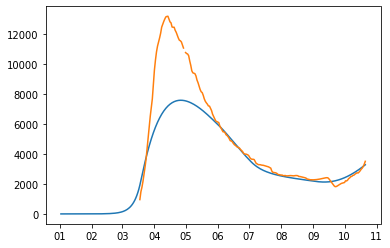

best_error: 1.5213712833138244
vector: [array([1.52137128])]
mean_deaths 0.0044339649466517885
[7.28530289e+01 1.91586806e+00 7.98140319e-01 5.60275438e-02
 3.28404739e-02 4.33395000e-02 4.92761042e-01 5.88288824e-02
 9.61051833e-01 1.16313683e+00 1.21570712e+00 8.12100607e-01
 1.16715680e+00 8.65154956e-01 7.56804651e-01 1.18729698e+00
 8.41892264e-01]


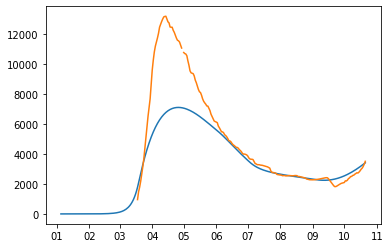

best_error: 1.5561819355444606
vector: [array([1.55618194])]
mean_deaths 0.029477411911293834
[7.66920283e+01 1.73708994e+00 8.14254333e-01 2.52058729e-02
 2.61261918e-02 7.03735681e-02 3.52006063e-01 1.37398654e-01
 9.70167501e-01 1.21276849e+00 1.17880314e+00 7.66419374e-01
 1.14261831e+00 8.47833606e-01 7.53530980e-01 9.93894597e-01
 7.83787637e-01]


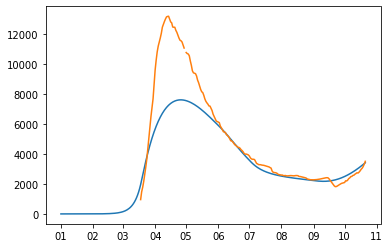

best_error: 1.5424837107532303
vector: [array([1.54248371])]
mean_deaths 0.01949072634034157
[7.65792705e+01 1.79156622e+00 8.16619473e-01 1.05204921e-02
 2.52721401e-02 5.35441738e-03 3.76448562e-01 1.61723060e-01
 9.69790286e-01 1.23834111e+00 1.19528699e+00 1.00223348e+00
 1.23946098e+00 7.52600489e-01 7.53571743e-01 1.19182147e+00
 8.36566394e-01]


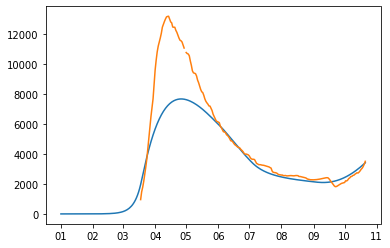

best_error: 1.549462486561023
vector: [array([1.54946249])]
mean_deaths 0.027870441975748488
[7.31278635e+01 1.89931041e+00 8.01073671e-01 2.60059832e-02
 1.05537649e-02 4.58167818e-02 2.98489249e-01 1.01141081e-01
 9.74825098e-01 1.18787476e+00 1.20095198e+00 9.07427899e-01
 1.22227817e+00 8.30723403e-01 7.67129856e-01 1.14464458e+00
 9.31194025e-01]


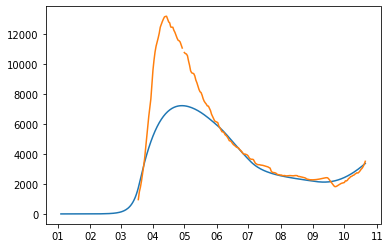

best_error: 1.4755127034301627
vector: [array([1.4755127])]
mean_deaths 0.023841650799994993
[7.34053483e+01 1.93850831e+00 7.98616012e-01 8.34389628e-02
 5.06121326e-02 5.36850302e-02 2.21721901e-01 1.23327215e-01
 9.64965254e-01 1.15418928e+00 1.18660739e+00 7.95844922e-01
 1.17131673e+00 7.75474026e-01 7.53595633e-01 1.08286256e+00
 8.50679875e-01]


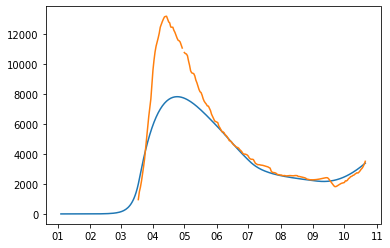

best_error: 1.5237099867159383
vector: [array([1.52370999])]
mean_deaths 0.013602761091842577
[7.49789333e+01 1.72230732e+00 7.94607109e-01 4.59870403e-02
 2.91330243e-02 8.03159318e-02 1.89387006e-01 1.16835104e-01
 9.76026485e-01 1.20764175e+00 1.21273640e+00 9.10855882e-01
 1.23286822e+00 8.09090697e-01 7.57094251e-01 1.22612894e+00
 8.20240828e-01]


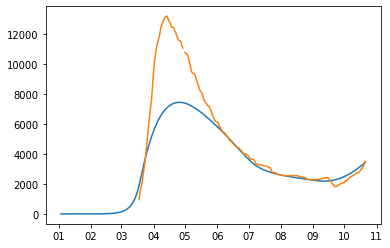

best_error: 1.600166879068302
vector: [array([1.60016688])]
mean_deaths 0.0189669655643889
[7.35102376e+01 1.85985102e+00 7.84447862e-01 8.43637864e-02
 5.11987441e-02 9.76898177e-02 3.09905658e-01 6.66920527e-02
 9.68142130e-01 1.15895070e+00 1.18197924e+00 7.62426671e-01
 1.19583133e+00 8.10364439e-01 7.54586785e-01 9.66508658e-01
 8.74718683e-01]


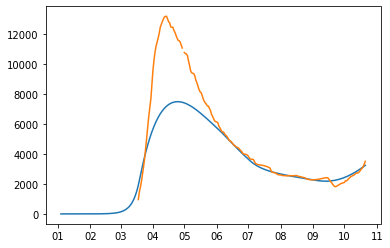

best_error: 1.5956778529789182
vector: [array([1.59567785])]
mean_deaths 0.0015764980805588905
[7.24069489e+01 1.98210992e+00 7.95976985e-01 1.10855369e-01
 2.05429387e-02 3.56683052e-02 3.50365877e-01 1.46777334e-01
 9.70474830e-01 1.13590056e+00 1.19012788e+00 7.66089621e-01
 1.18683415e+00 7.65033251e-01 7.71081450e-01 1.18182511e+00
 8.68468612e-01]


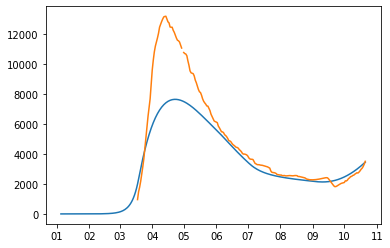

best_error: 1.462570709688271
vector: [array([1.46257071])]
mean_deaths 0.0016226131307931944
[7.11108693e+01 1.96171872e+00 7.86577043e-01 7.23241864e-02
 2.15674683e-02 1.84261056e-03 3.03902209e-01 7.97007872e-02
 9.30952414e-01 1.14546059e+00 1.20009881e+00 7.90144360e-01
 1.24885356e+00 8.30250008e-01 7.56409234e-01 1.07515679e+00
 8.34654716e-01]


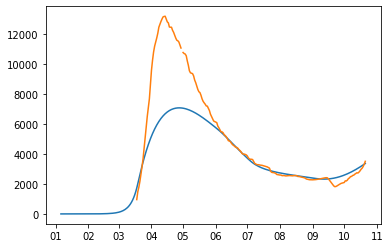

best_error: 1.514484018327037
vector: [array([1.51448402])]
mean_deaths 0.003369671148231867
[7.03313195e+01 1.94286992e+00 7.80413461e-01 8.93067267e-02
 2.95875034e-02 6.77914647e-02 3.90020383e-01 1.15376261e-01
 9.36585892e-01 1.14376912e+00 1.23405221e+00 9.40524877e-01
 1.24663205e+00 7.97304344e-01 7.55241999e-01 1.05010743e+00
 8.90636120e-01]


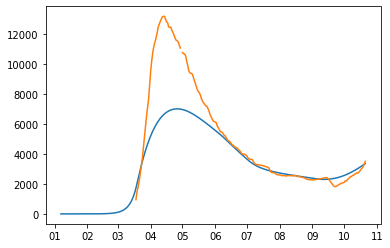

best_error: 1.5229612091683116
vector: [array([1.52296121])]
mean_deaths 0.022107704969901137
[7.24490310e+01 1.96492446e+00 7.89364640e-01 6.47081222e-02
 6.75798079e-02 1.75216040e-02 3.09569354e-01 5.72119530e-02
 9.60114545e-01 1.14962627e+00 1.19024316e+00 8.06038603e-01
 1.17114196e+00 8.28040708e-01 7.68584085e-01 1.11105473e+00
 8.62063175e-01]


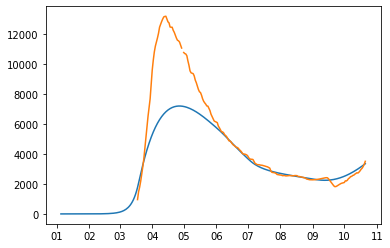

best_error: 1.510405001860134
vector: [array([1.510405])]
mean_deaths 0.007733447037300558
[7.25953712e+01 1.94097195e+00 8.00010845e-01 6.30078166e-02
 4.64726500e-02 5.26986530e-02 3.72171134e-01 6.33922869e-02
 9.13914610e-01 1.16456566e+00 1.21100470e+00 7.81241114e-01
 1.24093371e+00 8.29010970e-01 7.52740977e-01 1.12836964e+00
 8.12109274e-01]


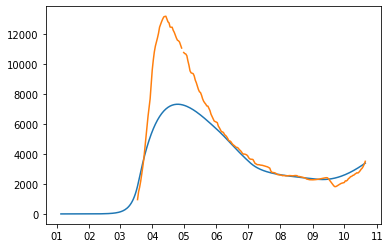

best_error: 1.4088954286179725
vector: [array([1.40889543])]
mean_deaths 0.010700016199858399
[7.44168536e+01 1.90465218e+00 7.98700239e-01 3.87636152e-02
 1.37206341e-02 6.25166818e-02 3.80977945e-01 1.17513440e-01
 9.66678735e-01 1.18434110e+00 1.16701318e+00 7.67221724e-01
 1.24726281e+00 7.92701371e-01 7.55427755e-01 1.18938020e+00
 7.80928140e-01]


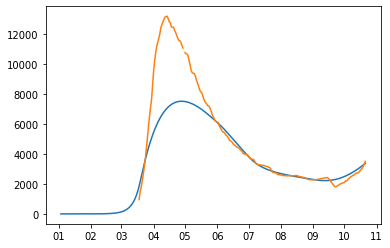

best_error: 1.5644510201576662
vector: [array([1.56445102])]
mean_deaths 0.0007497451410333836
[7.36595224e+01 1.97974408e+00 8.03281267e-01 5.35939442e-02
 3.08707098e-02 6.52231847e-02 2.67869968e-01 1.12357094e-01
 9.51095874e-01 1.15607074e+00 1.16503413e+00 9.59833744e-01
 1.15294866e+00 8.45256660e-01 7.61004965e-01 1.18320618e+00
 8.52848592e-01]


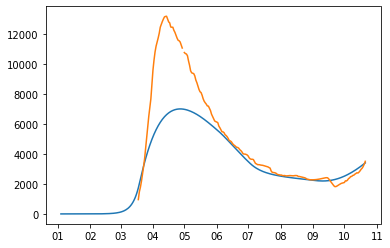

best_error: 1.5972228631603111
vector: [array([1.59722286])]
mean_deaths 0.04093048303568339
[7.55361869e+01 1.97603227e+00 8.13561692e-01 4.52551275e-02
 2.03134974e-02 7.76309563e-02 2.74654705e-01 6.67856861e-02
 9.78464712e-01 1.17727311e+00 1.15499927e+00 7.69334287e-01
 1.21415245e+00 7.86052706e-01 7.60806754e-01 1.12252485e+00
 7.69050704e-01]


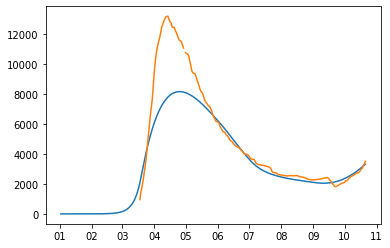

best_error: 1.4869035157934327
vector: [array([1.48690352])]
mean_deaths 0.004505934291313422
[7.43833311e+01 1.95446300e+00 7.91532083e-01 5.50427690e-02
 3.15344018e-03 8.76770332e-02 4.77669476e-01 1.34102119e-01
 9.63909745e-01 1.17116891e+00 1.13423156e+00 9.59811482e-01
 1.24937428e+00 7.55707444e-01 7.54143311e-01 1.16112951e+00
 7.89305470e-01]


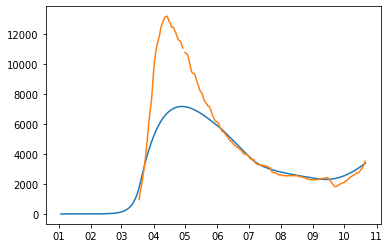

best_error: 1.5215928992387207
vector: [array([1.5215929])]
mean_deaths 0.04271446899897853
[7.45546665e+01 1.82842356e+00 7.89716304e-01 7.55227900e-02
 1.30243326e-02 2.21034554e-02 2.18406162e-01 1.03561631e-01
 9.72378893e-01 1.17031850e+00 1.16238160e+00 7.77095542e-01
 1.24754478e+00 7.91116118e-01 7.50095251e-01 9.35705460e-01
 7.73569740e-01]


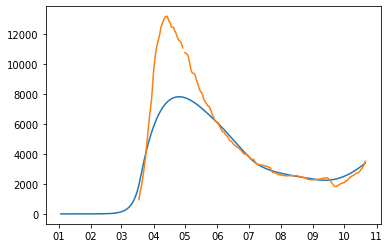

best_error: 1.4649695765032817
vector: [array([1.46496958])]
mean_deaths 0.03385687676375091
[7.47657787e+01 1.86916229e+00 7.93693116e-01 1.03161530e-01
 9.90017230e-03 5.42253159e-02 4.25905320e-01 9.50965137e-02
 9.58132033e-01 1.15320128e+00 1.15422790e+00 7.53802321e-01
 1.23318015e+00 7.91382490e-01 7.51995677e-01 1.08954877e+00
 7.57620661e-01]


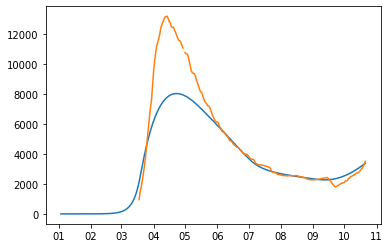

best_error: 1.5363426907525286
vector: [array([1.53634269])]
mean_deaths 0.002977011740516381
[7.46660732e+01 1.91146911e+00 7.94491937e-01 6.72422962e-02
 5.56396883e-02 2.87765647e-02 3.90267407e-01 1.13559044e-01
 9.23440196e-01 1.17547355e+00 1.15912812e+00 7.97585426e-01
 1.24251692e+00 7.60165547e-01 7.51927369e-01 1.10298101e+00
 8.09661296e-01]


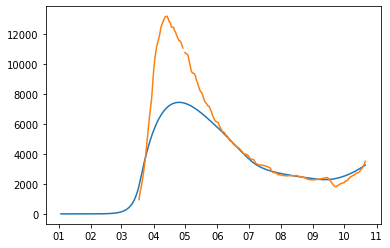

best_error: 1.4862730443488645
vector: [array([1.48627304])]
mean_deaths 0.040043900575324975
[7.42550904e+01 1.88053359e+00 7.98083578e-01 6.41911775e-02
 4.67435682e-02 3.45179048e-02 4.27382322e-01 1.70195517e-01
 9.70302488e-01 1.17105270e+00 1.17536421e+00 8.35438245e-01
 1.21922299e+00 8.38179512e-01 7.55326991e-01 1.15386179e+00
 8.23237135e-01]


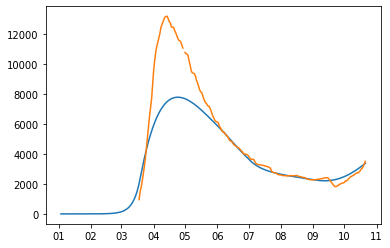

best_error: 1.5235231864011234
vector: [array([1.52352319])]
mean_deaths 0.008092918945051732
[7.52647690e+01 1.90750069e+00 8.05399546e-01 1.79122111e-02
 1.72108736e-02 4.69092994e-02 3.31069703e-01 6.84048003e-02
 9.82593481e-01 1.19307925e+00 1.14668268e+00 1.04242203e+00
 1.20074969e+00 8.49465587e-01 7.54139032e-01 1.21824585e+00
 8.54666115e-01]


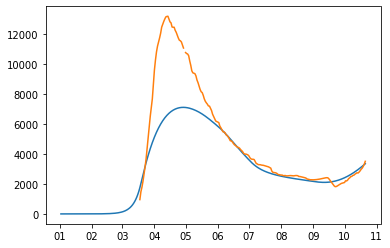

best_error: 1.4731919725313074
vector: [array([1.47319197])]
mean_deaths 0.021339215323766658
[7.33541621e+01 1.83263153e+00 7.99156591e-01 2.77077791e-02
 4.11604991e-03 7.84328114e-02 3.75445495e-01 1.06946758e-01
 9.78665818e-01 1.19762333e+00 1.22046358e+00 8.64399028e-01
 1.22873449e+00 8.16179077e-01 7.58140304e-01 1.04764806e+00
 7.83715236e-01]


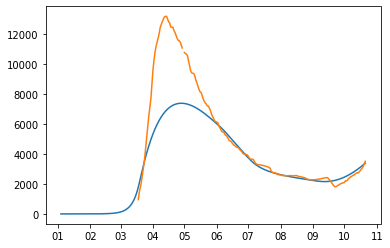

best_error: 1.5194198258577714
vector: [array([1.51941983])]
mean_deaths 0.002718072783454212
[7.44368274e+01 1.96133162e+00 8.12024148e-01 1.94109409e-02
 1.76068628e-02 3.90000169e-02 3.47415576e-01 1.06965175e-01
 9.80120070e-01 1.19240394e+00 1.18702711e+00 7.89640546e-01
 1.17478117e+00 7.83810961e-01 7.50570701e-01 1.15511668e+00
 9.74344024e-01]


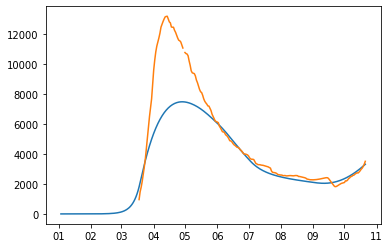

best_error: 1.5219812950464517
vector: [array([1.5219813])]
mean_deaths 0.012540360464303903
[7.42687370e+01 1.90461188e+00 8.01798834e-01 2.88383137e-02
 1.63995994e-02 4.07867611e-02 3.76225314e-01 1.18334679e-01
 9.73310011e-01 1.18627656e+00 1.17165253e+00 8.05258719e-01
 1.23836167e+00 8.61666728e-01 7.54099426e-01 1.22982759e+00
 1.04870135e+00]


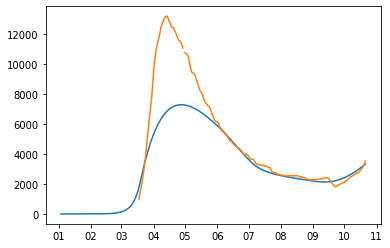

best_error: 1.4933155138127956
vector: [array([1.49331551])]
mean_deaths 0.01006314720578968
[7.33218198e+01 1.87855180e+00 8.14571934e-01 2.90934326e-02
 2.33104625e-02 5.98895879e-02 3.95279254e-01 1.23530010e-01
 9.05643196e-01 1.20033771e+00 1.23094968e+00 7.70123609e-01
 1.19568616e+00 7.71738325e-01 7.68057634e-01 1.10276761e+00
 7.92969543e-01]


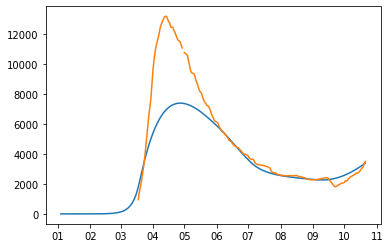

best_error: 1.5065798351667872
vector: [array([1.50657984])]
mean_deaths 0.008934962685035358
[7.40639947e+01 1.84298241e+00 7.99263926e-01 6.13584580e-02
 8.53733232e-03 8.07236287e-02 3.53196800e-01 1.09473584e-01
 9.58943672e-01 1.18091346e+00 1.17559590e+00 7.85124260e-01
 1.19701449e+00 7.91128256e-01 7.55520774e-01 1.16079087e+00
 8.22572729e-01]


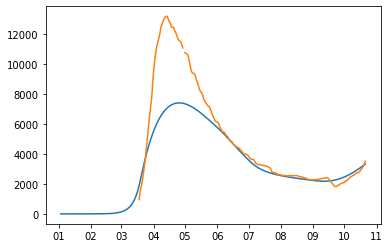

best_error: 1.4360555386724476
vector: [array([1.43605554])]
mean_deaths 0.007179688555846047
[7.52726580e+01 1.86312171e+00 8.03996054e-01 2.66574077e-02
 2.45766555e-02 4.71098296e-02 3.10696287e-01 1.05548614e-01
 9.65458673e-01 1.19670257e+00 1.15957177e+00 7.98845546e-01
 1.23973208e+00 8.33180929e-01 7.54033189e-01 1.17555403e+00
 7.59750610e-01]


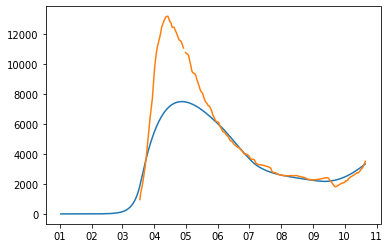

best_error: 1.4448664945579701
vector: [array([1.44486649])]
mean_deaths 0.010198994317387765
[7.34073834e+01 1.85522162e+00 7.95552086e-01 5.07303474e-02
 1.01662037e-03 5.50472217e-02 3.09533943e-01 1.00575075e-01
 9.69304894e-01 1.17609700e+00 1.19236584e+00 7.71842647e-01
 1.18192786e+00 8.00947038e-01 7.53926951e-01 9.40745723e-01
 8.13094326e-01]


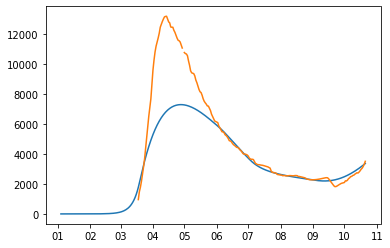

best_error: 1.4802098649539417
vector: [array([1.48020986])]
mean_deaths 0.02092830929222868
[7.64173191e+01 1.80188646e+00 8.01345773e-01 2.63844299e-02
 3.21818367e-02 2.77413581e-02 4.12811991e-01 1.75273569e-01
 9.61526817e-01 1.21156028e+00 1.14815291e+00 7.66998914e-01
 1.23975844e+00 7.91489530e-01 7.54220882e-01 1.16311435e+00
 8.47338872e-01]


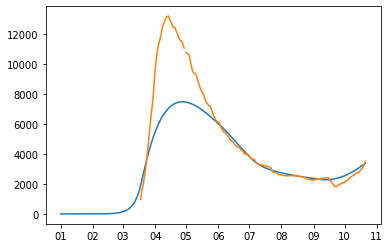

best_error: 1.5070459263563691
vector: [array([1.50704593])]
mean_deaths 0.011104314191979468
[7.44661092e+01 1.87505959e+00 7.98394931e-01 5.19497213e-02
 2.45616245e-02 7.48132296e-02 2.74292379e-01 1.46709569e-01
 9.65821044e-01 1.18246454e+00 1.17115322e+00 7.62068131e-01
 1.23734975e+00 7.80768798e-01 7.52906061e-01 1.13040562e+00
 7.99451021e-01]


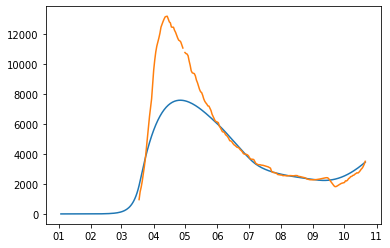

best_error: 1.502307282124549
vector: [array([1.50230728])]
mean_deaths 0.023334179267943192
[7.30822617e+01 1.96942423e+00 8.02774179e-01 9.48679959e-02
 2.09714099e-03 3.08496280e-02 3.44856497e-01 6.67398030e-02
 9.38790655e-01 1.15082679e+00 1.17238161e+00 7.62562906e-01
 1.23328977e+00 7.50299475e-01 7.58978173e-01 9.33136200e-01
 8.07719244e-01]


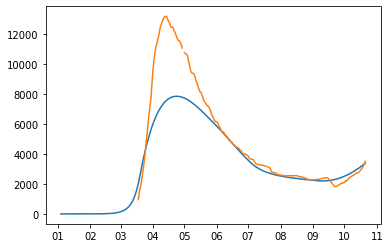

best_error: 1.4339934497437528
vector: [array([1.43399345])]
mean_deaths 0.014041237562762427
[7.43862059e+01 1.93915160e+00 7.96514563e-01 5.04437314e-02
 1.09584483e-02 2.12528946e-02 2.23313380e-01 1.59254562e-01
 9.86506716e-01 1.16295475e+00 1.14601179e+00 7.58802558e-01
 1.22537959e+00 8.47297700e-01 7.56938516e-01 1.13515490e+00
 7.65388078e-01]


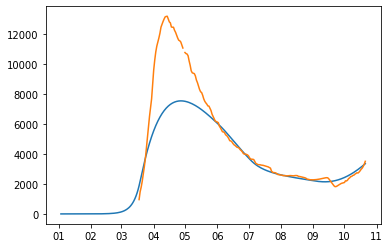

best_error: 1.4839628982886623
vector: [array([1.4839629])]
mean_deaths 0.005039203638800899
[7.54865370e+01 1.86721425e+00 8.08459079e-01 2.32617481e-02
 2.64242523e-03 2.33706054e-02 3.80366775e-01 1.50480745e-01
 9.45651590e-01 1.20037834e+00 1.15603189e+00 7.67221724e-01
 1.24726281e+00 8.19532458e-01 7.55427755e-01 1.23292081e+00
 7.80928140e-01]


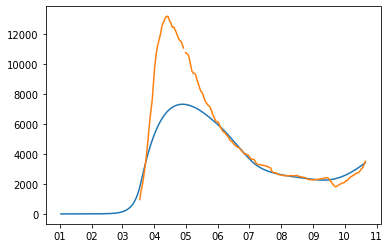

best_error: 1.492733482457656
vector: [array([1.49273348])]
mean_deaths 0.0012455250087068756
[7.33541621e+01 1.83263153e+00 7.99156591e-01 4.91060797e-02
 1.04479826e-02 3.37692294e-02 3.32915272e-01 1.06946758e-01
 9.60462175e-01 1.19762333e+00 1.22046358e+00 1.01268742e+00
 1.22873449e+00 7.52160985e-01 7.59799647e-01 1.04764806e+00
 7.50796591e-01]best_error: 1.4366185745364448

vector: [array([1.43661857])]
mean_deaths 0.013421951226459306
[7.44959316e+01 1.95924055e+00 7.98616012e-01 3.91929350e-02
 4.07101503e-03 9.02374268e-02 4.06492694e-01 1.49199542e-01
 9.77979741e-01 1.17433484e+00 1.15033211e+00 8.09107292e-01
 1.21030857e+00 7.75474026e-01 7.53595633e-01 1.21744831e+00
 8.50679875e-01]


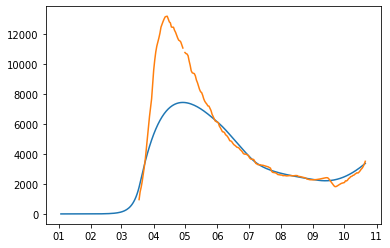

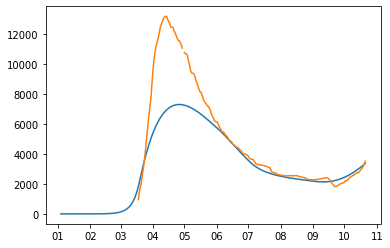

best_error: 1.5026917851574673
vector: [array([1.50269179])]
mean_deaths 0.032591668433434896
[7.46110832e+01 1.87172533e+00 8.03961361e-01 2.29989024e-02
 6.45441432e-03 7.49326308e-02 3.47047061e-01 1.18854881e-01
 9.71633166e-01 1.19850740e+00 1.18926424e+00 9.15078894e-01
 1.22124076e+00 7.81941182e-01 7.62670082e-01 1.21977567e+00
 7.76346430e-01]


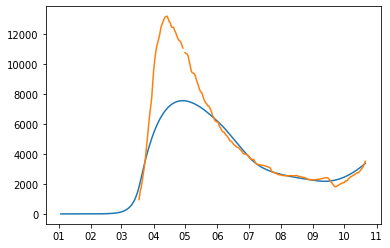

best_error: 1.4567340411300576
vector: [array([1.45673404])]
mean_deaths 0.004726464115842643
[7.35980631e+01 1.86207122e+00 7.88410552e-01 6.59457543e-02
 4.48682150e-02 8.02005972e-02 2.59379019e-01 6.05650085e-02
 9.60648136e-01 1.16309603e+00 1.17665848e+00 8.59412176e-01
 1.21920799e+00 8.71301843e-01 7.54255120e-01 1.12517702e+00
 8.02640197e-01]


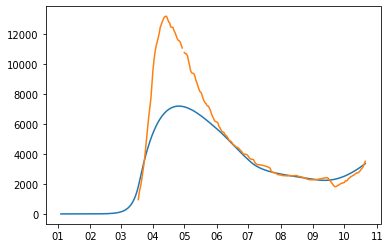

best_error: 1.4533325007967508
vector: [array([1.4533325])]
mean_deaths 0.00588804378584365
[7.56318443e+01 1.95652832e+00 8.15868172e-01 3.99580470e-03
 3.78685477e-02 7.65744912e-02 4.72470757e-01 1.18768483e-01
 9.61596659e-01 1.20895541e+00 1.17073211e+00 7.87112885e-01
 1.22499892e+00 8.03520285e-01 7.57155622e-01 1.15959140e+00
 8.71497294e-01]


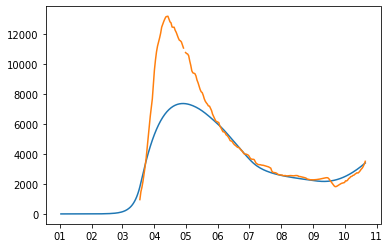

best_error: 1.4374116058094288
vector: [array([1.43741161])]
mean_deaths 0.006640764297759918
[7.65526480e+01 1.79666951e+00 7.95189246e-01 4.57121040e-02
 3.42164954e-02 6.59052999e-02 3.67629538e-01 1.48890847e-01
 9.91417095e-01 1.20551954e+00 1.14514832e+00 8.21863776e-01
 1.23687023e+00 7.68348157e-01 7.56784062e-01 1.13133892e+00
 7.92422860e-01]


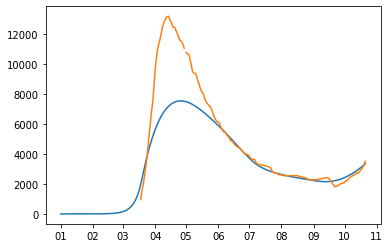

best_error: 1.4860375546845142
vector: [array([1.48603755])]
mean_deaths 0.0022624261175796597
[7.34510293e+01 1.85938630e+00 7.93642808e-01 2.68153484e-02
 1.87491532e-02 1.19973826e-02 3.65919810e-01 1.23280000e-01
 9.89826638e-01 1.19244112e+00 1.20034062e+00 8.36841114e-01
 1.20257550e+00 8.12011696e-01 7.63532923e-01 1.14125036e+00
 9.35715523e-01]


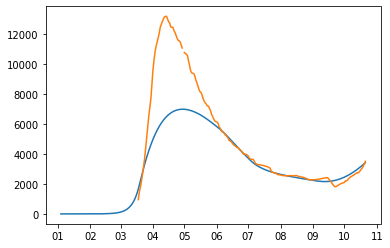

best_error: 1.484769020125639
vector: [array([1.48476902])]
mean_deaths 0.019852645743781542
[7.30764830e+01 1.79392413e+00 7.94700764e-01 7.16493514e-02
 2.20240835e-02 3.43900870e-02 3.05234972e-01 1.52397481e-01
 9.55390688e-01 1.15420654e+00 1.18449030e+00 7.96595425e-01
 1.10545893e+00 8.89364429e-01 7.55008653e-01 1.19791526e+00
 7.64198909e-01]


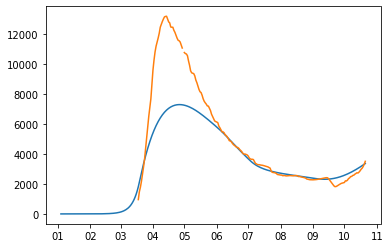

best_error: 1.474300321051237
vector: [array([1.47430032])]
mean_deaths 3.4855559698775786e-06
[7.42994424e+01 1.86415408e+00 7.98713419e-01 3.85118232e-02
 1.31709854e-02 2.14909261e-02 4.49308890e-01 1.44544319e-01
 9.74626290e-01 1.18517480e+00 1.17795963e+00 8.04384072e-01
 1.20862800e+00 8.44826048e-01 7.55263591e-01 1.20277995e+00
 7.72303499e-01]


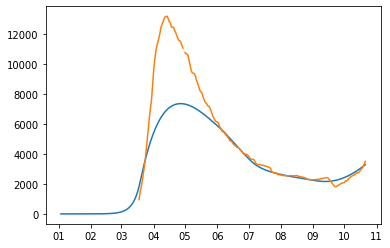

best_error: 1.4679659695938732
vector: [array([1.46796597])]
mean_deaths 0.017260885089532413
[7.63356532e+01 1.90786990e+00 8.01287026e-01 5.11030009e-02
 1.31698073e-02 7.13735602e-02 3.32973935e-01 9.22792203e-02
 9.66208116e-01 1.17189923e+00 1.09961608e+00 8.38723108e-01
 1.17314043e+00 7.96130976e-01 7.50395383e-01 1.19541689e+00
 8.51714243e-01]


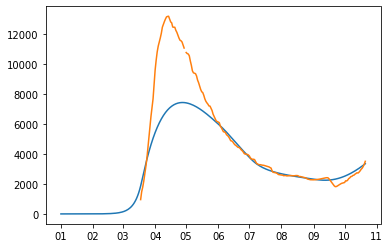

best_error: 1.4896991074638708
vector: [array([1.48969911])]
mean_deaths 0.012469659332174431
[7.34214544e+01 1.94724674e+00 7.90195791e-01 5.67852480e-02
 1.80587885e-03 6.93735060e-02 3.68598701e-01 1.35609007e-01
 9.63448625e-01 1.16032243e+00 1.15489122e+00 7.79008540e-01
 1.24788211e+00 8.04106711e-01 7.65947230e-01 1.07995186e+00
 7.52456768e-01]


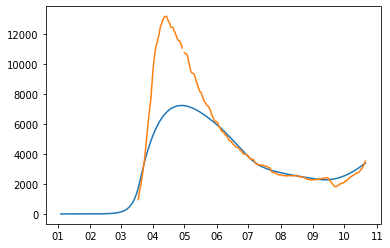

best_error: 1.4421623509530979
vector: [array([1.44216235])]
mean_deaths 0.009597849646254333
[7.46110832e+01 1.82457383e+00 7.90121456e-01 5.69818779e-02
 1.31690551e-02 6.42524736e-02 3.47047061e-01 1.18854881e-01
 9.71633166e-01 1.18525594e+00 1.16851490e+00 8.25501579e-01
 1.23870960e+00 7.71790253e-01 7.55695161e-01 1.19829530e+00
 8.32226993e-01]


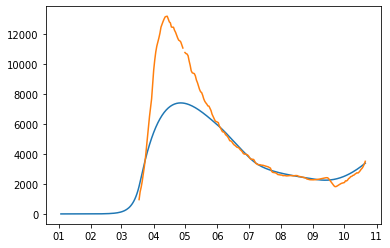

best_error: 1.3981907902987543
vector: [array([1.39819079])]
mean_deaths 0.00046205817097726555
[7.44315971e+01 1.94245808e+00 7.99582238e-01 3.98794060e-02
 9.15029499e-03 7.07790425e-02 4.14458055e-01 1.56611062e-01
 9.70098311e-01 1.17887826e+00 1.15593456e+00 7.78098456e-01
 1.22807646e+00 7.87287044e-01 7.57297408e-01 1.20684563e+00
 8.19701980e-01]


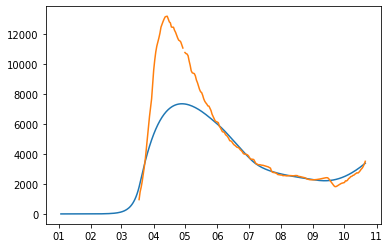

best_error: 1.455668617659731
vector: [array([1.45566862])]
mean_deaths 0.015384271110555698
[7.35692458e+01 1.94909594e+00 8.01987677e-01 5.48157847e-02
 1.36537927e-02 3.57494923e-02 3.69101426e-01 1.35206651e-01
 9.61273628e-01 1.16624889e+00 1.18597605e+00 7.81964155e-01
 1.17330181e+00 7.74767007e-01 7.54842704e-01 1.09878113e+00
 8.53610246e-01]


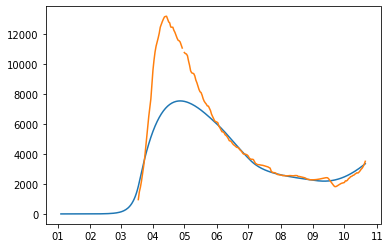

best_error: 1.3992284807524686
vector: [array([1.39922848])]
mean_deaths 0.0015451781321901255
[7.23436204e+01 1.98518513e+00 7.94796523e-01 5.89094193e-02
 8.03784651e-03 5.92967175e-02 4.07888824e-01 1.43198062e-01
 9.62248902e-01 1.16265528e+00 1.19769582e+00 7.73813982e-01
 1.24802371e+00 7.71619432e-01 7.53687667e-01 1.05332835e+00
 8.41043433e-01]


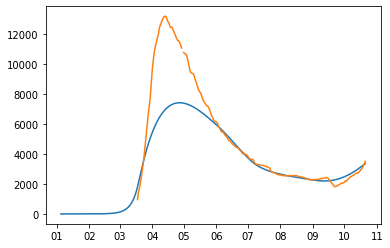

best_error: 1.4321262695910004
vector: [array([1.43212627])]
mean_deaths 0.007902172835253157
[7.34662660e+01 1.90027449e+00 7.93868291e-01 5.62537815e-02
 2.15169273e-03 7.99244109e-02 2.90028784e-01 1.36872308e-01
 9.79966953e-01 1.17563230e+00 1.18761129e+00 8.65432196e-01
 1.21720258e+00 7.50606921e-01 7.60469460e-01 1.21693205e+00
 8.39919073e-01]


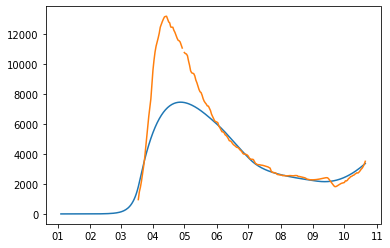

best_error: 1.483940993076461
vector: [array([1.48394099])]
mean_deaths 0.01547830352862221
[7.43927803e+01 1.88375081e+00 7.88044161e-01 5.93167326e-02
 3.38481913e-02 5.67754879e-02 4.49638059e-01 1.11540650e-01
 9.74616563e-01 1.17407735e+00 1.15330537e+00 7.81254656e-01
 1.24289688e+00 8.00524947e-01 7.57129059e-01 1.11423089e+00
 8.33587575e-01]


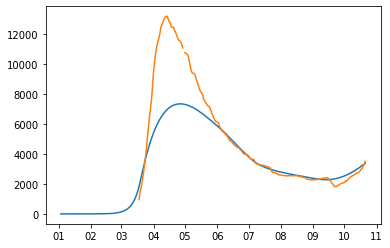

best_error: 1.45226878798481
vector: [array([1.45226879])]
mean_deaths 0.01214802398315402
[7.51463528e+01 1.88878348e+00 7.97489790e-01 5.72920193e-02
 1.64222163e-02 2.97361436e-02 4.46500155e-01 1.54616728e-01
 9.70715621e-01 1.17916365e+00 1.13568601e+00 7.64079872e-01
 1.20856457e+00 7.84469271e-01 7.54000593e-01 9.10969753e-01
 8.49566273e-01]


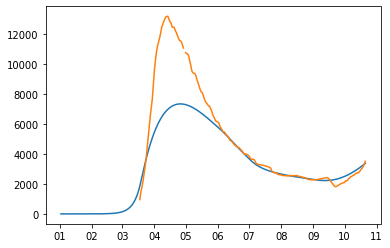

best_error: 1.4272096540481596
vector: [array([1.42720965])]
mean_deaths 0.000524291725474905
[7.63859730e+01 1.86312171e+00 7.99356780e-01 3.67612156e-02
 2.97797305e-02 7.75259361e-02 4.50556966e-01 1.05548614e-01
 9.83838189e-01 1.19716057e+00 1.12659497e+00 8.09180129e-01
 1.17779061e+00 7.67031049e-01 7.59072734e-01 1.03353917e+00
 8.06857333e-01]


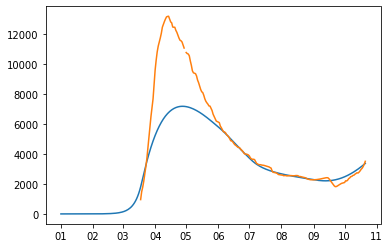

best_error: 1.4534978754578236
vector: [array([1.45349788])]
mean_deaths 0.0217897506566427
[7.55762927e+01 1.85320113e+00 7.96472203e-01 5.14607051e-02
 2.62152437e-02 5.22586805e-02 3.69487951e-01 1.30027866e-01
 9.66872782e-01 1.18300560e+00 1.14507264e+00 7.93363572e-01
 1.23930744e+00 8.14014400e-01 7.52302219e-01 1.15559180e+00
 8.02200648e-01]


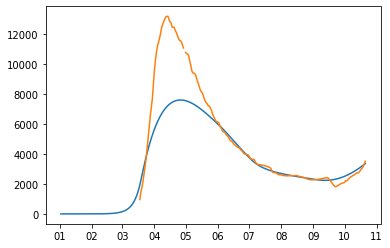

best_error: 1.4669784221575002
vector: [array([1.46697842])]
mean_deaths 0.01970147349494157
[7.43971079e+01 1.85243351e+00 7.89174496e-01 5.07123732e-02
 4.63278032e-03 5.94371332e-02 2.83078323e-01 1.38225946e-01
 9.90010951e-01 1.18095669e+00 1.16052757e+00 7.52027324e-01
 1.22714706e+00 7.69853785e-01 7.66368416e-01 1.10437570e+00
 7.85613994e-01]


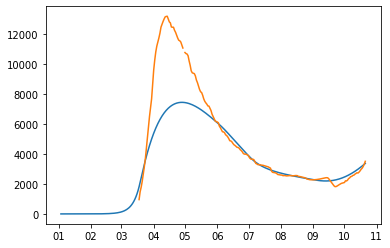

best_error: 1.4373408742776856
vector: [array([1.43734087])]
mean_deaths 0.005418731427972461
[7.24179417e+01 1.94873350e+00 7.98742721e-01 3.40019537e-02
 2.42373155e-02 7.77856549e-02 4.76355447e-01 1.58641336e-01
 9.63459261e-01 1.18242750e+00 1.22840301e+00 8.07766515e-01
 1.23872355e+00 7.97530415e-01 7.58981918e-01 1.24300307e+00
 8.35946205e-01]


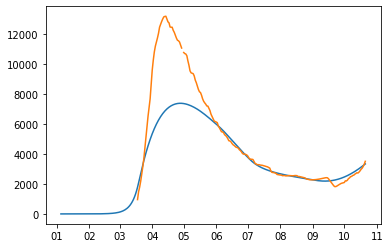

best_error: 1.4021760063043296
vector: [array([1.40217601])]
mean_deaths 0.007215725347240717
[7.36430709e+01 1.96750321e+00 7.95727528e-01 5.18243657e-02
 1.93023882e-02 7.53903877e-02 3.48890086e-01 1.18471658e-01
 9.70198567e-01 1.16629476e+00 1.17313288e+00 7.79011912e-01
 1.22690465e+00 7.81924309e-01 7.58409836e-01 1.24308407e+00
 8.58953344e-01]


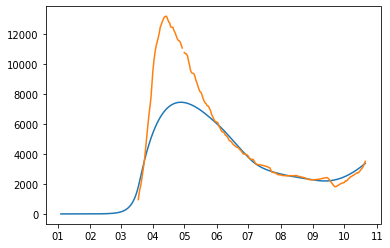

best_error: 1.4308392588221037
vector: [array([1.43083926])]
mean_deaths 0.007170975398052733
[7.33873216e+01 1.89750340e+00 7.89388648e-01 7.56371437e-02
 1.42469582e-02 9.69236692e-02 3.44298176e-01 1.62105407e-01
 9.95145418e-01 1.16395047e+00 1.18236040e+00 7.69457686e-01
 1.23015413e+00 7.71942995e-01 7.59282140e-01 1.24326146e+00
 8.09519718e-01]


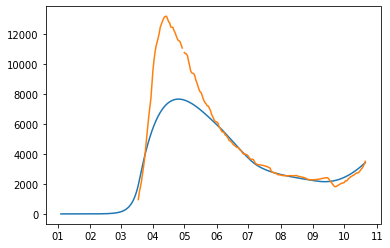

best_error: 1.4172413160934954
vector: [array([1.41724132])]
mean_deaths 0.008307682806174964
[7.54756963e+01 1.82360149e+00 8.02038138e-01 5.09305758e-02
 2.06658715e-02 9.64077623e-02 3.31069703e-01 1.93599348e-01
 9.82593481e-01 1.17931873e+00 1.15414587e+00 7.66239685e-01
 1.15777197e+00 8.49465587e-01 7.57848121e-01 1.21824585e+00
 7.63690191e-01]


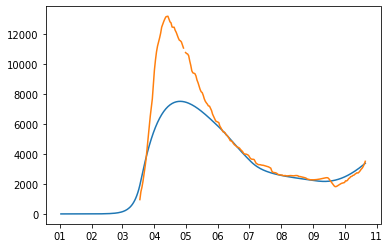

best_error: 1.4477779607045007
vector: [array([1.44777796])]
mean_deaths 0.005060738022017492
[7.55711635e+01 1.96508340e+00 8.03331415e-01 4.39304131e-02
 3.57714106e-03 5.91631738e-02 2.18754525e-01 1.13577135e-01
 9.63966984e-01 1.17387910e+00 1.11938460e+00 9.71159536e-01
 1.21716653e+00 7.86993238e-01 7.52633415e-01 1.20662048e+00
 8.23410895e-01]


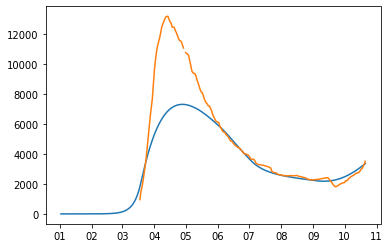

best_error: 1.398161957887994
vector: [array([1.39816196])]
mean_deaths 0.007749546383568236
[7.35659983e+01 1.90798166e+00 7.93729336e-01 4.63761945e-02
 1.65908849e-02 7.99244109e-02 2.90028784e-01 9.62125837e-02
 9.79966953e-01 1.17563230e+00 1.18761129e+00 7.82823246e-01
 1.22799187e+00 7.88940595e-01 7.53071272e-01 1.14332410e+00
 8.03467324e-01]


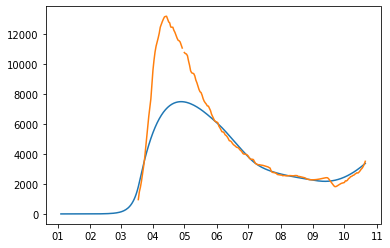

best_error: 1.3955346881374855
vector: [array([1.39553469])]
mean_deaths 3.0076905713363725e-05
[7.69684967e+01 1.74935311e+00 8.02109582e-01 1.12211355e-02
 1.63495920e-02 7.68193440e-02 4.59792313e-01 1.19083877e-01
 9.89833275e-01 1.23003381e+00 1.17334125e+00 7.67368105e-01
 1.24172741e+00 8.05558273e-01 7.53995077e-01 1.12967331e+00
 7.50372939e-01]


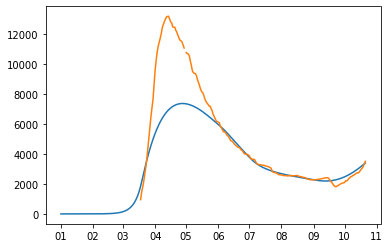

best_error: 1.4371341859345506
vector: [array([1.43713419])]
mean_deaths 0.004273736228767531
[7.87411115e+01 1.65338221e+00 8.11261470e-01 1.34828319e-02
 3.29214811e-02 1.62938969e-02 4.40590552e-01 1.36593092e-01
 9.82503516e-01 1.24864373e+00 1.16394010e+00 7.64199287e-01
 1.18654973e+00 8.14351354e-01 7.51738801e-01 1.18057582e+00
 7.87864857e-01]


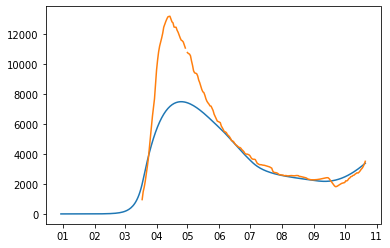

best_error: 1.3840138006778624
vector: [array([1.3840138])]
mean_deaths 0.0019345443693694394
[7.67640384e+01 1.82280469e+00 8.06559650e-01 1.03765350e-02
 7.54439729e-03 9.57207445e-02 4.85932051e-01 1.62105407e-01
 9.86677947e-01 1.22004509e+00 1.15844544e+00 7.58657032e-01
 1.22098365e+00 7.94024785e-01 7.53842070e-01 1.21890380e+00
 8.09519718e-01]


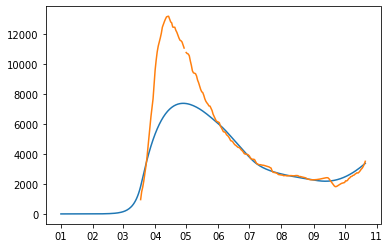

best_error: 1.4375074702079598
vector: [array([1.43750747])]
mean_deaths 0.004431046464468104
[7.89055178e+01 1.67294316e+00 8.02321703e-01 1.61121566e-02
 5.09966924e-02 8.33981284e-02 3.69349196e-01 1.49257171e-01
 9.77499338e-01 1.24526595e+00 1.14605325e+00 8.35519571e-01
 1.23849393e+00 7.96032947e-01 7.56330765e-01 1.24789544e+00
 7.64548221e-01]


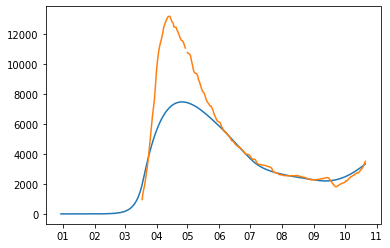

best_error: 1.425622877112259
vector: [array([1.42562288])]
mean_deaths 0.0035663805917786617
[7.66870561e+01 1.82858121e+00 8.05774185e-01 5.09311733e-03
 1.15501436e-03 4.38119978e-02 5.53980994e-01 1.30940000e-01
 9.90101474e-01 1.22995444e+00 1.16576849e+00 7.71299681e-01
 1.23535109e+00 7.60099021e-01 7.53725893e-01 1.16158664e+00
 8.13128751e-01]


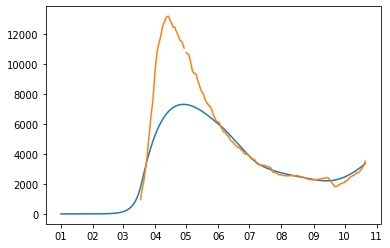

best_error: 1.4383914697334947
vector: [array([1.43839147])]
mean_deaths 0.020339812234008006
[7.55686526e+01 1.88999261e+00 8.01511425e-01 1.76784738e-02
 1.70715799e-02 8.11715606e-02 3.65497261e-01 1.90980411e-01
 9.91889800e-01 1.18114517e+00 1.13730456e+00 7.56076175e-01
 1.18267253e+00 8.85174370e-01 7.54242111e-01 1.23367805e+00
 7.57817541e-01]


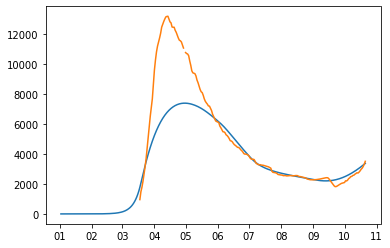

best_error: 1.3848981001889467
vector: [array([1.3848981])]
mean_deaths 0.004465220508037519
[7.44924278e+01 1.83693266e+00 7.86707943e-01 5.19258103e-02
 3.98935533e-02 8.31178568e-02 3.55504949e-01 9.99584813e-02
 9.96692982e-01 1.17902990e+00 1.16524268e+00 7.90308080e-01
 1.22796923e+00 8.42396258e-01 7.50427567e-01 1.17604303e+00
 7.62030376e-01]


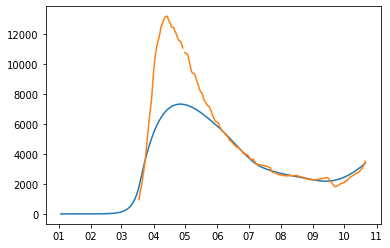

best_error: 1.426174246484076
vector: [array([1.42617425])]
mean_deaths 0.003045757310513513
[7.48219116e+01 1.93490593e+00 7.98338280e-01 3.57669885e-02
 1.19298472e-02 7.20574243e-02 4.42484607e-01 1.89326162e-01
 9.76738842e-01 1.18365156e+00 1.16062376e+00 7.66752962e-01
 1.24155949e+00 7.87575104e-01 7.59034687e-01 1.21537034e+00
 8.23195833e-01]


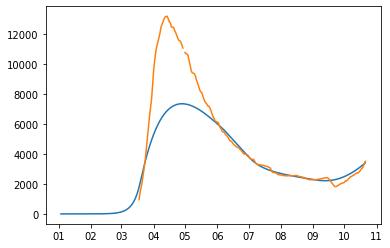

best_error: 1.4195751143840953
vector: [array([1.41957511])]
mean_deaths 0.002433342945779017
[7.32640094e+01 1.86391281e+00 7.90903597e-01 4.55849546e-02
 2.26293655e-02 7.99244109e-02 2.89687683e-01 1.20699042e-01
 9.82968365e-01 1.18132799e+00 1.19512393e+00 7.52932905e-01
 1.22456612e+00 7.83520421e-01 7.51118026e-01 1.18489886e+00
 7.70640237e-01]


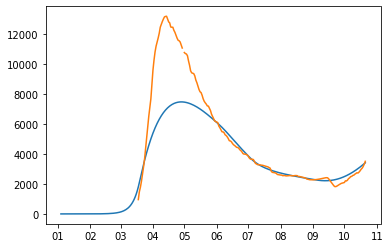

best_error: 1.39149061298018
vector: [array([1.39149061])]
mean_deaths 9.551163205635264e-05
[7.45205726e+01 1.88944385e+00 7.99330385e-01 3.25417973e-02
 9.61936146e-03 3.34072023e-02 4.05017738e-01 9.19405111e-02
 9.69045833e-01 1.18695268e+00 1.16934626e+00 7.55965192e-01
 1.21334575e+00 7.98679881e-01 7.54416756e-01 1.18727776e+00
 7.78012854e-01]


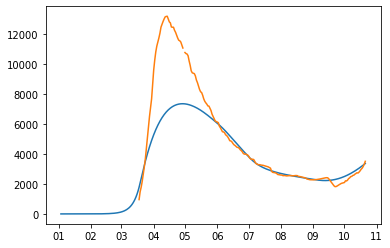

best_error: 1.4091466746860015
vector: [array([1.40914667])]
mean_deaths 0.004435799727623056
[7.69749936e+01 1.79827670e+00 8.02312779e-01 9.09876368e-03
 8.79459800e-03 8.33789135e-02 4.54002642e-01 1.28472679e-01
 9.95527773e-01 1.22236786e+00 1.15819198e+00 8.26864356e-01
 1.22821393e+00 7.95640694e-01 7.50605119e-01 1.21930660e+00
 7.62815712e-01]


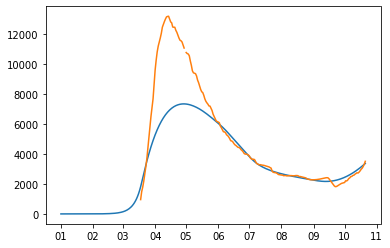

best_error: 1.4350768371034626
vector: [array([1.43507684])]
mean_deaths 0.0002738353770997637
[7.64836395e+01 1.86266478e+00 8.13673634e-01 2.68076306e-02
 8.43122933e-03 6.15080703e-02 4.24841573e-01 1.46513648e-01
 9.99680128e-01 1.20149489e+00 1.15462116e+00 8.24896890e-01
 1.18471675e+00 8.31007553e-01 7.53921215e-01 1.24155711e+00
 7.75477548e-01]


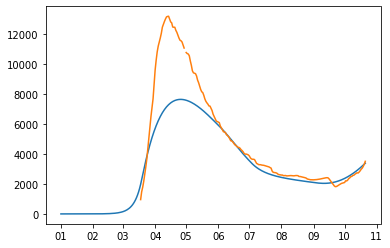

best_error: 1.4295719423618902
vector: [array([1.42957194])]
mean_deaths 0.013326808627004265
[7.66736374e+01 1.86270333e+00 8.09797626e-01 2.17617438e-02
 2.58105634e-02 9.67083738e-02 4.74189172e-01 1.54982748e-01
 9.88175918e-01 1.21177526e+00 1.15940920e+00 7.59948327e-01
 1.22891759e+00 7.87579610e-01 7.54943404e-01 1.24061833e+00
 8.01185268e-01]


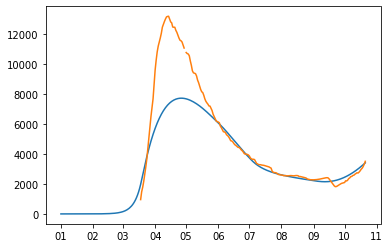

best_error: 1.4029203373564456
vector: [array([1.40292034])]
mean_deaths 0.005570774490908973
[7.65188118e+01 1.82649568e+00 8.05281398e-01 2.80149144e-02
 2.19024807e-02 6.25356950e-02 5.18460480e-01 9.69555876e-02
 9.81122021e-01 1.21349475e+00 1.15799256e+00 7.75402060e-01
 1.20728934e+00 7.70800827e-01 7.52949460e-01 1.15599360e+00
 8.13076455e-01]


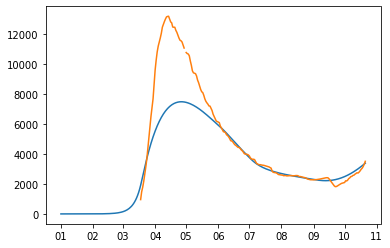

best_error: 1.3760831741087516
vector: [array([1.37608317])]
mean_deaths 0.0014028621705995466
[7.56317592e+01 1.82711347e+00 7.96722764e-01 3.45390238e-02
 2.75308524e-02 7.82354073e-02 3.83531891e-01 1.02928549e-01
 9.90078717e-01 1.19377149e+00 1.15817416e+00 7.68464075e-01
 1.21717511e+00 8.36484570e-01 7.52140358e-01 1.22636232e+00
 7.83156428e-01]


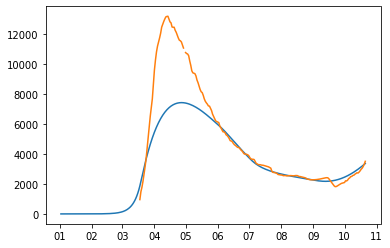

best_error: 1.3736651621290785
vector: [array([1.37366516])]
mean_deaths 3.270960631804936e-05
[7.58348511e+01 1.85775330e+00 7.96054121e-01 3.67126882e-02
 2.90880378e-02 8.31406272e-02 4.08783232e-01 1.68563022e-01
 9.95263532e-01 1.19154665e+00 1.15229550e+00 7.54067713e-01
 1.23619018e+00 8.29000344e-01 7.55252679e-01 1.24529572e+00
 8.13608152e-01]


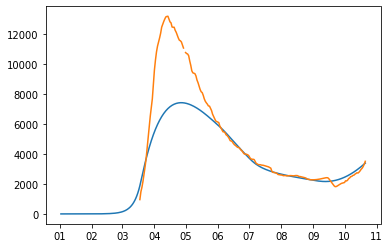

best_error: 1.4002208774246778
vector: [array([1.40022088])]
mean_deaths 0.008605003708564433
[7.59178040e+01 1.91846118e+00 8.04555867e-01 2.05293891e-02
 5.14161572e-03 7.46546696e-02 3.74086285e-01 1.98847818e-01
 9.97968157e-01 1.19175373e+00 1.14990444e+00 7.76466444e-01
 1.20998308e+00 8.08854716e-01 7.52411143e-01 1.19804750e+00
 8.27353560e-01]


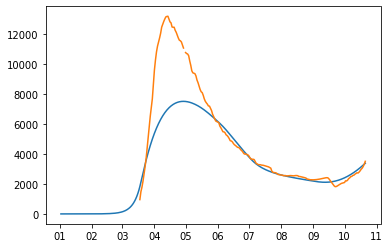

best_error: 1.4208560377566044
vector: [array([1.42085604])]
mean_deaths 0.019083996229605684
[7.68672088e+01 1.85858175e+00 8.00842817e-01 4.04604819e-02
 2.99503030e-02 8.87856855e-02 5.14257371e-01 1.39422063e-01
 9.96052522e-01 1.19996313e+00 1.14582180e+00 7.64142165e-01
 1.22229299e+00 7.75145770e-01 7.53390264e-01 1.21708698e+00
 7.77761945e-01]


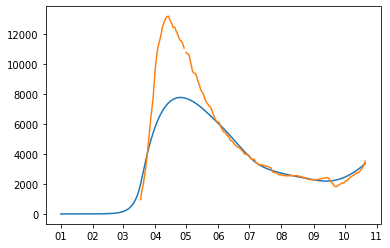

best_error: 1.3913117683936815
vector: [array([1.39131177])]
mean_deaths 0.010461526579015916
[7.57469924e+01 1.88990347e+00 8.00967995e-01 3.41651394e-02
 3.79416715e-02 7.91021280e-02 4.18110028e-01 1.71837969e-01
 9.93779176e-01 1.19809437e+00 1.16558547e+00 7.94872201e-01
 1.23748431e+00 7.77246885e-01 7.55008280e-01 1.22852661e+00
 8.09097467e-01]


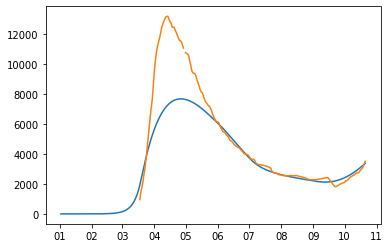

best_error: 1.4256401717691305
vector: [array([1.42564017])]
mean_deaths 0.0009479678693132861
[7.25701022e+01 1.93504359e+00 7.94476136e-01 3.55062639e-02
 1.81503380e-02 6.74235772e-02 4.45645698e-01 1.55537395e-01
 9.80401621e-01 1.17655812e+00 1.21588212e+00 9.14311376e-01
 1.24937428e+00 8.55961567e-01 7.56477828e-01 1.14783022e+00
 7.98049984e-01]


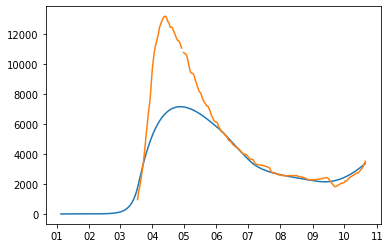

best_error: 1.4324481168677332
vector: [array([1.43244812])]
mean_deaths 0.0007455118432717608
[7.56056509e+01 1.86679362e+00 7.94325140e-01 6.12749814e-02
 2.48549988e-05 8.01704718e-02 2.75899588e-01 1.71751484e-01
 9.93407730e-01 1.16936088e+00 1.12536097e+00 8.25501579e-01
 1.21996920e+00 8.40935612e-01 7.54026309e-01 1.23573865e+00
 8.13851064e-01]


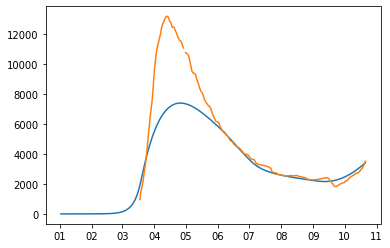

best_error: 1.4167202856777295
vector: [array([1.41672029])]
mean_deaths 0.00023233782503591821
[7.64291366e+01 1.83341170e+00 8.00442815e-01 4.48909122e-02
 4.54867963e-02 8.15571292e-02 3.96674907e-01 1.99881329e-01
 9.92550420e-01 1.19199296e+00 1.13799555e+00 7.55682893e-01
 1.24049656e+00 8.74174773e-01 7.57175558e-01 1.23595294e+00
 7.56116058e-01]


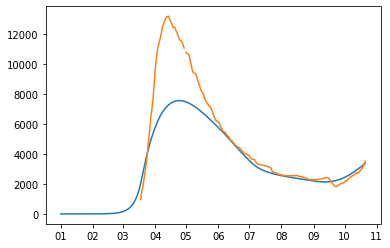

best_error: 1.3774082185953271
vector: [array([1.37740822])]
mean_deaths 0.004561824260713966
[7.56090599e+01 1.86115176e+00 7.94877176e-01 5.29531380e-02
 4.23081713e-02 2.97361436e-02 4.38733621e-01 1.08576651e-01
 9.90147941e-01 1.18551546e+00 1.15187851e+00 7.64079872e-01
 1.22358122e+00 8.07617001e-01 7.54000593e-01 1.18737147e+00
 8.16883000e-01]


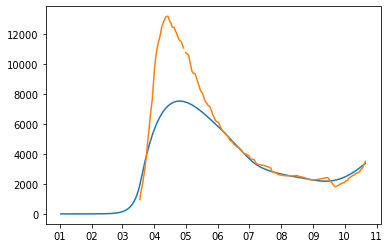

best_error: 1.3976964573432022
vector: [array([1.39769646])]
mean_deaths 0.008850762161042205
[7.57133574e+01 1.83942394e+00 7.96454117e-01 3.54123586e-02
 2.81564982e-02 7.82289554e-02 3.93677373e-01 1.20108346e-01
 9.92161872e-01 1.19287759e+00 1.15581223e+00 7.74089380e-01
 1.22481498e+00 8.33477558e-01 7.53390826e-01 1.12077563e+00
 7.95391319e-01]


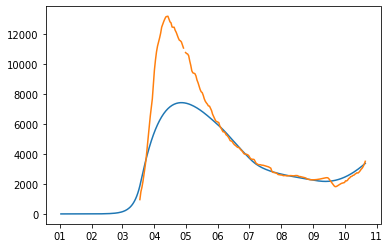

best_error: 1.3937901704357383
vector: [array([1.39379017])]
mean_deaths 0.002425359419735017
[7.35367786e+01 1.89900166e+00 7.94758859e-01 5.20570493e-02
 2.79874633e-02 9.15840336e-02 3.62398102e-01 1.53538601e-01
 9.81114796e-01 1.17734542e+00 1.19642725e+00 7.68313704e-01
 1.21341804e+00 7.79797930e-01 7.56030437e-01 1.21465293e+00
 8.43793958e-01]


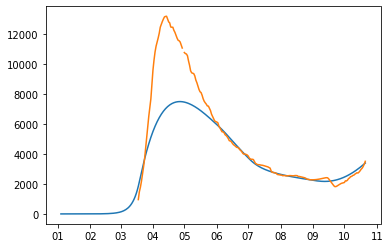

best_error: 1.3893344494800335
vector: [array([1.38933445])]
mean_deaths 0.0008884591820007792
[7.58085775e+01 1.88434043e+00 7.95534329e-01 5.64903143e-02
 4.10249141e-02 3.08496280e-02 3.44856497e-01 1.41553504e-01
 9.92347814e-01 1.18151596e+00 1.14672913e+00 7.62562906e-01
 1.23674151e+00 7.99313580e-01 7.56660696e-01 1.24725730e+00
 8.07719244e-01]


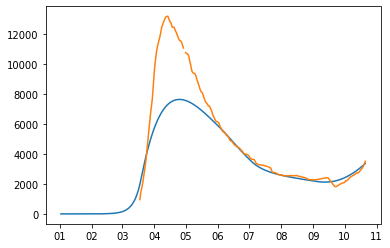

best_error: 1.3978381520090428
vector: [array([1.39783815])]
mean_deaths 0.0021574164102279177
[7.58719916e+01 1.83660755e+00 7.91181594e-01 4.17624274e-02
 2.28546538e-02 4.78738275e-02 4.15067521e-01 1.07804211e-01
 9.97447380e-01 1.18693232e+00 1.14363506e+00 7.75710129e-01
 1.24081368e+00 8.51527080e-01 7.57527249e-01 1.22439509e+00
 7.91534032e-01]


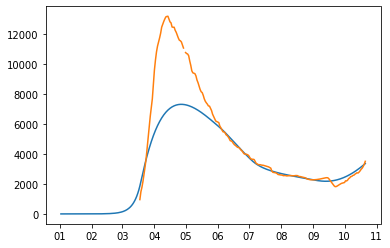

best_error: 1.3972876042438405
vector: [array([1.3972876])]
mean_deaths 0.001095079102928453
[7.51423388e+01 1.87083653e+00 7.94466575e-01 4.84381872e-02
 4.48730675e-02 5.95520742e-02 4.74609140e-01 7.22042783e-02
 9.88984697e-01 1.18961800e+00 1.15430838e+00 7.65865208e-01
 1.22712438e+00 7.93613997e-01 7.53115412e-01 1.22801608e+00
 8.16862348e-01]


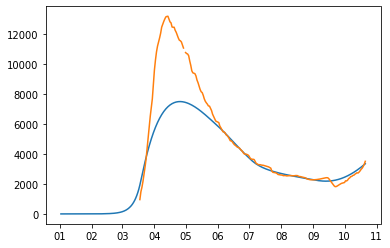

best_error: 1.4198522762494001
vector: [array([1.41985228])]
mean_deaths 0.010195239468225028
[7.55780143e+01 1.90830766e+00 8.01227231e-01 3.38396753e-02
 2.71110763e-02 3.72578365e-02 4.25484981e-01 1.83690548e-01
 9.89211403e-01 1.19138830e+00 1.15131135e+00 8.92761051e-01
 1.23123253e+00 8.00553950e-01 7.57460907e-01 1.24160735e+00
 7.87522498e-01]


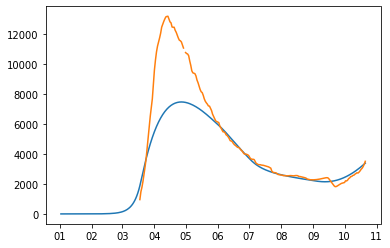

best_error: 1.3802283779158184
vector: [array([1.38022838])]
mean_deaths 0.00583092801205057
[7.57460078e+01 1.81604381e+00 7.96799308e-01 4.29848984e-02
 4.92363851e-02 4.16846061e-02 4.25905320e-01 1.91722860e-01
 9.95528807e-01 1.20094290e+00 1.17710008e+00 7.59960563e-01
 1.22117233e+00 8.01768050e-01 7.51059729e-01 1.24311516e+00
 7.75275858e-01]


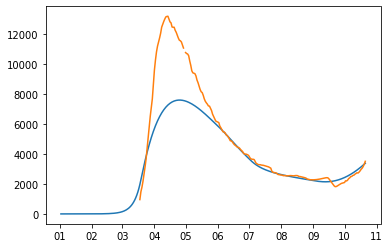

best_error: 1.3921187775998387
vector: [array([1.39211878])]
mean_deaths 0.0016161648640650248
[7.62948327e+01 1.84457072e+00 8.04102730e-01 3.23167146e-02
 1.33530808e-02 8.51035473e-02 4.65014617e-01 1.46131659e-01
 9.76617932e-01 1.20689162e+00 1.14291397e+00 7.75386008e-01
 1.21703663e+00 7.62575207e-01 7.57606151e-01 1.22948966e+00
 8.06589813e-01]


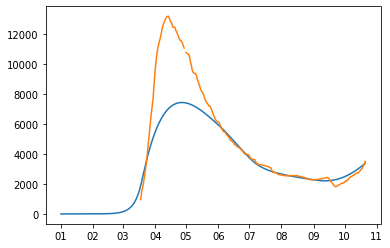

best_error: 1.4141138905353174
vector: [array([1.41411389])]
mean_deaths 0.013108074225130063
[7.59554097e+01 1.80837533e+00 7.96448750e-01 2.37768893e-02
 3.53074937e-02 1.71374114e-02 3.74798817e-01 1.85289728e-01
 9.95214059e-01 1.20351320e+00 1.16972567e+00 7.58840638e-01
 1.24362215e+00 8.53629144e-01 7.58254438e-01 1.23262032e+00
 8.16559416e-01]


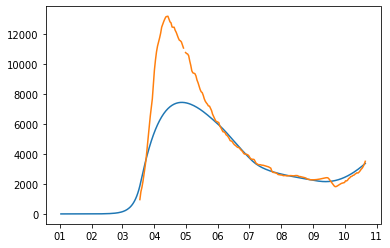

best_error: 1.3963642432902303
vector: [array([1.39636424])]
mean_deaths 0.008732970771245359
[7.57469924e+01 1.83029808e+00 7.98611495e-01 3.76017445e-02
 3.79416715e-02 7.91021280e-02 4.20811369e-01 1.44676073e-01
 9.89087987e-01 1.19818106e+00 1.16999203e+00 8.02802279e-01
 1.22861761e+00 8.20818592e-01 7.55008280e-01 1.23908911e+00
 7.81678563e-01]


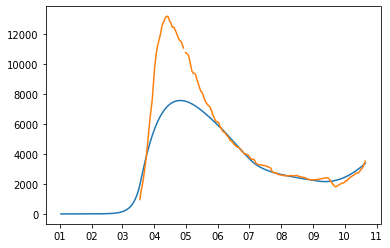

best_error: 1.383136824323306
vector: [array([1.38313682])]
mean_deaths 0.00825871016079932
[7.63700083e+01 1.84092496e+00 8.10530471e-01 1.71345014e-02
 2.01456981e-02 7.92157405e-02 5.85101662e-01 1.84704593e-01
 9.89483245e-01 1.22616159e+00 1.18075408e+00 7.63702848e-01
 1.24433644e+00 7.80646799e-01 7.54889496e-01 1.16458362e+00
 7.50636540e-01]


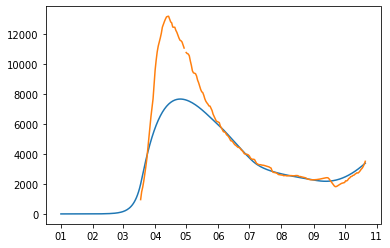

best_error: 1.3894046791108654
vector: [array([1.38940468])]
mean_deaths 0.0027683559396677925
[7.62903119e+01 1.88612478e+00 7.98865120e-01 5.42804657e-02
 2.27108246e-02 5.77885767e-03 3.83531891e-01 1.20299835e-01
 9.95061962e-01 1.18534286e+00 1.12093538e+00 7.68464075e-01
 1.21717511e+00 7.69409565e-01 7.52140358e-01 1.22636232e+00
 8.14056825e-01]


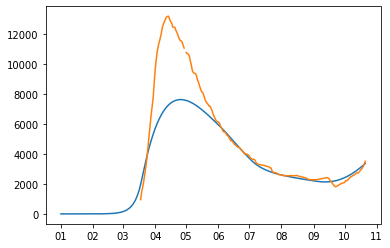

best_error: 1.3930114893778005
vector: [array([1.39301149])]
mean_deaths 9.389247775216726e-05
[7.56955228e+01 1.88187413e+00 8.01316714e-01 4.15165161e-02
 4.17441975e-02 6.07669462e-02 4.46999610e-01 1.73584891e-01
 9.92782793e-01 1.19468635e+00 1.16565636e+00 7.53197532e-01
 1.22244064e+00 7.89365619e-01 7.55372423e-01 1.21139834e+00
 8.06828581e-01]


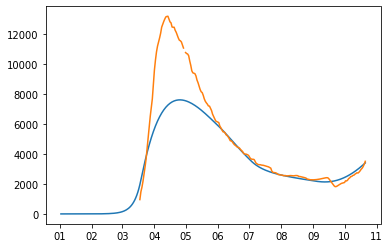

best_error: 1.3866482181074051
vector: [array([1.38664822])]
mean_deaths 0.004414675105919188
[7.57563195e+01 1.83416070e+00 7.95701063e-01 3.17524338e-02
 1.45294387e-02 4.46545639e-02 3.61604344e-01 1.82481727e-01
 9.97052287e-01 1.19774239e+00 1.15710306e+00 7.67906370e-01
 1.23537177e+00 8.00230193e-01 7.53423838e-01 1.21347938e+00
 7.77476307e-01]


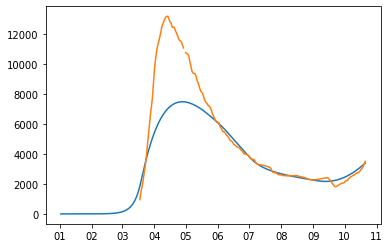

best_error: 1.397071856493117
vector: [array([1.39707186])]
mean_deaths 0.006138424618284107
[7.57685597e+01 1.83142446e+00 7.94960729e-01 4.82844037e-02
 2.10530999e-02 7.53284409e-02 3.20763349e-01 8.41533652e-02
 9.88172803e-01 1.19080515e+00 1.15230268e+00 7.65679394e-01
 1.23557907e+00 7.99363475e-01 7.54027246e-01 1.06399078e+00
 8.18225152e-01]


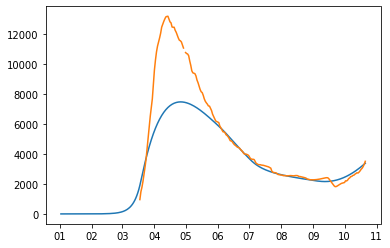

best_error: 1.3973733191840871
vector: [array([1.39737332])]
mean_deaths 0.0003571188153734553
[7.44901787e+01 1.91902595e+00 7.95668632e-01 3.28687547e-02
 3.91970254e-02 5.95258466e-02 4.92216096e-01 1.47797114e-01
 9.84699088e-01 1.18380203e+00 1.16744291e+00 7.66239685e-01
 1.20467414e+00 8.12571436e-01 7.56878175e-01 1.21824585e+00
 7.63690191e-01]


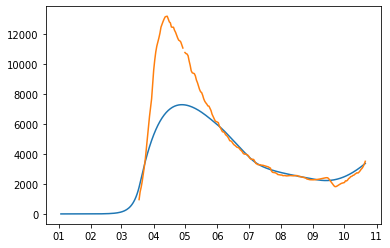

best_error: 1.388859229461999
vector: [array([1.38885923])]
mean_deaths 0.003495444543252097
[7.57419452e+01 1.91187638e+00 7.93441851e-01 5.09914821e-02
 3.69061247e-02 5.83151651e-02 3.14203187e-01 1.40751719e-01
 9.91090944e-01 1.17225847e+00 1.12553776e+00 8.38794837e-01
 1.22855137e+00 8.33628090e-01 7.51393669e-01 1.20800497e+00
 8.08148854e-01]


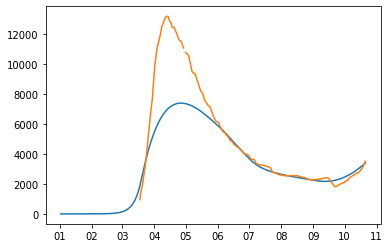

best_error: 1.3843829110462167
vector: [array([1.38438291])]
mean_deaths 0.0055268751081205434
[7.57117255e+01 1.83917773e+00 7.96459490e-01 3.53948919e-02
 2.81439853e-02 8.81578608e-02 3.93474463e-01 1.28771750e-01
 9.92120209e-01 1.19289547e+00 1.15585947e+00 7.62795589e-01
 1.22466219e+00 8.33537698e-01 7.53365817e-01 1.15297892e+00
 7.95146621e-01]


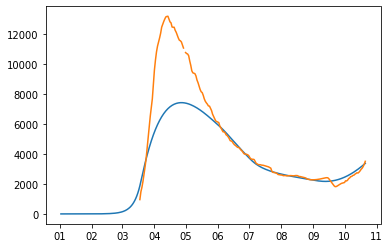

best_error: 1.3917918720205722
vector: [array([1.39179187])]
mean_deaths 0.006900027264026259
[7.49174535e+01 1.85451944e+00 7.96255951e-01 4.74924248e-02
 4.06117945e-02 2.67172872e-02 4.20126496e-01 1.17845096e-01
 9.77082449e-01 1.18504271e+00 1.18232087e+00 7.54568861e-01
 1.24662146e+00 8.42444182e-01 7.53896681e-01 1.22884387e+00
 7.53377942e-01]


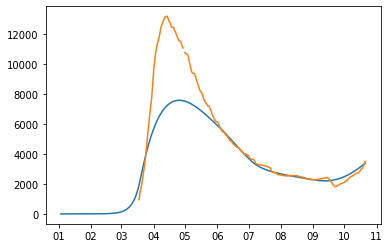

best_error: 1.3909988502074264
vector: [array([1.39099885])]
mean_deaths 0.0010868473255106498
[7.59079510e+01 1.84363925e+00 7.97834417e-01 3.47129105e-02
 4.09814769e-02 9.74483387e-02 4.10145070e-01 1.80830037e-01
 9.88984697e-01 1.19600078e+00 1.16345491e+00 7.65865208e-01
 1.23149450e+00 8.36902290e-01 7.55396080e-01 1.22801608e+00
 7.91514952e-01]


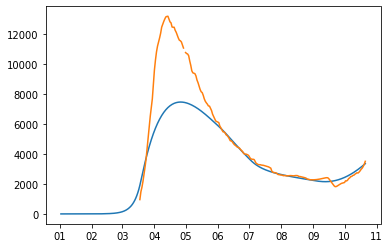

best_error: 1.3707933649157278
vector: [array([1.37079336])]
mean_deaths 0.0020825224780370586
[7.57206638e+01 1.84052623e+00 7.96430062e-01 3.54123586e-02
 2.82125192e-02 7.82289554e-02 3.94585810e-01 1.20108346e-01
 9.92348399e-01 1.19279755e+00 1.15560074e+00 7.74089380e-01
 1.22549906e+00 8.33477558e-01 7.53502794e-01 1.23465052e+00
 7.96486844e-01]


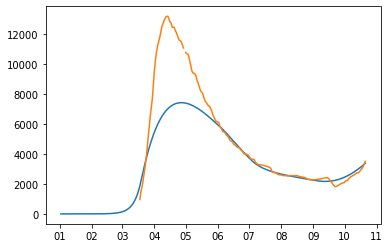

best_error: 1.3746629029065147
vector: [array([1.3746629])]
mean_deaths 0.000927281713933616
[7.57206638e+01 1.84367959e+00 7.95337998e-01 3.54123586e-02
 4.04792191e-02 4.98776056e-02 4.22376182e-01 6.44481815e-02
 9.92348399e-01 1.19279755e+00 1.15521383e+00 7.88395345e-01
 1.21379946e+00 8.33477558e-01 7.52740201e-01 1.18090376e+00
 7.96486844e-01]


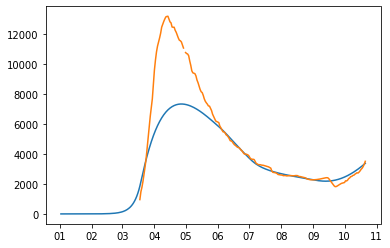

best_error: 1.3816519718191234
vector: [array([1.38165197])]
mean_deaths 0.007601131132579606
[7.56061770e+01 1.84955020e+00 7.97238443e-01 4.12333455e-02
 3.85094356e-02 7.42680058e-02 4.26585128e-01 9.25849634e-02
 9.89995809e-01 1.19190471e+00 1.15935131e+00 7.76406063e-01
 1.22377521e+00 8.20707204e-01 7.51900563e-01 1.14639939e+00
 7.85876931e-01]


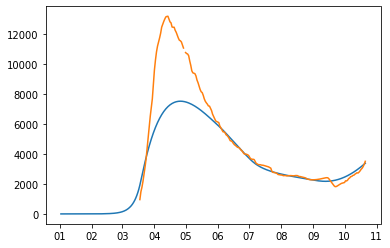

best_error: 1.3967367537016662
vector: [array([1.39673675])]
mean_deaths 0.010564995995093963
[7.52107687e+01 1.85354133e+00 7.98138443e-01 4.38802903e-02
 4.27781679e-02 4.71929541e-02 3.93062785e-01 1.31124279e-01
 9.97208279e-01 1.19072430e+00 1.16513372e+00 7.77135912e-01
 1.21679847e+00 8.09909669e-01 7.50122574e-01 1.23617803e+00
 7.82581091e-01]


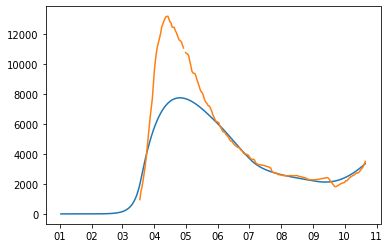

best_error: 1.3960355828781583
vector: [array([1.39603558])]
mean_deaths 0.011077354259910703
[7.56300128e+01 1.90707191e+00 7.96487960e-01 4.48266758e-02
 4.99421933e-02 8.01732910e-02 3.46028607e-01 1.52397481e-01
 9.99860688e-01 1.17721222e+00 1.14106235e+00 7.80214445e-01
 1.22591572e+00 8.53941608e-01 7.52907527e-01 1.15202479e+00
 8.00728495e-01]


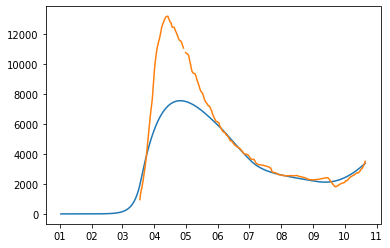

best_error: 1.3876387930412921
vector: [array([1.38763879])]
mean_deaths 0.0003118485918333195
[7.59187873e+01 1.82359996e+00 7.95227403e-01 3.92971957e-02
 3.21157207e-02 9.42744559e-02 3.73182361e-01 9.04113057e-02
 9.88187947e-01 1.19157454e+00 1.15370378e+00 7.75191036e-01
 1.21832083e+00 8.41257522e-01 7.50663170e-01 1.10705657e+00
 7.86596396e-01]


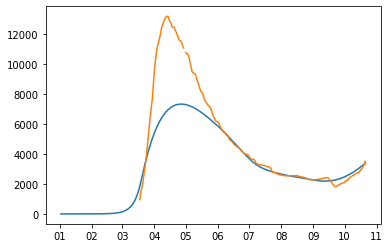

best_error: 1.3759391155275404
vector: [array([1.37593912])]
mean_deaths 0.0016173923798174779
[7.56663302e+01 1.82061454e+00 7.92684186e-01 4.01301531e-02
 3.94074577e-02 5.48084847e-02 4.19886480e-01 7.89478166e-02
 9.94585553e-01 1.18975853e+00 1.15343656e+00 7.72479492e-01
 1.22178795e+00 8.58394535e-01 7.54522389e-01 1.23541504e+00
 7.65454213e-01]


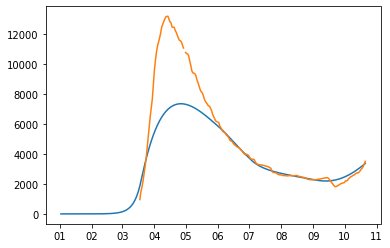

best_error: 1.3876907346488068
vector: [array([1.38769073])]
mean_deaths 0.0038967644327330634
[7.54101142e+01 1.81708264e+00 7.98929791e-01 3.30683189e-02
 2.02107842e-02 9.05614333e-02 4.33223394e-01 1.25068948e-01
 9.92068019e-01 1.20127737e+00 1.17003194e+00 7.50518164e-01
 1.24009055e+00 8.28797600e-01 7.54398680e-01 1.23958741e+00
 8.01674516e-01]


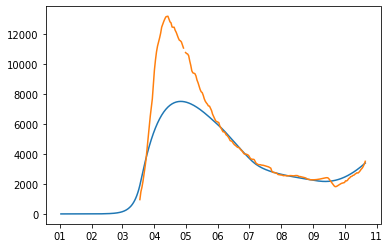

best_error: 1.3929207527618022
vector: [array([1.39292075])]
mean_deaths 0.00013887543522505055
[7.57325682e+01 1.83416664e+00 8.02991120e-01 9.57168774e-03
 2.50830133e-02 8.00586688e-02 4.11003818e-01 6.85127701e-02
 9.89893430e-01 1.20876028e+00 1.17146500e+00 8.52319828e-01
 1.23318337e+00 8.69698754e-01 7.53019742e-01 1.23353590e+00
 8.09976404e-01]


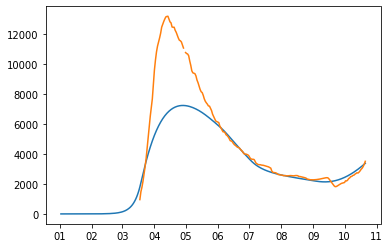

best_error: 1.3904140618146763
vector: [array([1.39041406])]
mean_deaths 0.002050755228274588
[7.54034623e+01 1.85246504e+00 7.91479601e-01 4.24385817e-02
 3.09867688e-02 7.92465750e-02 3.53095271e-01 1.03660141e-01
 9.97300685e-01 1.18399118e+00 1.13893340e+00 8.11258303e-01
 1.22090909e+00 8.37045031e-01 7.52906629e-01 1.19629186e+00
 8.35320697e-01]


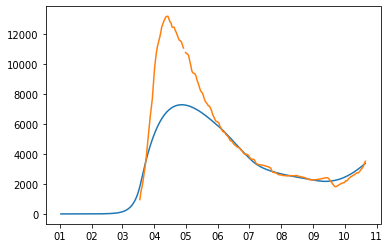

best_error: 1.382942976747263
vector: [array([1.38294298])]
mean_deaths 0.001104004638417216
[7.57542504e+01 1.83905461e+00 7.94340859e-01 3.69329285e-02
 4.02354784e-02 9.67756396e-02 4.07823784e-01 5.57127634e-02
 9.89000265e-01 1.18944237e+00 1.14950840e+00 7.98690953e-01
 1.21588675e+00 8.52540382e-01 7.53609765e-01 1.23780661e+00
 8.14368770e-01]


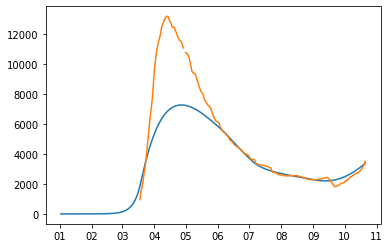

best_error: 1.3833969518276055
vector: [array([1.38339695])]
mean_deaths 0.0015385502192640352
[7.58251383e+01 1.76195630e+00 7.96838320e-01 3.29063047e-02
 3.42350011e-02 7.96456746e-02 3.73652036e-01 7.52940352e-02
 9.97930847e-01 1.20354377e+00 1.17986500e+00 7.83616249e-01
 1.18697201e+00 8.39295409e-01 7.53656799e-01 1.22960794e+00
 7.72697634e-01]


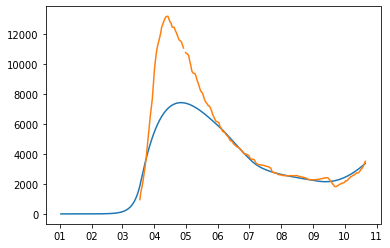

best_error: 1.3759388955857197
vector: [array([1.3759389])]
mean_deaths 0.0016149852818306447
[7.51286791e+01 1.83933423e+00 7.96554592e-01 3.76954930e-02
 2.76469303e-02 2.27726745e-02 3.98595365e-01 6.26714906e-02
 9.92195818e-01 1.19288121e+00 1.15682672e+00 7.72859565e-01
 1.23348535e+00 8.35608716e-01 7.54988521e-01 1.22606478e+00
 7.92121835e-01]


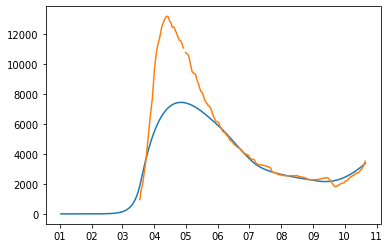

best_error: 1.3816854333471438
vector: [array([1.38168543])]
mean_deaths 0.000751850093494888
[7.57592863e+01 1.84812309e+00 7.96201439e-01 3.19974914e-02
 1.88436937e-02 8.68021440e-02 4.16431209e-01 1.33473101e-01
 9.93629007e-01 1.19286109e+00 1.15142210e+00 7.64190487e-01
 1.20095996e+00 8.03559086e-01 7.51902725e-01 1.23236275e+00
 7.66703707e-01]


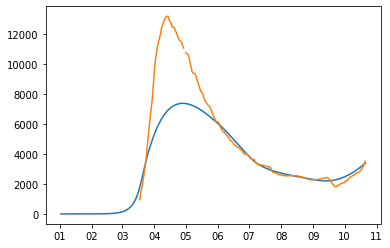

best_error: 1.3821610049656348
vector: [array([1.382161])]
mean_deaths 0.0018688515557104424
[7.58798187e+01 1.85153232e+00 7.97755486e-01 3.70848704e-02
 2.29351573e-02 7.84894114e-02 3.96268191e-01 1.92547795e-01
 9.96027253e-01 1.19609397e+00 1.16063332e+00 7.69890633e-01
 1.23436013e+00 8.03304208e-01 7.52509123e-01 1.20448636e+00
 8.00351466e-01]


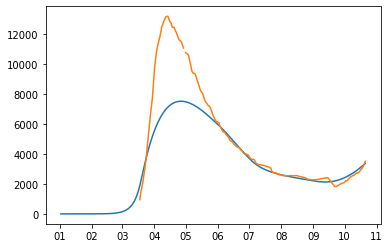

best_error: 1.3704116323751827
vector: [array([1.37041163])]
mean_deaths 0.0008488629710294384
[7.57149967e+01 1.85334908e+00 7.96762942e-01 4.16675194e-02
 1.92878239e-02 5.76525541e-02 4.01950982e-01 1.17845096e-01
 9.91490424e-01 1.19074365e+00 1.15253487e+00 7.54568861e-01
 1.22461299e+00 8.03548055e-01 7.55790322e-01 1.22884387e+00
 7.91366903e-01]


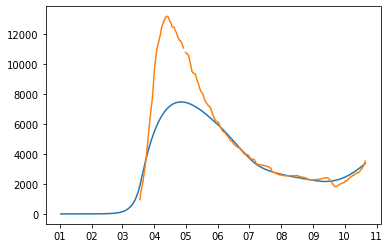

best_error: 1.3725623986278168
vector: [array([1.3725624])]
mean_deaths 0.00039139948706478587
[7.57013596e+01 1.82604799e+00 7.98330177e-01 2.88650372e-02
 2.06687793e-02 8.15975982e-02 4.27549336e-01 1.55885492e-01
 9.93698991e-01 1.20221895e+00 1.16754922e+00 8.06887144e-01
 1.22241095e+00 8.12836071e-01 7.53122512e-01 1.22951814e+00
 7.73748965e-01]


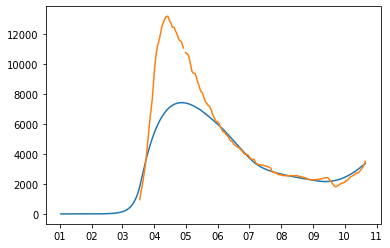

best_error: 1.3855952886775198
vector: [array([1.38559529])]
mean_deaths 0.008124885658492804
[7.43558645e+01 1.90312489e+00 7.93271398e-01 5.45385097e-02
 1.98642543e-02 6.32659576e-02 3.96216526e-01 1.09666075e-01
 9.99336629e-01 1.17439067e+00 1.16353152e+00 7.75298406e-01
 1.21829114e+00 7.90685017e-01 7.55769540e-01 1.21452440e+00
 7.92034441e-01]


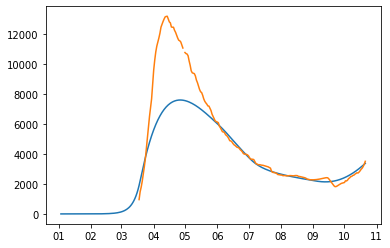

best_error: 1.379278339794601
vector: [array([1.37927834])]
mean_deaths 0.0017222171408008296
[7.51123926e+01 1.82278045e+00 7.96127388e-01 4.87415877e-02
 2.00738397e-02 3.82480304e-02 3.70799772e-01 1.41214639e-01
 9.88006516e-01 1.18569301e+00 1.15122466e+00 8.14440090e-01
 1.19931302e+00 8.28847798e-01 7.52623821e-01 1.24370293e+00
 8.04839885e-01]


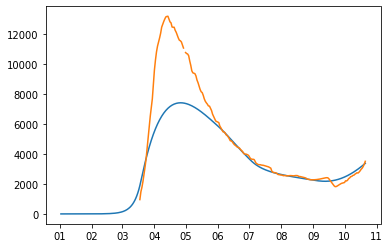

best_error: 1.3742521938938386
vector: [array([1.37425219])]
mean_deaths 0.0012243978793924945
[7.56284462e+01 1.89103164e+00 7.95422464e-01 4.71827727e-02
 1.82260358e-02 4.10613474e-02 3.63994917e-01 1.44969079e-01
 9.93510374e-01 1.18133783e+00 1.13746523e+00 7.94031341e-01
 1.22103372e+00 7.93746189e-01 7.51837608e-01 1.23136528e+00
 8.05444476e-01]


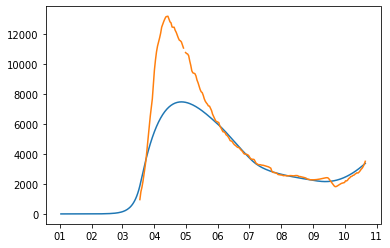

best_error: 1.3692834993873708
vector: [array([1.3692835])]
mean_deaths 0.0014377148358367211
[7.59424940e+01 1.89473464e+00 7.94191858e-01 4.79531535e-02
 1.02424239e-02 2.14505991e-02 3.51094980e-01 1.64062952e-01
 9.88990278e-01 1.18166516e+00 1.13324921e+00 7.81520974e-01
 1.24257638e+00 7.72932443e-01 7.50852309e-01 1.24468685e+00
 7.65919674e-01]


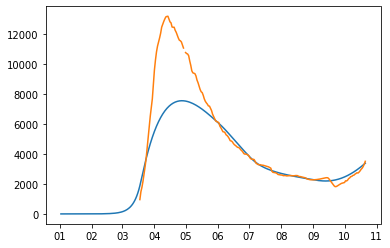

best_error: 1.3692834993873708
vector: [array([1.3692835])]
mean_deaths 0.0014377148358367211
[7.59424940e+01 1.89473464e+00 7.94191858e-01 4.79531535e-02
 1.02424239e-02 2.14505991e-02 3.51094980e-01 1.64062952e-01
 9.88990278e-01 1.18166516e+00 1.13324921e+00 7.81520974e-01
 1.24257638e+00 7.72932443e-01 7.50852309e-01 1.24468685e+00
 7.65919674e-01]


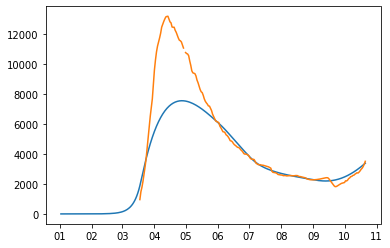

best_error: 1.3692833740650647
vector: [array([1.36928337])]
mean_deaths 0.0014377057784102317
[7.59424940e+01 1.89473465e+00 7.94191858e-01 4.79531535e-02
 1.02424239e-02 2.14505991e-02 3.51094980e-01 1.64062952e-01
 9.88990278e-01 1.18166516e+00 1.13324921e+00 7.81520974e-01
 1.24257638e+00 7.72932443e-01 7.50852309e-01 1.24468685e+00
 7.65919674e-01]


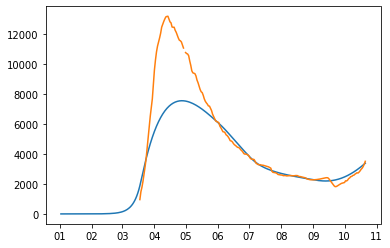

best_error: 1.369283275514893
vector: [array([1.36928328])]
mean_deaths 0.0014376748090962333
[7.59424940e+01 1.89473464e+00 7.94191858e-01 4.79531635e-02
 1.02424239e-02 2.14505991e-02 3.51094980e-01 1.64062952e-01
 9.88990278e-01 1.18166516e+00 1.13324921e+00 7.81520974e-01
 1.24257638e+00 7.72932443e-01 7.50852309e-01 1.24468685e+00
 7.65919674e-01]


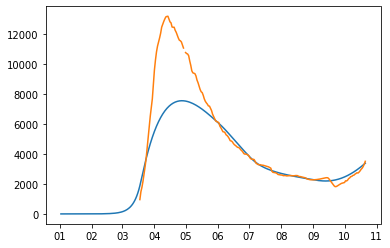

best_error: 1.369283093460207
vector: [array([1.36928309])]
mean_deaths 0.0014376246671539133
[7.59424940e+01 1.89473464e+00 7.94191858e-01 4.79531535e-02
 1.02424239e-02 2.14505991e-02 3.51094980e-01 1.64062952e-01
 9.88990278e-01 1.18166517e+00 1.13324921e+00 7.81520974e-01
 1.24257638e+00 7.72932443e-01 7.50852309e-01 1.24468685e+00
 7.65919674e-01]


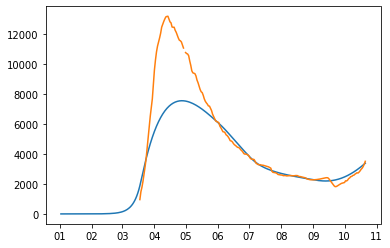

best_error: 1.35959103931384
vector: [array([1.35959104])]
mean_deaths 0.0004086061650851414
[7.59424940e+01 1.89475357e+00 7.94138953e-01 4.81243624e-02
 1.02405820e-02 2.14506127e-02 3.51031841e-01 1.64040528e-01
 9.88902341e-01 1.18167745e+00 1.13327020e+00 7.81515305e-01
 1.24248780e+00 7.73018235e-01 7.50852155e-01 1.24468781e+00
 7.65916811e-01]


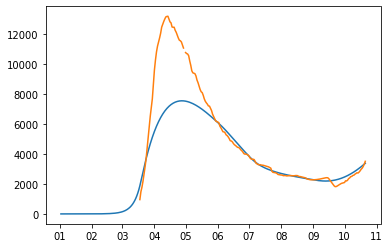

best_error: 1.3595905644252093
vector: [array([1.35959056])]
mean_deaths 0.0004086255952150716
[7.59424940e+01 1.89475357e+00 7.94138963e-01 4.81243624e-02
 1.02405820e-02 2.14506127e-02 3.51031841e-01 1.64040528e-01
 9.88902341e-01 1.18167745e+00 1.13327020e+00 7.81515305e-01
 1.24248780e+00 7.73018235e-01 7.50852155e-01 1.24468781e+00
 7.65916811e-01]


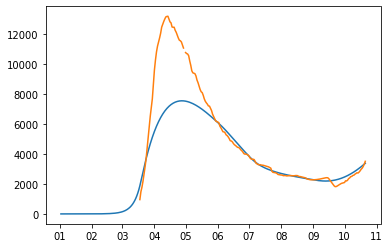

best_error: 1.3585735210070677
vector: [array([1.35857352])]
mean_deaths 0.00018666238085821645
[7.59424940e+01 1.89475383e+00 7.94156228e-01 4.81406896e-02
 1.02424188e-02 2.14506132e-02 3.51028673e-01 1.64039423e-01
 9.88901474e-01 1.18169507e+00 1.13325962e+00 7.81514746e-01
 1.24248293e+00 7.73023438e-01 7.50848962e-01 1.24468800e+00
 7.65916422e-01]


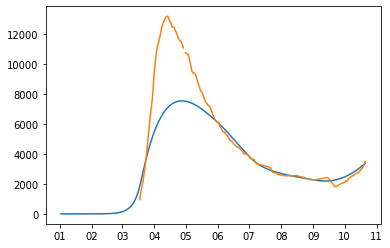

best_error: 1.3585733976311545
vector: [array([1.3585734])]
mean_deaths 0.00018665333107532777
[7.59424940e+01 1.89475384e+00 7.94156228e-01 4.81406896e-02
 1.02424188e-02 2.14506132e-02 3.51028673e-01 1.64039423e-01
 9.88901474e-01 1.18169507e+00 1.13325962e+00 7.81514746e-01
 1.24248293e+00 7.73023438e-01 7.50848962e-01 1.24468800e+00
 7.65916422e-01]


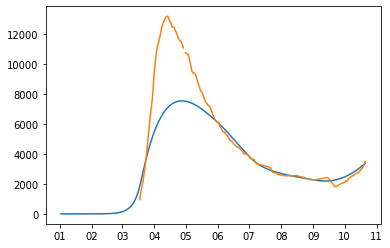

best_error: 1.3585733041141574
vector: [array([1.3585733])]
mean_deaths 0.00018662240171800034
[7.59424940e+01 1.89475383e+00 7.94156228e-01 4.81406996e-02
 1.02424188e-02 2.14506132e-02 3.51028673e-01 1.64039423e-01
 9.88901474e-01 1.18169507e+00 1.13325962e+00 7.81514746e-01
 1.24248293e+00 7.73023438e-01 7.50848962e-01 1.24468800e+00
 7.65916422e-01]


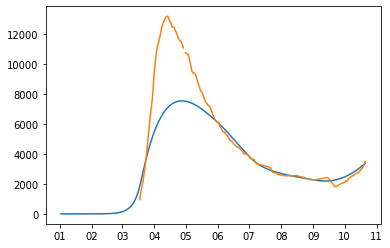

best_error: 1.3585731296091679
vector: [array([1.35857313])]
mean_deaths 0.00018657227967882104
[7.59424940e+01 1.89475383e+00 7.94156228e-01 4.81406896e-02
 1.02424188e-02 2.14506132e-02 3.51028673e-01 1.64039423e-01
 9.88901474e-01 1.18169508e+00 1.13325962e+00 7.81514746e-01
 1.24248293e+00 7.73023438e-01 7.50848962e-01 1.24468800e+00
 7.65916422e-01]


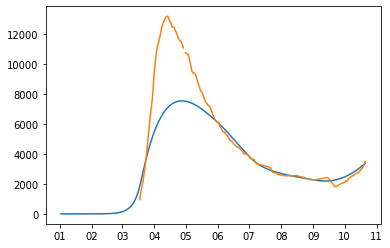

best_error: 1.3581213006128743
vector: [array([1.3581213])]
mean_deaths 4.7002794715176386e-05
[7.59424940e+01 1.89475584e+00 7.94161344e-01 4.81672775e-02
 1.02433349e-02 2.14506149e-02 3.51020571e-01 1.64036558e-01
 9.88892309e-01 1.18170681e+00 1.13325536e+00 7.81513855e-01
 1.24247132e+00 7.73034981e-01 7.50847036e-01 1.24468820e+00
 7.65915907e-01]


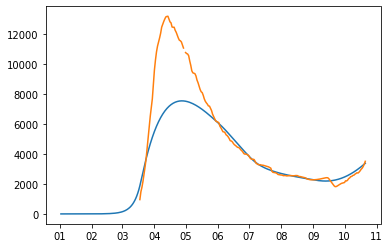

best_error: 1.3581212496125759
vector: [array([1.35812125])]
mean_deaths 4.7011843525445146e-05
[7.59424940e+01 1.89475585e+00 7.94161344e-01 4.81672775e-02
 1.02433349e-02 2.14506149e-02 3.51020571e-01 1.64036558e-01
 9.88892309e-01 1.18170681e+00 1.13325536e+00 7.81513855e-01
 1.24247132e+00 7.73034981e-01 7.50847036e-01 1.24468820e+00
 7.65915907e-01]


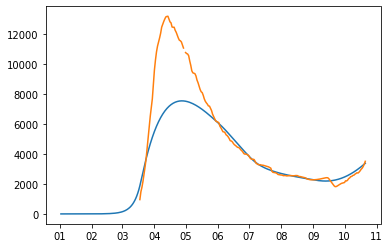

best_error: 1.3581209369545078
vector: [array([1.35812094])]
mean_deaths 4.698348764847763e-05
[7.59424940e+01 1.89475584e+00 7.94161344e-01 4.81672775e-02
 1.02433349e-02 2.14506149e-02 3.51020571e-01 1.64036558e-01
 9.88892309e-01 1.18170681e+00 1.13325537e+00 7.81513855e-01
 1.24247132e+00 7.73034981e-01 7.50847036e-01 1.24468820e+00
 7.65915907e-01]


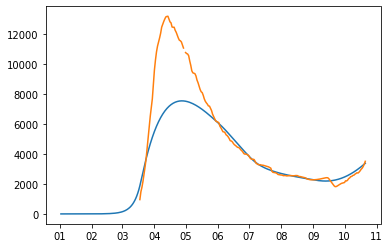

best_error: 1.3579132344378226
vector: [array([1.35791323])]
mean_deaths 3.691030377518009e-07
[7.59424940e+01 1.89475544e+00 7.94160307e-01 4.81618869e-02
 1.02431492e-02 2.14506145e-02 3.51022214e-01 1.64037139e-01
 9.88894167e-01 1.18170443e+00 1.13325622e+00 7.81514035e-01
 1.24247367e+00 7.73032641e-01 7.50847427e-01 1.24468816e+00
 7.65916011e-01]


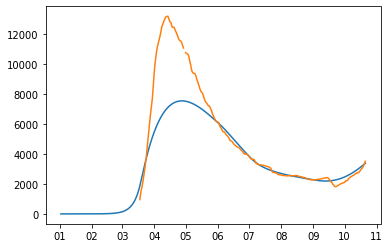

best_error: 1.3579131110500677
vector: [array([1.35791311])]
mean_deaths 3.6005403137824887e-07
[7.59424940e+01 1.89475545e+00 7.94160307e-01 4.81618869e-02
 1.02431492e-02 2.14506145e-02 3.51022214e-01 1.64037139e-01
 9.88894167e-01 1.18170443e+00 1.13325622e+00 7.81514035e-01
 1.24247367e+00 7.73032641e-01 7.50847427e-01 1.24468816e+00
 7.65916011e-01]


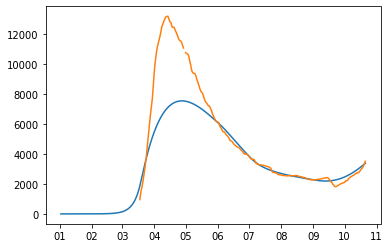

best_error: 1.3579130174903244
vector: [array([1.35791302])]
mean_deaths 3.2913006671888376e-07
[7.59424940e+01 1.89475544e+00 7.94160307e-01 4.81618969e-02
 1.02431492e-02 2.14506145e-02 3.51022214e-01 1.64037139e-01
 9.88894167e-01 1.18170443e+00 1.13325622e+00 7.81514035e-01
 1.24247367e+00 7.73032641e-01 7.50847427e-01 1.24468816e+00
 7.65916011e-01]


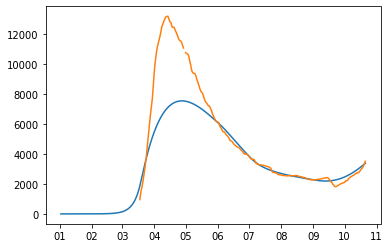

best_error: 1.3579128429009406
vector: [array([1.35791284])]
mean_deaths 2.790110297799816e-07
[7.59424940e+01 1.89475544e+00 7.94160307e-01 4.81618869e-02
 1.02431492e-02 2.14506145e-02 3.51022214e-01 1.64037139e-01
 9.88894167e-01 1.18170444e+00 1.13325622e+00 7.81514035e-01
 1.24247367e+00 7.73032641e-01 7.50847427e-01 1.24468816e+00
 7.65916011e-01]


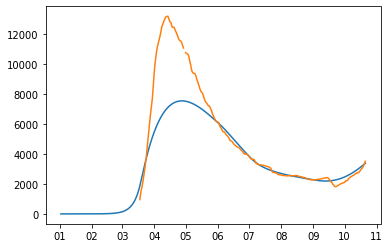

best_error: 1.3579122767342529
vector: [array([1.35791228])]
mean_deaths 7.873943427210391e-08
[7.59424940e+01 1.89475544e+00 7.94160316e-01 4.81619378e-02
 1.02431509e-02 2.14506145e-02 3.51022198e-01 1.64037133e-01
 9.88894150e-01 1.18170445e+00 1.13325622e+00 7.81514034e-01
 1.24247365e+00 7.73032663e-01 7.50847423e-01 1.24468816e+00
 7.65916011e-01]


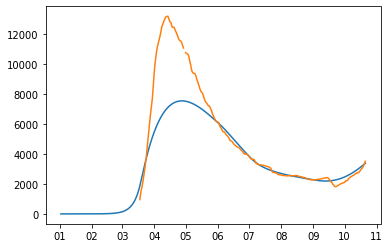

best_error: 1.3579122257384708
vector: [array([1.35791223])]
mean_deaths 8.778844107289952e-08
[7.59424940e+01 1.89475545e+00 7.94160316e-01 4.81619378e-02
 1.02431509e-02 2.14506145e-02 3.51022198e-01 1.64037133e-01
 9.88894150e-01 1.18170445e+00 1.13325622e+00 7.81514034e-01
 1.24247365e+00 7.73032663e-01 7.50847423e-01 1.24468816e+00
 7.65916011e-01]


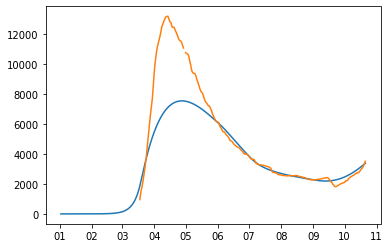

best_error: 1.3579119130597654
vector: [array([1.35791191])]
mean_deaths 5.943205760815413e-08
[7.59424940e+01 1.89475544e+00 7.94160316e-01 4.81619378e-02
 1.02431509e-02 2.14506145e-02 3.51022198e-01 1.64037133e-01
 9.88894150e-01 1.18170445e+00 1.13325623e+00 7.81514034e-01
 1.24247365e+00 7.73032663e-01 7.50847423e-01 1.24468816e+00
 7.65916011e-01]


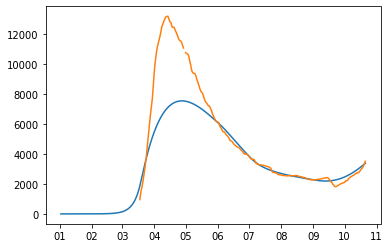

best_error: 1.3579118731578486
vector: [array([1.35791187])]
mean_deaths 8.645039908992618e-09
[7.59424940e+01 1.89475545e+00 7.94160315e-01 4.81619288e-02
 1.02431506e-02 2.14506145e-02 3.51022201e-01 1.64037134e-01
 9.88894153e-01 1.18170445e+00 1.13325622e+00 7.81514034e-01
 1.24247365e+00 7.73032659e-01 7.50847424e-01 1.24468816e+00
 7.65916011e-01]


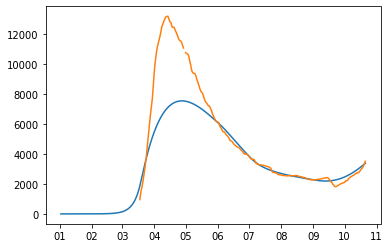

best_error: 1.3579117181697977
vector: [array([1.35791172])]
mean_deaths 1.9711341633156807e-08
[7.59424940e+01 1.89475544e+00 7.94160315e-01 4.81619288e-02
 1.02431506e-02 2.14506145e-02 3.51022201e-01 1.64037134e-01
 9.88894153e-01 1.18170445e+00 1.13325623e+00 7.81514034e-01
 1.24247365e+00 7.73032659e-01 7.50847424e-01 1.24468816e+00
 7.65916011e-01]


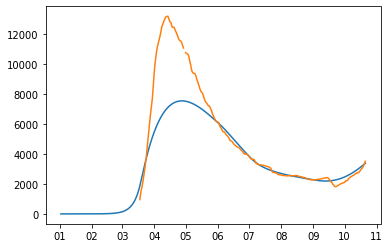

best_error: 1.3576959138195042
vector: [array([1.35769591])]
mean_deaths 9.073078828476615e-06
[7.59424940e+01 1.89475587e+00 7.94157891e-01 4.81648476e-02
 1.02429820e-02 2.14506148e-02 3.51020930e-01 1.64036681e-01
 9.88892141e-01 1.18170353e+00 1.13325743e+00 7.81513938e-01
 1.24247190e+00 7.73034325e-01 7.50847636e-01 1.24468817e+00
 7.65915970e-01]


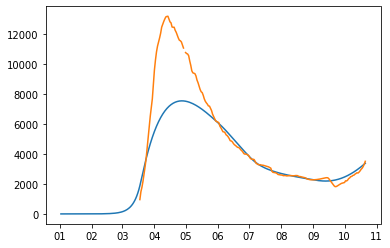

best_error: 1.3576958628271176
vector: [array([1.35769586])]
mean_deaths 9.08212769556877e-06
[7.59424940e+01 1.89475588e+00 7.94157891e-01 4.81648476e-02
 1.02429820e-02 2.14506148e-02 3.51020930e-01 1.64036681e-01
 9.88892141e-01 1.18170353e+00 1.13325743e+00 7.81513938e-01
 1.24247190e+00 7.73034325e-01 7.50847636e-01 1.24468817e+00
 7.65915970e-01]


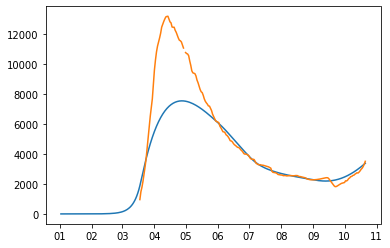

best_error: 1.3576955501555146
vector: [array([1.35769555])]
mean_deaths 9.05377133923399e-06
[7.59424940e+01 1.89475587e+00 7.94157891e-01 4.81648476e-02
 1.02429820e-02 2.14506148e-02 3.51020930e-01 1.64036681e-01
 9.88892141e-01 1.18170353e+00 1.13325744e+00 7.81513938e-01
 1.24247190e+00 7.73034325e-01 7.50847636e-01 1.24468817e+00
 7.65915970e-01]


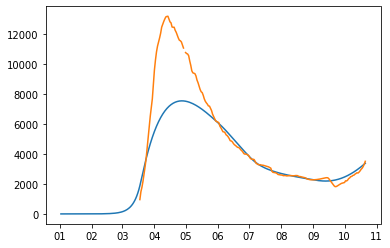

best_error: 1.3576729158822263
vector: [array([1.35767292])]
mean_deaths 9.887282030041157e-06
[7.59424940e+01 1.89475590e+00 7.94157353e-01 4.81651676e-02
 1.02429491e-02 2.14506149e-02 3.51020761e-01 1.64036620e-01
 9.88891822e-01 1.18170343e+00 1.13325788e+00 7.81513934e-01
 1.24247170e+00 7.73034500e-01 7.50847750e-01 1.24468817e+00
 7.65915971e-01]


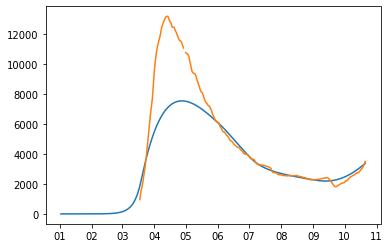

best_error: 1.3576722854352006
vector: [array([1.35767229])]
mean_deaths 9.867852657186541e-06
[7.59424940e+01 1.89475590e+00 7.94157363e-01 4.81651676e-02
 1.02429491e-02 2.14506149e-02 3.51020761e-01 1.64036620e-01
 9.88891822e-01 1.18170343e+00 1.13325788e+00 7.81513934e-01
 1.24247170e+00 7.73034500e-01 7.50847750e-01 1.24468817e+00
 7.65915971e-01]


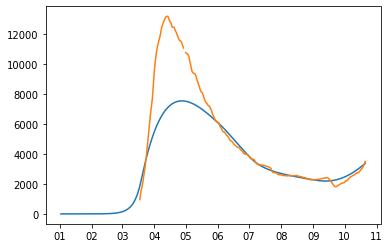

best_error: 1.3576575983838826
vector: [array([1.3576576])]
mean_deaths 7.4125954166566185e-06
[7.59424940e+01 1.89475578e+00 7.94157593e-01 4.81645044e-02
 1.02429699e-02 2.14506148e-02 3.51021016e-01 1.64036709e-01
 9.88892169e-01 1.18170361e+00 1.13325796e+00 7.81513962e-01
 1.24247210e+00 7.73034114e-01 7.50847799e-01 1.24468816e+00
 7.65915988e-01]


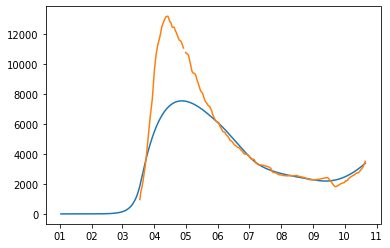

best_error: 1.357657547392201
vector: [array([1.35765755])]
mean_deaths 7.421644273708551e-06
[7.59424940e+01 1.89475579e+00 7.94157593e-01 4.81645044e-02
 1.02429699e-02 2.14506148e-02 3.51021016e-01 1.64036709e-01
 9.88892169e-01 1.18170361e+00 1.13325796e+00 7.81513962e-01
 1.24247210e+00 7.73034114e-01 7.50847799e-01 1.24468816e+00
 7.65915988e-01]


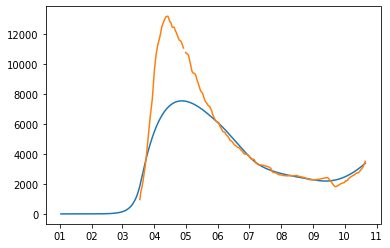

best_error: 1.3576572347204479
vector: [array([1.35765723])]
mean_deaths 7.393287884903261e-06
[7.59424940e+01 1.89475578e+00 7.94157593e-01 4.81645044e-02
 1.02429699e-02 2.14506148e-02 3.51021016e-01 1.64036709e-01
 9.88892169e-01 1.18170361e+00 1.13325797e+00 7.81513962e-01
 1.24247210e+00 7.73034114e-01 7.50847799e-01 1.24468816e+00
 7.65915988e-01]


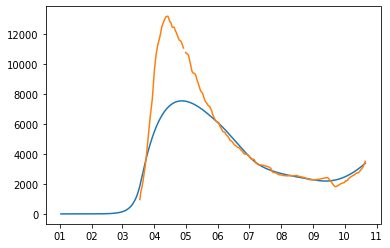

best_error: 1.3576388226331664
vector: [array([1.35763882])]
mean_deaths 5.175747195889964e-06
[7.59424940e+01 1.89475567e+00 7.94157501e-01 4.81639657e-02
 1.02429713e-02 2.14506148e-02 3.51021191e-01 1.64036770e-01
 9.88892347e-01 1.18170375e+00 1.13325834e+00 7.81513990e-01
 1.24247241e+00 7.73033795e-01 7.50847933e-01 1.24468815e+00
 7.65916007e-01]


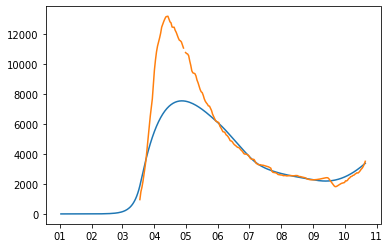

best_error: 1.3576387716417373
vector: [array([1.35763877])]
mean_deaths 5.184796059350549e-06
[7.59424940e+01 1.89475568e+00 7.94157501e-01 4.81639657e-02
 1.02429713e-02 2.14506148e-02 3.51021191e-01 1.64036770e-01
 9.88892347e-01 1.18170375e+00 1.13325834e+00 7.81513990e-01
 1.24247241e+00 7.73033795e-01 7.50847933e-01 1.24468815e+00
 7.65916007e-01]


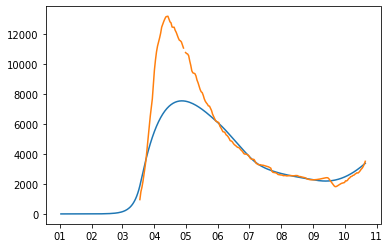

best_error: 1.357638464870003
vector: [array([1.35763846])]
mean_deaths 5.156439638501993e-06
[7.59424940e+01 1.89475567e+00 7.94157501e-01 4.81639657e-02
 1.02429713e-02 2.14506148e-02 3.51021191e-01 1.64036770e-01
 9.88892347e-01 1.18170375e+00 1.13325835e+00 7.81513990e-01
 1.24247241e+00 7.73033795e-01 7.50847933e-01 1.24468815e+00
 7.65916007e-01]


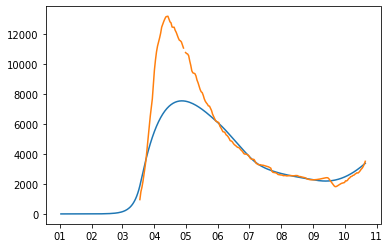

best_error: 1.357630647521926
vector: [array([1.35763065])]
mean_deaths 9.761404998672808e-07
[7.59424940e+01 1.89475547e+00 7.94157337e-01 4.81629827e-02
 1.02429740e-02 2.14506147e-02 3.51021512e-01 1.64036880e-01
 9.88892676e-01 1.18170400e+00 1.13325908e+00 7.81514042e-01
 1.24247299e+00 7.73033208e-01 7.50848175e-01 1.24468814e+00
 7.65916043e-01]


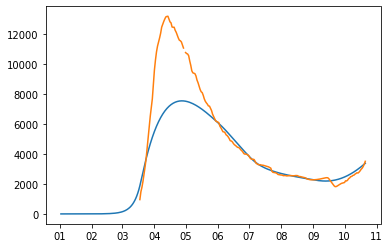

best_error: 1.3576300170745759
vector: [array([1.35763002])]
mean_deaths 9.56711066130459e-07
[7.59424940e+01 1.89475547e+00 7.94157347e-01 4.81629827e-02
 1.02429740e-02 2.14506147e-02 3.51021512e-01 1.64036880e-01
 9.88892676e-01 1.18170400e+00 1.13325908e+00 7.81514042e-01
 1.24247299e+00 7.73033208e-01 7.50848175e-01 1.24468814e+00
 7.65916043e-01]


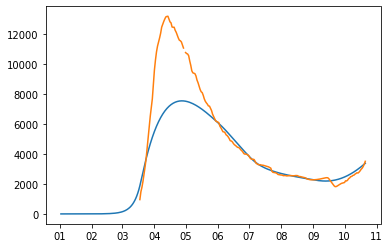

best_error: 1.3576223229052324
vector: [array([1.35762232])]
mean_deaths 1.1436060442761762e-07
[7.59424940e+01 1.89475542e+00 7.94157565e-01 4.81626931e-02
 1.02429899e-02 2.14506147e-02 3.51021637e-01 1.64036924e-01
 9.88892875e-01 1.18170409e+00 1.13325903e+00 7.81514052e-01
 1.24247318e+00 7.73033037e-01 7.50848158e-01 1.24468813e+00
 7.65916048e-01]


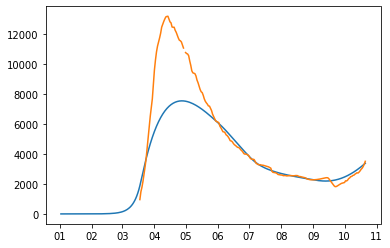

best_error: 1.3576221995231
vector: [array([1.3576222])]
mean_deaths 1.0531172110020723e-07
[7.59424940e+01 1.89475543e+00 7.94157565e-01 4.81626931e-02
 1.02429899e-02 2.14506147e-02 3.51021637e-01 1.64036924e-01
 9.88892875e-01 1.18170409e+00 1.13325903e+00 7.81514052e-01
 1.24247318e+00 7.73033037e-01 7.50848158e-01 1.24468813e+00
 7.65916048e-01]


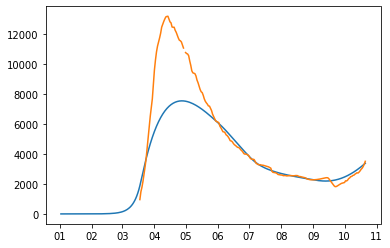

best_error: 1.3576221059640559
vector: [array([1.35762211])]
mean_deaths 7.438781390509924e-08
[7.59424940e+01 1.89475542e+00 7.94157565e-01 4.81627031e-02
 1.02429899e-02 2.14506147e-02 3.51021637e-01 1.64036924e-01
 9.88892875e-01 1.18170409e+00 1.13325903e+00 7.81514052e-01
 1.24247318e+00 7.73033037e-01 7.50848158e-01 1.24468813e+00
 7.65916048e-01]


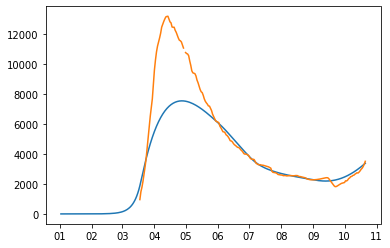

best_error: 1.3576219313813584
vector: [array([1.35762193])]
mean_deaths 2.4268804523405902e-08
[7.59424940e+01 1.89475542e+00 7.94157565e-01 4.81626931e-02
 1.02429899e-02 2.14506147e-02 3.51021637e-01 1.64036924e-01
 9.88892875e-01 1.18170410e+00 1.13325903e+00 7.81514052e-01
 1.24247318e+00 7.73033037e-01 7.50848158e-01 1.24468813e+00
 7.65916048e-01]


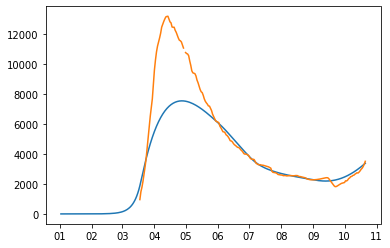

best_error: 1.3576207125868072
vector: [array([1.35762071])]
mean_deaths 4.840789916615466e-07
[7.59424940e+01 1.89475545e+00 7.94157440e-01 4.81628520e-02
 1.02429812e-02 2.14506147e-02 3.51021569e-01 1.64036900e-01
 9.88892766e-01 1.18170404e+00 1.13325906e+00 7.81514047e-01
 1.24247308e+00 7.73033131e-01 7.50848167e-01 1.24468814e+00
 7.65916045e-01]


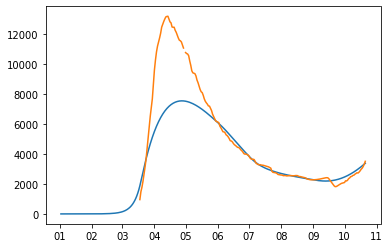

best_error: 1.3576200821381776
vector: [array([1.35762008])]
mean_deaths 4.646495263087025e-07
[7.59424940e+01 1.89475545e+00 7.94157450e-01 4.81628520e-02
 1.02429812e-02 2.14506147e-02 3.51021569e-01 1.64036900e-01
 9.88892766e-01 1.18170404e+00 1.13325906e+00 7.81514047e-01
 1.24247308e+00 7.73033131e-01 7.50848167e-01 1.24468814e+00
 7.65916045e-01]


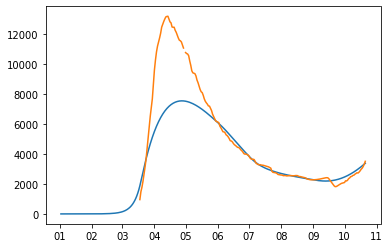

best_error: 1.3576159711378986
vector: [array([1.35761597])]
mean_deaths 2.1404762449113765e-07
[7.59424940e+01 1.89475544e+00 7.94157496e-01 4.81627803e-02
 1.02429851e-02 2.14506147e-02 3.51021600e-01 1.64036911e-01
 9.88892815e-01 1.18170406e+00 1.13325905e+00 7.81514049e-01
 1.24247312e+00 7.73033089e-01 7.50848163e-01 1.24468814e+00
 7.65916046e-01]


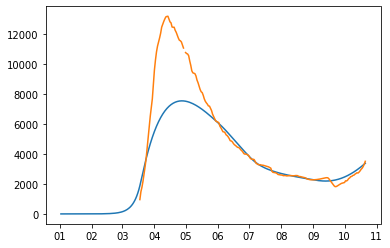

best_error: 1.3576159201469389
vector: [array([1.35761592])]
mean_deaths 2.23096503118869e-07
[7.59424940e+01 1.89475545e+00 7.94157496e-01 4.81627803e-02
 1.02429851e-02 2.14506147e-02 3.51021600e-01 1.64036911e-01
 9.88892815e-01 1.18170406e+00 1.13325905e+00 7.81514049e-01
 1.24247312e+00 7.73033089e-01 7.50848163e-01 1.24468814e+00
 7.65916046e-01]


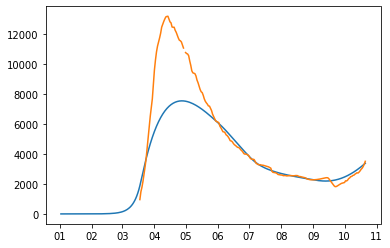

best_error: 1.3576156074727066
vector: [array([1.35761561])]
mean_deaths 1.947400237379472e-07
[7.59424940e+01 1.89475544e+00 7.94157496e-01 4.81627803e-02
 1.02429851e-02 2.14506147e-02 3.51021600e-01 1.64036911e-01
 9.88892815e-01 1.18170406e+00 1.13325906e+00 7.81514049e-01
 1.24247312e+00 7.73033089e-01 7.50848163e-01 1.24468814e+00
 7.65916046e-01]


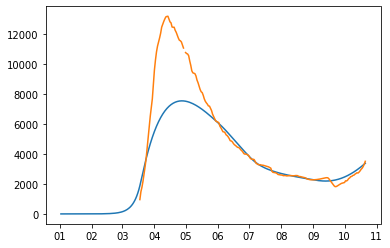

best_error: 1.357614627432925
vector: [array([1.35761463])]
mean_deaths 1.1209705593644111e-08
[7.59424940e+01 1.89475543e+00 7.94157491e-01 4.81627250e-02
 1.02429855e-02 2.14506147e-02 3.51021618e-01 1.64036917e-01
 9.88892835e-01 1.18170408e+00 1.13325908e+00 7.81514052e-01
 1.24247315e+00 7.73033056e-01 7.50848175e-01 1.24468813e+00
 7.65916048e-01]


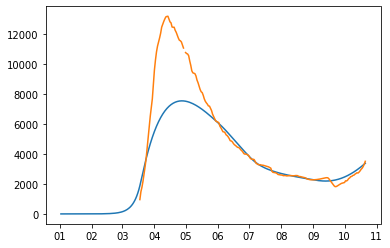

best_error: 1.3576146250632155
vector: [array([1.35761463])]
mean_deaths 1.1980022932730913e-08
[7.59424940e+01 1.89475543e+00 7.94157491e-01 4.81627250e-02
 1.02429855e-02 2.14506147e-02 3.51021628e-01 1.64036917e-01
 9.88892835e-01 1.18170408e+00 1.13325908e+00 7.81514052e-01
 1.24247315e+00 7.73033056e-01 7.50848175e-01 1.24468813e+00
 7.65916048e-01]


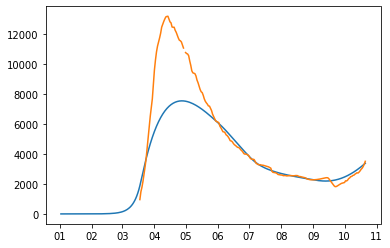

In [32]:
from scipy.optimize import minimize, Bounds, shgo, differential_evolution, dual_annealing
epsilon = 0.1
result = differential_evolution(error, [(50,140)]+[windows['alpha_mixing']]*1+[windows['transmission']]+[[0,1]]*2+[windows['school_l'],[0,1],[0,0.2],[0.5,1]]+[[0.75,1.25]]*8,workers = -1)

#windows["mu"],windows["sigma"],windows["p_ICU"],windows["p_H"],windows["lambda_H_R"],windows["lambda_H_D"],windows["lambda_ICU_R"],windows["lambda_ICU_D"]


In [ ]:
error([7.83199596e+01, 1.50524287e+00, 8.40278623e-01, 3.27606257e-01,
 1.69649676e-02, 6.93157632e-02, 2.25414737e-01, 6.74164208e-02,
 9.92296980e-01])


In [31]:
import copy
import math
import matplotlib.dates as mdates
best_v = 0
best_error = float('inf')
validation_date = datetime.strptime("2020-10-21", '%Y-%m-%d')
days_ahead_opt = 7.83199596e+01
alpha_opt = 1.50524287e+00

def error_grad(v):
    
    vector_upper_model_data = []
    vector_errors = []
    
    for n_sample in range(n_samples):
        days_ahead = days_ahead_opt
        alpha_mixing_home = alpha_opt
        alpha_mixing_work = alpha_opt
        alpha_mixing_transport = alpha_opt
        alpha_mixing_school = alpha_opt
        alpha_mixing_other = alpha_opt
        alpha_mixing_leisure = alpha_opt
        
        mix_1 = v[1]
        mix_2 = v[2]
        
        alphas_d = {
            'work':alpha_mixing_work,
            'transport':alpha_mixing_transport,
            'school':alpha_mixing_school,
            'other':alpha_mixing_other,
            'leisure':alpha_mixing_leisure,
            'home':alpha_mixing_home,
        }

        gamma_mixing_before = 1.0
        gamma_mixing_after = 1.0


        upper_bound_home = 1.0
        upper_bound_leisure = 1.0
        upper_bound_other = 1.0
        upper_bound_school = 1.0
        upper_bound_work = 1.0
        upper_bound_transport = 1.0

        school_lockdown = v[3]
        school_may = v[4]
        school_jun_jul_aug = v[5]
        school_sep_oct = v[6]

        beta_normal = original_beta
        beta_vacation = beta_normal*v[0]

        days_change_model = 0


        google['other'] = mix_1*(google["retail_and_recreation_percent_change_from_baseline"]+100)/100+(1-mix_1)*(google["grocery_and_pharmacy_percent_change_from_baseline"]+100)/100
        google['leisure'] = mix_2*(google["parks_percent_change_from_baseline"]+100)/100+(1-mix_2)*(google["retail_and_recreation_percent_change_from_baseline"]+100)/100


        # Number of days
        days_before_date_1 = int(days_ahead)
        days_between_dates_1_2 = (date_2-date_1).days
        days_between_dates_2_3 = (date_3-date_2).days
        days_between_dates_3_4 = (date_4-date_3).days
        days_between_dates_4_5 = (date_5-date_4).days
        days_after_date_5 = (final_date-date_5).days
        total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_after_date_5
        days_denom = days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5


        # Some additional calculations
        validation_days = days_before_date_1 + (validation_date-date_1).days
        vacation_start_days = days_before_date_1 + (vacation_start-date_1).days
        vacation_end_days = days_before_date_1 + (vacation_end-date_1).days


        # Construct initialization
        initialization = copy.deepcopy(original_initialization)
        for i,group in enumerate(age_groups):
            if group == "age_group_40_49":
                initialization[group]["I"] = initialization[group]["I"] + 1
                initialization[group]["S"] = initialization[group]["S"] - 1
            initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


        # Alphas
        a_before_google = {
            'home':upper_bound_home,
            'leisure':upper_bound_leisure,
            'other':upper_bound_other,
            'school':upper_bound_school,
            'transport':upper_bound_transport,
            'work':upper_bound_work
        }



        # Determine mixing method
        #     mixing_method_before = {
        #         "name":"mult",
        #         "param_alpha":alpha_mixing_before,
        #         "param_beta":alpha_mixing_before,
        #     }

        #     # Determine mixing method
        #     mixing_method_after = {
        #         "name":"mult",
        #         "param_alpha":alpha_mixing_after,
        #         "param_beta":alpha_mixing_after,
        #     }
        #dynModel.mixing_method = mixing_method_after




        # Calculate alphas
        alphas_vec = []
        for t in range(days_before_date_1-days_between_google):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = a_before_google
            alphas_vec.append(alphas)

        counter = 0
        for t in range(days_between_google):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = {
                    'home':1.0,
                    'leisure':google['leisure'][counter]*samples[n_sample,counter,0],
                    'other':google['other'][counter]*samples[n_sample,counter,1],
                    'school':1.0,
                    'transport':google['transport'][counter]*samples[n_sample,counter,3],
                    'work':google['work'][counter]*samples[n_sample,counter,4],
                }
            alphas_vec.append(alphas)   
            counter += 1
        for t in range(days_between_dates_1_2):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = {
                    'home':1.0,
                    'leisure':google['leisure'][counter]*samples[n_sample,counter,0],
                    'other':google['other'][counter]*samples[n_sample,counter,1],
                    'school':school_lockdown*samples[n_sample,counter,2],
                    'transport':google['transport'][counter]*samples[n_sample,counter,3],
                    'work':google['work'][counter]*samples[n_sample,counter,4],
                }
            alphas_vec.append(alphas)   
            counter += 1
        for t in range(days_between_dates_2_3):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = {
                    'home':1.0,
                    'leisure':google['leisure'][counter]*samples[n_sample,counter,0],
                    'other':google['other'][counter]*samples[n_sample,counter,1],
                    'school':school_may*samples[n_sample,counter,2],
                    'transport':google['transport'][counter]*samples[n_sample,counter,3],
                    'work':google['work'][counter]*samples[n_sample,counter,4],
                }
            alphas_vec.append(alphas)   
            counter += 1
        for t in range(days_between_dates_3_4):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = {
                    'home':1.0,
                    'leisure':google['leisure'][counter]*samples[n_sample,counter,0],
                    'other':google['other'][counter]*samples[n_sample,counter,1],
                    'school':school_may*samples[n_sample,counter,2],
                    'transport':google['transport'][counter]*samples[n_sample,counter,3],
                    'work':google['work'][counter]*samples[n_sample,counter,4],
                }
            alphas_vec.append(alphas)   
            counter += 1
        for t in range(days_between_dates_4_5):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = {
                    'home':1.0,
                    'leisure':google['leisure'][counter]*samples[n_sample,counter,0],
                    'other':google['other'][counter]*samples[n_sample,counter,1],
                    'school':school_jun_jul_aug*samples[n_sample,counter,2],
                    'transport':google['transport'][counter]*samples[n_sample,counter,3],
                    'work':google['work'][counter]*samples[n_sample,counter,4],
                }
            alphas_vec.append(alphas)   
            counter += 1
        for t in range(days_after_date_5):
            alphas = {}
            for age_group in age_groups:
                alphas[age_group] = {
                    'home':1.0,
                    'leisure':google['leisure'][counter]*samples[n_sample,counter,0],
                    'other':google['other'][counter]*samples[n_sample,counter,1],
                    'school':school_sep_oct*samples[n_sample,counter,2],
                    'transport':google['transport'][counter]*samples[n_sample,counter,3],
                    'work':google['work'][counter]*samples[n_sample,counter,4],
                }
            alphas_vec.append(alphas)
            counter += 1




        #     mixing_vec = []
        #     for t in range(int(vacation_start_days+days_change_model)):
        #         mixing_vec.append(mixing_method_before)
        #     for t in range(int(vacation_start_days+days_change_model),total_days):
        #         mixing_vec.append(mixing_method_after)




        # Calculate tests
        tests = np.zeros(len(age_groups))


        # Run model
        model_data_beds = {ag:[] for ag in age_groups+["total"]}
        model_data_icus = {ag:[] for ag in age_groups+["total"]}
        model_data_deaths = {ag:[] for ag in age_groups+["total"]}

        state = state_to_matrix(initialization)
        t_beds = 0
        t_icus = 0
        t_deaths = 0
        for i,ag in enumerate(age_groups):
            state_H = state[i,cont.index("H")]
            state_ICU = state[i,cont.index("ICU")]
            state_D = state[i,cont.index("D")]
            model_data_beds[ag].append(state_H)
            model_data_icus[ag].append(state_ICU)
            model_data_deaths[ag].append(state_D)
            t_beds+= state_H
            t_icus+= state_ICU
            t_deaths+= state_D
        model_data_beds["total"].append(t_beds)
        model_data_icus["total"].append(t_icus)
        model_data_deaths["total"].append(t_deaths)

        recalc_days = [0,
                     days_before_date_1,
                     days_before_date_1+days_between_dates_1_2,
                     days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
                     days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
                     days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
                    int(vacation_start_days)
                    ]

        dynModel.beta = np.zeros((len(age_groups),len(dynModel.groups[age_groups[0]].parameters["beta"])))
        for i in range(len(age_groups)):
            for j in range(len(dynModel.groups[age_groups[0]].parameters["beta"])):
                if j < int(vacation_start_days+days_change_model):
                    dynModel.beta[i,j] = beta_normal
                else:
                    dynModel.beta[i,j] = beta_vacation

        for t in range(total_days):
            current_date = date_1+timedelta(days=t-days_before_date_1)
            day_of_week = current_date.weekday()

            if t in recalc_days:
                update_contacts = True
            else:
                update_contacts = False

            if day_of_week <= 4:
                season = "old"
                dynModel.mixing_method = {
                    "name":"mult",
                    "param_alpha":{
                        'work':alpha_mixing_work,
                        'transport':alpha_mixing_transport,
                        'school':alpha_mixing_school,
                        'other':alpha_mixing_other,
                        'leisure':alpha_mixing_leisure,
                        'home':alpha_mixing_home,
                    },
                    "param_beta":{
                        'work':alpha_mixing_work,
                        'transport':alpha_mixing_transport,
                        'school':alpha_mixing_school,
                        'other':alpha_mixing_other,
                        'leisure':alpha_mixing_leisure,
                        'home':alpha_mixing_home,
                    },
                }
            else:
                season = "old"
                dynModel.mixing_method = {
                    "name":"mult",
                    "param_alpha":{
                        'work':alpha_mixing_work,
                        'transport':alpha_mixing_transport,
                        'school':alpha_mixing_school,
                        'other':alpha_mixing_other,
                        'leisure':alpha_mixing_leisure,
                        'home':alpha_mixing_home,
                    },
                    "param_beta":{
                        'work':alpha_mixing_work,
                        'transport':alpha_mixing_transport,
                        'school':alpha_mixing_school,
                        'other':alpha_mixing_other,
                        'leisure':alpha_mixing_leisure,
                        'home':alpha_mixing_home,
                    },
                }

            #dynModel.mixing_method = mixing_vec[t]

            state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), t, season, update_contacts=update_contacts)
            t_beds = 0
            t_icus = 0
            t_deaths = 0
            for i,ag in enumerate(age_groups):
                state_H = state[i,cont.index("H")]
                state_ICU = state[i,cont.index("ICU")]
                state_D = state[i,cont.index("D")]
                model_data_beds[ag].append(state_H)
                model_data_icus[ag].append(state_ICU)
                model_data_deaths[ag].append(state_D)
                t_beds+= state_H
                t_icus+= state_ICU
                t_deaths+= state_D
            #print(t_beds)
            model_data_beds["total"].append(t_beds)
            model_data_icus["total"].append(t_icus)
            model_data_deaths["total"].append(t_deaths)


        initial_date = date_1-timedelta(days=days_before_date_1)

        # Calculate the days of the model
        days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

        # Indices where to put the real data
        indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

        # Real data
        real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
        real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
        real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

        for k,ind in enumerate(indices):
            for ag in age_groups+["total"]:
                real_data_beds[ag][ind] = beds_real[ag][k]
                real_data_icus[ag][ind] = icus_real[ag][k]
                real_data_deaths[ag][ind] = deaths_real[ag][k]


        error_constant = 1.0
        error_beds = 0
        error_icus = 0
        error_deaths = 0
        error_beds_total = 0
        for ag in old_age_groups:
            error_beds += np.nanmean((np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag]))/np.array(real_data_beds[ag]))[0:validation_days-1])
            #error_beds += error_constant*np.nanmean((np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag]))/np.array(real_data_beds[ag]))[validation_days-1:validation_days])
            #error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
            #error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
        error_beds_total += np.nanmean((np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"]))/np.array(real_data_beds["total"]))[0:validation_days-1])
        error_beds_total += error_constant*np.nanmean((np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"]))/np.array(real_data_beds["total"]))[validation_days-1:validation_days])
        #error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
        #error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))




        #diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
        #error_beds_above = np.nanmean([max(d,0) for d in diff])
        #error_beds_below = -np.nanmean([min(d,0) for d in diff])

        #cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
        #cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
        #diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
        #error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
        #error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



        #     error = error_beds_total
        #     error = mult_icus*error_icus_total
        #     error = mult_deaths*error_deaths_total
        upper_model_data = model_data_beds["total"]
        upper_days_model = days_model
        upper_real_data = real_data_beds["total"]
        error = error_beds+5*error_beds_total

        vector_errors.append(error)
        vector_upper_model_data.append(upper_model_data)
        

    error = np.mean(vector_errors)

    
    global best_error
    global best_v
    if error<best_error:
        best_error = error
        print("best_error:",best_error)
        print("vector:",vector_errors)
        best_v = v
        print(v)

        plt.figure(1)
        for n_sample in range(n_samples):
            plt.plot(upper_days_model, vector_upper_model_data[n_sample], label="Prediction")
        plt.plot(upper_days_model, upper_real_data, label="Real")
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%m"))
        plt.gca().xaxis.set_minor_formatter(mdates.DateFormatter("%m"))
        plt.show()
        

    return error



In [34]:
grad_0 = [0.5, 0.5, 0.5, 0.05, 0.5, 0.1, 0.75]

lb= [0,0,0,0,0,0,0.5]
ub = [1,1,1,0.1,1,0.2,1.0]
for i in range(len(grad_0)):
    assert(grad_0[i]>=lb[i])
    assert(ub[i]>=grad_0[i])
    
